# Group A

## Authors: Patrícia Morais, Marta Dinis, Samuel Santos
## Data Mining course, 2022/23, NOVA IMS, MDSAA


## Index<a class="anchor" id="index" />

1 - [<font color='#E8800A'>Imports</font>](#topic01) <br>
2 - [Functions to handle data](#topic02) <br>
3 - [Understanding our data](#topic03) <br>
>    3.1 [Descriptive statistics](#topic03.01) <br>
    3.2 [Feature engineering](#topic03.02) <br>
    3.3 [Descriptive statistics (after feature engineering)](#topic03.03) <br>
   
4 - [Data Preparation](#topic04) <br>
5 - [Reassessing our data](#topic05) <br>
6 - [Clustering](#topic06) <br>
> 6.1 [Hieraquical Clustering + KPrototype without segmentation](#topic06.01) <br>
    6.2 [DBSCAN without segmentation](#topic06.02) <br>
    6.3 [SOM - Self-Organizing Maps](#topic06.03) <br>
    6.4 [Hieraquical Clustering + KPrototype with segmentation](#topic06.04) <br>
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;[Sociodemographics](#topic06.04.01) and [Customer Value](#topic06.04.02)<br>
    6.5 [DBSCAN with segmentation](#topic06.05) <br>
        &nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;[Sociodemographics](#topic06.05.01) and [Customer Value](#topic06.05.02)<br>
    6.6 [SOM - Self-Organizing Maps](#topic06.06) <br>

7 - [Merging Cluster Solutions](#topic07) <br>
8 - [Cluster Visualization](#topic08) <br>
> 8.1 [Cluster profiles](#topic08.01)<br>
8.2 [PCA](#topic08.02)<br>
8.3 [T-SNE](#topic08.03)<br>
8.4 [UMAP](#topic08.04)

9- [Quantitative model performance](#topic09) <br>


<a class="anchor" id="topic01" /><br>
# Step 1: Import of all needed libraries
[Back to Index](#index)

In [1]:
# needed for kmedoids
#!pip install sklearn_extra
#from sklearn_extra.cluster import KMedoids
# !pip install --upgrade kneed
# !pip install yellowbrick
# !pip install kmodes
#!pip install umap
# pip install pyreadstfeatat
# python.exe -m pip install --upgrade pip


In [2]:
import pyreadstat
import pandas as pd
import seaborn as sns
import numpy as np

import matplotlib.pyplot as plt
import matplotlib.cm as cm
from matplotlib import cm, colorbar
from matplotlib import gridspec
from matplotlib import colors
from matplotlib import colors as mpl_colors
from matplotlib.colors import ListedColormap
from matplotlib.patches import RegularPolygon, Ellipse
from matplotlib.lines import Line2D
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib import __version__ as mplver


import os
#from os.path import join
from datetime import datetime
from  math import ceil
from sklearn import preprocessing
from sklearn.preprocessing import OrdinalEncoder, OneHotEncoder, normalize, MinMaxScaler, StandardScaler, RobustScaler
from sklearn.decomposition import PCA
from sklearn.compose import make_column_transformer

from sklearn.impute import KNNImputer

from pandas_profiling import ProfileReport

from sklearn.cluster import KMeans, DBSCAN, AgglomerativeClustering, MeanShift, estimate_bandwidth

from kneed import KneeLocator
from yellowbrick.cluster import KElbowVisualizer
from scipy.cluster.hierarchy import dendrogram

from sklearn.metrics import silhouette_score, silhouette_samples, pairwise_distances

from kmodes.kprototypes import KPrototypes

from sklearn.neighbors import NearestNeighbors, KNeighborsClassifier
from sklearn.mixture import GaussianMixture

from sklearn.manifold import TSNE

from sklearn.tree import DecisionTreeClassifier, export_graphviz
from sklearn.model_selection import train_test_split
import graphviz


#Self-organizing maps
import sompy
from sompy.visualization.mapview import View2D
from sompy.visualization.bmuhits import BmuHitsView
from sompy.visualization.hitmap import HitMapView
import umap.umap_ as umap

plt.rcParams['figure.dpi'] = 50

import warnings
warnings.filterwarnings('ignore')

sns.set()


bytecode dump:
>          0	NOP(arg=None, lineno=53)
           2	LOAD_FAST(arg=0, lineno=53)
           4	LOAD_CONST(arg=1, lineno=53)
           6	BINARY_SUBSCR(arg=None, lineno=53)
           8	LOAD_CONST(arg=2, lineno=53)
          10	BINARY_AND(arg=None, lineno=53)
          12	LOAD_CONST(arg=3, lineno=53)
          14	BINARY_LSHIFT(arg=None, lineno=53)
          16	LOAD_CONST(arg=4, lineno=53)
          18	BINARY_AND(arg=None, lineno=53)
          20	LOAD_FAST(arg=0, lineno=54)
          22	LOAD_CONST(arg=1, lineno=54)
          24	BINARY_SUBSCR(arg=None, lineno=54)
          26	LOAD_CONST(arg=5, lineno=54)
          28	BINARY_LSHIFT(arg=None, lineno=54)
          30	LOAD_CONST(arg=4, lineno=54)
          32	BINARY_AND(arg=None, lineno=54)
          34	LOAD_FAST(arg=0, lineno=54)
          36	LOAD_CONST(arg=1, lineno=54)
          38	BINARY_SUBSCR(arg=None, lineno=54)
          40	BINARY_XOR(arg=None, lineno=54)
          42	LOAD_CONST(arg=6, lineno=54)
          44	BINARY_RSHIFT

dispatch pc=88, inst=LOAD_CONST(arg=7, lineno=57)
stack ['$70binary_and.33', '$84binary_and.40', '$state86.41']
dispatch pc=90, inst=BINARY_SUBSCR(arg=None, lineno=57)
stack ['$70binary_and.33', '$84binary_and.40', '$state86.41', '$const88.42']
dispatch pc=92, inst=BINARY_XOR(arg=None, lineno=57)
stack ['$70binary_and.33', '$84binary_and.40', '$90binary_subscr.43']
dispatch pc=94, inst=LOAD_CONST(arg=11, lineno=57)
stack ['$70binary_and.33', '$92binary_xor.44']
dispatch pc=96, inst=BINARY_RSHIFT(arg=None, lineno=57)
stack ['$70binary_and.33', '$92binary_xor.44', '$const94.45']
dispatch pc=98, inst=BINARY_XOR(arg=None, lineno=56)
stack ['$70binary_and.33', '$96binary_rshift.46']
dispatch pc=100, inst=LOAD_FAST(arg=0, lineno=56)
stack ['$98binary_xor.47']
dispatch pc=102, inst=LOAD_CONST(arg=7, lineno=56)
stack ['$98binary_xor.47', '$state100.48']
dispatch pc=104, inst=STORE_SUBSCR(arg=None, lineno=56)
stack ['$98binary_xor.47', '$state100.48', '$const102.49']
dispatch pc=106, inst=LOAD_

label 0:
    state = arg(0, name=state)               ['state']
    $const4.1 = const(int, 0)                ['$const4.1']
    $6binary_subscr.2 = getitem(value=state, index=$const4.1, fn=<built-in function getitem>) ['$6binary_subscr.2', '$const4.1', 'state']
    $const8.3 = const(int, 4294967294)       ['$const8.3']
    $10binary_and.4 = $6binary_subscr.2 & $const8.3 ['$10binary_and.4', '$6binary_subscr.2', '$const8.3']
    $const12.5 = const(int, 12)              ['$const12.5']
    $14binary_lshift.6 = $10binary_and.4 << $const12.5 ['$10binary_and.4', '$14binary_lshift.6', '$const12.5']
    $const16.7 = const(int, 4294967295)      ['$const16.7']
    $18binary_and.8 = $14binary_lshift.6 & $const16.7 ['$14binary_lshift.6', '$18binary_and.8', '$const16.7']
    $const22.10 = const(int, 0)              ['$const22.10']
    $24binary_subscr.11 = getitem(value=state, index=$const22.10, fn=<built-in function getitem>) ['$24binary_subscr.11', '$const22.10', 'state']
    $const26.12 = const(in

on stmt: $const26.12 = const(int, 13)
on stmt: $28binary_lshift.13 = $24binary_subscr.11 << $const26.12
on stmt: $const30.14 = const(int, 4294967295)
on stmt: $32binary_and.15 = $28binary_lshift.13 & $const30.14
on stmt: $const36.17 = const(int, 0)
on stmt: $38binary_subscr.18 = static_getitem(value=state, index=0, index_var=$const36.17, fn=<built-in function getitem>)
on stmt: $40binary_xor.19 = $32binary_and.15 ^ $38binary_subscr.18
on stmt: $const42.20 = const(int, 19)
on stmt: $44binary_rshift.21 = $40binary_xor.19 >> $const42.20
on stmt: $46binary_xor.22 = $18binary_and.8 ^ $44binary_rshift.21
on stmt: $const50.24 = const(int, 0)
on stmt: state[0] = $46binary_xor.22
on stmt: $const56.26 = const(int, 1)
on stmt: $58binary_subscr.27 = static_getitem(value=state, index=1, index_var=$const56.26, fn=<built-in function getitem>)
on stmt: $const60.28 = const(int, 4294967288)
on stmt: $62binary_and.29 = $58binary_subscr.27 & $const60.28
on stmt: $const64.30 = const(int, 4)
on stmt: $66bin

SSA violators set()
bytecode dump:
>          0	NOP(arg=None, lineno=79)
           2	LOAD_GLOBAL(arg=0, lineno=79)
           4	LOAD_FAST(arg=0, lineno=79)
           6	CALL_FUNCTION(arg=1, lineno=79)
           8	STORE_FAST(arg=1, lineno=79)
          10	LOAD_GLOBAL(arg=1, lineno=80)
          12	LOAD_GLOBAL(arg=2, lineno=80)
          14	LOAD_FAST(arg=1, lineno=80)
          16	CALL_FUNCTION(arg=1, lineno=80)
          18	LOAD_CONST(arg=1, lineno=80)
          20	BINARY_TRUE_DIVIDE(arg=None, lineno=80)
          22	CALL_FUNCTION(arg=1, lineno=80)
          24	RETURN_VALUE(arg=None, lineno=80)
pending: deque([State(pc_initial=0 nstack_initial=0)])
stack: []
dispatch pc=0, inst=NOP(arg=None, lineno=79)
stack []
dispatch pc=2, inst=LOAD_GLOBAL(arg=0, lineno=79)
stack []
dispatch pc=4, inst=LOAD_FAST(arg=0, lineno=79)
stack ['$2load_global.0']
dispatch pc=6, inst=CALL_FUNCTION(arg=1, lineno=79)
stack ['$2load_global.0', '$state4.1']
dispatch pc=8, inst=STORE_FAST(arg=1, lineno=79)
stack

stack ['$12binary_subscr.4']
dispatch pc=16, inst=LOAD_GLOBAL(arg=1, lineno=63)
stack []
dispatch pc=18, inst=LOAD_FAST(arg=3, lineno=63)
stack ['$16load_global.5']
dispatch pc=20, inst=CALL_FUNCTION(arg=1, lineno=63)
stack ['$16load_global.5', '$dim18.6']
dispatch pc=22, inst=GET_ITER(arg=None, lineno=63)
stack ['$20call_function.7']
end state. edges=[Edge(pc=24, stack=('$22get_iter.8',), blockstack=(), npush=0)]
pending: deque([State(pc_initial=24 nstack_initial=1)])
stack: ['$phi24.0']
dispatch pc=24, inst=FOR_ITER(arg=32, lineno=63)
stack ['$phi24.0']
end state. edges=[Edge(pc=58, stack=(), blockstack=(), npush=0), Edge(pc=26, stack=('$phi24.0', '$24for_iter.2'), blockstack=(), npush=0)]
pending: deque([State(pc_initial=58 nstack_initial=0), State(pc_initial=26 nstack_initial=2)])
stack: []
dispatch pc=58, inst=LOAD_FAST(arg=2, lineno=67)
stack []
dispatch pc=60, inst=RETURN_VALUE(arg=None, lineno=67)
stack ['$result58.0']
end state. edges=[]
pending: deque([State(pc_initial=26 nst

==== SSA block analysis pass on 0
Running <numba.core.ssa._GatherDefsHandler object at 0x000002833AA14E80>
on stmt: x = arg(0, name=x)
on stmt: y = arg(1, name=y)
on stmt: result = const(float, 0.0)
on stmt: $8load_attr.2 = getattr(value=x, attr=shape)
on stmt: $const10.3 = const(int, 0)
on stmt: dim = static_getitem(value=$8load_attr.2, index=0, index_var=$const10.3, fn=<built-in function getitem>)
on stmt: $16load_global.5 = global(range: <class 'range'>)
on stmt: $20call_function.7 = call $16load_global.5(dim, func=$16load_global.5, args=[Var(dim, distances.py:62)], kws=(), vararg=None, target=None)
on stmt: $22get_iter.8 = getiter(value=$20call_function.7)
on stmt: $phi24.0 = $22get_iter.8
on stmt: jump 24
==== SSA block analysis pass on 24
Running <numba.core.ssa._GatherDefsHandler object at 0x000002833AA14E80>
on stmt: $24for_iter.1 = iternext(value=$phi24.0)
on stmt: $24for_iter.2 = pair_first(value=$24for_iter.1)
on stmt: $24for_iter.3 = pair_second(value=$24for_iter.1)
on stmt

on stmt: result.1 = $52inplace_add.13
on stmt: jump 24
==== SSA block rewrite pass on 58
Running <numba.core.ssa._FixSSAVars object at 0x000002833AA148E0>
on stmt: $60return_value.1 = cast(value=result)
find_def var='result' stmt=$60return_value.1 = cast(value=result)
find_def_from_top label 58
idom 24 from label 58
find_def_from_bottom label 24
replaced with: $60return_value.1 = cast(value=result.2)
on stmt: return $60return_value.1
bytecode dump:
>          0	NOP(arg=None, lineno=61)
           2	LOAD_CONST(arg=1, lineno=61)
           4	STORE_FAST(arg=2, lineno=61)
           6	LOAD_FAST(arg=0, lineno=62)
           8	LOAD_ATTR(arg=0, lineno=62)
          10	LOAD_CONST(arg=2, lineno=62)
          12	BINARY_SUBSCR(arg=None, lineno=62)
          14	STORE_FAST(arg=3, lineno=62)
          16	LOAD_GLOBAL(arg=1, lineno=63)
          18	LOAD_FAST(arg=3, lineno=63)
          20	CALL_FUNCTION(arg=1, lineno=63)
          22	GET_ITER(arg=None, lineno=63)
>         24	FOR_ITER(arg=32, lineno=63

block_infos State(pc_initial=24 nstack_initial=1):
AdaptBlockInfo(insts=((24, {'iterator': '$phi24.0', 'pair': '$24for_iter.1', 'indval': '$24for_iter.2', 'pred': '$24for_iter.3'}),), outgoing_phis={'$phi26.1': '$24for_iter.2'}, blockstack=(), active_try_block=None, outgoing_edgepushed={58: (), 26: ('$phi24.0', '$24for_iter.2')})
block_infos State(pc_initial=26 nstack_initial=2):
AdaptBlockInfo(insts=((26, {'value': '$phi26.1'}), (28, {'res': '$x28.2'}), (30, {'res': '$i30.3'}), (32, {'index': '$i30.3', 'target': '$x28.2', 'res': '$32binary_subscr.4'}), (34, {'res': '$y34.5'}), (36, {'res': '$i36.6'}), (38, {'index': '$i36.6', 'target': '$y34.5', 'res': '$38binary_subscr.7'}), (40, {'lhs': '$32binary_subscr.4', 'rhs': '$38binary_subscr.7', 'res': '$40binary_subtract.8'}), (42, {'value': '$40binary_subtract.8'}), (44, {'res': '$result44.9'}), (46, {'res': '$diff46.10'}), (48, {'res': '$diff48.11'}), (50, {'lhs': '$diff46.10', 'rhs': '$diff48.11', 'res': '$50binary_multiply.12'}), (52, {

on stmt: $22get_iter.8 = getiter(value=$20call_function.7)
on stmt: $phi24.0 = $22get_iter.8
on stmt: jump 24
==== SSA block rewrite pass on 24
Running <numba.core.ssa._FreshVarHandler object at 0x000002833A8EB100>
on stmt: $24for_iter.1 = iternext(value=$phi24.0)
on stmt: $24for_iter.2 = pair_first(value=$24for_iter.1)
on stmt: $24for_iter.3 = pair_second(value=$24for_iter.1)
on stmt: $phi26.1 = $24for_iter.2
on stmt: branch $24for_iter.3, 26, 58
==== SSA block rewrite pass on 26
Running <numba.core.ssa._FreshVarHandler object at 0x000002833A8EB100>
on stmt: i = $phi26.1
on stmt: $32binary_subscr.4 = getitem(value=x, index=i, fn=<built-in function getitem>)
on stmt: $38binary_subscr.7 = getitem(value=y, index=i, fn=<built-in function getitem>)
on stmt: diff = $32binary_subscr.4 - $38binary_subscr.7
on stmt: $50binary_multiply.12 = diff * diff
on stmt: $52inplace_add.13 = inplace_binop(fn=<built-in function iadd>, immutable_fn=<built-in function add>, lhs=result, rhs=$50binary_multiply

pending: deque([State(pc_initial=82 nstack_initial=0), State(pc_initial=30 nstack_initial=2)])
stack: []
dispatch pc=82, inst=LOAD_FAST(arg=2, lineno=248)
stack []
dispatch pc=84, inst=LOAD_CONST(arg=1, lineno=248)
stack ['$num_non_zero82.0']
dispatch pc=86, inst=COMPARE_OP(arg=2, lineno=248)
stack ['$num_non_zero82.0', '$const84.1']
dispatch pc=88, inst=POP_JUMP_IF_FALSE(arg=94, lineno=248)
stack ['$86compare_op.2']
end state. edges=[Edge(pc=90, stack=(), blockstack=(), npush=0), Edge(pc=94, stack=(), blockstack=(), npush=0)]
pending: deque([State(pc_initial=30 nstack_initial=2), State(pc_initial=90 nstack_initial=0), State(pc_initial=94 nstack_initial=0)])
stack: ['$phi30.0', '$phi30.1']
dispatch pc=30, inst=STORE_FAST(arg=5, lineno=242)
stack ['$phi30.0', '$phi30.1']
dispatch pc=32, inst=LOAD_FAST(arg=0, lineno=243)
stack ['$phi30.0']
dispatch pc=34, inst=LOAD_FAST(arg=5, lineno=243)
stack ['$phi30.0', '$x32.2']
dispatch pc=36, inst=BINARY_SUBSCR(arg=None, lineno=243)
stack ['$phi30

changing phismap: defaultdict(<class 'set'>,
            {'$phi28.0': {('$26get_iter.9',
                           State(pc_initial=0 nstack_initial=0)),
                          ('$phi64.0', State(pc_initial=64 nstack_initial=3)),
                          ('$phi74.0', State(pc_initial=74 nstack_initial=2))},
             '$phi30.0': {('$26get_iter.9',
                           State(pc_initial=0 nstack_initial=0)),
                          ('$phi64.0', State(pc_initial=64 nstack_initial=3)),
                          ('$phi74.0', State(pc_initial=74 nstack_initial=2))},
             '$phi30.1': {('$28for_iter.2',
                           State(pc_initial=28 nstack_initial=1))},
             '$phi62.0': {('$26get_iter.9',
                           State(pc_initial=0 nstack_initial=0)),
                          ('$phi64.0', State(pc_initial=64 nstack_initial=3)),
                          ('$phi74.0', State(pc_initial=74 nstack_initial=2))},
             '$phi62.1': {('$num_non

block_infos State(pc_initial=30 nstack_initial=2):
AdaptBlockInfo(insts=((30, {'value': '$phi30.1'}), (32, {'res': '$x32.2'}), (34, {'res': '$i34.3'}), (36, {'index': '$i34.3', 'target': '$x32.2', 'res': '$36binary_subscr.4'}), (38, {'res': '$const38.5'}), (40, {'lhs': '$36binary_subscr.4', 'rhs': '$const38.5', 'res': '$40compare_op.6'}), (42, {'value': '$40compare_op.6'}), (44, {'res': '$y44.7'}), (46, {'res': '$i46.8'}), (48, {'index': '$i46.8', 'target': '$y44.7', 'res': '$48binary_subscr.9'}), (50, {'res': '$const50.10'}), (52, {'lhs': '$48binary_subscr.9', 'rhs': '$const50.10', 'res': '$52compare_op.11'}), (54, {'value': '$52compare_op.11'}), (56, {'res': '$num_non_zero56.12'}), (58, {'res': '$x_true58.13'}), (60, {'pred': '$x_true58.13'})), outgoing_phis={'$phi64.1': '$num_non_zero56.12', '$phi64.2': '$x_true58.13'}, blockstack=(), active_try_block=None, outgoing_edgepushed={62: ('$phi30.0', '$num_non_zero56.12'), 64: ('$phi30.0', '$num_non_zero56.12', '$x_true58.13')})
block_inf

==== SSA block analysis pass on 0
Running <numba.core.ssa._GatherDefsHandler object at 0x000002833AACD8E0>
on stmt: x = arg(0, name=x)
on stmt: y = arg(1, name=y)
on stmt: num_non_zero = const(float, 0.0)
on stmt: num_equal = const(float, 0.0)
on stmt: $12load_attr.3 = getattr(value=x, attr=shape)
on stmt: $const14.4 = const(int, 0)
on stmt: dim = static_getitem(value=$12load_attr.3, index=0, index_var=$const14.4, fn=<built-in function getitem>)
on stmt: $20load_global.6 = global(range: <class 'range'>)
on stmt: $24call_function.8 = call $20load_global.6(dim, func=$20load_global.6, args=[Var(dim, distances.py:241)], kws=(), vararg=None, target=None)
on stmt: $26get_iter.9 = getiter(value=$24call_function.8)
on stmt: $phi28.0 = $26get_iter.9
on stmt: jump 28
==== SSA block analysis pass on 28
Running <numba.core.ssa._GatherDefsHandler object at 0x000002833AACD8E0>
on stmt: $28for_iter.1 = iternext(value=$phi28.0)
on stmt: $28for_iter.2 = pair_first(value=$28for_iter.1)
on stmt: $28for_i

SSA violators {'num_equal', '$phi76.2', '$phi64.2', 'num_non_zero'}
Fix SSA violator on var num_equal
==== SSA block rewrite pass on 0
Running <numba.core.ssa._FreshVarHandler object at 0x000002833AACDBB0>
on stmt: x = arg(0, name=x)
on stmt: y = arg(1, name=y)
on stmt: num_non_zero = const(float, 0.0)
on stmt: num_equal = const(float, 0.0)
first assign: num_equal
replaced with: num_equal = const(float, 0.0)
on stmt: $12load_attr.3 = getattr(value=x, attr=shape)
on stmt: $const14.4 = const(int, 0)
on stmt: dim = static_getitem(value=$12load_attr.3, index=0, index_var=$const14.4, fn=<built-in function getitem>)
on stmt: $20load_global.6 = global(range: <class 'range'>)
on stmt: $24call_function.8 = call $20load_global.6(dim, func=$20load_global.6, args=[Var(dim, distances.py:241)], kws=(), vararg=None, target=None)
on stmt: $26get_iter.9 = getiter(value=$24call_function.8)
on stmt: $phi28.0 = $26get_iter.9
on stmt: jump 28
==== SSA block rewrite pass on 28
Running <numba.core.ssa._Fresh

on stmt: jump 76
==== SSA block rewrite pass on 76
Running <numba.core.ssa._FixSSAVars object at 0x000002833AB39D60>
on stmt: num_equal.1 = inplace_binop(fn=<built-in function iadd>, immutable_fn=<built-in function add>, lhs=$phi76.1, rhs=$phi76.2, static_lhs=Undefined, static_rhs=Undefined)
on stmt: jump 28
==== SSA block rewrite pass on 82
Running <numba.core.ssa._FixSSAVars object at 0x000002833AB39D60>
on stmt: $const84.1 = const(float, 0.0)
on stmt: $86compare_op.2 = num_non_zero == $const84.1
on stmt: bool88 = global(bool: <class 'bool'>)
on stmt: $88pred = call bool88($86compare_op.2, func=bool88, args=(Var($86compare_op.2, distances.py:248),), kws=(), vararg=None, target=None)
on stmt: branch $88pred, 90, 94
==== SSA block rewrite pass on 90
Running <numba.core.ssa._FixSSAVars object at 0x000002833AB39D60>
on stmt: $const90.0 = const(float, 0.0)
on stmt: $92return_value.1 = cast(value=$const90.0)
on stmt: return $92return_value.1
==== SSA block rewrite pass on 94
Running <numba

on stmt: $36binary_subscr.4 = getitem(value=x, index=i, fn=<built-in function getitem>)
on stmt: $const38.5 = const(int, 0)
on stmt: x_true = $36binary_subscr.4 != $const38.5
on stmt: $48binary_subscr.9 = getitem(value=y, index=i, fn=<built-in function getitem>)
on stmt: $const50.10 = const(int, 0)
on stmt: y_true = $48binary_subscr.9 != $const50.10
on stmt: bool60 = global(bool: <class 'bool'>)
on stmt: $60pred = call bool60(x_true, func=bool60, args=(Var(x_true, distances.py:243),), kws=(), vararg=None, target=None)
on stmt: $phi64.1 = num_non_zero
on stmt: $phi64.2 = x_true
on stmt: branch $60pred, 64, 62
==== SSA block rewrite pass on 62
Running <numba.core.ssa._FixSSAVars object at 0x000002833AB3F490>
on stmt: $phi64.2 = y_true
on stmt: jump 64
==== SSA block rewrite pass on 64
Running <numba.core.ssa._FixSSAVars object at 0x000002833AB3F490>
on stmt: num_non_zero = inplace_binop(fn=<built-in function iadd>, immutable_fn=<built-in function add>, lhs=$phi64.1, rhs=$phi64.2, static_

on stmt: $106unary_negative.6 = unary(fn=<built-in function neg>, value=$104call_method.5)
on stmt: $108return_value.7 = cast(value=$106unary_negative.6)
on stmt: return $108return_value.7
Replaced assignments: defaultdict(<class 'list'>,
            {30: [<numba.core.ir.Assign object at 0x000002833AB3F490>],
             62: [<numba.core.ir.Assign object at 0x000002833AB57910>]})
==== SSA block rewrite pass on 0
Running <numba.core.ssa._FixSSAVars object at 0x000002833AB57C70>
on stmt: x = arg(0, name=x)
on stmt: y = arg(1, name=y)
on stmt: num_non_zero = const(float, 0.0)
on stmt: num_equal = const(float, 0.0)
on stmt: $12load_attr.3 = getattr(value=x, attr=shape)
on stmt: $const14.4 = const(int, 0)
on stmt: dim = static_getitem(value=$12load_attr.3, index=0, index_var=$const14.4, fn=<built-in function getitem>)
on stmt: $20load_global.6 = global(range: <class 'range'>)
on stmt: $24call_function.8 = call $20load_global.6(dim, func=$20load_global.6, args=[Var(dim, distances.py:241)], 

replaced with: num_non_zero.1 = inplace_binop(fn=<built-in function iadd>, immutable_fn=<built-in function add>, lhs=$phi64.1, rhs=$phi64.2.2, static_lhs=Undefined, static_rhs=Undefined)
on stmt: bool72 = global(bool: <class 'bool'>)
on stmt: $72pred = call bool72(x_true, func=bool72, args=(Var(x_true, distances.py:243),), kws=(), vararg=None, target=None)
on stmt: $phi76.1 = num_equal.2
on stmt: $phi76.2 = x_true
on stmt: branch $72pred, 74, 76
==== SSA block rewrite pass on 74
Running <numba.core.ssa._FreshVarHandler object at 0x000002833AB3F730>
on stmt: $phi76.2.1 = y_true
on stmt: jump 76
==== SSA block rewrite pass on 76
Running <numba.core.ssa._FreshVarHandler object at 0x000002833AB3F730>
on stmt: $phi76.2.2 = phi(incoming_values=[Var($phi76.2, distances.py:246), Var($phi76.2.1, distances.py:246)], incoming_blocks=[64, 74])
on stmt: num_equal.1 = inplace_binop(fn=<built-in function iadd>, immutable_fn=<built-in function add>, lhs=$phi76.1, rhs=$phi76.2.2, static_lhs=Undefined, 

on stmt: $104call_method.5 = call $96load_method.1($102binary_true_divide.4, func=$96load_method.1, args=[Var($102binary_true_divide.4, distances.py:251)], kws=(), vararg=None, target=None)
on stmt: $106unary_negative.6 = unary(fn=<built-in function neg>, value=$104call_method.5)
on stmt: $108return_value.7 = cast(value=$106unary_negative.6)
on stmt: return $108return_value.7
bytecode dump:
>          0	NOP(arg=None, lineno=239)
           2	LOAD_CONST(arg=1, lineno=239)
           4	STORE_FAST(arg=2, lineno=239)
           6	LOAD_CONST(arg=1, lineno=240)
           8	STORE_FAST(arg=3, lineno=240)
          10	LOAD_FAST(arg=0, lineno=241)
          12	LOAD_ATTR(arg=0, lineno=241)
          14	LOAD_CONST(arg=2, lineno=241)
          16	BINARY_SUBSCR(arg=None, lineno=241)
          18	STORE_FAST(arg=4, lineno=241)
          20	LOAD_GLOBAL(arg=1, lineno=242)
          22	LOAD_FAST(arg=4, lineno=242)
          24	CALL_FUNCTION(arg=1, lineno=242)
          26	GET_ITER(arg=None, lineno=242)


pending: deque([State(pc_initial=64 nstack_initial=3), State(pc_initial=64 nstack_initial=3)])
stack: ['$phi64.0', '$phi64.1', '$phi64.2']
dispatch pc=64, inst=INPLACE_ADD(arg=None, lineno=245)
stack ['$phi64.0', '$phi64.1', '$phi64.2']
dispatch pc=66, inst=STORE_FAST(arg=2, lineno=245)
stack ['$phi64.0', '$64inplace_add.3']
dispatch pc=68, inst=LOAD_FAST(arg=3, lineno=246)
stack ['$phi64.0']
dispatch pc=70, inst=LOAD_FAST(arg=6, lineno=246)
stack ['$phi64.0', '$num_equal68.4']
dispatch pc=72, inst=JUMP_IF_FALSE_OR_POP(arg=76, lineno=246)
stack ['$phi64.0', '$num_equal68.4', '$x_true70.5']
end state. edges=[Edge(pc=74, stack=('$phi64.0', '$num_equal68.4'), blockstack=(), npush=0), Edge(pc=76, stack=('$phi64.0', '$num_equal68.4', '$x_true70.5'), blockstack=(), npush=0)]
pending: deque([State(pc_initial=64 nstack_initial=3), State(pc_initial=74 nstack_initial=2), State(pc_initial=76 nstack_initial=3)])
pending: deque([State(pc_initial=74 nstack_initial=2), State(pc_initial=76 nstack_init

changing phismap: defaultdict(<class 'set'>,
            {'$phi28.0': {('$26get_iter.9',
                           State(pc_initial=0 nstack_initial=0))},
             '$phi30.0': {('$26get_iter.9',
                           State(pc_initial=0 nstack_initial=0))},
             '$phi30.1': {('$28for_iter.2',
                           State(pc_initial=28 nstack_initial=1))},
             '$phi62.0': {('$26get_iter.9',
                           State(pc_initial=0 nstack_initial=0))},
             '$phi62.1': {('$num_non_zero56.12',
                           State(pc_initial=30 nstack_initial=2))},
             '$phi64.0': {('$26get_iter.9',
                           State(pc_initial=0 nstack_initial=0))},
             '$phi64.1': {('$num_non_zero56.12',
                           State(pc_initial=30 nstack_initial=2))},
             '$phi64.2': {('$x_true58.13',
                           State(pc_initial=30 nstack_initial=2)),
                          ('$y_true62.2',
             

==== SSA block analysis pass on 0
Running <numba.core.ssa._GatherDefsHandler object at 0x000002833AB28EE0>
on stmt: x = arg(0, name=x)
on stmt: y = arg(1, name=y)
on stmt: num_non_zero = const(float, 0.0)
on stmt: num_equal = const(float, 0.0)
on stmt: $12load_attr.3 = getattr(value=x, attr=shape)
on stmt: $const14.4 = const(int, 0)
on stmt: dim = static_getitem(value=$12load_attr.3, index=0, index_var=$const14.4, fn=<built-in function getitem>)
on stmt: $20load_global.6 = global(range: <class 'range'>)
on stmt: $24call_function.8 = call $20load_global.6(dim, func=$20load_global.6, args=[Var(dim, distances.py:241)], kws=(), vararg=None, target=None)
on stmt: $26get_iter.9 = getiter(value=$24call_function.8)
on stmt: $phi28.0 = $26get_iter.9
on stmt: jump 28
==== SSA block analysis pass on 28
Running <numba.core.ssa._GatherDefsHandler object at 0x000002833AB28EE0>
on stmt: $28for_iter.1 = iternext(value=$phi28.0)
on stmt: $28for_iter.2 = pair_first(value=$28for_iter.1)
on stmt: $28for_i

SSA violators {'num_equal', '$phi76.2', '$phi64.2', 'num_non_zero'}
Fix SSA violator on var num_equal
==== SSA block rewrite pass on 0
Running <numba.core.ssa._FreshVarHandler object at 0x000002833A832BE0>
on stmt: x = arg(0, name=x)
on stmt: y = arg(1, name=y)
on stmt: num_non_zero = const(float, 0.0)
on stmt: num_equal = const(float, 0.0)
first assign: num_equal
replaced with: num_equal = const(float, 0.0)
on stmt: $12load_attr.3 = getattr(value=x, attr=shape)
on stmt: $const14.4 = const(int, 0)
on stmt: dim = static_getitem(value=$12load_attr.3, index=0, index_var=$const14.4, fn=<built-in function getitem>)
on stmt: $20load_global.6 = global(range: <class 'range'>)
on stmt: $24call_function.8 = call $20load_global.6(dim, func=$20load_global.6, args=[Var(dim, distances.py:241)], kws=(), vararg=None, target=None)
on stmt: $26get_iter.9 = getiter(value=$24call_function.8)
on stmt: $phi28.0 = $26get_iter.9
on stmt: jump 28
==== SSA block rewrite pass on 28
Running <numba.core.ssa._Fresh

on stmt: jump 76
==== SSA block rewrite pass on 76
Running <numba.core.ssa._FixSSAVars object at 0x000002833A832BE0>
on stmt: num_equal.1 = inplace_binop(fn=<built-in function iadd>, immutable_fn=<built-in function add>, lhs=$phi76.1, rhs=$phi76.2, static_lhs=Undefined, static_rhs=Undefined)
on stmt: jump 28
==== SSA block rewrite pass on 82
Running <numba.core.ssa._FixSSAVars object at 0x000002833A832BE0>
on stmt: $const84.1 = const(float, 0.0)
on stmt: $86compare_op.2 = num_non_zero == $const84.1
on stmt: bool88 = global(bool: <class 'bool'>)
on stmt: $88pred = call bool88($86compare_op.2, func=bool88, args=(Var($86compare_op.2, distances.py:248),), kws=(), vararg=None, target=None)
on stmt: branch $88pred, 90, 94
==== SSA block rewrite pass on 90
Running <numba.core.ssa._FixSSAVars object at 0x000002833A832BE0>
on stmt: $const90.0 = const(float, 0.0)
on stmt: $92return_value.1 = cast(value=$const90.0)
on stmt: return $92return_value.1
==== SSA block rewrite pass on 94
Running <numba

on stmt: $36binary_subscr.4 = getitem(value=x, index=i, fn=<built-in function getitem>)
on stmt: $const38.5 = const(int, 0)
on stmt: x_true = $36binary_subscr.4 != $const38.5
on stmt: $48binary_subscr.9 = getitem(value=y, index=i, fn=<built-in function getitem>)
on stmt: $const50.10 = const(int, 0)
on stmt: y_true = $48binary_subscr.9 != $const50.10
on stmt: bool60 = global(bool: <class 'bool'>)
on stmt: $60pred = call bool60(x_true, func=bool60, args=(Var(x_true, distances.py:243),), kws=(), vararg=None, target=None)
on stmt: $phi64.1 = num_non_zero
on stmt: $phi64.2 = x_true
on stmt: branch $60pred, 64, 62
==== SSA block rewrite pass on 62
Running <numba.core.ssa._FixSSAVars object at 0x000002833AB31040>
on stmt: $phi64.2 = y_true
on stmt: jump 64
==== SSA block rewrite pass on 64
Running <numba.core.ssa._FixSSAVars object at 0x000002833AB31040>
on stmt: num_non_zero = inplace_binop(fn=<built-in function iadd>, immutable_fn=<built-in function add>, lhs=$phi64.1, rhs=$phi64.2, static_

on stmt: $106unary_negative.6 = unary(fn=<built-in function neg>, value=$104call_method.5)
on stmt: $108return_value.7 = cast(value=$106unary_negative.6)
on stmt: return $108return_value.7
Replaced assignments: defaultdict(<class 'list'>,
            {30: [<numba.core.ir.Assign object at 0x000002833AB36B50>],
             62: [<numba.core.ir.Assign object at 0x000002833ABC83A0>]})
==== SSA block rewrite pass on 0
Running <numba.core.ssa._FixSSAVars object at 0x000002833ABD7160>
on stmt: x = arg(0, name=x)
on stmt: y = arg(1, name=y)
on stmt: num_non_zero = const(float, 0.0)
on stmt: num_equal = const(float, 0.0)
on stmt: $12load_attr.3 = getattr(value=x, attr=shape)
on stmt: $const14.4 = const(int, 0)
on stmt: dim = static_getitem(value=$12load_attr.3, index=0, index_var=$const14.4, fn=<built-in function getitem>)
on stmt: $20load_global.6 = global(range: <class 'range'>)
on stmt: $24call_function.8 = call $20load_global.6(dim, func=$20load_global.6, args=[Var(dim, distances.py:241)], 

replaced with: num_non_zero.1 = inplace_binop(fn=<built-in function iadd>, immutable_fn=<built-in function add>, lhs=$phi64.1, rhs=$phi64.2.2, static_lhs=Undefined, static_rhs=Undefined)
on stmt: bool72 = global(bool: <class 'bool'>)
on stmt: $72pred = call bool72(x_true, func=bool72, args=(Var(x_true, distances.py:243),), kws=(), vararg=None, target=None)
on stmt: $phi76.1 = num_equal.2
on stmt: $phi76.2 = x_true
on stmt: branch $72pred, 74, 76
==== SSA block rewrite pass on 74
Running <numba.core.ssa._FreshVarHandler object at 0x000002833AB36070>
on stmt: $phi76.2.1 = y_true
on stmt: jump 76
==== SSA block rewrite pass on 76
Running <numba.core.ssa._FreshVarHandler object at 0x000002833AB36070>
on stmt: $phi76.2.2 = phi(incoming_values=[Var($phi76.2, distances.py:246), Var($phi76.2.1, distances.py:246)], incoming_blocks=[64, 74])
on stmt: num_equal.1 = inplace_binop(fn=<built-in function iadd>, immutable_fn=<built-in function add>, lhs=$phi76.1, rhs=$phi76.2.2, static_lhs=Undefined, 

on stmt: $104call_method.5 = call $96load_method.1($102binary_true_divide.4, func=$96load_method.1, args=[Var($102binary_true_divide.4, distances.py:251)], kws=(), vararg=None, target=None)
on stmt: $106unary_negative.6 = unary(fn=<built-in function neg>, value=$104call_method.5)
on stmt: $108return_value.7 = cast(value=$106unary_negative.6)
on stmt: return $108return_value.7
bytecode dump:
>          0	NOP(arg=None, lineno=424)
           2	LOAD_CONST(arg=1, lineno=424)
           4	STORE_FAST(arg=2, lineno=424)
           6	LOAD_CONST(arg=1, lineno=425)
           8	STORE_FAST(arg=3, lineno=425)
          10	LOAD_CONST(arg=1, lineno=426)
          12	STORE_FAST(arg=4, lineno=426)
          14	LOAD_FAST(arg=0, lineno=427)
          16	LOAD_ATTR(arg=0, lineno=427)
          18	LOAD_CONST(arg=2, lineno=427)
          20	BINARY_SUBSCR(arg=None, lineno=427)
          22	STORE_FAST(arg=5, lineno=427)
          24	LOAD_GLOBAL(arg=1, lineno=428)
          26	LOAD_FAST(arg=5, lineno=428)
    

dispatch pc=64, inst=LOAD_FAST(arg=0, lineno=430)
stack ['$phi34.0', '$norm_x56.11', '$62binary_subscr.14']
dispatch pc=66, inst=LOAD_FAST(arg=6, lineno=430)
stack ['$phi34.0', '$norm_x56.11', '$62binary_subscr.14', '$x64.15']
dispatch pc=68, inst=BINARY_SUBSCR(arg=None, lineno=430)
stack ['$phi34.0', '$norm_x56.11', '$62binary_subscr.14', '$x64.15', '$i66.16']
dispatch pc=70, inst=BINARY_MULTIPLY(arg=None, lineno=430)
stack ['$phi34.0', '$norm_x56.11', '$62binary_subscr.14', '$68binary_subscr.17']
dispatch pc=72, inst=INPLACE_ADD(arg=None, lineno=430)
stack ['$phi34.0', '$norm_x56.11', '$70binary_multiply.18']
dispatch pc=74, inst=STORE_FAST(arg=3, lineno=430)
stack ['$phi34.0', '$72inplace_add.19']
dispatch pc=76, inst=LOAD_FAST(arg=4, lineno=431)
stack ['$phi34.0']
dispatch pc=78, inst=LOAD_FAST(arg=1, lineno=431)
stack ['$phi34.0', '$norm_y76.20']
dispatch pc=80, inst=LOAD_FAST(arg=6, lineno=431)
stack ['$phi34.0', '$norm_y76.20', '$y78.21']
dispatch pc=82, inst=BINARY_SUBSCR(arg=N

changing phismap: defaultdict(<class 'set'>,
            {'$phi32.0': {('$30get_iter.10',
                           State(pc_initial=0 nstack_initial=0)),
                          ('$phi32.0', State(pc_initial=32 nstack_initial=1))},
             '$phi34.0': {('$30get_iter.10',
                           State(pc_initial=0 nstack_initial=0))},
             '$phi34.1': {('$32for_iter.2',
                           State(pc_initial=32 nstack_initial=1))}})
changing phismap: defaultdict(<class 'set'>,
            {'$phi32.0': {('$30get_iter.10',
                           State(pc_initial=0 nstack_initial=0))},
             '$phi34.0': {('$30get_iter.10',
                           State(pc_initial=0 nstack_initial=0))},
             '$phi34.1': {('$32for_iter.2',
                           State(pc_initial=32 nstack_initial=1))}})
changing phismap: defaultdict(<class 'set'>,
            {'$phi32.0': {('$30get_iter.10',
                           State(pc_initial=0 nstack_initial=0))},


==== SSA block analysis pass on 0
Running <numba.core.ssa._GatherDefsHandler object at 0x000002833A8C8310>
on stmt: x = arg(0, name=x)
on stmt: y = arg(1, name=y)
on stmt: result = const(float, 0.0)
on stmt: norm_x = const(float, 0.0)
on stmt: norm_y = const(float, 0.0)
on stmt: $16load_attr.4 = getattr(value=x, attr=shape)
on stmt: $const18.5 = const(int, 0)
on stmt: dim = static_getitem(value=$16load_attr.4, index=0, index_var=$const18.5, fn=<built-in function getitem>)
on stmt: $24load_global.7 = global(range: <class 'range'>)
on stmt: $28call_function.9 = call $24load_global.7(dim, func=$24load_global.7, args=[Var(dim, distances.py:427)], kws=(), vararg=None, target=None)
on stmt: $30get_iter.10 = getiter(value=$28call_function.9)
on stmt: $phi32.0 = $30get_iter.10
on stmt: jump 32
==== SSA block analysis pass on 32
Running <numba.core.ssa._GatherDefsHandler object at 0x000002833A8C8310>
on stmt: $32for_iter.1 = iternext(value=$phi32.0)
on stmt: $32for_iter.2 = pair_first(value=$32

SSA violators {'norm_y', 'norm_x', 'result'}
Fix SSA violator on var norm_y
==== SSA block rewrite pass on 0
Running <numba.core.ssa._FreshVarHandler object at 0x000002833AB28E20>
on stmt: x = arg(0, name=x)
on stmt: y = arg(1, name=y)
on stmt: result = const(float, 0.0)
on stmt: norm_x = const(float, 0.0)
on stmt: norm_y = const(float, 0.0)
first assign: norm_y
replaced with: norm_y = const(float, 0.0)
on stmt: $16load_attr.4 = getattr(value=x, attr=shape)
on stmt: $const18.5 = const(int, 0)
on stmt: dim = static_getitem(value=$16load_attr.4, index=0, index_var=$const18.5, fn=<built-in function getitem>)
on stmt: $24load_global.7 = global(range: <class 'range'>)
on stmt: $28call_function.9 = call $24load_global.7(dim, func=$24load_global.7, args=[Var(dim, distances.py:427)], kws=(), vararg=None, target=None)
on stmt: $30get_iter.10 = getiter(value=$28call_function.9)
on stmt: $phi32.0 = $30get_iter.10
on stmt: jump 32
==== SSA block rewrite pass on 32
Running <numba.core.ssa._FreshVar

on stmt: branch $32for_iter.3, 34, 98
==== SSA block rewrite pass on 34
Running <numba.core.ssa._FixSSAVars object at 0x000002833AB28E20>
on stmt: i = $phi34.1
on stmt: $42binary_subscr.5 = getitem(value=x, index=i, fn=<built-in function getitem>)
on stmt: $48binary_subscr.8 = getitem(value=y, index=i, fn=<built-in function getitem>)
on stmt: $50binary_multiply.9 = $42binary_subscr.5 * $48binary_subscr.8
on stmt: $52inplace_add.10 = inplace_binop(fn=<built-in function iadd>, immutable_fn=<built-in function add>, lhs=result, rhs=$50binary_multiply.9, static_lhs=Undefined, static_rhs=Undefined)
on stmt: result = $52inplace_add.10
on stmt: $62binary_subscr.14 = getitem(value=x, index=i, fn=<built-in function getitem>)
on stmt: $68binary_subscr.17 = getitem(value=x, index=i, fn=<built-in function getitem>)
on stmt: $70binary_multiply.18 = $62binary_subscr.14 * $68binary_subscr.17
on stmt: $72inplace_add.19 = inplace_binop(fn=<built-in function iadd>, immutable_fn=<built-in function add>, l

on stmt: $30get_iter.10 = getiter(value=$28call_function.9)
on stmt: $phi32.0 = $30get_iter.10
on stmt: jump 32
==== SSA block rewrite pass on 32
Running <numba.core.ssa._FreshVarHandler object at 0x000002833A87DD60>
on stmt: norm_y.2 = phi(incoming_values=[Var(norm_y, distances.py:426), Var(norm_y.1, distances.py:431)], incoming_blocks=[0, 34])
on stmt: $32for_iter.1 = iternext(value=$phi32.0)
on stmt: $32for_iter.2 = pair_first(value=$32for_iter.1)
on stmt: $32for_iter.3 = pair_second(value=$32for_iter.1)
on stmt: $phi34.1 = $32for_iter.2
on stmt: branch $32for_iter.3, 34, 98
==== SSA block rewrite pass on 34
Running <numba.core.ssa._FreshVarHandler object at 0x000002833A87DD60>
on stmt: i = $phi34.1
on stmt: $42binary_subscr.5 = getitem(value=x, index=i, fn=<built-in function getitem>)
on stmt: $48binary_subscr.8 = getitem(value=y, index=i, fn=<built-in function getitem>)
on stmt: $50binary_multiply.9 = $42binary_subscr.5 * $48binary_subscr.8
on stmt: $52inplace_add.10 = inplace_bin

on stmt: result = $52inplace_add.10
on stmt: $62binary_subscr.14 = getitem(value=x, index=i, fn=<built-in function getitem>)
on stmt: $68binary_subscr.17 = getitem(value=x, index=i, fn=<built-in function getitem>)
on stmt: $70binary_multiply.18 = $62binary_subscr.14 * $68binary_subscr.17
on stmt: $72inplace_add.19 = inplace_binop(fn=<built-in function iadd>, immutable_fn=<built-in function add>, lhs=norm_x, rhs=$70binary_multiply.18, static_lhs=Undefined, static_rhs=Undefined)
find_def var='norm_x' stmt=$72inplace_add.19 = inplace_binop(fn=<built-in function iadd>, immutable_fn=<built-in function add>, lhs=norm_x, rhs=$70binary_multiply.18, static_lhs=Undefined, static_rhs=Undefined)
find_def_from_top label 34
idom 32 from label 34
find_def_from_bottom label 32
find_def_from_top label 32
insert phi node norm_x.2 = phi(incoming_values=[], incoming_blocks=[]) at 32
find_def_from_bottom label 0
incoming_def norm_x = const(float, 0.0)
find_def_from_bottom label 34
incoming_def norm_x.1 = $

on stmt: branch $32for_iter.3, 34, 98
==== SSA block rewrite pass on 34
Running <numba.core.ssa._FreshVarHandler object at 0x000002833AAD9160>
on stmt: i = $phi34.1
on stmt: $42binary_subscr.5 = getitem(value=x, index=i, fn=<built-in function getitem>)
on stmt: $48binary_subscr.8 = getitem(value=y, index=i, fn=<built-in function getitem>)
on stmt: $50binary_multiply.9 = $42binary_subscr.5 * $48binary_subscr.8
on stmt: $52inplace_add.10 = inplace_binop(fn=<built-in function iadd>, immutable_fn=<built-in function add>, lhs=result, rhs=$50binary_multiply.9, static_lhs=Undefined, static_rhs=Undefined)
on stmt: result = $52inplace_add.10
replaced with: result.1 = $52inplace_add.10
on stmt: $62binary_subscr.14 = getitem(value=x, index=i, fn=<built-in function getitem>)
on stmt: $68binary_subscr.17 = getitem(value=x, index=i, fn=<built-in function getitem>)
on stmt: $70binary_multiply.18 = $62binary_subscr.14 * $68binary_subscr.17
on stmt: $72inplace_add.19 = inplace_binop(fn=<built-in functi

idom 32 from label 34
find_def_from_bottom label 32
find_def_from_top label 32
insert phi node result.3 = phi(incoming_values=[], incoming_blocks=[]) at 32
find_def_from_bottom label 0
incoming_def result = const(float, 0.0)
find_def_from_bottom label 34
incoming_def result.1 = $52inplace_add.10
replaced with: $52inplace_add.10 = inplace_binop(fn=<built-in function iadd>, immutable_fn=<built-in function add>, lhs=result.3, rhs=$50binary_multiply.9, static_lhs=Undefined, static_rhs=Undefined)
on stmt: result.1 = $52inplace_add.10
on stmt: $62binary_subscr.14 = getitem(value=x, index=i, fn=<built-in function getitem>)
on stmt: $68binary_subscr.17 = getitem(value=x, index=i, fn=<built-in function getitem>)
on stmt: $70binary_multiply.18 = $62binary_subscr.14 * $68binary_subscr.17
on stmt: $72inplace_add.19 = inplace_binop(fn=<built-in function iadd>, immutable_fn=<built-in function add>, lhs=norm_x.2, rhs=$70binary_multiply.18, static_lhs=Undefined, static_rhs=Undefined)
on stmt: norm_x.1

pending: deque([State(pc_initial=0 nstack_initial=0)])
stack: []
dispatch pc=0, inst=NOP(arg=None, lineno=424)
stack []
dispatch pc=2, inst=LOAD_CONST(arg=1, lineno=424)
stack []
dispatch pc=4, inst=STORE_FAST(arg=2, lineno=424)
stack ['$const2.0']
dispatch pc=6, inst=LOAD_CONST(arg=1, lineno=425)
stack []
dispatch pc=8, inst=STORE_FAST(arg=3, lineno=425)
stack ['$const6.1']
dispatch pc=10, inst=LOAD_CONST(arg=1, lineno=426)
stack []
dispatch pc=12, inst=STORE_FAST(arg=4, lineno=426)
stack ['$const10.2']
dispatch pc=14, inst=LOAD_FAST(arg=0, lineno=427)
stack []
dispatch pc=16, inst=LOAD_ATTR(arg=0, lineno=427)
stack ['$x14.3']
dispatch pc=18, inst=LOAD_CONST(arg=2, lineno=427)
stack ['$16load_attr.4']
dispatch pc=20, inst=BINARY_SUBSCR(arg=None, lineno=427)
stack ['$16load_attr.4', '$const18.5']
dispatch pc=22, inst=STORE_FAST(arg=5, lineno=427)
stack ['$20binary_subscr.6']
dispatch pc=24, inst=LOAD_GLOBAL(arg=1, lineno=428)
stack []
dispatch pc=26, inst=LOAD_FAST(arg=5, lineno=428)
s

stack: []
dispatch pc=134, inst=LOAD_GLOBAL(arg=2, lineno=436)
stack []
dispatch pc=136, inst=RETURN_VALUE(arg=None, lineno=436)
stack ['$134load_global.0']
end state. edges=[]
pending: deque([State(pc_initial=134 nstack_initial=0), State(pc_initial=138 nstack_initial=0)])
pending: deque([State(pc_initial=138 nstack_initial=0)])
stack: []
dispatch pc=138, inst=LOAD_FAST(arg=2, lineno=437)
stack []
dispatch pc=140, inst=LOAD_CONST(arg=1, lineno=437)
stack ['$result138.0']
dispatch pc=142, inst=COMPARE_OP(arg=1, lineno=437)
stack ['$result138.0', '$const140.1']
dispatch pc=144, inst=POP_JUMP_IF_FALSE(arg=150, lineno=437)
stack ['$142compare_op.2']
end state. edges=[Edge(pc=146, stack=(), blockstack=(), npush=0), Edge(pc=150, stack=(), blockstack=(), npush=0)]
pending: deque([State(pc_initial=146 nstack_initial=0), State(pc_initial=150 nstack_initial=0)])
stack: []
dispatch pc=146, inst=LOAD_GLOBAL(arg=2, lineno=438)
stack []
dispatch pc=148, inst=RETURN_VALUE(arg=None, lineno=438)
stack 

block_infos State(pc_initial=98 nstack_initial=0):
AdaptBlockInfo(insts=((98, {'res': '$norm_x98.0'}), (100, {'res': '$const100.1'}), (102, {'lhs': '$norm_x98.0', 'rhs': '$const100.1', 'res': '$102compare_op.2'}), (104, {'pred': '$102compare_op.2'})), outgoing_phis={}, blockstack=(), active_try_block=None, outgoing_edgepushed={106: (), 118: ()})
block_infos State(pc_initial=106 nstack_initial=0):
AdaptBlockInfo(insts=((106, {'res': '$norm_y106.0'}), (108, {'res': '$const108.1'}), (110, {'lhs': '$norm_y106.0', 'rhs': '$const108.1', 'res': '$110compare_op.2'}), (112, {'pred': '$110compare_op.2'})), outgoing_phis={}, blockstack=(), active_try_block=None, outgoing_edgepushed={114: (), 118: ()})
block_infos State(pc_initial=114 nstack_initial=0):
AdaptBlockInfo(insts=((114, {'res': '$const114.0'}), (116, {'retval': '$const114.0', 'castval': '$116return_value.1'})), outgoing_phis={}, blockstack=(), active_try_block=None, outgoing_edgepushed={})
block_infos State(pc_initial=118 nstack_initial

==== SSA block analysis pass on 0
Running <numba.core.ssa._GatherDefsHandler object at 0x000002833AC6C8B0>
on stmt: x = arg(0, name=x)
on stmt: y = arg(1, name=y)
on stmt: result = const(float, 0.0)
on stmt: norm_x = const(float, 0.0)
on stmt: norm_y = const(float, 0.0)
on stmt: $16load_attr.4 = getattr(value=x, attr=shape)
on stmt: $const18.5 = const(int, 0)
on stmt: dim = static_getitem(value=$16load_attr.4, index=0, index_var=$const18.5, fn=<built-in function getitem>)
on stmt: $24load_global.7 = global(range: <class 'range'>)
on stmt: $28call_function.9 = call $24load_global.7(dim, func=$24load_global.7, args=[Var(dim, distances.py:427)], kws=(), vararg=None, target=None)
on stmt: $30get_iter.10 = getiter(value=$28call_function.9)
on stmt: $phi32.0 = $30get_iter.10
on stmt: jump 32
==== SSA block analysis pass on 32
Running <numba.core.ssa._GatherDefsHandler object at 0x000002833AC6C8B0>
on stmt: $32for_iter.1 = iternext(value=$phi32.0)
on stmt: $32for_iter.2 = pair_first(value=$32

SSA violators {'norm_y', 'norm_x', 'result'}
Fix SSA violator on var norm_y
==== SSA block rewrite pass on 0
Running <numba.core.ssa._FreshVarHandler object at 0x000002833AC6CBB0>
on stmt: x = arg(0, name=x)
on stmt: y = arg(1, name=y)
on stmt: result = const(float, 0.0)
on stmt: norm_x = const(float, 0.0)
on stmt: norm_y = const(float, 0.0)
first assign: norm_y
replaced with: norm_y = const(float, 0.0)
on stmt: $16load_attr.4 = getattr(value=x, attr=shape)
on stmt: $const18.5 = const(int, 0)
on stmt: dim = static_getitem(value=$16load_attr.4, index=0, index_var=$const18.5, fn=<built-in function getitem>)
on stmt: $24load_global.7 = global(range: <class 'range'>)
on stmt: $28call_function.9 = call $24load_global.7(dim, func=$24load_global.7, args=[Var(dim, distances.py:427)], kws=(), vararg=None, target=None)
on stmt: $30get_iter.10 = getiter(value=$28call_function.9)
on stmt: $phi32.0 = $30get_iter.10
on stmt: jump 32
==== SSA block rewrite pass on 32
Running <numba.core.ssa._FreshVar

on stmt: branch $32for_iter.3, 34, 98
==== SSA block rewrite pass on 34
Running <numba.core.ssa._FixSSAVars object at 0x000002833AC6CBB0>
on stmt: i = $phi34.1
on stmt: $42binary_subscr.5 = getitem(value=x, index=i, fn=<built-in function getitem>)
on stmt: $48binary_subscr.8 = getitem(value=y, index=i, fn=<built-in function getitem>)
on stmt: $50binary_multiply.9 = $42binary_subscr.5 * $48binary_subscr.8
on stmt: $52inplace_add.10 = inplace_binop(fn=<built-in function iadd>, immutable_fn=<built-in function add>, lhs=result, rhs=$50binary_multiply.9, static_lhs=Undefined, static_rhs=Undefined)
on stmt: result = $52inplace_add.10
on stmt: $62binary_subscr.14 = getitem(value=x, index=i, fn=<built-in function getitem>)
on stmt: $68binary_subscr.17 = getitem(value=x, index=i, fn=<built-in function getitem>)
on stmt: $70binary_multiply.18 = $62binary_subscr.14 * $68binary_subscr.17
on stmt: $72inplace_add.19 = inplace_binop(fn=<built-in function iadd>, immutable_fn=<built-in function add>, l

on stmt: $30get_iter.10 = getiter(value=$28call_function.9)
on stmt: $phi32.0 = $30get_iter.10
on stmt: jump 32
==== SSA block rewrite pass on 32
Running <numba.core.ssa._FreshVarHandler object at 0x000002833AC6C580>
on stmt: norm_y.2 = phi(incoming_values=[Var(norm_y, distances.py:426), Var(norm_y.1, distances.py:431)], incoming_blocks=[0, 34])
on stmt: $32for_iter.1 = iternext(value=$phi32.0)
on stmt: $32for_iter.2 = pair_first(value=$32for_iter.1)
on stmt: $32for_iter.3 = pair_second(value=$32for_iter.1)
on stmt: $phi34.1 = $32for_iter.2
on stmt: branch $32for_iter.3, 34, 98
==== SSA block rewrite pass on 34
Running <numba.core.ssa._FreshVarHandler object at 0x000002833AC6C580>
on stmt: i = $phi34.1
on stmt: $42binary_subscr.5 = getitem(value=x, index=i, fn=<built-in function getitem>)
on stmt: $48binary_subscr.8 = getitem(value=y, index=i, fn=<built-in function getitem>)
on stmt: $50binary_multiply.9 = $42binary_subscr.5 * $48binary_subscr.8
on stmt: $52inplace_add.10 = inplace_bin

on stmt: result = $52inplace_add.10
on stmt: $62binary_subscr.14 = getitem(value=x, index=i, fn=<built-in function getitem>)
on stmt: $68binary_subscr.17 = getitem(value=x, index=i, fn=<built-in function getitem>)
on stmt: $70binary_multiply.18 = $62binary_subscr.14 * $68binary_subscr.17
on stmt: $72inplace_add.19 = inplace_binop(fn=<built-in function iadd>, immutable_fn=<built-in function add>, lhs=norm_x, rhs=$70binary_multiply.18, static_lhs=Undefined, static_rhs=Undefined)
find_def var='norm_x' stmt=$72inplace_add.19 = inplace_binop(fn=<built-in function iadd>, immutable_fn=<built-in function add>, lhs=norm_x, rhs=$70binary_multiply.18, static_lhs=Undefined, static_rhs=Undefined)
find_def_from_top label 34
idom 32 from label 34
find_def_from_bottom label 32
find_def_from_top label 32
insert phi node norm_x.2 = phi(incoming_values=[], incoming_blocks=[]) at 32
find_def_from_bottom label 0
incoming_def norm_x = const(float, 0.0)
find_def_from_bottom label 34
incoming_def norm_x.1 = $

on stmt: branch $32for_iter.3, 34, 98
==== SSA block rewrite pass on 34
Running <numba.core.ssa._FreshVarHandler object at 0x000002833AC6C970>
on stmt: i = $phi34.1
on stmt: $42binary_subscr.5 = getitem(value=x, index=i, fn=<built-in function getitem>)
on stmt: $48binary_subscr.8 = getitem(value=y, index=i, fn=<built-in function getitem>)
on stmt: $50binary_multiply.9 = $42binary_subscr.5 * $48binary_subscr.8
on stmt: $52inplace_add.10 = inplace_binop(fn=<built-in function iadd>, immutable_fn=<built-in function add>, lhs=result, rhs=$50binary_multiply.9, static_lhs=Undefined, static_rhs=Undefined)
on stmt: result = $52inplace_add.10
replaced with: result.1 = $52inplace_add.10
on stmt: $62binary_subscr.14 = getitem(value=x, index=i, fn=<built-in function getitem>)
on stmt: $68binary_subscr.17 = getitem(value=x, index=i, fn=<built-in function getitem>)
on stmt: $70binary_multiply.18 = $62binary_subscr.14 * $68binary_subscr.17
on stmt: $72inplace_add.19 = inplace_binop(fn=<built-in functi

idom 32 from label 34
find_def_from_bottom label 32
find_def_from_top label 32
insert phi node result.3 = phi(incoming_values=[], incoming_blocks=[]) at 32
find_def_from_bottom label 0
incoming_def result = const(float, 0.0)
find_def_from_bottom label 34
incoming_def result.1 = $52inplace_add.10
replaced with: $52inplace_add.10 = inplace_binop(fn=<built-in function iadd>, immutable_fn=<built-in function add>, lhs=result.3, rhs=$50binary_multiply.9, static_lhs=Undefined, static_rhs=Undefined)
on stmt: result.1 = $52inplace_add.10
on stmt: $62binary_subscr.14 = getitem(value=x, index=i, fn=<built-in function getitem>)
on stmt: $68binary_subscr.17 = getitem(value=x, index=i, fn=<built-in function getitem>)
on stmt: $70binary_multiply.18 = $62binary_subscr.14 * $68binary_subscr.17
on stmt: $72inplace_add.19 = inplace_binop(fn=<built-in function iadd>, immutable_fn=<built-in function add>, lhs=norm_x.2, rhs=$70binary_multiply.18, static_lhs=Undefined, static_rhs=Undefined)
on stmt: norm_x.1

pending: deque([State(pc_initial=0 nstack_initial=0)])
stack: []
dispatch pc=0, inst=NOP(arg=None, lineno=454)
stack []
dispatch pc=2, inst=LOAD_CONST(arg=1, lineno=454)
stack []
dispatch pc=4, inst=STORE_FAST(arg=2, lineno=454)
stack ['$const2.0']
dispatch pc=6, inst=LOAD_FAST(arg=0, lineno=455)
stack []
dispatch pc=8, inst=LOAD_ATTR(arg=0, lineno=455)
stack ['$x6.1']
dispatch pc=10, inst=LOAD_CONST(arg=2, lineno=455)
stack ['$8load_attr.2']
dispatch pc=12, inst=BINARY_SUBSCR(arg=None, lineno=455)
stack ['$8load_attr.2', '$const10.3']
dispatch pc=14, inst=STORE_FAST(arg=3, lineno=455)
stack ['$12binary_subscr.4']
dispatch pc=16, inst=LOAD_GLOBAL(arg=1, lineno=456)
stack []
dispatch pc=18, inst=LOAD_FAST(arg=3, lineno=456)
stack ['$16load_global.5']
dispatch pc=20, inst=CALL_FUNCTION(arg=1, lineno=456)
stack ['$16load_global.5', '$dim18.6']
dispatch pc=22, inst=GET_ITER(arg=None, lineno=456)
stack ['$20call_function.7']
end state. edges=[Edge(pc=24, stack=('$22get_iter.8',), blockstack

block_infos State(pc_initial=50 nstack_initial=0):
AdaptBlockInfo(insts=((50, {'res': '$result50.0'}), (52, {'res': '$const52.1'}), (54, {'lhs': '$result50.0', 'rhs': '$const52.1', 'res': '$54compare_op.2'}), (56, {'pred': '$54compare_op.2'})), outgoing_phis={}, blockstack=(), active_try_block=None, outgoing_edgepushed={58: (), 62: ()})
block_infos State(pc_initial=58 nstack_initial=0):
AdaptBlockInfo(insts=((58, {'res': '$const58.0'}), (60, {'retval': '$const58.0', 'castval': '$60return_value.1'})), outgoing_phis={}, blockstack=(), active_try_block=None, outgoing_edgepushed={})
block_infos State(pc_initial=62 nstack_initial=0):
AdaptBlockInfo(insts=((62, {'res': '$const62.0'}), (64, {'res': '$result64.1'}), (66, {'lhs': '$const62.0', 'rhs': '$result64.1', 'res': '$66binary_subtract.2'}), (68, {'retval': '$66binary_subtract.2', 'castval': '$68return_value.3'})), outgoing_phis={}, blockstack=(), active_try_block=None, outgoing_edgepushed={})
label 0:
    x = arg(0, name=x)              

SSA violators {'result'}
Fix SSA violator on var result
==== SSA block rewrite pass on 0
Running <numba.core.ssa._FreshVarHandler object at 0x000002833AA14730>
on stmt: x = arg(0, name=x)
on stmt: y = arg(1, name=y)
on stmt: result = const(float, 0.0)
first assign: result
replaced with: result = const(float, 0.0)
on stmt: $8load_attr.2 = getattr(value=x, attr=shape)
on stmt: $const10.3 = const(int, 0)
on stmt: dim = static_getitem(value=$8load_attr.2, index=0, index_var=$const10.3, fn=<built-in function getitem>)
on stmt: $16load_global.5 = global(range: <class 'range'>)
on stmt: $20call_function.7 = call $16load_global.5(dim, func=$16load_global.5, args=[Var(dim, distances.py:455)], kws=(), vararg=None, target=None)
on stmt: $22get_iter.8 = getiter(value=$20call_function.7)
on stmt: $phi24.0 = $22get_iter.8
on stmt: jump 24
==== SSA block rewrite pass on 24
Running <numba.core.ssa._FreshVarHandler object at 0x000002833AA14730>
on stmt: $24for_iter.1 = iternext(value=$phi24.0)
on stmt:

pending: deque([State(pc_initial=0 nstack_initial=0)])
stack: []
dispatch pc=0, inst=NOP(arg=None, lineno=481)
stack []
dispatch pc=2, inst=LOAD_CONST(arg=1, lineno=481)
stack []
dispatch pc=4, inst=STORE_FAST(arg=2, lineno=481)
stack ['$const2.0']
dispatch pc=6, inst=LOAD_FAST(arg=0, lineno=482)
stack []
dispatch pc=8, inst=LOAD_ATTR(arg=0, lineno=482)
stack ['$x6.1']
dispatch pc=10, inst=LOAD_CONST(arg=2, lineno=482)
stack ['$8load_attr.2']
dispatch pc=12, inst=BINARY_SUBSCR(arg=None, lineno=482)
stack ['$8load_attr.2', '$const10.3']
dispatch pc=14, inst=STORE_FAST(arg=3, lineno=482)
stack ['$12binary_subscr.4']
dispatch pc=16, inst=LOAD_GLOBAL(arg=1, lineno=483)
stack []
dispatch pc=18, inst=LOAD_FAST(arg=3, lineno=483)
stack ['$16load_global.5']
dispatch pc=20, inst=CALL_FUNCTION(arg=1, lineno=483)
stack ['$16load_global.5', '$dim18.6']
dispatch pc=22, inst=GET_ITER(arg=None, lineno=483)
stack ['$20call_function.7']
end state. edges=[Edge(pc=24, stack=('$22get_iter.8',), blockstack

block_infos State(pc_initial=50 nstack_initial=0):
AdaptBlockInfo(insts=((50, {'res': '$result50.0'}), (52, {'res': '$const52.1'}), (54, {'lhs': '$result50.0', 'rhs': '$const52.1', 'res': '$54compare_op.2'}), (56, {'pred': '$54compare_op.2'})), outgoing_phis={}, blockstack=(), active_try_block=None, outgoing_edgepushed={58: (), 62: ()})
block_infos State(pc_initial=58 nstack_initial=0):
AdaptBlockInfo(insts=((58, {'res': '$58load_global.0'}), (60, {'retval': '$58load_global.0', 'castval': '$60return_value.1'})), outgoing_phis={}, blockstack=(), active_try_block=None, outgoing_edgepushed={})
block_infos State(pc_initial=62 nstack_initial=0):
AdaptBlockInfo(insts=((62, {'res': '$62load_global.0'}), (64, {'item': '$62load_global.0', 'res': '$64load_method.1'}), (66, {'res': '$result66.2'}), (68, {'func': '$64load_method.1', 'args': ['$result66.2'], 'res': '$68call_method.3'}), (70, {'value': '$68call_method.3', 'res': '$70unary_negative.4'}), (72, {'retval': '$70unary_negative.4', 'castva

SSA violators {'result'}
Fix SSA violator on var result
==== SSA block rewrite pass on 0
Running <numba.core.ssa._FreshVarHandler object at 0x000002833A84D970>
on stmt: x = arg(0, name=x)
on stmt: y = arg(1, name=y)
on stmt: result = const(float, 0.0)
first assign: result
replaced with: result = const(float, 0.0)
on stmt: $8load_attr.2 = getattr(value=x, attr=shape)
on stmt: $const10.3 = const(int, 0)
on stmt: dim = static_getitem(value=$8load_attr.2, index=0, index_var=$const10.3, fn=<built-in function getitem>)
on stmt: $16load_global.5 = global(range: <class 'range'>)
on stmt: $20call_function.7 = call $16load_global.5(dim, func=$16load_global.5, args=[Var(dim, distances.py:482)], kws=(), vararg=None, target=None)
on stmt: $22get_iter.8 = getiter(value=$20call_function.7)
on stmt: $phi24.0 = $22get_iter.8
on stmt: jump 24
==== SSA block rewrite pass on 24
Running <numba.core.ssa._FreshVarHandler object at 0x000002833A84D970>
on stmt: $24for_iter.1 = iternext(value=$phi24.0)
on stmt:

pending: deque([State(pc_initial=0 nstack_initial=0)])
stack: []
dispatch pc=0, inst=NOP(arg=None, lineno=481)
stack []
dispatch pc=2, inst=LOAD_CONST(arg=1, lineno=481)
stack []
dispatch pc=4, inst=STORE_FAST(arg=2, lineno=481)
stack ['$const2.0']
dispatch pc=6, inst=LOAD_FAST(arg=0, lineno=482)
stack []
dispatch pc=8, inst=LOAD_ATTR(arg=0, lineno=482)
stack ['$x6.1']
dispatch pc=10, inst=LOAD_CONST(arg=2, lineno=482)
stack ['$8load_attr.2']
dispatch pc=12, inst=BINARY_SUBSCR(arg=None, lineno=482)
stack ['$8load_attr.2', '$const10.3']
dispatch pc=14, inst=STORE_FAST(arg=3, lineno=482)
stack ['$12binary_subscr.4']
dispatch pc=16, inst=LOAD_GLOBAL(arg=1, lineno=483)
stack []
dispatch pc=18, inst=LOAD_FAST(arg=3, lineno=483)
stack ['$16load_global.5']
dispatch pc=20, inst=CALL_FUNCTION(arg=1, lineno=483)
stack ['$16load_global.5', '$dim18.6']
dispatch pc=22, inst=GET_ITER(arg=None, lineno=483)
stack ['$20call_function.7']
end state. edges=[Edge(pc=24, stack=('$22get_iter.8',), blockstack

block_infos State(pc_initial=50 nstack_initial=0):
AdaptBlockInfo(insts=((50, {'res': '$result50.0'}), (52, {'res': '$const52.1'}), (54, {'lhs': '$result50.0', 'rhs': '$const52.1', 'res': '$54compare_op.2'}), (56, {'pred': '$54compare_op.2'})), outgoing_phis={}, blockstack=(), active_try_block=None, outgoing_edgepushed={58: (), 62: ()})
block_infos State(pc_initial=58 nstack_initial=0):
AdaptBlockInfo(insts=((58, {'res': '$58load_global.0'}), (60, {'retval': '$58load_global.0', 'castval': '$60return_value.1'})), outgoing_phis={}, blockstack=(), active_try_block=None, outgoing_edgepushed={})
block_infos State(pc_initial=62 nstack_initial=0):
AdaptBlockInfo(insts=((62, {'res': '$62load_global.0'}), (64, {'item': '$62load_global.0', 'res': '$64load_method.1'}), (66, {'res': '$result66.2'}), (68, {'func': '$64load_method.1', 'args': ['$result66.2'], 'res': '$68call_method.3'}), (70, {'value': '$68call_method.3', 'res': '$70unary_negative.4'}), (72, {'retval': '$70unary_negative.4', 'castva

SSA violators {'result'}
Fix SSA violator on var result
==== SSA block rewrite pass on 0
Running <numba.core.ssa._FreshVarHandler object at 0x000002833A852370>
on stmt: x = arg(0, name=x)
on stmt: y = arg(1, name=y)
on stmt: result = const(float, 0.0)
first assign: result
replaced with: result = const(float, 0.0)
on stmt: $8load_attr.2 = getattr(value=x, attr=shape)
on stmt: $const10.3 = const(int, 0)
on stmt: dim = static_getitem(value=$8load_attr.2, index=0, index_var=$const10.3, fn=<built-in function getitem>)
on stmt: $16load_global.5 = global(range: <class 'range'>)
on stmt: $20call_function.7 = call $16load_global.5(dim, func=$16load_global.5, args=[Var(dim, distances.py:482)], kws=(), vararg=None, target=None)
on stmt: $22get_iter.8 = getiter(value=$20call_function.7)
on stmt: $phi24.0 = $22get_iter.8
on stmt: jump 24
==== SSA block rewrite pass on 24
Running <numba.core.ssa._FreshVarHandler object at 0x000002833A852370>
on stmt: $24for_iter.1 = iternext(value=$phi24.0)
on stmt:

pending: deque([State(pc_initial=0 nstack_initial=0)])
stack: []
dispatch pc=0, inst=NOP(arg=None, lineno=598)
stack []
dispatch pc=2, inst=LOAD_CONST(arg=1, lineno=598)
stack []
dispatch pc=4, inst=STORE_FAST(arg=2, lineno=598)
stack ['$const2.0']
dispatch pc=6, inst=LOAD_CONST(arg=1, lineno=599)
stack []
dispatch pc=8, inst=STORE_FAST(arg=3, lineno=599)
stack ['$const6.1']
dispatch pc=10, inst=LOAD_CONST(arg=1, lineno=600)
stack []
dispatch pc=12, inst=STORE_FAST(arg=4, lineno=600)
stack ['$const10.2']
dispatch pc=14, inst=LOAD_FAST(arg=0, lineno=601)
stack []
dispatch pc=16, inst=LOAD_ATTR(arg=0, lineno=601)
stack ['$x14.3']
dispatch pc=18, inst=LOAD_CONST(arg=2, lineno=601)
stack ['$16load_attr.4']
dispatch pc=20, inst=BINARY_SUBSCR(arg=None, lineno=601)
stack ['$16load_attr.4', '$const18.5']
dispatch pc=22, inst=STORE_FAST(arg=5, lineno=601)
stack ['$20binary_subscr.6']
dispatch pc=24, inst=LOAD_GLOBAL(arg=1, lineno=603)
stack []
dispatch pc=26, inst=LOAD_FAST(arg=5, lineno=603)
s

dispatch pc=132, inst=LOAD_CONST(arg=4, lineno=613)
stack ['$130load_method.1']
dispatch pc=134, inst=LOAD_FAST(arg=2, lineno=613)
stack ['$130load_method.1', '$const132.2']
dispatch pc=136, inst=LOAD_GLOBAL(arg=2, lineno=613)
stack ['$130load_method.1', '$const132.2', '$result134.3']
dispatch pc=138, inst=LOAD_METHOD(arg=3, lineno=613)
stack ['$130load_method.1', '$const132.2', '$result134.3', '$136load_global.4']
dispatch pc=140, inst=LOAD_FAST(arg=3, lineno=613)
stack ['$130load_method.1', '$const132.2', '$result134.3', '$138load_method.5']
dispatch pc=142, inst=LOAD_FAST(arg=4, lineno=613)
stack ['$130load_method.1', '$const132.2', '$result134.3', '$138load_method.5', '$l1_norm_x140.6']
dispatch pc=144, inst=BINARY_MULTIPLY(arg=None, lineno=613)
stack ['$130load_method.1', '$const132.2', '$result134.3', '$138load_method.5', '$l1_norm_x140.6', '$l1_norm_y142.7']
dispatch pc=146, inst=CALL_METHOD(arg=1, lineno=613)
stack ['$130load_method.1', '$const132.2', '$result134.3', '$138load_

block_infos State(pc_initial=116 nstack_initial=0):
AdaptBlockInfo(insts=((116, {'res': '$l1_norm_y116.0'}), (118, {'res': '$const118.1'}), (120, {'lhs': '$l1_norm_y116.0', 'rhs': '$const118.1', 'res': '$120compare_op.2'}), (122, {'pred': '$120compare_op.2'})), outgoing_phis={}, blockstack=(), active_try_block=None, outgoing_edgepushed={124: (), 128: ()})
block_infos State(pc_initial=124 nstack_initial=0):
AdaptBlockInfo(insts=((124, {'res': '$const124.0'}), (126, {'retval': '$const124.0', 'castval': '$126return_value.1'})), outgoing_phis={}, blockstack=(), active_try_block=None, outgoing_edgepushed={})
block_infos State(pc_initial=128 nstack_initial=0):
AdaptBlockInfo(insts=((128, {'res': '$128load_global.0'}), (130, {'item': '$128load_global.0', 'res': '$130load_method.1'}), (132, {'res': '$const132.2'}), (134, {'res': '$result134.3'}), (136, {'res': '$136load_global.4'}), (138, {'item': '$136load_global.4', 'res': '$138load_method.5'}), (140, {'res': '$l1_norm_x140.6'}), (142, {'res

==== SSA block analysis pass on 0
Running <numba.core.ssa._GatherDefsHandler object at 0x000002833ABA91F0>
on stmt: x = arg(0, name=x)
on stmt: y = arg(1, name=y)
on stmt: result = const(float, 0.0)
on stmt: l1_norm_x = const(float, 0.0)
on stmt: l1_norm_y = const(float, 0.0)
on stmt: $16load_attr.4 = getattr(value=x, attr=shape)
on stmt: $const18.5 = const(int, 0)
on stmt: dim = static_getitem(value=$16load_attr.4, index=0, index_var=$const18.5, fn=<built-in function getitem>)
on stmt: $24load_global.7 = global(range: <class 'range'>)
on stmt: $28call_function.9 = call $24load_global.7(dim, func=$24load_global.7, args=[Var(dim, distances.py:601)], kws=(), vararg=None, target=None)
on stmt: $30get_iter.10 = getiter(value=$28call_function.9)
on stmt: $phi32.0 = $30get_iter.10
on stmt: jump 32
==== SSA block analysis pass on 32
Running <numba.core.ssa._GatherDefsHandler object at 0x000002833ABA91F0>
on stmt: $32for_iter.1 = iternext(value=$phi32.0)
on stmt: $32for_iter.2 = pair_first(val

SSA violators {'l1_norm_y', 'l1_norm_x', 'result'}
Fix SSA violator on var l1_norm_y
==== SSA block rewrite pass on 0
Running <numba.core.ssa._FreshVarHandler object at 0x000002833ABA9B20>
on stmt: x = arg(0, name=x)
on stmt: y = arg(1, name=y)
on stmt: result = const(float, 0.0)
on stmt: l1_norm_x = const(float, 0.0)
on stmt: l1_norm_y = const(float, 0.0)
first assign: l1_norm_y
replaced with: l1_norm_y = const(float, 0.0)
on stmt: $16load_attr.4 = getattr(value=x, attr=shape)
on stmt: $const18.5 = const(int, 0)
on stmt: dim = static_getitem(value=$16load_attr.4, index=0, index_var=$const18.5, fn=<built-in function getitem>)
on stmt: $24load_global.7 = global(range: <class 'range'>)
on stmt: $28call_function.9 = call $24load_global.7(dim, func=$24load_global.7, args=[Var(dim, distances.py:601)], kws=(), vararg=None, target=None)
on stmt: $30get_iter.10 = getiter(value=$28call_function.9)
on stmt: $phi32.0 = $30get_iter.10
on stmt: jump 32
==== SSA block rewrite pass on 32
Running <num

on stmt: $54binary_multiply.11 = $46binary_subscr.7 * $52binary_subscr.10
on stmt: $56call_method.12 = call $40load_method.4($54binary_multiply.11, func=$40load_method.4, args=[Var($54binary_multiply.11, distances.py:604)], kws=(), vararg=None, target=None)
on stmt: $58inplace_add.13 = inplace_binop(fn=<built-in function iadd>, immutable_fn=<built-in function add>, lhs=result, rhs=$56call_method.12, static_lhs=Undefined, static_rhs=Undefined)
on stmt: result = $58inplace_add.13
on stmt: $68binary_subscr.17 = getitem(value=x, index=i, fn=<built-in function getitem>)
on stmt: $70inplace_add.18 = inplace_binop(fn=<built-in function iadd>, immutable_fn=<built-in function add>, lhs=l1_norm_x, rhs=$68binary_subscr.17, static_lhs=Undefined, static_rhs=Undefined)
on stmt: l1_norm_x = $70inplace_add.18
on stmt: $80binary_subscr.22 = getitem(value=y, index=i, fn=<built-in function getitem>)
on stmt: $82inplace_add.23 = inplace_binop(fn=<built-in function iadd>, immutable_fn=<built-in function ad

on stmt: $54binary_multiply.11 = $46binary_subscr.7 * $52binary_subscr.10
on stmt: $56call_method.12 = call $40load_method.4($54binary_multiply.11, func=$40load_method.4, args=[Var($54binary_multiply.11, distances.py:604)], kws=(), vararg=None, target=None)
on stmt: $58inplace_add.13 = inplace_binop(fn=<built-in function iadd>, immutable_fn=<built-in function add>, lhs=result, rhs=$56call_method.12, static_lhs=Undefined, static_rhs=Undefined)
on stmt: result = $58inplace_add.13
on stmt: $68binary_subscr.17 = getitem(value=x, index=i, fn=<built-in function getitem>)
on stmt: $70inplace_add.18 = inplace_binop(fn=<built-in function iadd>, immutable_fn=<built-in function add>, lhs=l1_norm_x, rhs=$68binary_subscr.17, static_lhs=Undefined, static_rhs=Undefined)
on stmt: l1_norm_x = $70inplace_add.18
replaced with: l1_norm_x.1 = $70inplace_add.18
on stmt: $80binary_subscr.22 = getitem(value=y, index=i, fn=<built-in function getitem>)
on stmt: $82inplace_add.23 = inplace_binop(fn=<built-in fun

on stmt: $82inplace_add.23 = inplace_binop(fn=<built-in function iadd>, immutable_fn=<built-in function add>, lhs=l1_norm_y.2, rhs=$80binary_subscr.22, static_lhs=Undefined, static_rhs=Undefined)
on stmt: l1_norm_y.1 = $82inplace_add.23
on stmt: jump 32
==== SSA block rewrite pass on 88
Running <numba.core.ssa._FixSSAVars object at 0x000002833A95FA30>
on stmt: $const90.1 = const(int, 0)
on stmt: $92compare_op.2 = l1_norm_x == $const90.1
find_def var='l1_norm_x' stmt=$92compare_op.2 = l1_norm_x == $const90.1
find_def_from_top label 88
idom 32 from label 88
find_def_from_bottom label 32
replaced with: $92compare_op.2 = l1_norm_x.2 == $const90.1
on stmt: bool94 = global(bool: <class 'bool'>)
on stmt: $94pred = call bool94($92compare_op.2, func=bool94, args=(Var($92compare_op.2, distances.py:608),), kws=(), vararg=None, target=None)
on stmt: branch $94pred, 96, 108
==== SSA block rewrite pass on 96
Running <numba.core.ssa._FixSSAVars object at 0x000002833A95FA30>
on stmt: $const98.1 = cons

==== SSA block rewrite pass on 96
Running <numba.core.ssa._FreshVarHandler object at 0x000002833A964FD0>
on stmt: $const98.1 = const(int, 0)
on stmt: $100compare_op.2 = l1_norm_y.2 == $const98.1
on stmt: bool102 = global(bool: <class 'bool'>)
on stmt: $102pred = call bool102($100compare_op.2, func=bool102, args=(Var($100compare_op.2, distances.py:608),), kws=(), vararg=None, target=None)
on stmt: branch $102pred, 104, 108
==== SSA block rewrite pass on 104
Running <numba.core.ssa._FreshVarHandler object at 0x000002833A964FD0>
on stmt: $const104.0 = const(float, 0.0)
on stmt: $106return_value.1 = cast(value=$const104.0)
on stmt: return $106return_value.1
==== SSA block rewrite pass on 108
Running <numba.core.ssa._FreshVarHandler object at 0x000002833A964FD0>
on stmt: $const110.1 = const(int, 0)
on stmt: $112compare_op.2 = l1_norm_x.2 == $const110.1
on stmt: bool114 = global(bool: <class 'bool'>)
on stmt: $114pred = call bool114($112compare_op.2, func=bool114, args=(Var($112compare_op.2,

on stmt: bool114 = global(bool: <class 'bool'>)
on stmt: $114pred = call bool114($112compare_op.2, func=bool114, args=(Var($112compare_op.2, distances.py:610),), kws=(), vararg=None, target=None)
on stmt: branch $114pred, 124, 116
==== SSA block rewrite pass on 116
Running <numba.core.ssa._FixSSAVars object at 0x000002833AA1BF70>
on stmt: $const118.1 = const(int, 0)
on stmt: $120compare_op.2 = l1_norm_y.2 == $const118.1
on stmt: bool122 = global(bool: <class 'bool'>)
on stmt: $122pred = call bool122($120compare_op.2, func=bool122, args=(Var($120compare_op.2, distances.py:610),), kws=(), vararg=None, target=None)
on stmt: branch $122pred, 124, 128
==== SSA block rewrite pass on 124
Running <numba.core.ssa._FixSSAVars object at 0x000002833AA1BF70>
on stmt: $const124.0 = const(float, 1.0)
on stmt: $126return_value.1 = cast(value=$const124.0)
on stmt: return $126return_value.1
==== SSA block rewrite pass on 128
Running <numba.core.ssa._FixSSAVars object at 0x000002833AA1BF70>
on stmt: $128

pending: deque([State(pc_initial=34 nstack_initial=2), State(pc_initial=96 nstack_initial=0), State(pc_initial=108 nstack_initial=0)])
stack: ['$phi34.0', '$phi34.1']
dispatch pc=34, inst=STORE_FAST(arg=6, lineno=603)
stack ['$phi34.0', '$phi34.1']
dispatch pc=36, inst=LOAD_FAST(arg=2, lineno=604)
stack ['$phi34.0']
dispatch pc=38, inst=LOAD_GLOBAL(arg=2, lineno=604)
stack ['$phi34.0', '$result36.2']
dispatch pc=40, inst=LOAD_METHOD(arg=3, lineno=604)
stack ['$phi34.0', '$result36.2', '$38load_global.3']
dispatch pc=42, inst=LOAD_FAST(arg=0, lineno=604)
stack ['$phi34.0', '$result36.2', '$40load_method.4']
dispatch pc=44, inst=LOAD_FAST(arg=6, lineno=604)
stack ['$phi34.0', '$result36.2', '$40load_method.4', '$x42.5']
dispatch pc=46, inst=BINARY_SUBSCR(arg=None, lineno=604)
stack ['$phi34.0', '$result36.2', '$40load_method.4', '$x42.5', '$i44.6']
dispatch pc=48, inst=LOAD_FAST(arg=1, lineno=604)
stack ['$phi34.0', '$result36.2', '$40load_method.4', '$46binary_subscr.7']
dispatch pc=50,

defmap: {'$phi32.0': State(pc_initial=0 nstack_initial=0),
 '$phi34.1': State(pc_initial=32 nstack_initial=1)}
phismap: defaultdict(<class 'set'>,
            {'$phi32.0': {('$30get_iter.10',
                           State(pc_initial=0 nstack_initial=0)),
                          ('$phi34.0', State(pc_initial=34 nstack_initial=2))},
             '$phi34.0': {('$phi32.0', State(pc_initial=32 nstack_initial=1))},
             '$phi34.1': {('$32for_iter.2',
                           State(pc_initial=32 nstack_initial=1))}})
changing phismap: defaultdict(<class 'set'>,
            {'$phi32.0': {('$30get_iter.10',
                           State(pc_initial=0 nstack_initial=0)),
                          ('$phi32.0', State(pc_initial=32 nstack_initial=1))},
             '$phi34.0': {('$30get_iter.10',
                           State(pc_initial=0 nstack_initial=0))},
             '$phi34.1': {('$32for_iter.2',
                           State(pc_initial=32 nstack_initial=1))}})
changing

==== SSA block analysis pass on 0
Running <numba.core.ssa._GatherDefsHandler object at 0x000002833AD70F70>
on stmt: x = arg(0, name=x)
on stmt: y = arg(1, name=y)
on stmt: result = const(float, 0.0)
on stmt: l1_norm_x = const(float, 0.0)
on stmt: l1_norm_y = const(float, 0.0)
on stmt: $16load_attr.4 = getattr(value=x, attr=shape)
on stmt: $const18.5 = const(int, 0)
on stmt: dim = static_getitem(value=$16load_attr.4, index=0, index_var=$const18.5, fn=<built-in function getitem>)
on stmt: $24load_global.7 = global(range: <class 'range'>)
on stmt: $28call_function.9 = call $24load_global.7(dim, func=$24load_global.7, args=[Var(dim, distances.py:601)], kws=(), vararg=None, target=None)
on stmt: $30get_iter.10 = getiter(value=$28call_function.9)
on stmt: $phi32.0 = $30get_iter.10
on stmt: jump 32
==== SSA block analysis pass on 32
Running <numba.core.ssa._GatherDefsHandler object at 0x000002833AD70F70>
on stmt: $32for_iter.1 = iternext(value=$phi32.0)
on stmt: $32for_iter.2 = pair_first(val

SSA violators {'l1_norm_y', 'l1_norm_x', 'result'}
Fix SSA violator on var l1_norm_y
==== SSA block rewrite pass on 0
Running <numba.core.ssa._FreshVarHandler object at 0x000002833A96F6D0>
on stmt: x = arg(0, name=x)
on stmt: y = arg(1, name=y)
on stmt: result = const(float, 0.0)
on stmt: l1_norm_x = const(float, 0.0)
on stmt: l1_norm_y = const(float, 0.0)
first assign: l1_norm_y
replaced with: l1_norm_y = const(float, 0.0)
on stmt: $16load_attr.4 = getattr(value=x, attr=shape)
on stmt: $const18.5 = const(int, 0)
on stmt: dim = static_getitem(value=$16load_attr.4, index=0, index_var=$const18.5, fn=<built-in function getitem>)
on stmt: $24load_global.7 = global(range: <class 'range'>)
on stmt: $28call_function.9 = call $24load_global.7(dim, func=$24load_global.7, args=[Var(dim, distances.py:601)], kws=(), vararg=None, target=None)
on stmt: $30get_iter.10 = getiter(value=$28call_function.9)
on stmt: $phi32.0 = $30get_iter.10
on stmt: jump 32
==== SSA block rewrite pass on 32
Running <num

on stmt: $54binary_multiply.11 = $46binary_subscr.7 * $52binary_subscr.10
on stmt: $56call_method.12 = call $40load_method.4($54binary_multiply.11, func=$40load_method.4, args=[Var($54binary_multiply.11, distances.py:604)], kws=(), vararg=None, target=None)
on stmt: $58inplace_add.13 = inplace_binop(fn=<built-in function iadd>, immutable_fn=<built-in function add>, lhs=result, rhs=$56call_method.12, static_lhs=Undefined, static_rhs=Undefined)
on stmt: result = $58inplace_add.13
on stmt: $68binary_subscr.17 = getitem(value=x, index=i, fn=<built-in function getitem>)
on stmt: $70inplace_add.18 = inplace_binop(fn=<built-in function iadd>, immutable_fn=<built-in function add>, lhs=l1_norm_x, rhs=$68binary_subscr.17, static_lhs=Undefined, static_rhs=Undefined)
on stmt: l1_norm_x = $70inplace_add.18
on stmt: $80binary_subscr.22 = getitem(value=y, index=i, fn=<built-in function getitem>)
on stmt: $82inplace_add.23 = inplace_binop(fn=<built-in function iadd>, immutable_fn=<built-in function ad

on stmt: $54binary_multiply.11 = $46binary_subscr.7 * $52binary_subscr.10
on stmt: $56call_method.12 = call $40load_method.4($54binary_multiply.11, func=$40load_method.4, args=[Var($54binary_multiply.11, distances.py:604)], kws=(), vararg=None, target=None)
on stmt: $58inplace_add.13 = inplace_binop(fn=<built-in function iadd>, immutable_fn=<built-in function add>, lhs=result, rhs=$56call_method.12, static_lhs=Undefined, static_rhs=Undefined)
on stmt: result = $58inplace_add.13
on stmt: $68binary_subscr.17 = getitem(value=x, index=i, fn=<built-in function getitem>)
on stmt: $70inplace_add.18 = inplace_binop(fn=<built-in function iadd>, immutable_fn=<built-in function add>, lhs=l1_norm_x, rhs=$68binary_subscr.17, static_lhs=Undefined, static_rhs=Undefined)
on stmt: l1_norm_x = $70inplace_add.18
replaced with: l1_norm_x.1 = $70inplace_add.18
on stmt: $80binary_subscr.22 = getitem(value=y, index=i, fn=<built-in function getitem>)
on stmt: $82inplace_add.23 = inplace_binop(fn=<built-in fun

on stmt: $82inplace_add.23 = inplace_binop(fn=<built-in function iadd>, immutable_fn=<built-in function add>, lhs=l1_norm_y.2, rhs=$80binary_subscr.22, static_lhs=Undefined, static_rhs=Undefined)
on stmt: l1_norm_y.1 = $82inplace_add.23
on stmt: jump 32
==== SSA block rewrite pass on 88
Running <numba.core.ssa._FixSSAVars object at 0x000002833A88CA00>
on stmt: $const90.1 = const(int, 0)
on stmt: $92compare_op.2 = l1_norm_x == $const90.1
find_def var='l1_norm_x' stmt=$92compare_op.2 = l1_norm_x == $const90.1
find_def_from_top label 88
idom 32 from label 88
find_def_from_bottom label 32
replaced with: $92compare_op.2 = l1_norm_x.2 == $const90.1
on stmt: bool94 = global(bool: <class 'bool'>)
on stmt: $94pred = call bool94($92compare_op.2, func=bool94, args=(Var($92compare_op.2, distances.py:608),), kws=(), vararg=None, target=None)
on stmt: branch $94pred, 96, 108
==== SSA block rewrite pass on 96
Running <numba.core.ssa._FixSSAVars object at 0x000002833A88CA00>
on stmt: $const98.1 = cons

==== SSA block rewrite pass on 96
Running <numba.core.ssa._FreshVarHandler object at 0x000002833AD743A0>
on stmt: $const98.1 = const(int, 0)
on stmt: $100compare_op.2 = l1_norm_y.2 == $const98.1
on stmt: bool102 = global(bool: <class 'bool'>)
on stmt: $102pred = call bool102($100compare_op.2, func=bool102, args=(Var($100compare_op.2, distances.py:608),), kws=(), vararg=None, target=None)
on stmt: branch $102pred, 104, 108
==== SSA block rewrite pass on 104
Running <numba.core.ssa._FreshVarHandler object at 0x000002833AD743A0>
on stmt: $const104.0 = const(float, 0.0)
on stmt: $106return_value.1 = cast(value=$const104.0)
on stmt: return $106return_value.1
==== SSA block rewrite pass on 108
Running <numba.core.ssa._FreshVarHandler object at 0x000002833AD743A0>
on stmt: $const110.1 = const(int, 0)
on stmt: $112compare_op.2 = l1_norm_x.2 == $const110.1
on stmt: bool114 = global(bool: <class 'bool'>)
on stmt: $114pred = call bool114($112compare_op.2, func=bool114, args=(Var($112compare_op.2,

on stmt: bool114 = global(bool: <class 'bool'>)
on stmt: $114pred = call bool114($112compare_op.2, func=bool114, args=(Var($112compare_op.2, distances.py:610),), kws=(), vararg=None, target=None)
on stmt: branch $114pred, 124, 116
==== SSA block rewrite pass on 116
Running <numba.core.ssa._FixSSAVars object at 0x000002833A88C1C0>
on stmt: $const118.1 = const(int, 0)
on stmt: $120compare_op.2 = l1_norm_y.2 == $const118.1
on stmt: bool122 = global(bool: <class 'bool'>)
on stmt: $122pred = call bool122($120compare_op.2, func=bool122, args=(Var($120compare_op.2, distances.py:610),), kws=(), vararg=None, target=None)
on stmt: branch $122pred, 124, 128
==== SSA block rewrite pass on 124
Running <numba.core.ssa._FixSSAVars object at 0x000002833A88C1C0>
on stmt: $const124.0 = const(float, 1.0)
on stmt: $126return_value.1 = cast(value=$const124.0)
on stmt: return $126return_value.1
==== SSA block rewrite pass on 128
Running <numba.core.ssa._FixSSAVars object at 0x000002833A88C1C0>
on stmt: $128

stack ['$l1_norm_x88.0']
dispatch pc=92, inst=COMPARE_OP(arg=2, lineno=644)
stack ['$l1_norm_x88.0', '$const90.1']
dispatch pc=94, inst=POP_JUMP_IF_FALSE(arg=108, lineno=644)
stack ['$92compare_op.2']
end state. edges=[Edge(pc=96, stack=(), blockstack=(), npush=0), Edge(pc=108, stack=(), blockstack=(), npush=0)]
pending: deque([State(pc_initial=34 nstack_initial=2), State(pc_initial=96 nstack_initial=0), State(pc_initial=108 nstack_initial=0)])
stack: ['$phi34.0', '$phi34.1']
dispatch pc=34, inst=STORE_FAST(arg=6, lineno=639)
stack ['$phi34.0', '$phi34.1']
dispatch pc=36, inst=LOAD_FAST(arg=2, lineno=640)
stack ['$phi34.0']
dispatch pc=38, inst=LOAD_GLOBAL(arg=2, lineno=640)
stack ['$phi34.0', '$result36.2']
dispatch pc=40, inst=LOAD_METHOD(arg=3, lineno=640)
stack ['$phi34.0', '$result36.2', '$38load_global.3']
dispatch pc=42, inst=LOAD_FAST(arg=0, lineno=640)
stack ['$phi34.0', '$result36.2', '$40load_method.4']
dispatch pc=44, inst=LOAD_FAST(arg=6, lineno=640)
stack ['$phi34.0', '$r

dispatch pc=166, inst=RETURN_VALUE(arg=None, lineno=652)
stack ['$164call_method.11']
end state. edges=[]
-------------------------Prune PHIs-------------------------
Used_phis: defaultdict(<class 'set'>,
            {State(pc_initial=0 nstack_initial=0): set(),
             State(pc_initial=32 nstack_initial=1): {'$phi32.0'},
             State(pc_initial=34 nstack_initial=2): {'$phi34.1'},
             State(pc_initial=88 nstack_initial=0): set(),
             State(pc_initial=96 nstack_initial=0): set(),
             State(pc_initial=104 nstack_initial=0): set(),
             State(pc_initial=108 nstack_initial=0): set(),
             State(pc_initial=116 nstack_initial=0): set(),
             State(pc_initial=124 nstack_initial=0): set(),
             State(pc_initial=128 nstack_initial=0): set(),
             State(pc_initial=136 nstack_initial=0): set(),
             State(pc_initial=140 nstack_initial=0): set()})
defmap: {'$phi32.0': State(pc_initial=0 nstack_initial=0),
 '$phi3

block_infos State(pc_initial=140 nstack_initial=0):
AdaptBlockInfo(insts=((140, {'res': '$140load_global.0'}), (142, {'item': '$140load_global.0', 'res': '$142load_method.1'}), (144, {'res': '$l1_norm_x144.2'}), (146, {'res': '$l1_norm_y146.3'}), (148, {'lhs': '$l1_norm_x144.2', 'rhs': '$l1_norm_y146.3', 'res': '$148binary_multiply.4'}), (150, {'func': '$142load_method.1', 'args': ['$148binary_multiply.4'], 'res': '$150call_method.5'}), (152, {'res': '$result152.6'}), (154, {'lhs': '$150call_method.5', 'rhs': '$result152.6', 'res': '$154binary_true_divide.7'}), (156, {'value': '$154binary_true_divide.7'}), (158, {'res': '$158load_global.8'}), (160, {'item': '$158load_global.8', 'res': '$160load_method.9'}), (162, {'res': '$result162.10'}), (164, {'func': '$160load_method.9', 'args': ['$result162.10'], 'res': '$164call_method.11'}), (166, {'retval': '$164call_method.11', 'castval': '$166return_value.12'})), outgoing_phis={}, blockstack=(), active_try_block=None, outgoing_edgepushed={})


==== SSA block analysis pass on 0
Running <numba.core.ssa._GatherDefsHandler object at 0x000002833AE06970>
on stmt: x = arg(0, name=x)
on stmt: y = arg(1, name=y)
on stmt: result = const(float, 0.0)
on stmt: l1_norm_x = const(float, 0.0)
on stmt: l1_norm_y = const(float, 0.0)
on stmt: $16load_attr.4 = getattr(value=x, attr=shape)
on stmt: $const18.5 = const(int, 0)
on stmt: dim = static_getitem(value=$16load_attr.4, index=0, index_var=$const18.5, fn=<built-in function getitem>)
on stmt: $24load_global.7 = global(range: <class 'range'>)
on stmt: $28call_function.9 = call $24load_global.7(dim, func=$24load_global.7, args=[Var(dim, distances.py:637)], kws=(), vararg=None, target=None)
on stmt: $30get_iter.10 = getiter(value=$28call_function.9)
on stmt: $phi32.0 = $30get_iter.10
on stmt: jump 32
==== SSA block analysis pass on 32
Running <numba.core.ssa._GatherDefsHandler object at 0x000002833AE06970>
on stmt: $32for_iter.1 = iternext(value=$phi32.0)
on stmt: $32for_iter.2 = pair_first(val

SSA violators {'l1_norm_y', 'l1_norm_x', 'result'}
Fix SSA violator on var l1_norm_y
==== SSA block rewrite pass on 0
Running <numba.core.ssa._FreshVarHandler object at 0x000002833AA7D700>
on stmt: x = arg(0, name=x)
on stmt: y = arg(1, name=y)
on stmt: result = const(float, 0.0)
on stmt: l1_norm_x = const(float, 0.0)
on stmt: l1_norm_y = const(float, 0.0)
first assign: l1_norm_y
replaced with: l1_norm_y = const(float, 0.0)
on stmt: $16load_attr.4 = getattr(value=x, attr=shape)
on stmt: $const18.5 = const(int, 0)
on stmt: dim = static_getitem(value=$16load_attr.4, index=0, index_var=$const18.5, fn=<built-in function getitem>)
on stmt: $24load_global.7 = global(range: <class 'range'>)
on stmt: $28call_function.9 = call $24load_global.7(dim, func=$24load_global.7, args=[Var(dim, distances.py:637)], kws=(), vararg=None, target=None)
on stmt: $30get_iter.10 = getiter(value=$28call_function.9)
on stmt: $phi32.0 = $30get_iter.10
on stmt: jump 32
==== SSA block rewrite pass on 32
Running <num

on stmt: $phi34.1 = $32for_iter.2
on stmt: branch $32for_iter.3, 34, 88
==== SSA block rewrite pass on 34
Running <numba.core.ssa._FixSSAVars object at 0x000002833AA7D700>
on stmt: i = $phi34.1
on stmt: $38load_global.3 = global(np: <module 'numpy' from 'C:\\ProgramData\\Anaconda3\\lib\\site-packages\\numpy\\__init__.py'>)
on stmt: $40load_method.4 = getattr(value=$38load_global.3, attr=sqrt)
on stmt: $46binary_subscr.7 = getitem(value=x, index=i, fn=<built-in function getitem>)
on stmt: $52binary_subscr.10 = getitem(value=y, index=i, fn=<built-in function getitem>)
on stmt: $54binary_multiply.11 = $46binary_subscr.7 * $52binary_subscr.10
on stmt: $56call_method.12 = call $40load_method.4($54binary_multiply.11, func=$40load_method.4, args=[Var($54binary_multiply.11, distances.py:640)], kws=(), vararg=None, target=None)
on stmt: $58inplace_add.13 = inplace_binop(fn=<built-in function iadd>, immutable_fn=<built-in function add>, lhs=result, rhs=$56call_method.12, static_lhs=Undefined, st

on stmt: $24load_global.7 = global(range: <class 'range'>)
on stmt: $28call_function.9 = call $24load_global.7(dim, func=$24load_global.7, args=[Var(dim, distances.py:637)], kws=(), vararg=None, target=None)
on stmt: $30get_iter.10 = getiter(value=$28call_function.9)
on stmt: $phi32.0 = $30get_iter.10
on stmt: jump 32
==== SSA block rewrite pass on 32
Running <numba.core.ssa._FreshVarHandler object at 0x000002833AE02910>
on stmt: l1_norm_y.2 = phi(incoming_values=[Var(l1_norm_y, distances.py:636), Var(l1_norm_y.1, distances.py:642)], incoming_blocks=[0, 34])
on stmt: $32for_iter.1 = iternext(value=$phi32.0)
on stmt: $32for_iter.2 = pair_first(value=$32for_iter.1)
on stmt: $32for_iter.3 = pair_second(value=$32for_iter.1)
on stmt: $phi34.1 = $32for_iter.2
on stmt: branch $32for_iter.3, 34, 88
==== SSA block rewrite pass on 34
Running <numba.core.ssa._FreshVarHandler object at 0x000002833AE02910>
on stmt: i = $phi34.1
on stmt: $38load_global.3 = global(np: <module 'numpy' from 'C:\\Progra

on stmt: $40load_method.4 = getattr(value=$38load_global.3, attr=sqrt)
on stmt: $46binary_subscr.7 = getitem(value=x, index=i, fn=<built-in function getitem>)
on stmt: $52binary_subscr.10 = getitem(value=y, index=i, fn=<built-in function getitem>)
on stmt: $54binary_multiply.11 = $46binary_subscr.7 * $52binary_subscr.10
on stmt: $56call_method.12 = call $40load_method.4($54binary_multiply.11, func=$40load_method.4, args=[Var($54binary_multiply.11, distances.py:640)], kws=(), vararg=None, target=None)
on stmt: $58inplace_add.13 = inplace_binop(fn=<built-in function iadd>, immutable_fn=<built-in function add>, lhs=result, rhs=$56call_method.12, static_lhs=Undefined, static_rhs=Undefined)
on stmt: result = $58inplace_add.13
on stmt: $68binary_subscr.17 = getitem(value=x, index=i, fn=<built-in function getitem>)
on stmt: $70inplace_add.18 = inplace_binop(fn=<built-in function iadd>, immutable_fn=<built-in function add>, lhs=l1_norm_x, rhs=$68binary_subscr.17, static_lhs=Undefined, static_r

on stmt: l1_norm_y.2 = phi(incoming_values=[Var(l1_norm_y, distances.py:636), Var(l1_norm_y.1, distances.py:642)], incoming_blocks=[0, 34])
on stmt: $32for_iter.1 = iternext(value=$phi32.0)
on stmt: $32for_iter.2 = pair_first(value=$32for_iter.1)
on stmt: $32for_iter.3 = pair_second(value=$32for_iter.1)
on stmt: $phi34.1 = $32for_iter.2
on stmt: branch $32for_iter.3, 34, 88
==== SSA block rewrite pass on 34
Running <numba.core.ssa._FreshVarHandler object at 0x000002833AB89C40>
on stmt: i = $phi34.1
on stmt: $38load_global.3 = global(np: <module 'numpy' from 'C:\\ProgramData\\Anaconda3\\lib\\site-packages\\numpy\\__init__.py'>)
on stmt: $40load_method.4 = getattr(value=$38load_global.3, attr=sqrt)
on stmt: $46binary_subscr.7 = getitem(value=x, index=i, fn=<built-in function getitem>)
on stmt: $52binary_subscr.10 = getitem(value=y, index=i, fn=<built-in function getitem>)
on stmt: $54binary_multiply.11 = $46binary_subscr.7 * $52binary_subscr.10
on stmt: $56call_method.12 = call $40load_m

on stmt: $52binary_subscr.10 = getitem(value=y, index=i, fn=<built-in function getitem>)
on stmt: $54binary_multiply.11 = $46binary_subscr.7 * $52binary_subscr.10
on stmt: $56call_method.12 = call $40load_method.4($54binary_multiply.11, func=$40load_method.4, args=[Var($54binary_multiply.11, distances.py:640)], kws=(), vararg=None, target=None)
on stmt: $58inplace_add.13 = inplace_binop(fn=<built-in function iadd>, immutable_fn=<built-in function add>, lhs=result, rhs=$56call_method.12, static_lhs=Undefined, static_rhs=Undefined)
find_def var='result' stmt=$58inplace_add.13 = inplace_binop(fn=<built-in function iadd>, immutable_fn=<built-in function add>, lhs=result, rhs=$56call_method.12, static_lhs=Undefined, static_rhs=Undefined)
find_def_from_top label 34
idom 32 from label 34
find_def_from_bottom label 32
find_def_from_top label 32
insert phi node result.3 = phi(incoming_values=[], incoming_blocks=[]) at 32
find_def_from_bottom label 0
incoming_def result = const(float, 0.0)
find_

pending: deque([State(pc_initial=0 nstack_initial=0)])
stack: []
dispatch pc=0, inst=NOP(arg=None, lineno=634)
stack []
dispatch pc=2, inst=LOAD_CONST(arg=1, lineno=634)
stack []
dispatch pc=4, inst=STORE_FAST(arg=2, lineno=634)
stack ['$const2.0']
dispatch pc=6, inst=LOAD_CONST(arg=1, lineno=635)
stack []
dispatch pc=8, inst=STORE_FAST(arg=3, lineno=635)
stack ['$const6.1']
dispatch pc=10, inst=LOAD_CONST(arg=1, lineno=636)
stack []
dispatch pc=12, inst=STORE_FAST(arg=4, lineno=636)
stack ['$const10.2']
dispatch pc=14, inst=LOAD_FAST(arg=0, lineno=637)
stack []
dispatch pc=16, inst=LOAD_ATTR(arg=0, lineno=637)
stack ['$x14.3']
dispatch pc=18, inst=LOAD_CONST(arg=2, lineno=637)
stack ['$16load_attr.4']
dispatch pc=20, inst=BINARY_SUBSCR(arg=None, lineno=637)
stack ['$16load_attr.4', '$const18.5']
dispatch pc=22, inst=STORE_FAST(arg=5, lineno=637)
stack ['$20binary_subscr.6']
dispatch pc=24, inst=LOAD_GLOBAL(arg=1, lineno=639)
stack []
dispatch pc=26, inst=LOAD_FAST(arg=5, lineno=639)
s

dispatch pc=132, inst=COMPARE_OP(arg=1, lineno=648)
stack ['$result128.0', '$const130.1']
dispatch pc=134, inst=POP_JUMP_IF_FALSE(arg=140, lineno=648)
stack ['$132compare_op.2']
end state. edges=[Edge(pc=136, stack=(), blockstack=(), npush=0), Edge(pc=140, stack=(), blockstack=(), npush=0)]
pending: deque([State(pc_initial=136 nstack_initial=0), State(pc_initial=140 nstack_initial=0)])
stack: []
dispatch pc=136, inst=LOAD_GLOBAL(arg=4, lineno=649)
stack []
dispatch pc=138, inst=RETURN_VALUE(arg=None, lineno=649)
stack ['$136load_global.0']
end state. edges=[]
pending: deque([State(pc_initial=140 nstack_initial=0)])
stack: []
dispatch pc=140, inst=LOAD_GLOBAL(arg=2, lineno=651)
stack []
dispatch pc=142, inst=LOAD_METHOD(arg=3, lineno=651)
stack ['$140load_global.0']
dispatch pc=144, inst=LOAD_FAST(arg=3, lineno=651)
stack ['$142load_method.1']
dispatch pc=146, inst=LOAD_FAST(arg=4, lineno=651)
stack ['$142load_method.1', '$l1_norm_x144.2']
dispatch pc=148, inst=BINARY_MULTIPLY(arg=None,

block_infos State(pc_initial=104 nstack_initial=0):
AdaptBlockInfo(insts=((104, {'res': '$const104.0'}), (106, {'retval': '$const104.0', 'castval': '$106return_value.1'})), outgoing_phis={}, blockstack=(), active_try_block=None, outgoing_edgepushed={})
block_infos State(pc_initial=108 nstack_initial=0):
AdaptBlockInfo(insts=((108, {'res': '$l1_norm_x108.0'}), (110, {'res': '$const110.1'}), (112, {'lhs': '$l1_norm_x108.0', 'rhs': '$const110.1', 'res': '$112compare_op.2'}), (114, {'pred': '$112compare_op.2'})), outgoing_phis={}, blockstack=(), active_try_block=None, outgoing_edgepushed={116: (), 124: ()})
block_infos State(pc_initial=116 nstack_initial=0):
AdaptBlockInfo(insts=((116, {'res': '$l1_norm_y116.0'}), (118, {'res': '$const118.1'}), (120, {'lhs': '$l1_norm_y116.0', 'rhs': '$const118.1', 'res': '$120compare_op.2'}), (122, {'pred': '$120compare_op.2'})), outgoing_phis={}, blockstack=(), active_try_block=None, outgoing_edgepushed={124: (), 128: ()})
block_infos State(pc_initial=12

==== SSA block analysis pass on 0
Running <numba.core.ssa._GatherDefsHandler object at 0x000002833AD37D00>
on stmt: x = arg(0, name=x)
on stmt: y = arg(1, name=y)
on stmt: result = const(float, 0.0)
on stmt: l1_norm_x = const(float, 0.0)
on stmt: l1_norm_y = const(float, 0.0)
on stmt: $16load_attr.4 = getattr(value=x, attr=shape)
on stmt: $const18.5 = const(int, 0)
on stmt: dim = static_getitem(value=$16load_attr.4, index=0, index_var=$const18.5, fn=<built-in function getitem>)
on stmt: $24load_global.7 = global(range: <class 'range'>)
on stmt: $28call_function.9 = call $24load_global.7(dim, func=$24load_global.7, args=[Var(dim, distances.py:637)], kws=(), vararg=None, target=None)
on stmt: $30get_iter.10 = getiter(value=$28call_function.9)
on stmt: $phi32.0 = $30get_iter.10
on stmt: jump 32
==== SSA block analysis pass on 32
Running <numba.core.ssa._GatherDefsHandler object at 0x000002833AD37D00>
on stmt: $32for_iter.1 = iternext(value=$phi32.0)
on stmt: $32for_iter.2 = pair_first(val

SSA violators {'l1_norm_y', 'l1_norm_x', 'result'}
Fix SSA violator on var l1_norm_y
==== SSA block rewrite pass on 0
Running <numba.core.ssa._FreshVarHandler object at 0x000002833AD2CB80>
on stmt: x = arg(0, name=x)
on stmt: y = arg(1, name=y)
on stmt: result = const(float, 0.0)
on stmt: l1_norm_x = const(float, 0.0)
on stmt: l1_norm_y = const(float, 0.0)
first assign: l1_norm_y
replaced with: l1_norm_y = const(float, 0.0)
on stmt: $16load_attr.4 = getattr(value=x, attr=shape)
on stmt: $const18.5 = const(int, 0)
on stmt: dim = static_getitem(value=$16load_attr.4, index=0, index_var=$const18.5, fn=<built-in function getitem>)
on stmt: $24load_global.7 = global(range: <class 'range'>)
on stmt: $28call_function.9 = call $24load_global.7(dim, func=$24load_global.7, args=[Var(dim, distances.py:637)], kws=(), vararg=None, target=None)
on stmt: $30get_iter.10 = getiter(value=$28call_function.9)
on stmt: $phi32.0 = $30get_iter.10
on stmt: jump 32
==== SSA block rewrite pass on 32
Running <num

on stmt: $phi34.1 = $32for_iter.2
on stmt: branch $32for_iter.3, 34, 88
==== SSA block rewrite pass on 34
Running <numba.core.ssa._FixSSAVars object at 0x000002833AD2CB80>
on stmt: i = $phi34.1
on stmt: $38load_global.3 = global(np: <module 'numpy' from 'C:\\ProgramData\\Anaconda3\\lib\\site-packages\\numpy\\__init__.py'>)
on stmt: $40load_method.4 = getattr(value=$38load_global.3, attr=sqrt)
on stmt: $46binary_subscr.7 = getitem(value=x, index=i, fn=<built-in function getitem>)
on stmt: $52binary_subscr.10 = getitem(value=y, index=i, fn=<built-in function getitem>)
on stmt: $54binary_multiply.11 = $46binary_subscr.7 * $52binary_subscr.10
on stmt: $56call_method.12 = call $40load_method.4($54binary_multiply.11, func=$40load_method.4, args=[Var($54binary_multiply.11, distances.py:640)], kws=(), vararg=None, target=None)
on stmt: $58inplace_add.13 = inplace_binop(fn=<built-in function iadd>, immutable_fn=<built-in function add>, lhs=result, rhs=$56call_method.12, static_lhs=Undefined, st

on stmt: $24load_global.7 = global(range: <class 'range'>)
on stmt: $28call_function.9 = call $24load_global.7(dim, func=$24load_global.7, args=[Var(dim, distances.py:637)], kws=(), vararg=None, target=None)
on stmt: $30get_iter.10 = getiter(value=$28call_function.9)
on stmt: $phi32.0 = $30get_iter.10
on stmt: jump 32
==== SSA block rewrite pass on 32
Running <numba.core.ssa._FreshVarHandler object at 0x000002833AD2C8B0>
on stmt: l1_norm_y.2 = phi(incoming_values=[Var(l1_norm_y, distances.py:636), Var(l1_norm_y.1, distances.py:642)], incoming_blocks=[0, 34])
on stmt: $32for_iter.1 = iternext(value=$phi32.0)
on stmt: $32for_iter.2 = pair_first(value=$32for_iter.1)
on stmt: $32for_iter.3 = pair_second(value=$32for_iter.1)
on stmt: $phi34.1 = $32for_iter.2
on stmt: branch $32for_iter.3, 34, 88
==== SSA block rewrite pass on 34
Running <numba.core.ssa._FreshVarHandler object at 0x000002833AD2C8B0>
on stmt: i = $phi34.1
on stmt: $38load_global.3 = global(np: <module 'numpy' from 'C:\\Progra

on stmt: $40load_method.4 = getattr(value=$38load_global.3, attr=sqrt)
on stmt: $46binary_subscr.7 = getitem(value=x, index=i, fn=<built-in function getitem>)
on stmt: $52binary_subscr.10 = getitem(value=y, index=i, fn=<built-in function getitem>)
on stmt: $54binary_multiply.11 = $46binary_subscr.7 * $52binary_subscr.10
on stmt: $56call_method.12 = call $40load_method.4($54binary_multiply.11, func=$40load_method.4, args=[Var($54binary_multiply.11, distances.py:640)], kws=(), vararg=None, target=None)
on stmt: $58inplace_add.13 = inplace_binop(fn=<built-in function iadd>, immutable_fn=<built-in function add>, lhs=result, rhs=$56call_method.12, static_lhs=Undefined, static_rhs=Undefined)
on stmt: result = $58inplace_add.13
on stmt: $68binary_subscr.17 = getitem(value=x, index=i, fn=<built-in function getitem>)
on stmt: $70inplace_add.18 = inplace_binop(fn=<built-in function iadd>, immutable_fn=<built-in function add>, lhs=l1_norm_x, rhs=$68binary_subscr.17, static_lhs=Undefined, static_r

on stmt: l1_norm_y.2 = phi(incoming_values=[Var(l1_norm_y, distances.py:636), Var(l1_norm_y.1, distances.py:642)], incoming_blocks=[0, 34])
on stmt: $32for_iter.1 = iternext(value=$phi32.0)
on stmt: $32for_iter.2 = pair_first(value=$32for_iter.1)
on stmt: $32for_iter.3 = pair_second(value=$32for_iter.1)
on stmt: $phi34.1 = $32for_iter.2
on stmt: branch $32for_iter.3, 34, 88
==== SSA block rewrite pass on 34
Running <numba.core.ssa._FreshVarHandler object at 0x000002833AD2CCA0>
on stmt: i = $phi34.1
on stmt: $38load_global.3 = global(np: <module 'numpy' from 'C:\\ProgramData\\Anaconda3\\lib\\site-packages\\numpy\\__init__.py'>)
on stmt: $40load_method.4 = getattr(value=$38load_global.3, attr=sqrt)
on stmt: $46binary_subscr.7 = getitem(value=x, index=i, fn=<built-in function getitem>)
on stmt: $52binary_subscr.10 = getitem(value=y, index=i, fn=<built-in function getitem>)
on stmt: $54binary_multiply.11 = $46binary_subscr.7 * $52binary_subscr.10
on stmt: $56call_method.12 = call $40load_m

on stmt: bool204 = global(bool: <class 'bool'>)
on stmt: $204pred = call bool204($202compare_op.2, func=bool204, args=(Var($202compare_op.2, sparse.py:103),), kws=(), vararg=None, target=None)
on stmt: branch $204pred, 206, 236
==== SSA block rewrite pass on 206
Running <numba.core.ssa._FreshVarHandler object at 0x000002833AED9670>
on stmt: $210compare_op.2 = i2 < limit2
on stmt: bool212 = global(bool: <class 'bool'>)
on stmt: $212pred = call bool212($210compare_op.2, func=bool212, args=(Var($210compare_op.2, sparse.py:103),), kws=(), vararg=None, target=None)
on stmt: branch $212pred, 214, 236
==== SSA block rewrite pass on 214
Running <numba.core.ssa._FreshVarHandler object at 0x000002833AED9670>
on stmt: $const216.1 = const(int, 1)
on stmt: $218inplace_add.2 = inplace_binop(fn=<built-in function iadd>, immutable_fn=<built-in function add>, lhs=i2, rhs=$const216.1, static_lhs=Undefined, static_rhs=Undefined)
on stmt: i2 = $218inplace_add.2
on stmt: j2 = getitem(value=ar2, index=i2, f

on stmt: branch $140pred, 142, 236
==== SSA block rewrite pass on 142
Running <numba.core.ssa._FixSSAVars object at 0x000002833AE958B0>
on stmt: $const144.1 = const(int, 1)
on stmt: $146inplace_add.2 = inplace_binop(fn=<built-in function iadd>, immutable_fn=<built-in function add>, lhs=i2, rhs=$const144.1, static_lhs=Undefined, static_rhs=Undefined)
on stmt: i2 = $146inplace_add.2
on stmt: j2 = getitem(value=ar2, index=i2, fn=<built-in function getitem>)
on stmt: jump 234
==== SSA block rewrite pass on 164
Running <numba.core.ssa._FixSSAVars object at 0x000002833AE958B0>
on stmt: $168compare_op.2 = j1 < j2
find_def var='j1' stmt=$168compare_op.2 = j1 < j2
find_def_from_top label 164
idom 90 from label 164
find_def_from_bottom label 90
replaced with: $168compare_op.2 = j1.3 < j2
on stmt: bool170 = global(bool: <class 'bool'>)
on stmt: $170pred = call bool170($168compare_op.2, func=bool170, args=(Var($168compare_op.2, sparse.py:100),), kws=(), vararg=None, target=None)
on stmt: branch $1

==== SSA block rewrite pass on 114
Running <numba.core.ssa._FreshVarHandler object at 0x000002833AEECF40>
on stmt: $const116.1 = const(int, 1)
on stmt: $118inplace_add.2 = inplace_binop(fn=<built-in function iadd>, immutable_fn=<built-in function add>, lhs=i1.3, rhs=$const116.1, static_lhs=Undefined, static_rhs=Undefined)
on stmt: i1.1 = $118inplace_add.2
on stmt: j1.1 = getitem(value=ar1, index=i1.1, fn=<built-in function getitem>)
on stmt: jump 134
==== SSA block rewrite pass on 134
Running <numba.core.ssa._FreshVarHandler object at 0x000002833AEECF40>
on stmt: $138compare_op.2 = i2 < limit2
on stmt: bool140 = global(bool: <class 'bool'>)
on stmt: $140pred = call bool140($138compare_op.2, func=bool140, args=(Var($138compare_op.2, sparse.py:94),), kws=(), vararg=None, target=None)
on stmt: branch $140pred, 142, 236
==== SSA block rewrite pass on 142
Running <numba.core.ssa._FreshVarHandler object at 0x000002833AEECF40>
on stmt: $const144.1 = const(int, 1)
on stmt: $146inplace_add.2 = 

find_def var='j2' stmt=$94compare_op.2 = j1.3 == j2
find_def_from_top label 90
insert phi node j2.3 = phi(incoming_values=[], incoming_blocks=[]) at 90
find_def_from_bottom label 34
incoming_def j2 = getitem(value=ar2, index=i2, fn=<built-in function getitem>)
find_def_from_bottom label 237
find_def_from_top label 237
insert phi node j2.4 = phi(incoming_values=[], incoming_blocks=[]) at 237
find_def_from_bottom label 234
find_def_from_top label 234
idom 142 from label 234
find_def_from_bottom label 142
incoming_def j2.1 = getitem(value=ar2, index=i2, fn=<built-in function getitem>)
find_def_from_bottom label 180
find_def_from_top label 180
idom 172 from label 180
find_def_from_bottom label 172
find_def_from_top label 172
idom 164 from label 172
find_def_from_bottom label 164
find_def_from_top label 164
idom 90 from label 164
find_def_from_bottom label 90
incoming_def j2.3 = phi(incoming_values=[Var(j2, sparse.py:81)], incoming_blocks=[34])
find_def_from_bottom label 214
incoming_def j2

on stmt: $const24.4 = const(int, 0)
on stmt: $26compare_op.5 = $22binary_subscr.3 == $const24.4
on stmt: bool28 = global(bool: <class 'bool'>)
on stmt: $28pred = call bool28($26compare_op.5, func=bool28, args=(Var($26compare_op.5, sparse.py:72),), kws=(), vararg=None, target=None)
on stmt: branch $28pred, 30, 34
==== SSA block rewrite pass on 30
Running <numba.core.ssa._FreshVarHandler object at 0x000002833AE95E80>
on stmt: $const30.0 = const(int, 0)
on stmt: $32return_value.1 = cast(value=$const30.0)
on stmt: return $32return_value.1
==== SSA block rewrite pass on 34
Running <numba.core.ssa._FreshVarHandler object at 0x000002833AE95E80>
on stmt: i1 = const(int, 0)
on stmt: i2 = const(int, 0)
first assign: i2
replaced with: i2 = const(int, 0)
on stmt: $44load_attr.3 = getattr(value=ar1, attr=shape)
on stmt: $const46.4 = const(int, 0)
on stmt: $48binary_subscr.5 = static_getitem(value=$44load_attr.3, index=0, index_var=$const46.4, fn=<built-in function getitem>)
on stmt: $const50.6 = co

==== SSA block rewrite pass on 0
Running <numba.core.ssa._FixSSAVars object at 0x000002833AE20130>
on stmt: ar1 = arg(0, name=ar1)
on stmt: ar2 = arg(1, name=ar2)
on stmt: $4load_attr.1 = getattr(value=ar1, attr=shape)
on stmt: $const6.2 = const(int, 0)
on stmt: $8binary_subscr.3 = static_getitem(value=$4load_attr.1, index=0, index_var=$const6.2, fn=<built-in function getitem>)
on stmt: $const10.4 = const(int, 0)
on stmt: $12compare_op.5 = $8binary_subscr.3 == $const10.4
on stmt: bool14 = global(bool: <class 'bool'>)
on stmt: $14pred = call bool14($12compare_op.5, func=bool14, args=(Var($12compare_op.5, sparse.py:72),), kws=(), vararg=None, target=None)
on stmt: branch $14pred, 30, 16
==== SSA block rewrite pass on 16
Running <numba.core.ssa._FixSSAVars object at 0x000002833AE20130>
on stmt: $18load_attr.1 = getattr(value=ar2, attr=shape)
on stmt: $const20.2 = const(int, 0)
on stmt: $22binary_subscr.3 = static_getitem(value=$18load_attr.1, index=0, index_var=$const20.2, fn=<built-in fu

on stmt: branch $178pred, 180, 198
==== SSA block rewrite pass on 180
Running <numba.core.ssa._FixSSAVars object at 0x000002833AE20130>
on stmt: $const182.1 = const(int, 1)
on stmt: $184inplace_add.2 = inplace_binop(fn=<built-in function iadd>, immutable_fn=<built-in function add>, lhs=i1.3, rhs=$const182.1, static_lhs=Undefined, static_rhs=Undefined)
on stmt: i1.2 = $184inplace_add.2
on stmt: j1.2 = getitem(value=ar1, index=i1.2, fn=<built-in function getitem>)
on stmt: jump 237
==== SSA block rewrite pass on 198
Running <numba.core.ssa._FixSSAVars object at 0x000002833AE20130>
on stmt: $202compare_op.2 = j2.3 < j1.3
on stmt: bool204 = global(bool: <class 'bool'>)
on stmt: $204pred = call bool204($202compare_op.2, func=bool204, args=(Var($202compare_op.2, sparse.py:103),), kws=(), vararg=None, target=None)
on stmt: branch $204pred, 206, 236
==== SSA block rewrite pass on 206
Running <numba.core.ssa._FixSSAVars object at 0x000002833AE20130>
on stmt: $210compare_op.2 = i2 < limit2
find_

pending: deque([State(pc_initial=0 nstack_initial=0)])
stack: []
dispatch pc=0, inst=NOP(arg=None, lineno=72)
stack []
dispatch pc=2, inst=LOAD_FAST(arg=0, lineno=72)
stack []
dispatch pc=4, inst=LOAD_ATTR(arg=0, lineno=72)
stack ['$ar12.0']
dispatch pc=6, inst=LOAD_CONST(arg=1, lineno=72)
stack ['$4load_attr.1']
dispatch pc=8, inst=BINARY_SUBSCR(arg=None, lineno=72)
stack ['$4load_attr.1', '$const6.2']
dispatch pc=10, inst=LOAD_CONST(arg=1, lineno=72)
stack ['$8binary_subscr.3']
dispatch pc=12, inst=COMPARE_OP(arg=2, lineno=72)
stack ['$8binary_subscr.3', '$const10.4']
dispatch pc=14, inst=POP_JUMP_IF_TRUE(arg=30, lineno=72)
stack ['$12compare_op.5']
end state. edges=[Edge(pc=16, stack=(), blockstack=(), npush=0), Edge(pc=30, stack=(), blockstack=(), npush=0)]
pending: deque([State(pc_initial=16 nstack_initial=0), State(pc_initial=30 nstack_initial=0)])
stack: []
dispatch pc=16, inst=LOAD_FAST(arg=1, lineno=72)
stack []
dispatch pc=18, inst=LOAD_ATTR(arg=0, lineno=72)
stack ['$ar216.0

stack ['$j2198.0', '$j1200.1']
dispatch pc=204, inst=POP_JUMP_IF_FALSE(arg=236, lineno=103)
stack ['$202compare_op.2']
end state. edges=[Edge(pc=206, stack=(), blockstack=(), npush=0), Edge(pc=236, stack=(), blockstack=(), npush=0)]
pending: deque([State(pc_initial=134 nstack_initial=0), State(pc_initial=180 nstack_initial=0), State(pc_initial=198 nstack_initial=0), State(pc_initial=206 nstack_initial=0), State(pc_initial=236 nstack_initial=0)])
stack: []
dispatch pc=134, inst=LOAD_FAST(arg=3, lineno=94)
stack []
dispatch pc=136, inst=LOAD_FAST(arg=5, lineno=94)
stack ['$i2134.0']
dispatch pc=138, inst=COMPARE_OP(arg=0, lineno=94)
stack ['$i2134.0', '$limit2136.1']
dispatch pc=140, inst=POP_JUMP_IF_FALSE(arg=236, lineno=94)
stack ['$138compare_op.2']
end state. edges=[Edge(pc=142, stack=(), blockstack=(), npush=0), Edge(pc=236, stack=(), blockstack=(), npush=0)]
pending: deque([State(pc_initial=180 nstack_initial=0), State(pc_initial=198 nstack_initial=0), State(pc_initial=206 nstack_i

block_infos State(pc_initial=34 nstack_initial=0):
AdaptBlockInfo(insts=((34, {'res': '$const34.0'}), (36, {'value': '$const34.0'}), (38, {'res': '$const38.1'}), (40, {'value': '$const38.1'}), (42, {'res': '$ar142.2'}), (44, {'item': '$ar142.2', 'res': '$44load_attr.3'}), (46, {'res': '$const46.4'}), (48, {'index': '$const46.4', 'target': '$44load_attr.3', 'res': '$48binary_subscr.5'}), (50, {'res': '$const50.6'}), (52, {'lhs': '$48binary_subscr.5', 'rhs': '$const50.6', 'res': '$52binary_subtract.7'}), (54, {'value': '$52binary_subtract.7'}), (56, {'res': '$ar256.8'}), (58, {'item': '$ar256.8', 'res': '$58load_attr.9'}), (60, {'res': '$const60.10'}), (62, {'index': '$const60.10', 'target': '$58load_attr.9', 'res': '$62binary_subscr.11'}), (64, {'res': '$const64.12'}), (66, {'lhs': '$62binary_subscr.11', 'rhs': '$const64.12', 'res': '$66binary_subtract.13'}), (68, {'value': '$66binary_subtract.13'}), (70, {'res': '$ar170.14'}), (72, {'res': '$i172.15'}), (74, {'index': '$i172.15', 'targ

==== SSA block analysis pass on 0
Running <numba.core.ssa._GatherDefsHandler object at 0x000002833AFBAEB0>
on stmt: ar1 = arg(0, name=ar1)
on stmt: ar2 = arg(1, name=ar2)
on stmt: $4load_attr.1 = getattr(value=ar1, attr=shape)
on stmt: $const6.2 = const(int, 0)
on stmt: $8binary_subscr.3 = static_getitem(value=$4load_attr.1, index=0, index_var=$const6.2, fn=<built-in function getitem>)
on stmt: $const10.4 = const(int, 0)
on stmt: $12compare_op.5 = $8binary_subscr.3 == $const10.4
on stmt: bool14 = global(bool: <class 'bool'>)
on stmt: $14pred = call bool14($12compare_op.5, func=bool14, args=(Var($12compare_op.5, sparse.py:72),), kws=(), vararg=None, target=None)
on stmt: branch $14pred, 30, 16
==== SSA block analysis pass on 16
Running <numba.core.ssa._GatherDefsHandler object at 0x000002833AFBAEB0>
on stmt: $18load_attr.1 = getattr(value=ar2, attr=shape)
on stmt: $const20.2 = const(int, 0)
on stmt: $22binary_subscr.3 = static_getitem(value=$18load_attr.1, index=0, index_var=$const20.2,

SSA violators {'result', 'i1', 'j1', 'j2', 'i2'}
Fix SSA violator on var result
==== SSA block rewrite pass on 0
Running <numba.core.ssa._FreshVarHandler object at 0x000002833AFBAE80>
on stmt: ar1 = arg(0, name=ar1)
on stmt: ar2 = arg(1, name=ar2)
on stmt: $4load_attr.1 = getattr(value=ar1, attr=shape)
on stmt: $const6.2 = const(int, 0)
on stmt: $8binary_subscr.3 = static_getitem(value=$4load_attr.1, index=0, index_var=$const6.2, fn=<built-in function getitem>)
on stmt: $const10.4 = const(int, 0)
on stmt: $12compare_op.5 = $8binary_subscr.3 == $const10.4
on stmt: bool14 = global(bool: <class 'bool'>)
on stmt: $14pred = call bool14($12compare_op.5, func=bool14, args=(Var($12compare_op.5, sparse.py:72),), kws=(), vararg=None, target=None)
on stmt: branch $14pred, 30, 16
==== SSA block rewrite pass on 16
Running <numba.core.ssa._FreshVarHandler object at 0x000002833AFBAE80>
on stmt: $18load_attr.1 = getattr(value=ar2, attr=shape)
on stmt: $const20.2 = const(int, 0)
on stmt: $22binary_subs

on stmt: $const6.2 = const(int, 0)
on stmt: $8binary_subscr.3 = static_getitem(value=$4load_attr.1, index=0, index_var=$const6.2, fn=<built-in function getitem>)
on stmt: $const10.4 = const(int, 0)
on stmt: $12compare_op.5 = $8binary_subscr.3 == $const10.4
on stmt: bool14 = global(bool: <class 'bool'>)
on stmt: $14pred = call bool14($12compare_op.5, func=bool14, args=(Var($12compare_op.5, sparse.py:72),), kws=(), vararg=None, target=None)
on stmt: branch $14pred, 30, 16
==== SSA block rewrite pass on 16
Running <numba.core.ssa._FixSSAVars object at 0x000002833AFBAE80>
on stmt: $18load_attr.1 = getattr(value=ar2, attr=shape)
on stmt: $const20.2 = const(int, 0)
on stmt: $22binary_subscr.3 = static_getitem(value=$18load_attr.1, index=0, index_var=$const20.2, fn=<built-in function getitem>)
on stmt: $const24.4 = const(int, 0)
on stmt: $26compare_op.5 = $22binary_subscr.3 == $const24.4
on stmt: bool28 = global(bool: <class 'bool'>)
on stmt: $28pred = call bool28($26compare_op.5, func=bool28

on stmt: branch $204pred, 206, 236
==== SSA block rewrite pass on 206
Running <numba.core.ssa._FixSSAVars object at 0x000002833AFBAE80>
on stmt: $210compare_op.2 = i2 < limit2
on stmt: bool212 = global(bool: <class 'bool'>)
on stmt: $212pred = call bool212($210compare_op.2, func=bool212, args=(Var($210compare_op.2, sparse.py:103),), kws=(), vararg=None, target=None)
on stmt: branch $212pred, 214, 236
==== SSA block rewrite pass on 214
Running <numba.core.ssa._FixSSAVars object at 0x000002833AFBAE80>
on stmt: $const216.1 = const(int, 1)
on stmt: $218inplace_add.2 = inplace_binop(fn=<built-in function iadd>, immutable_fn=<built-in function add>, lhs=i2, rhs=$const216.1, static_lhs=Undefined, static_rhs=Undefined)
on stmt: i2 = $218inplace_add.2
on stmt: j2 = getitem(value=ar2, index=i2, fn=<built-in function getitem>)
on stmt: jump 237
==== SSA block rewrite pass on 234
Running <numba.core.ssa._FixSSAVars object at 0x000002833AFBAE80>
on stmt: jump 237
==== SSA block rewrite pass on 236


on stmt: branch $178pred, 180, 198
==== SSA block rewrite pass on 180
Running <numba.core.ssa._FreshVarHandler object at 0x000002833AECF250>
on stmt: $const182.1 = const(int, 1)
on stmt: $184inplace_add.2 = inplace_binop(fn=<built-in function iadd>, immutable_fn=<built-in function add>, lhs=i1, rhs=$const182.1, static_lhs=Undefined, static_rhs=Undefined)
on stmt: i1 = $184inplace_add.2
replaced with: i1.2 = $184inplace_add.2
on stmt: j1 = getitem(value=ar1, index=i1, fn=<built-in function getitem>)
on stmt: jump 237
==== SSA block rewrite pass on 198
Running <numba.core.ssa._FreshVarHandler object at 0x000002833AECF250>
on stmt: $202compare_op.2 = j2 < j1
on stmt: bool204 = global(bool: <class 'bool'>)
on stmt: $204pred = call bool204($202compare_op.2, func=bool204, args=(Var($202compare_op.2, sparse.py:103),), kws=(), vararg=None, target=None)
on stmt: branch $204pred, 206, 236
==== SSA block rewrite pass on 206
Running <numba.core.ssa._FreshVarHandler object at 0x000002833AECF250>
on

find_def var='i1' stmt=$118inplace_add.2 = inplace_binop(fn=<built-in function iadd>, immutable_fn=<built-in function add>, lhs=i1, rhs=$const116.1, static_lhs=Undefined, static_rhs=Undefined)
find_def_from_top label 114
idom 98 from label 114
find_def_from_bottom label 98
find_def_from_top label 98
idom 90 from label 98
find_def_from_bottom label 90
replaced with: $118inplace_add.2 = inplace_binop(fn=<built-in function iadd>, immutable_fn=<built-in function add>, lhs=i1.3, rhs=$const116.1, static_lhs=Undefined, static_rhs=Undefined)
on stmt: i1.1 = $118inplace_add.2
on stmt: j1 = getitem(value=ar1, index=i1, fn=<built-in function getitem>)
find_def var='i1' stmt=j1 = getitem(value=ar1, index=i1, fn=<built-in function getitem>)
replaced with: j1 = getitem(value=ar1, index=i1.1, fn=<built-in function getitem>)
on stmt: jump 134
==== SSA block rewrite pass on 134
Running <numba.core.ssa._FixSSAVars object at 0x000002833AF60430>
on stmt: $138compare_op.2 = i2 < limit2
on stmt: bool140 = g

on stmt: j1 = getitem(value=ar1, index=i1, fn=<built-in function getitem>)
first assign: j1
replaced with: j1 = getitem(value=ar1, index=i1, fn=<built-in function getitem>)
on stmt: j2 = getitem(value=ar2, index=i2, fn=<built-in function getitem>)
on stmt: result = const(int, 0)
on stmt: jump 90
==== SSA block rewrite pass on 90
Running <numba.core.ssa._FreshVarHandler object at 0x000002833AFBD2E0>
on stmt: i1.3 = phi(incoming_values=[Var(i1, sparse.py:76), Var(i1.4, sparse.py:87)], incoming_blocks=[34, 237])
on stmt: result.2 = phi(incoming_values=[Var(result, sparse.py:83), Var(result.3, sparse.py:87)], incoming_blocks=[34, 237])
on stmt: $94compare_op.2 = j1 == j2
on stmt: bool96 = global(bool: <class 'bool'>)
on stmt: $96pred = call bool96($94compare_op.2, func=bool96, args=(Var($94compare_op.2, sparse.py:86),), kws=(), vararg=None, target=None)
on stmt: branch $96pred, 98, 164
==== SSA block rewrite pass on 98
Running <numba.core.ssa._FreshVarHandler object at 0x000002833AFBD2E0>


on stmt: i1 = const(int, 0)
on stmt: i2 = const(int, 0)
on stmt: $44load_attr.3 = getattr(value=ar1, attr=shape)
on stmt: $const46.4 = const(int, 0)
on stmt: $48binary_subscr.5 = static_getitem(value=$44load_attr.3, index=0, index_var=$const46.4, fn=<built-in function getitem>)
on stmt: $const50.6 = const(int, 1)
on stmt: limit1 = $48binary_subscr.5 - $const50.6
on stmt: $58load_attr.9 = getattr(value=ar2, attr=shape)
on stmt: $const60.10 = const(int, 0)
on stmt: $62binary_subscr.11 = static_getitem(value=$58load_attr.9, index=0, index_var=$const60.10, fn=<built-in function getitem>)
on stmt: $const64.12 = const(int, 1)
on stmt: limit2 = $62binary_subscr.11 - $const64.12
on stmt: j1 = getitem(value=ar1, index=i1, fn=<built-in function getitem>)
on stmt: j2 = getitem(value=ar2, index=i2, fn=<built-in function getitem>)
on stmt: result = const(int, 0)
on stmt: jump 90
==== SSA block rewrite pass on 90
Running <numba.core.ssa._FixSSAVars object at 0x000002833AF60430>
on stmt: i1.3 = phi(i

Running <numba.core.ssa._FixSSAVars object at 0x000002833AF60430>
on stmt: i1.4 = phi(incoming_values=[Var(i1.1, sparse.py:89), Var(i1.2, sparse.py:101), Var(i1.3, sparse.py:87)], incoming_blocks=[234, 180, 214])
on stmt: result.3 = phi(incoming_values=[Var(result.1, sparse.py:87), Var(result.2, sparse.py:87), Var(result.2, sparse.py:87)], incoming_blocks=[234, 180, 214])
on stmt: jump 90
Fix SSA violator on var j2
==== SSA block rewrite pass on 0
Running <numba.core.ssa._FreshVarHandler object at 0x000002833AFBACA0>
on stmt: ar1 = arg(0, name=ar1)
on stmt: ar2 = arg(1, name=ar2)
on stmt: $4load_attr.1 = getattr(value=ar1, attr=shape)
on stmt: $const6.2 = const(int, 0)
on stmt: $8binary_subscr.3 = static_getitem(value=$4load_attr.1, index=0, index_var=$const6.2, fn=<built-in function getitem>)
on stmt: $const10.4 = const(int, 0)
on stmt: $12compare_op.5 = $8binary_subscr.3 == $const10.4
on stmt: bool14 = global(bool: <class 'bool'>)
on stmt: $14pred = call bool14($12compare_op.5, func=

on stmt: jump 237
==== SSA block rewrite pass on 234
Running <numba.core.ssa._FreshVarHandler object at 0x000002833AFBACA0>
on stmt: jump 237
==== SSA block rewrite pass on 236
Running <numba.core.ssa._FreshVarHandler object at 0x000002833AFBACA0>
on stmt: result.4 = phi(incoming_values=[Var(result.1, sparse.py:87), Var(result.2, sparse.py:87), Var(result.2, sparse.py:87), Var(result.1, sparse.py:87)], incoming_blocks=[98, 206, 198, 134])
on stmt: $238return_value.1 = cast(value=result.4)
on stmt: return $238return_value.1
==== SSA block rewrite pass on 237
Running <numba.core.ssa._FreshVarHandler object at 0x000002833AFBACA0>
on stmt: j1.4 = phi(incoming_values=[Var(j1.1, sparse.py:90), Var(j1.2, sparse.py:102), Var(j1.3, sparse.py:86)], incoming_blocks=[234, 180, 214])
on stmt: i1.4 = phi(incoming_values=[Var(i1.1, sparse.py:89), Var(i1.2, sparse.py:101), Var(i1.3, sparse.py:87)], incoming_blocks=[234, 180, 214])
on stmt: result.3 = phi(incoming_values=[Var(result.1, sparse.py:87), V

on stmt: branch $170pred, 172, 198
==== SSA block rewrite pass on 172
Running <numba.core.ssa._FixSSAVars object at 0x000002833AFBD790>
on stmt: $176compare_op.2 = i1.3 < limit1
on stmt: bool178 = global(bool: <class 'bool'>)
on stmt: $178pred = call bool178($176compare_op.2, func=bool178, args=(Var($176compare_op.2, sparse.py:100),), kws=(), vararg=None, target=None)
on stmt: branch $178pred, 180, 198
==== SSA block rewrite pass on 180
Running <numba.core.ssa._FixSSAVars object at 0x000002833AFBD790>
on stmt: $const182.1 = const(int, 1)
on stmt: $184inplace_add.2 = inplace_binop(fn=<built-in function iadd>, immutable_fn=<built-in function add>, lhs=i1.3, rhs=$const182.1, static_lhs=Undefined, static_rhs=Undefined)
on stmt: i1.2 = $184inplace_add.2
on stmt: j1.2 = getitem(value=ar1, index=i1.2, fn=<built-in function getitem>)
on stmt: jump 237
==== SSA block rewrite pass on 198
Running <numba.core.ssa._FixSSAVars object at 0x000002833AFBD790>
on stmt: $202compare_op.2 = j2 < j1.3
find_

on stmt: branch $140pred, 142, 236
==== SSA block rewrite pass on 142
Running <numba.core.ssa._FreshVarHandler object at 0x000002833AF99220>
on stmt: $const144.1 = const(int, 1)
on stmt: $146inplace_add.2 = inplace_binop(fn=<built-in function iadd>, immutable_fn=<built-in function add>, lhs=i2, rhs=$const144.1, static_lhs=Undefined, static_rhs=Undefined)
on stmt: i2 = $146inplace_add.2
replaced with: i2.1 = $146inplace_add.2
on stmt: j2.1 = getitem(value=ar2, index=i2, fn=<built-in function getitem>)
on stmt: jump 234
==== SSA block rewrite pass on 164
Running <numba.core.ssa._FreshVarHandler object at 0x000002833AF99220>
on stmt: $168compare_op.2 = j1.3 < j2.3
on stmt: bool170 = global(bool: <class 'bool'>)
on stmt: $170pred = call bool170($168compare_op.2, func=bool170, args=(Var($168compare_op.2, sparse.py:100),), kws=(), vararg=None, target=None)
on stmt: branch $170pred, 172, 198
==== SSA block rewrite pass on 172
Running <numba.core.ssa._FreshVarHandler object at 0x000002833AF992

on stmt: result.1 = $102inplace_add.2
on stmt: $110compare_op.5 = i1.3 < limit1
on stmt: bool112 = global(bool: <class 'bool'>)
on stmt: $112pred = call bool112($110compare_op.5, func=bool112, args=(Var($110compare_op.5, sparse.py:88),), kws=(), vararg=None, target=None)
on stmt: branch $112pred, 114, 236
==== SSA block rewrite pass on 114
Running <numba.core.ssa._FixSSAVars object at 0x000002833AFC0430>
on stmt: $const116.1 = const(int, 1)
on stmt: $118inplace_add.2 = inplace_binop(fn=<built-in function iadd>, immutable_fn=<built-in function add>, lhs=i1.3, rhs=$const116.1, static_lhs=Undefined, static_rhs=Undefined)
on stmt: i1.1 = $118inplace_add.2
on stmt: j1.1 = getitem(value=ar1, index=i1.1, fn=<built-in function getitem>)
on stmt: jump 134
==== SSA block rewrite pass on 134
Running <numba.core.ssa._FixSSAVars object at 0x000002833AFC0430>
on stmt: $138compare_op.2 = i2 < limit2
find_def var='i2' stmt=$138compare_op.2 = i2 < limit2
find_def_from_top label 134
idom 114 from label 

on stmt: i1.4 = phi(incoming_values=[Var(i1.1, sparse.py:89), Var(i1.2, sparse.py:101), Var(i1.3, sparse.py:87)], incoming_blocks=[234, 180, 214])
on stmt: result.3 = phi(incoming_values=[Var(result.1, sparse.py:87), Var(result.2, sparse.py:87), Var(result.2, sparse.py:87)], incoming_blocks=[234, 180, 214])
on stmt: jump 90
bytecode dump:
>          0	NOP(arg=None, lineno=405)
           2	LOAD_GLOBAL(arg=0, lineno=405)
           4	LOAD_FAST(arg=0, lineno=405)
           6	LOAD_FAST(arg=1, lineno=405)
           8	LOAD_FAST(arg=2, lineno=405)
          10	LOAD_FAST(arg=3, lineno=405)
          12	CALL_FUNCTION(arg=4, lineno=405)
          14	UNPACK_SEQUENCE(arg=2, lineno=405)
          16	STORE_FAST(arg=4, lineno=405)
          18	STORE_FAST(arg=5, lineno=405)
          20	LOAD_CONST(arg=1, lineno=406)
          22	STORE_FAST(arg=6, lineno=406)
          24	LOAD_GLOBAL(arg=1, lineno=407)
          26	LOAD_FAST(arg=5, lineno=407)
          28	CALL_FUNCTION(arg=1, lineno=407)
          

block_infos State(pc_initial=0 nstack_initial=0):
AdaptBlockInfo(insts=((0, {}), (2, {'res': '$2load_global.0'}), (4, {'res': '$ind14.1'}), (6, {'res': '$data16.2'}), (8, {'res': '$ind28.3'}), (10, {'res': '$data210.4'}), (12, {'func': '$2load_global.0', 'args': ['$ind14.1', '$data16.2', '$ind28.3', '$data210.4'], 'res': '$12call_function.5'}), (14, {'iterable': '$12call_function.5', 'stores': ['$14unpack_sequence.6', '$14unpack_sequence.7'], 'tupleobj': '$14unpack_sequence.8'}), (16, {'value': '$14unpack_sequence.6'}), (18, {'value': '$14unpack_sequence.7'}), (20, {'res': '$const20.9'}), (22, {'value': '$const20.9'}), (24, {'res': '$24load_global.10'}), (26, {'res': '$aux_data26.11'}), (28, {'func': '$24load_global.10', 'args': ['$aux_data26.11'], 'res': '$28call_function.12'}), (30, {'value': '$28call_function.12'}), (32, {'res': '$32load_global.13'}), (34, {'res': '$dim34.14'}), (36, {'func': '$32load_global.13', 'args': ['$dim34.14'], 'res': '$36call_function.15'}), (38, {'value': 

on stmt: $58binary_multiply.9 = $50binary_subscr.5 * $56binary_subscr.8
on stmt: $60inplace_add.10 = inplace_binop(fn=<built-in function iadd>, immutable_fn=<built-in function add>, lhs=result, rhs=$58binary_multiply.9, static_lhs=Undefined, static_rhs=Undefined)
on stmt: result = $60inplace_add.10
on stmt: jump 40
==== SSA block analysis pass on 66
Running <numba.core.ssa._GatherDefsHandler object at 0x000002833AF82E50>
on stmt: $68return_value.1 = cast(value=result)
on stmt: return $68return_value.1
defs defaultdict(<class 'list'>,
            {'$12call_function.5': [<numba.core.ir.Assign object at 0x000002833AF8A6A0>],
             '$14unpack_sequence.6': [<numba.core.ir.Assign object at 0x000002833AF8AAF0>],
             '$14unpack_sequence.7': [<numba.core.ir.Assign object at 0x000002833AF99B80>],
             '$14unpack_sequence.8': [<numba.core.ir.Assign object at 0x000002833AF8A6D0>],
             '$24load_global.10': [<numba.core.ir.Assign object at 0x000002833AF842E0>],
     

on stmt: $56binary_subscr.8 = getitem(value=aux_data, index=i, fn=<built-in function getitem>)
on stmt: $58binary_multiply.9 = $50binary_subscr.5 * $56binary_subscr.8
on stmt: $60inplace_add.10 = inplace_binop(fn=<built-in function iadd>, immutable_fn=<built-in function add>, lhs=result, rhs=$58binary_multiply.9, static_lhs=Undefined, static_rhs=Undefined)
find_def var='result' stmt=$60inplace_add.10 = inplace_binop(fn=<built-in function iadd>, immutable_fn=<built-in function add>, lhs=result, rhs=$58binary_multiply.9, static_lhs=Undefined, static_rhs=Undefined)
find_def_from_top label 42
idom 40 from label 42
find_def_from_bottom label 40
find_def_from_top label 40
insert phi node result.2 = phi(incoming_values=[], incoming_blocks=[]) at 40
find_def_from_bottom label 0
incoming_def result = const(float, 0.0)
find_def_from_bottom label 42
incoming_def result.1 = $60inplace_add.10
replaced with: $60inplace_add.10 = inplace_binop(fn=<built-in function iadd>, immutable_fn=<built-in functi

changing phismap: defaultdict(<class 'set'>,
            {'$phi40.0': {('$38get_iter.16',
                           State(pc_initial=0 nstack_initial=0))},
             '$phi42.0': {('$38get_iter.16',
                           State(pc_initial=0 nstack_initial=0))},
             '$phi42.1': {('$40for_iter.2',
                           State(pc_initial=40 nstack_initial=1))}})
changing phismap: defaultdict(<class 'set'>,
            {'$phi40.0': {('$38get_iter.16',
                           State(pc_initial=0 nstack_initial=0))},
             '$phi42.0': {('$38get_iter.16',
                           State(pc_initial=0 nstack_initial=0))},
             '$phi42.1': {('$40for_iter.2',
                           State(pc_initial=40 nstack_initial=1))}})
keep phismap: {'$phi40.0': {('$38get_iter.16', State(pc_initial=0 nstack_initial=0))},
 '$phi42.1': {('$40for_iter.2', State(pc_initial=40 nstack_initial=1))}}
new_out: defaultdict(<class 'dict'>,
            {State(pc_initial=0 nstack_

on stmt: result = const(float, 0.0)
on stmt: $24load_global.10 = global(len: <built-in function len>)
on stmt: dim = call $24load_global.10(aux_data, func=$24load_global.10, args=[Var(aux_data, sparse.py:405)], kws=(), vararg=None, target=None)
on stmt: $32load_global.13 = global(range: <class 'range'>)
on stmt: $36call_function.15 = call $32load_global.13(dim, func=$32load_global.13, args=[Var(dim, sparse.py:407)], kws=(), vararg=None, target=None)
on stmt: $38get_iter.16 = getiter(value=$36call_function.15)
on stmt: $phi40.0 = $38get_iter.16
on stmt: jump 40
==== SSA block analysis pass on 40
Running <numba.core.ssa._GatherDefsHandler object at 0x000002833B05AA60>
on stmt: $40for_iter.1 = iternext(value=$phi40.0)
on stmt: $40for_iter.2 = pair_first(value=$40for_iter.1)
on stmt: $40for_iter.3 = pair_second(value=$40for_iter.1)
on stmt: $phi42.1 = $40for_iter.2
on stmt: branch $40for_iter.3, 42, 66
==== SSA block analysis pass on 42
Running <numba.core.ssa._GatherDefsHandler object at 

on stmt: _ = $14unpack_sequence.6
on stmt: aux_data = $14unpack_sequence.7
on stmt: result = const(float, 0.0)
on stmt: $24load_global.10 = global(len: <built-in function len>)
on stmt: dim = call $24load_global.10(aux_data, func=$24load_global.10, args=[Var(aux_data, sparse.py:405)], kws=(), vararg=None, target=None)
on stmt: $32load_global.13 = global(range: <class 'range'>)
on stmt: $36call_function.15 = call $32load_global.13(dim, func=$32load_global.13, args=[Var(dim, sparse.py:407)], kws=(), vararg=None, target=None)
on stmt: $38get_iter.16 = getiter(value=$36call_function.15)
on stmt: $phi40.0 = $38get_iter.16
on stmt: jump 40
==== SSA block rewrite pass on 40
Running <numba.core.ssa._FixSSAVars object at 0x000002833C105A60>
on stmt: $40for_iter.1 = iternext(value=$phi40.0)
on stmt: $40for_iter.2 = pair_first(value=$40for_iter.1)
on stmt: $40for_iter.3 = pair_second(value=$40for_iter.1)
on stmt: $phi42.1 = $40for_iter.2
on stmt: branch $40for_iter.3, 42, 66
==== SSA block rewrit

stack []
dispatch pc=60, inst=LOAD_CONST(arg=2, lineno=484)
stack ['$denominator58.4']
dispatch pc=62, inst=COMPARE_OP(arg=2, lineno=484)
stack ['$denominator58.4', '$const60.5']
dispatch pc=64, inst=POP_JUMP_IF_FALSE(arg=70, lineno=484)
stack ['$62compare_op.6']
end state. edges=[Edge(pc=66, stack=(), blockstack=(), npush=0), Edge(pc=70, stack=(), blockstack=(), npush=0)]
pending: deque([State(pc_initial=66 nstack_initial=0), State(pc_initial=70 nstack_initial=0)])
stack: []
dispatch pc=66, inst=LOAD_CONST(arg=2, lineno=485)
stack []
dispatch pc=68, inst=RETURN_VALUE(arg=None, lineno=485)
stack ['$const66.0']
end state. edges=[]
pending: deque([State(pc_initial=70 nstack_initial=0)])
stack: []
dispatch pc=70, inst=LOAD_GLOBAL(arg=5, lineno=487)
stack []
dispatch pc=72, inst=LOAD_FAST(arg=0, lineno=487)
stack ['$70load_global.0']
dispatch pc=74, inst=LOAD_FAST(arg=1, lineno=487)
stack ['$70load_global.0', '$ind172.1']
dispatch pc=76, inst=LOAD_FAST(arg=2, lineno=487)
stack ['$70load_gl

==== SSA block analysis pass on 0
Running <numba.core.ssa._GatherDefsHandler object at 0x000002833C190820>
on stmt: ind1 = arg(0, name=ind1)
on stmt: data1 = arg(1, name=data1)
on stmt: ind2 = arg(2, name=ind2)
on stmt: data2 = arg(3, name=data2)
on stmt: $2load_global.0 = global(sparse_sum: CPUDispatcher(<function sparse_sum at 0x000002833AE9DEE0>))
on stmt: $12call_function.5 = call $2load_global.0(ind1, data1, ind2, data2, func=$2load_global.0, args=[Var(ind1, sparse.py:476), Var(data1, sparse.py:476), Var(ind2, sparse.py:476), Var(data2, sparse.py:476)], kws=(), vararg=None, target=None)
on stmt: $14unpack_sequence.8 = exhaust_iter(value=$12call_function.5, count=2)
on stmt: $14unpack_sequence.6 = static_getitem(value=$14unpack_sequence.8, index=0, index_var=None, fn=<built-in function getitem>)
on stmt: $14unpack_sequence.7 = static_getitem(value=$14unpack_sequence.8, index=1, index_var=None, fn=<built-in function getitem>)
on stmt: _ = $14unpack_sequence.6
on stmt: denom_data = $

SSA violators {'_', 'numer_data'}
Fix SSA violator on var _
==== SSA block rewrite pass on 0
Running <numba.core.ssa._FreshVarHandler object at 0x000002833C190D60>
on stmt: ind1 = arg(0, name=ind1)
on stmt: data1 = arg(1, name=data1)
on stmt: ind2 = arg(2, name=ind2)
on stmt: data2 = arg(3, name=data2)
on stmt: $2load_global.0 = global(sparse_sum: CPUDispatcher(<function sparse_sum at 0x000002833AE9DEE0>))
on stmt: $12call_function.5 = call $2load_global.0(ind1, data1, ind2, data2, func=$2load_global.0, args=[Var(ind1, sparse.py:476), Var(data1, sparse.py:476), Var(ind2, sparse.py:476), Var(data2, sparse.py:476)], kws=(), vararg=None, target=None)
on stmt: $14unpack_sequence.8 = exhaust_iter(value=$12call_function.5, count=2)
on stmt: $14unpack_sequence.6 = static_getitem(value=$14unpack_sequence.8, index=0, index_var=None, fn=<built-in function getitem>)
on stmt: $14unpack_sequence.7 = static_getitem(value=$14unpack_sequence.8, index=1, index_var=None, fn=<built-in function getitem>)


on stmt: bool64 = global(bool: <class 'bool'>)
on stmt: $64pred = call bool64($62compare_op.6, func=bool64, args=(Var($62compare_op.6, sparse.py:484),), kws=(), vararg=None, target=None)
on stmt: branch $64pred, 66, 70
==== SSA block rewrite pass on 66
Running <numba.core.ssa._FixSSAVars object at 0x000002833C190D60>
on stmt: $const66.0 = const(float, 0.0)
on stmt: $68return_value.1 = cast(value=$const66.0)
on stmt: return $68return_value.1
==== SSA block rewrite pass on 70
Running <numba.core.ssa._FixSSAVars object at 0x000002833C190D60>
on stmt: $70load_global.0 = global(sparse_diff: CPUDispatcher(<function sparse_diff at 0x000002833AEA3940>))
on stmt: $80call_function.5 = call $70load_global.0(ind1, data1, ind2, data2, func=$70load_global.0, args=[Var(ind1, sparse.py:476), Var(data1, sparse.py:476), Var(ind2, sparse.py:476), Var(data2, sparse.py:476)], kws=(), vararg=None, target=None)
on stmt: $82unpack_sequence.8 = exhaust_iter(value=$80call_function.5, count=2)
on stmt: $82unpack

on stmt: data1 = arg(1, name=data1)
on stmt: ind2 = arg(2, name=ind2)
on stmt: data2 = arg(3, name=data2)
on stmt: $2load_global.0 = global(sparse_sum: CPUDispatcher(<function sparse_sum at 0x000002833AE9DEE0>))
on stmt: $12call_function.5 = call $2load_global.0(ind1, data1, ind2, data2, func=$2load_global.0, args=[Var(ind1, sparse.py:476), Var(data1, sparse.py:476), Var(ind2, sparse.py:476), Var(data2, sparse.py:476)], kws=(), vararg=None, target=None)
on stmt: $14unpack_sequence.8 = exhaust_iter(value=$12call_function.5, count=2)
on stmt: $14unpack_sequence.6 = static_getitem(value=$14unpack_sequence.8, index=0, index_var=None, fn=<built-in function getitem>)
on stmt: $14unpack_sequence.7 = static_getitem(value=$14unpack_sequence.8, index=1, index_var=None, fn=<built-in function getitem>)
on stmt: _ = $14unpack_sequence.6
on stmt: denom_data = $14unpack_sequence.7
on stmt: $20load_global.9 = global(np: <module 'numpy' from 'C:\\ProgramData\\Anaconda3\\lib\\site-packages\\numpy\\__ini

SSA violators set()
bytecode dump:
>          0	NOP(arg=None, lineno=205)
           2	LOAD_FAST(arg=0, lineno=205)
           4	LOAD_FAST(arg=2, lineno=205)
           6	COMPARE_OP(arg=4, lineno=205)
           8	POP_JUMP_IF_FALSE(arg=14, lineno=205)
          10	LOAD_CONST(arg=1, lineno=208)
          12	RETURN_VALUE(arg=None, lineno=208)
>         14	LOAD_CONST(arg=1, lineno=210)
          16	STORE_FAST(arg=4, lineno=210)
          18	LOAD_FAST(arg=2, lineno=211)
          20	LOAD_FAST(arg=0, lineno=211)
          22	BINARY_SUBTRACT(arg=None, lineno=211)
          24	STORE_FAST(arg=5, lineno=211)
>         26	LOAD_FAST(arg=4, lineno=212)
          28	LOAD_FAST(arg=0, lineno=212)
          30	COMPARE_OP(arg=0, lineno=212)
          32	POP_JUMP_IF_FALSE(arg=120, lineno=212)
          34	LOAD_FAST(arg=1, lineno=213)
          36	LOAD_FAST(arg=4, lineno=213)
          38	BINARY_SUBSCR(arg=None, lineno=213)
          40	STORE_FAST(arg=6, lineno=213)
          42	LOAD_FAST(arg=3, lineno=2

stack ['$src_index102.0']
dispatch pc=106, inst=INPLACE_ADD(arg=None, lineno=226)
stack ['$src_index102.0', '$const104.1']
dispatch pc=108, inst=STORE_FAST(arg=4, lineno=226)
stack ['$106inplace_add.2']
dispatch pc=110, inst=LOAD_FAST(arg=5, lineno=227)
stack []
dispatch pc=112, inst=LOAD_CONST(arg=2, lineno=227)
stack ['$dest_index110.3']
dispatch pc=114, inst=INPLACE_ADD(arg=None, lineno=227)
stack ['$dest_index110.3', '$const112.4']
dispatch pc=116, inst=STORE_FAST(arg=5, lineno=227)
stack ['$114inplace_add.5']
dispatch pc=118, inst=JUMP_ABSOLUTE(arg=26, lineno=227)
stack []
end state. edges=[Edge(pc=26, stack=(), blockstack=(), npush=0)]
pending: deque([State(pc_initial=94 nstack_initial=0), State(pc_initial=102 nstack_initial=0), State(pc_initial=74 nstack_initial=0), State(pc_initial=102 nstack_initial=0), State(pc_initial=26 nstack_initial=0)])
stack: []
dispatch pc=94, inst=LOAD_FAST(arg=6, lineno=225)
stack []
dispatch pc=96, inst=LOAD_FAST(arg=3, lineno=225)
stack ['$src_dim_

label 0:
    src_ndim = arg(0, name=src_ndim)         ['src_ndim']
    src_shape = arg(1, name=src_shape)       ['src_shape']
    dest_ndim = arg(2, name=dest_ndim)       ['dest_ndim']
    dest_shape = arg(3, name=dest_shape)     ['dest_shape']
    $6compare_op.2 = src_ndim > dest_ndim    ['$6compare_op.2', 'dest_ndim', 'src_ndim']
    bool8 = global(bool: <class 'bool'>)     ['bool8']
    $8pred = call bool8($6compare_op.2, func=bool8, args=(Var($6compare_op.2, npyimpl.py:205),), kws=(), vararg=None, target=None) ['$6compare_op.2', '$8pred', 'bool8']
    branch $8pred, 10, 14                    ['$8pred']
label 10:
    $const10.0 = const(int, 0)               ['$const10.0']
    $12return_value.1 = cast(value=$const10.0) ['$12return_value.1', '$const10.0']
    return $12return_value.1                 ['$12return_value.1']
label 14:
    src_index = const(int, 0)                ['src_index']
    dest_index = dest_ndim - src_ndim        ['dest_index', 'dest_ndim', 'src_ndim']
    jump 26 

==== SSA block analysis pass on 86
Running <numba.core.ssa._GatherDefsHandler object at 0x000002833C1C1790>
on stmt: $const88.1 = const(int, 1)
on stmt: $90compare_op.2 = src_dim_size != $const88.1
on stmt: bool92 = global(bool: <class 'bool'>)
on stmt: $92pred = call bool92($90compare_op.2, func=bool92, args=(Var($90compare_op.2, npyimpl.py:223),), kws=(), vararg=None, target=None)
on stmt: branch $92pred, 94, 102
==== SSA block analysis pass on 94
Running <numba.core.ssa._GatherDefsHandler object at 0x000002833C1C1790>
on stmt: dest_shape[dest_index] = src_dim_size
on stmt: jump 102
==== SSA block analysis pass on 102
Running <numba.core.ssa._GatherDefsHandler object at 0x000002833C1C1790>
on stmt: $const104.1 = const(int, 1)
on stmt: $106inplace_add.2 = inplace_binop(fn=<built-in function iadd>, immutable_fn=<built-in function add>, lhs=src_index, rhs=$const104.1, static_lhs=Undefined, static_rhs=Undefined)
on stmt: src_index = $106inplace_add.2
on stmt: $const112.4 = const(int, 1)


==== SSA block rewrite pass on 86
Running <numba.core.ssa._FreshVarHandler object at 0x000002833C1C1250>
on stmt: $const88.1 = const(int, 1)
on stmt: $90compare_op.2 = src_dim_size != $const88.1
on stmt: bool92 = global(bool: <class 'bool'>)
on stmt: $92pred = call bool92($90compare_op.2, func=bool92, args=(Var($90compare_op.2, npyimpl.py:223),), kws=(), vararg=None, target=None)
on stmt: branch $92pred, 94, 102
==== SSA block rewrite pass on 94
Running <numba.core.ssa._FreshVarHandler object at 0x000002833C1C1250>
on stmt: dest_shape[dest_index] = src_dim_size
on stmt: jump 102
==== SSA block rewrite pass on 102
Running <numba.core.ssa._FreshVarHandler object at 0x000002833C1C1250>
on stmt: $const104.1 = const(int, 1)
on stmt: $106inplace_add.2 = inplace_binop(fn=<built-in function iadd>, immutable_fn=<built-in function add>, lhs=src_index, rhs=$const104.1, static_lhs=Undefined, static_rhs=Undefined)
on stmt: src_index = $106inplace_add.2
replaced with: src_index.1 = $106inplace_add.2

==== SSA block rewrite pass on 14
Running <numba.core.ssa._FreshVarHandler object at 0x000002833C1C1880>
on stmt: src_index = const(int, 0)
on stmt: dest_index = dest_ndim - src_ndim
first assign: dest_index
replaced with: dest_index = dest_ndim - src_ndim
on stmt: jump 26
==== SSA block rewrite pass on 26
Running <numba.core.ssa._FreshVarHandler object at 0x000002833C1C1880>
on stmt: src_index.2 = phi(incoming_values=[Var(src_index.1, npyimpl.py:226), Var(src_index, npyimpl.py:210)], incoming_blocks=[102, 14])
on stmt: $30compare_op.2 = src_index.2 < src_ndim
on stmt: bool32 = global(bool: <class 'bool'>)
on stmt: $32pred = call bool32($30compare_op.2, func=bool32, args=(Var($30compare_op.2, npyimpl.py:212),), kws=(), vararg=None, target=None)
on stmt: branch $32pred, 34, 120
==== SSA block rewrite pass on 34
Running <numba.core.ssa._FreshVarHandler object at 0x000002833C1C1880>
on stmt: src_dim_size = getitem(value=src_shape, index=src_index.2, fn=<built-in function getitem>)
on stmt

idom 26 from label 34
find_def_from_bottom label 26
replaced with: $78binary_add.2 = dest_index.2 + $const76.1
on stmt: $80unary_negative.3 = unary(fn=<built-in function neg>, value=$78binary_add.2)
on stmt: $82return_value.4 = cast(value=$80unary_negative.3)
on stmt: return $82return_value.4
==== SSA block rewrite pass on 86
Running <numba.core.ssa._FixSSAVars object at 0x000002833C1D8640>
on stmt: $const88.1 = const(int, 1)
on stmt: $90compare_op.2 = src_dim_size != $const88.1
on stmt: bool92 = global(bool: <class 'bool'>)
on stmt: $92pred = call bool92($90compare_op.2, func=bool92, args=(Var($90compare_op.2, npyimpl.py:223),), kws=(), vararg=None, target=None)
on stmt: branch $92pred, 94, 102
==== SSA block rewrite pass on 94
Running <numba.core.ssa._FixSSAVars object at 0x000002833C1D8640>
on stmt: dest_shape[dest_index] = src_dim_size
find_def var='dest_index' stmt=dest_shape[dest_index] = src_dim_size
find_def_from_top label 94
idom 86 from label 94
find_def_from_bottom label 86


==== SSA block analysis pass on 0
Running <numba.core.ssa._GatherDefsHandler object at 0x000002833C1FB280>
on stmt: cls = arg(0, name=cls)
on stmt: allocsize = arg(1, name=allocsize)
on stmt: align = arg(2, name=align)
on stmt: $2load_global.0 = global(intrin_alloc: <intrinsic intrin_alloc>)
on stmt: $8call_function.3 = call $2load_global.0(allocsize, align, func=$2load_global.0, args=[Var(allocsize, arrayobj.py:3657), Var(align, arrayobj.py:3657)], kws=(), vararg=None, target=None)
on stmt: $10return_value.4 = cast(value=$8call_function.3)
on stmt: return $10return_value.4
defs defaultdict(<class 'list'>,
            {'$10return_value.4': [<numba.core.ir.Assign object at 0x000002833C105A90>],
             '$2load_global.0': [<numba.core.ir.Assign object at 0x000002833C0CAD90>],
             '$8call_function.3': [<numba.core.ir.Assign object at 0x000002833C105970>],
             'align': [<numba.core.ir.Assign object at 0x000002833C0CA9A0>],
             'allocsize': [<numba.core.ir.As

label 0:
    arr = arg(0, name=arr)                   ['arr']
    c = freevar(zero: 0.0)                   ['c']
    $6load_global.1 = global(np: <module 'numpy' from 'C:\\ProgramData\\Anaconda3\\lib\\site-packages\\numpy\\__init__.py'>) ['$6load_global.1']
    $8load_method.2 = getattr(value=$6load_global.1, attr=nditer) ['$6load_global.1', '$8load_method.2']
    $12call_method.4 = call $8load_method.2(arr, func=$8load_method.2, args=[Var(arr, arraymath.py:171)], kws=(), vararg=None, target=None) ['$12call_method.4', '$8load_method.2', 'arr']
    $14get_iter.5 = getiter(value=$12call_method.4) ['$12call_method.4', '$14get_iter.5']
    $phi16.0 = $14get_iter.5                 ['$14get_iter.5', '$phi16.0']
    jump 16                                  []
label 16:
    $16for_iter.1 = iternext(value=$phi16.0) ['$16for_iter.1', '$phi16.0']
    $16for_iter.2 = pair_first(value=$16for_iter.1) ['$16for_iter.1', '$16for_iter.2']
    $16for_iter.3 = pair_second(value=$16for_iter.1) ['$16for_ite

on stmt: $26call_method.5 = call $24load_method.4(func=$24load_method.4, args=[], kws=(), vararg=None, target=None)
on stmt: $28inplace_add.6 = inplace_binop(fn=<built-in function iadd>, immutable_fn=<built-in function add>, lhs=c, rhs=$26call_method.5, static_lhs=Undefined, static_rhs=Undefined)
find_def var='c' stmt=$28inplace_add.6 = inplace_binop(fn=<built-in function iadd>, immutable_fn=<built-in function add>, lhs=c, rhs=$26call_method.5, static_lhs=Undefined, static_rhs=Undefined)
find_def_from_top label 18
idom 16 from label 18
find_def_from_bottom label 16
find_def_from_top label 16
insert phi node c.2 = phi(incoming_values=[], incoming_blocks=[]) at 16
find_def_from_bottom label 0
incoming_def c = freevar(zero: 0.0)
find_def_from_bottom label 18
incoming_def c.1 = $28inplace_add.6
replaced with: $28inplace_add.6 = inplace_binop(fn=<built-in function iadd>, immutable_fn=<built-in function add>, lhs=c.2, rhs=$26call_method.5, static_lhs=Undefined, static_rhs=Undefined)
on stmt:

changing phismap: defaultdict(<class 'set'>,
            {'$phi18.0': {('$16get_iter.6',
                           State(pc_initial=0 nstack_initial=0))},
             '$phi20.0': {('$16get_iter.6',
                           State(pc_initial=0 nstack_initial=0))},
             '$phi20.1': {('$18for_iter.2',
                           State(pc_initial=18 nstack_initial=1))},
             '$phi50.0': {('$16get_iter.6',
                           State(pc_initial=0 nstack_initial=0))}})
changing phismap: defaultdict(<class 'set'>,
            {'$phi18.0': {('$16get_iter.6',
                           State(pc_initial=0 nstack_initial=0))},
             '$phi20.0': {('$16get_iter.6',
                           State(pc_initial=0 nstack_initial=0))},
             '$phi20.1': {('$18for_iter.2',
                           State(pc_initial=18 nstack_initial=1))},
             '$phi50.0': {('$16get_iter.6',
                           State(pc_initial=0 nstack_initial=0))}})
keep phismap: {'$p

on stmt: i = $phi20.1
on stmt: $26binary_subscr.4 = getitem(value=shape, index=i, fn=<built-in function getitem>)
on stmt: $30load_global.6 = global(len: <built-in function len>)
on stmt: $34call_function.8 = const(int, 1)
on stmt: $38binary_subtract.10 = $34call_function.8 - n
on stmt: $42binary_add.12 = $38binary_subtract.10 + i
on stmt: $44binary_subscr.13 = getitem(value=main_shape, index=$42binary_add.12, fn=<built-in function getitem>)
on stmt: $46compare_op.14 = $26binary_subscr.4 != $44binary_subscr.13
on stmt: bool48 = global(bool: <class 'bool'>)
on stmt: $48pred = call bool48($46compare_op.14, func=bool48, args=(Var($46compare_op.14, arrayobj.py:2943),), kws=(), vararg=None, target=None)
on stmt: branch $48pred, 50, 18
==== SSA block analysis pass on 50
Running <numba.core.ssa._GatherDefsHandler object at 0x000002833C0B5820>
on stmt: $50load_global.1 = global(ValueError: <class 'ValueError'>)
on stmt: $const52.2 = const(str, nditer(): operands could not be broadcast together

pending: deque([State(pc_initial=0 nstack_initial=0)])
stack: []
dispatch pc=0, inst=NOP(arg=None, lineno=476)
stack []
dispatch pc=2, inst=LOAD_GLOBAL(arg=0, lineno=476)
stack []
dispatch pc=4, inst=LOAD_FAST(arg=0, lineno=476)
stack ['$2load_global.0']
dispatch pc=6, inst=LOAD_FAST(arg=1, lineno=476)
stack ['$2load_global.0', '$ind14.1']
dispatch pc=8, inst=LOAD_FAST(arg=2, lineno=476)
stack ['$2load_global.0', '$ind14.1', '$data16.2']
dispatch pc=10, inst=LOAD_FAST(arg=3, lineno=476)
stack ['$2load_global.0', '$ind14.1', '$data16.2', '$ind28.3']
dispatch pc=12, inst=CALL_FUNCTION(arg=4, lineno=476)
stack ['$2load_global.0', '$ind14.1', '$data16.2', '$ind28.3', '$data210.4']
dispatch pc=14, inst=UNPACK_SEQUENCE(arg=2, lineno=476)
stack ['$12call_function.5']
dispatch pc=16, inst=STORE_FAST(arg=4, lineno=476)
stack ['$14unpack_sequence.7', '$14unpack_sequence.6']
dispatch pc=18, inst=STORE_FAST(arg=5, lineno=476)
stack ['$14unpack_sequence.7']
dispatch pc=20, inst=LOAD_GLOBAL(arg=1, l

block_infos State(pc_initial=66 nstack_initial=0):
AdaptBlockInfo(insts=((66, {'res': '$const66.0'}), (68, {'retval': '$const66.0', 'castval': '$68return_value.1'})), outgoing_phis={}, blockstack=(), active_try_block=None, outgoing_edgepushed={})
block_infos State(pc_initial=70 nstack_initial=0):
AdaptBlockInfo(insts=((70, {'res': '$70load_global.0'}), (72, {'res': '$ind172.1'}), (74, {'res': '$data174.2'}), (76, {'res': '$ind276.3'}), (78, {'res': '$data278.4'}), (80, {'func': '$70load_global.0', 'args': ['$ind172.1', '$data174.2', '$ind276.3', '$data278.4'], 'res': '$80call_function.5'}), (82, {'iterable': '$80call_function.5', 'stores': ['$82unpack_sequence.6', '$82unpack_sequence.7'], 'tupleobj': '$82unpack_sequence.8'}), (84, {'value': '$82unpack_sequence.6'}), (86, {'value': '$82unpack_sequence.7'}), (88, {'res': '$88load_global.9'}), (90, {'item': '$88load_global.9', 'res': '$90load_method.10'}), (92, {'res': '$numer_data92.11'}), (94, {'func': '$90load_method.10', 'args': ['$nu

==== SSA block analysis pass on 0
Running <numba.core.ssa._GatherDefsHandler object at 0x000002833AEE6400>
on stmt: ind1 = arg(0, name=ind1)
on stmt: data1 = arg(1, name=data1)
on stmt: ind2 = arg(2, name=ind2)
on stmt: data2 = arg(3, name=data2)
on stmt: $2load_global.0 = global(sparse_sum: CPUDispatcher(<function sparse_sum at 0x000002833AE9DEE0>))
on stmt: $12call_function.5 = call $2load_global.0(ind1, data1, ind2, data2, func=$2load_global.0, args=[Var(ind1, sparse.py:476), Var(data1, sparse.py:476), Var(ind2, sparse.py:476), Var(data2, sparse.py:476)], kws=(), vararg=None, target=None)
on stmt: $14unpack_sequence.8 = exhaust_iter(value=$12call_function.5, count=2)
on stmt: $14unpack_sequence.6 = static_getitem(value=$14unpack_sequence.8, index=0, index_var=None, fn=<built-in function getitem>)
on stmt: $14unpack_sequence.7 = static_getitem(value=$14unpack_sequence.8, index=1, index_var=None, fn=<built-in function getitem>)
on stmt: _ = $14unpack_sequence.6
on stmt: denom_data = $

SSA violators {'_', 'numer_data'}
Fix SSA violator on var _
==== SSA block rewrite pass on 0
Running <numba.core.ssa._FreshVarHandler object at 0x000002833C1B3850>
on stmt: ind1 = arg(0, name=ind1)
on stmt: data1 = arg(1, name=data1)
on stmt: ind2 = arg(2, name=ind2)
on stmt: data2 = arg(3, name=data2)
on stmt: $2load_global.0 = global(sparse_sum: CPUDispatcher(<function sparse_sum at 0x000002833AE9DEE0>))
on stmt: $12call_function.5 = call $2load_global.0(ind1, data1, ind2, data2, func=$2load_global.0, args=[Var(ind1, sparse.py:476), Var(data1, sparse.py:476), Var(ind2, sparse.py:476), Var(data2, sparse.py:476)], kws=(), vararg=None, target=None)
on stmt: $14unpack_sequence.8 = exhaust_iter(value=$12call_function.5, count=2)
on stmt: $14unpack_sequence.6 = static_getitem(value=$14unpack_sequence.8, index=0, index_var=None, fn=<built-in function getitem>)
on stmt: $14unpack_sequence.7 = static_getitem(value=$14unpack_sequence.8, index=1, index_var=None, fn=<built-in function getitem>)


on stmt: bool64 = global(bool: <class 'bool'>)
on stmt: $64pred = call bool64($62compare_op.6, func=bool64, args=(Var($62compare_op.6, sparse.py:484),), kws=(), vararg=None, target=None)
on stmt: branch $64pred, 66, 70
==== SSA block rewrite pass on 66
Running <numba.core.ssa._FixSSAVars object at 0x000002833C1B3850>
on stmt: $const66.0 = const(float, 0.0)
on stmt: $68return_value.1 = cast(value=$const66.0)
on stmt: return $68return_value.1
==== SSA block rewrite pass on 70
Running <numba.core.ssa._FixSSAVars object at 0x000002833C1B3850>
on stmt: $70load_global.0 = global(sparse_diff: CPUDispatcher(<function sparse_diff at 0x000002833AEA3940>))
on stmt: $80call_function.5 = call $70load_global.0(ind1, data1, ind2, data2, func=$70load_global.0, args=[Var(ind1, sparse.py:476), Var(data1, sparse.py:476), Var(ind2, sparse.py:476), Var(data2, sparse.py:476)], kws=(), vararg=None, target=None)
on stmt: $82unpack_sequence.8 = exhaust_iter(value=$80call_function.5, count=2)
on stmt: $82unpack

on stmt: data1 = arg(1, name=data1)
on stmt: ind2 = arg(2, name=ind2)
on stmt: data2 = arg(3, name=data2)
on stmt: $2load_global.0 = global(sparse_sum: CPUDispatcher(<function sparse_sum at 0x000002833AE9DEE0>))
on stmt: $12call_function.5 = call $2load_global.0(ind1, data1, ind2, data2, func=$2load_global.0, args=[Var(ind1, sparse.py:476), Var(data1, sparse.py:476), Var(ind2, sparse.py:476), Var(data2, sparse.py:476)], kws=(), vararg=None, target=None)
on stmt: $14unpack_sequence.8 = exhaust_iter(value=$12call_function.5, count=2)
on stmt: $14unpack_sequence.6 = static_getitem(value=$14unpack_sequence.8, index=0, index_var=None, fn=<built-in function getitem>)
on stmt: $14unpack_sequence.7 = static_getitem(value=$14unpack_sequence.8, index=1, index_var=None, fn=<built-in function getitem>)
on stmt: _ = $14unpack_sequence.6
on stmt: denom_data = $14unpack_sequence.7
on stmt: $20load_global.9 = global(np: <module 'numpy' from 'C:\\ProgramData\\Anaconda3\\lib\\site-packages\\numpy\\__ini

SSA violators set()
bytecode dump:
>          0	NOP(arg=None, lineno=1)
           2	LOAD_GLOBAL(arg=0, lineno=1)
           4	LOAD_FAST(arg=0, lineno=487)
           6	CALL_FUNCTION(arg=1, lineno=1)
           8	RETURN_VALUE(arg=None, lineno=1)
pending: deque([State(pc_initial=0 nstack_initial=0)])
stack: []
dispatch pc=0, inst=NOP(arg=None, lineno=1)
stack []
dispatch pc=2, inst=LOAD_GLOBAL(arg=0, lineno=1)
stack []
dispatch pc=4, inst=LOAD_FAST(arg=0, lineno=487)
stack ['$2load_global.0']
dispatch pc=6, inst=CALL_FUNCTION(arg=1, lineno=1)
stack ['$2load_global.0', '$numer_data_24.1']
dispatch pc=8, inst=RETURN_VALUE(arg=None, lineno=1)
stack ['$6call_function.2']
end state. edges=[]
-------------------------Prune PHIs-------------------------
Used_phis: defaultdict(<class 'set'>, {State(pc_initial=0 nstack_initial=0): set()})
defmap: {}
phismap: defaultdict(<class 'set'>, {})
changing phismap: defaultdict(<class 'set'>, {})
keep phismap: {}
new_out: defaultdict(<class 'dict'>, {})
-

dispatch pc=70, inst=CALL_METHOD(arg=1, lineno=528)
stack ['$62load_method.1', '$68binary_true_divide.4']
dispatch pc=72, inst=UNARY_NEGATIVE(arg=None, lineno=528)
stack ['$70call_method.5']
dispatch pc=74, inst=RETURN_VALUE(arg=None, lineno=528)
stack ['$72unary_negative.6']
end state. edges=[]
-------------------------Prune PHIs-------------------------
Used_phis: defaultdict(<class 'set'>,
            {State(pc_initial=0 nstack_initial=0): set(),
             State(pc_initial=44 nstack_initial=0): set(),
             State(pc_initial=48 nstack_initial=0): set(),
             State(pc_initial=56 nstack_initial=0): set(),
             State(pc_initial=60 nstack_initial=0): set()})
defmap: {}
phismap: defaultdict(<class 'set'>, {})
changing phismap: defaultdict(<class 'set'>, {})
keep phismap: {}
new_out: defaultdict(<class 'dict'>, {})
----------------------DONE Prune PHIs-----------------------
block_infos State(pc_initial=0 nstack_initial=0):
AdaptBlockInfo(insts=((0, {}), (2, {'res

on stmt: $const24.10 = const(int, 0)
on stmt: $26binary_subscr.11 = static_getitem(value=$22load_attr.9, index=0, index_var=$const24.10, fn=<built-in function getitem>)
on stmt: $28binary_add.12 = $18binary_subscr.7 + $26binary_subscr.11
on stmt: num_non_zero = $28binary_add.12 - num_equal
on stmt: $const38.16 = const(int, 0)
on stmt: $40compare_op.17 = num_non_zero == $const38.16
on stmt: bool42 = global(bool: <class 'bool'>)
on stmt: $42pred = call bool42($40compare_op.17, func=bool42, args=(Var($40compare_op.17, sparse.py:523),), kws=(), vararg=None, target=None)
on stmt: branch $42pred, 44, 48
==== SSA block analysis pass on 44
Running <numba.core.ssa._GatherDefsHandler object at 0x000002833AE8FC70>
on stmt: $const44.0 = const(float, 0.0)
on stmt: $46return_value.1 = cast(value=$const44.0)
on stmt: return $46return_value.1
==== SSA block analysis pass on 48
Running <numba.core.ssa._GatherDefsHandler object at 0x000002833AE8FC70>
on stmt: $const50.1 = const(int, 0)
on stmt: $52compa

dispatch pc=32, inst=BINARY_SUBTRACT(arg=None, lineno=521)
stack ['$28binary_add.12', '$num_equal30.13']
dispatch pc=34, inst=STORE_FAST(arg=5, lineno=521)
stack ['$32binary_subtract.14']
dispatch pc=36, inst=LOAD_FAST(arg=5, lineno=523)
stack []
dispatch pc=38, inst=LOAD_CONST(arg=1, lineno=523)
stack ['$num_non_zero36.15']
dispatch pc=40, inst=COMPARE_OP(arg=2, lineno=523)
stack ['$num_non_zero36.15', '$const38.16']
dispatch pc=42, inst=POP_JUMP_IF_FALSE(arg=48, lineno=523)
stack ['$40compare_op.17']
end state. edges=[Edge(pc=44, stack=(), blockstack=(), npush=0), Edge(pc=48, stack=(), blockstack=(), npush=0)]
pending: deque([State(pc_initial=44 nstack_initial=0), State(pc_initial=48 nstack_initial=0)])
stack: []
dispatch pc=44, inst=LOAD_CONST(arg=2, lineno=524)
stack []
dispatch pc=46, inst=RETURN_VALUE(arg=None, lineno=524)
stack ['$const44.0']
end state. edges=[]
pending: deque([State(pc_initial=48 nstack_initial=0)])
stack: []
dispatch pc=48, inst=LOAD_FAST(arg=4, lineno=525)
st

==== SSA block analysis pass on 0
Running <numba.core.ssa._GatherDefsHandler object at 0x000002833AA9DD00>
on stmt: ind1 = arg(0, name=ind1)
on stmt: data1 = arg(1, name=data1)
on stmt: ind2 = arg(2, name=ind2)
on stmt: data2 = arg(3, name=data2)
on stmt: $2load_global.0 = global(fast_intersection_size: CPUDispatcher(<function fast_intersection_size at 0x000002833AE9DD30>))
on stmt: num_equal = call $2load_global.0(ind1, ind2, func=$2load_global.0, args=[Var(ind1, sparse.py:520), Var(ind2, sparse.py:520)], kws=(), vararg=None, target=None)
on stmt: $14load_attr.5 = getattr(value=ind1, attr=shape)
on stmt: $const16.6 = const(int, 0)
on stmt: $18binary_subscr.7 = static_getitem(value=$14load_attr.5, index=0, index_var=$const16.6, fn=<built-in function getitem>)
on stmt: $22load_attr.9 = getattr(value=ind2, attr=shape)
on stmt: $const24.10 = const(int, 0)
on stmt: $26binary_subscr.11 = static_getitem(value=$22load_attr.9, index=0, index_var=$const24.10, fn=<built-in function getitem>)
on 

<a class="anchor" id="topic02" /><br>
# Step 2: Define functions to handle data
[Back to Index](#index)

#### 2.1 Global variables to control execution of the notebook and a print function that we can turn on/off

In [3]:
g_verbose_mode = True
g_random_state = 1

g_speed_mode = 0
# This parameter should be set to 0, except for debugging.
# Functions pairplot and chartdendrogram only use the first 100 observations when g_speed_mode=1

g_r2_scores = []


In [4]:
def vprint(*print_params):
    '''Works the same way as print, but only actually outputs if global variable g_verbose_mode = True
    Otherwise, nothing happens. This enables us to run the notebook in a more concise or more verbose mode.'''
    if g_verbose_mode:
        print(*print_params)


In [5]:
def set_max_feature_val( dataframe, feature, maxlimit, maxvalue=None):
    if maxvalue==None:
        maxvalue = maxlimit
    highervalues = dataframe[feature].copy()
    df_antes = df.copy()
    df_antes.rename(columns={feature:feature+" (before)"}, inplace=True)
    vprint("{} values above {} in feature {} changed to a ceiling of {}.".format(highervalues.loc[highervalues>maxlimit].count(), maxlimit, feature, maxvalue))
    highervalues.loc[highervalues>maxlimit] = maxvalue
    dataframe[feature] = highervalues
    
    df_antes = pd.concat([df_antes, df[feature]], axis=1)
    
    chartBoxPlots( [feature+ ' (before)', feature], df_antes, feature + " Boxplot - adjusted")


#### 2.2 Measuring cluster metrics

In [6]:
def calc_ss(pdataframe):
    """Computes the sum of squares for all variables given a dataset
    """
    #vprint(df.shape)
    ss = np.sum(pdataframe.var() * (pdataframe.count() - 1))
    return ss  # return sum of sum of squares of each df variable


def calc_SST(pdataframe):
    '''Sum of Squares (Total)'''
    sst = calc_ss(pdataframe)
    return sst
    

def calc_SSW(pdataframe, arr_clusters):
    '''Sum of Squares Within'''
    ssw = np.sum(pdataframe.groupby(arr_clusters).apply(calc_ss))
    return ssw


def calc_SSB(pdataframe, arr_clusters):
    '''Sum of Squares Between'''
    ssb = calc_SST(pdataframe) - calc_SSW(pdataframe, arr_clusters)
    return ssb


def calc_r2(pdataframe, arr_clusters, save=False, model="Clustering model", features="(all)"):
    '''Returns r^2 score for a clustering solution
    call: calc_r2(pdataframe=dfscaled[metric_features], arr_clusters=df['Cluster_kp'], save=True, model="6.1 Hieraquical Clustering + KPrototype", features="All")
'''
    sst = calc_SST(pdataframe)
    ssw = calc_SSW(pdataframe, arr_clusters)
    r2score = 1 - ssw/sst
    
    msg = "R^2 score: {}\nModel: {}\nUsing features: {}.".format(r2score, model, features)
    if save:
        dic = {'model':model, 'features':features, 'r2':r2score, 'text': msg}
        g_r2_scores.append(dic)

    vprint(msg)
    
    return r2score



def get_r2_scores(df, clusterer, min_k=2, max_k=10):
    """Test r^2 scores for a varying number of clusters.
    """
    r2_clust = {}
    for n in range(min_k, max_k):
        clust = clone(clusterer).set_params(n_clusters=n)
        labels = clust.fit_predict(df)
        r2_clust[n] = calc_r2(df, labels)
    return r2_clust



#### 2.3 Functions to present information graphically

In [7]:
cmap = colors.ListedColormap( ['#b4d2b1', '#568f8b', '#1d4a60', '#4281A4', '#cd7e59', '#ddb247',
          '#DE9E36'])

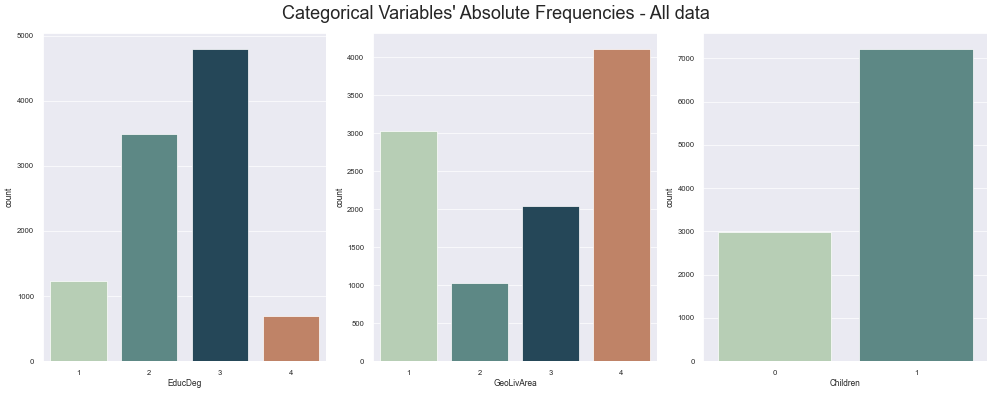

In [179]:
chartBarCharts(categorical_features, df, "Categorical Variables' Absolute Frequencies - All data")


In [8]:
def chartBarCharts(features, data, title):
    # All Non-Metric Variables' Absolute Frequencies
    sns.set()

    # Prepare figure. Create individual axes where each bar plot will be placed
    fig, axes = plt.subplots(1, len(features), figsize=(20, 8))
    #ceil(len(features) / 2)
    # Plot data
    # Iterate across axes objects and associate each bar plot (hint: use the ax argument):
    for ax, feat in zip(axes.flatten(), features): # Notice the zip() function and flatten() method
        sns.countplot(x=data[feat], order=np.sort(df[feat].unique()), ax=ax, palette=['#b4d2b1', '#568f8b', '#1d4a60', '#cd7e59', '#ddb247', '#d15252'])
    plt.suptitle(title,fontsize=26)
    plt.tight_layout()
    plt.show()


In [9]:
def chartCluster(metric_features, categorical_features, data, cluster_title):
    cluster_colors = ['#b4d2b1', '#568f8b', '#1d4a60', '#4281A4', '#cd7e59', '#ddb247','#DE9E36']
    features = metric_features + categorical_features
    ncols = 4
    nrows = len(features) // ncols + (len(features) % ncols > 0)
    fig = plt.figure(figsize=(25,25))

    for n, feature in enumerate([x for x in metric_features]):
        ax = plt.subplot(nrows, ncols, n + 1)
        box = data[[feature, cluster_title]].boxplot(by=cluster_title,ax=ax,return_type='both',patch_artist = True)

        for row_key, (ax,row) in box.iteritems():
            ax.set_xlabel('Cluster')
            ax.set_title(feature,fontweight="bold")
            for i,box in enumerate(row['boxes']):
                box.set_facecolor(cluster_colors[i])
    
    if len(metric_features)>0:
        fig.suptitle('Feature distributions per cluster', fontsize=18, y=1, x= 0.4)   
        plt.tight_layout()
        plt.show()
    
    fig = plt.figure(figsize=(25,15))
    for n, feature in enumerate([x for x in categorical_features]):
        ax = plt.subplot(nrows, ncols, n + 1)
        pl = sns.countplot(x=cluster_title,data=df[[feature, cluster_title]], palette=cluster_colors,hue=feature)

        ax.set_title(feature,fontweight="bold")
        plt.legend(bbox_to_anchor=(1, 1), loc='upper right')

        if feature == 'EducDeg':
            legend_handles, _= ax.get_legend_handles_labels()
            ax.legend(legend_handles, ['Basic', 'High School', 'BSc/MSc', 'PhD'])
    
    if len(categorical_features)>0:
        plt.suptitle('Count of Categorical features for each cluster', fontsize=18, y=1, x= 0.4) 
        plt.tight_layout()
        plt.show()



In [10]:
def chartHistograms( features, data, title):
    # All Numeric Variables' Histograms in one figure
    sns.set()
    
    # Prepare figure. Create individual axes where each histogram will be placed
    fig, axes = plt.subplots(2, ceil(len(features) / 2), figsize=(20, 11))
    
    # Plot data
    # Iterate across axes objects and associate each histogram (hint: use the ax.hist() instead of plt.hist()):
    for ax, feat in zip(axes.flatten(), features): # Notice the zip() function and flatten() method
        ax.hist(data[feat], color=['#568f8b'])
        ax.set_title(feat)
        #ax.set_title(feat, y=-0.13)

    # Layout
    # Add a centered title to the figure:
    plt.suptitle(title, fontsize=26)
    
    plt.show()


In [11]:
def chartBoxPlots( features, data, title):
    # All Numeric Variables' Box Plots in one figure
    sns.set()

    # Prepare figure. Create individual axes where each box plot will be placed
    fig, axes = plt.subplots(2, ceil(len(features) / 2), figsize=(20, 11))

    # Plot data
    # Iterate across axes objects and associate each box plot (hint: use the ax argument):
    for ax, feat in zip(axes.flatten(), features): # Notice the zip() function and flatten() method
        sns.boxplot(x=data[feat], ax=ax, palette=[ '#b4d2b1', '#568f8b', '#1d4a60','#cd7e59', '#ddb247', '#d15252'])

    # Layout
    # Add a centered title to the figure:
    plt.suptitle(title, fontsize=26)
    plt.show()


In [12]:
def chartDendrogram( features, dataframe, Title, plinkage, pn_clusters, pyLabel, py_threshold = None, py_maxline=10000, **kwargs):
    if g_speed_mode == 1:
        dfdendro = dataframe[features][0:100].copy()
        Title = "** SPEED MODE ** " + Title
    else:
        dfdendro = dataframe[features].copy()
    
    distance = 'euclidean'

    hclust = AgglomerativeClustering(linkage=plinkage, affinity=distance, distance_threshold=0, n_clusters=pn_clusters)
    hclust.fit_predict(dfdendro)
    model = hclust.fit(dfdendro)

    plt.title(Title)
    # plot the top three levels of the dendrogram
    #py_threshold = 150
    

    # create the counts of samples under each node
    counts = np.zeros(model.children_.shape[0])
    n_samples = len(model.labels_)
    for i, merge in enumerate(model.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count += 1  # leaf node
            else:
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count

    linkage_matrix = np.column_stack(
        [model.children_, model.distances_, counts]
    ).astype(float)
    # Plot the corresponding dendrogram
    #dendrogram(linkage_matrix, **kwargs, orientation="left")
    dendrogram(linkage_matrix, truncate_mode="level", orientation="left")
    if py_threshold != None:
        plt.vlines(py_threshold, 0, py_maxline, colors="k", linestyles="dashed")
    plt.ylabel(pyLabel)
    plt.show()


In [13]:
def chartPairPlot( featparam, dfparam, title, hueFeature):
    
    if g_speed_mode == 1:
        dfpairplot = dfparam[featparam][0:100].copy()
    else:
        dfpairplot = dfparam[featparam].copy()
        
    #To plot some selected features 
    #listcolormap = ['#b4d2b1', '#568f8b', '#1d4a60', '#cd7e59', '#ddb247', '#d15252']
    #["#682F2F", "#9E726F", "#D6B2B1", "#B9C0C9", "#9F8A78", "#F3AB60", "#D4AB60", "#E2AB60", "#A2AB61"]
    listpalette = ['#568f8b','#cd7e59']
    #["#682F2F","#F3AB60"]
    #Setting up colors prefrences
    #sns.set(rc={"axes.facecolor":"#FFF9ED","figure.facecolor":"#FFF9ED"})
    ##### cmap = colors.ListedColormap(listcolormap)
    #Plotting following features
    plt.figure()
    sns.pairplot(dfpairplot, hue= hueFeature,palette= (listpalette))
    #Taking hue 
    plt.show()


In [14]:
def correlmatrix( dfparam, featparam, correl_method="pearson", decimals=2, shownumbabove=0.1, pfigsize=(10,8)):

    # Prepare figure
    fig = plt.figure(figsize=pfigsize)

    # Obtain correlation matrix. Round the values to 2 decimal cases. Use the DataFrame corr() and round() method.
    corr = np.round(dfparam[featparam].corr(method=correl_method), decimals=decimals)

    # Build annotation matrix (values above |0.5| will appear annotated in the plot)
    mask_annot = np.absolute(corr.values) >= shownumbabove
    annot = np.where(mask_annot, corr.values, np.full(corr.shape,"")) # Try to understand what this np.where() does

    # Plot heatmap of the correlation matrix
    sns.heatmap(data=corr, annot=annot, cmap=sns.diverging_palette(220, 10, as_cmap=True), 
                fmt='s', vmin=-1, vmax=1, center=0, square=True, linewidths=.5)

    # Layout
    fig.subplots_adjust(top=0.95)
    fig.suptitle("Correlation Matrix", fontsize=20)

    #plt.savefig(os.path.join('..', 'figures', 'correlation_matrix.png'), dpi=200)

    plt.show()
    

In [15]:
def draw_umap(dataframe, pcolors, n_neighbors=15, min_dist=0.1, n_components=2, metric='euclidean', title=''):
    fit = umap.UMAP(
        n_neighbors=n_neighbors,
        min_dist=min_dist,
        n_components=n_components,
        metric=metric
    )
    
    u = fit.fit_transform(dataframe);
    fig = plt.figure()
    if n_components == 1:
        ax = fig.add_subplot(111)
        ax.scatter(u[:,0], range(len(u)), c=pcolors)
    if n_components == 2:
        ax = fig.add_subplot(111)
        ax.scatter(u[:,0], u[:,1], c=pcolors)
    if n_components == 3:
        ax = fig.add_subplot(111, projection='3d')
        ax.scatter(u[:,0], u[:,1], u[:,2], c=pcolors, s=100)
    plt.title(title, fontsize=18)
    

#### 2.4 Input file initial handling
- Open the input file
- Create the main dataframe
- Set index on the dataframe
- Define lists for categorical and numeric features

In [16]:
# Import data

df, meta = pyreadstat.read_sas7bdat('a2z_insurance.sas7bdat')
#df = pd.read_sas('a2z_insurance.sas7bdat')

# Keep original dataframe
df_original = df.copy()

# Set index
df.set_index("CustID", drop=True, inplace=True)

# Define categorical and metric features
categorical_features = ["EducDeg", "GeoLivArea", "Children"]
metric_features = df.columns.drop(categorical_features).to_list()


In [17]:
df.shape

(10296, 13)

#### 2.5 Handle duplicates
- Count duplicates
- Drop duplicates


In [18]:
# Check for duplicates
df.duplicated().sum()


3

In [19]:
# Drop duplicates - not credible that all fields except CustID would be exactly the same
df = df.drop_duplicates()


#### 2.6 Check datatypes


In [20]:
df.dtypes

FirstPolYear     float64
BirthYear        float64
EducDeg           object
MonthSal         float64
GeoLivArea       float64
Children         float64
CustMonVal       float64
ClaimsRate       float64
PremMotor        float64
PremHousehold    float64
PremHealth       float64
PremLife         float64
PremWork         float64
dtype: object

#### 2.7 Handle errors
- If First Policy year is after 2016, set it to null (the database has data from 2016);
- If the birth year is less than 1986, making the person older than 100 years, set it to null;
- If Education is equal to an empty string, set it to null;
- If First Policy year is before BirthYear, assume the dates were incorrectly entered. Change each one with the other;

In [21]:
#Handle strange values - correct them

# FirstPolYear cannot be higher than the "current" year - set to null
df['FirstPolYear'] = df['FirstPolYear'].replace(list(df[df["FirstPolYear"]>2016]["FirstPolYear"]), np.nan)
# Birth Year cannot be more than 100 years ago - set to null
df['BirthYear'] = df['BirthYear'].replace(list(df[df["BirthYear"]<1916]["BirthYear"]), np.nan)

df['EducDeg'] = df['EducDeg'].replace(list(df[df["EducDeg"]==""]["EducDeg"]), np.nan)


#FirstPolYear before Birthdate - we assume both fields were swapped and correct it
wrongDatesIndex = (df['FirstPolYear'] < df['BirthYear'])
df.loc[wrongDatesIndex, ['FirstPolYear', 'BirthYear']] = df.loc[wrongDatesIndex, ['BirthYear', 'FirstPolYear']].values



#### 2.8 Handle Null Values
- Count the number of null values per feature;
- Make the necessary assumptions to handle them;

In [22]:
#Check for null values
df.isnull().sum()


FirstPolYear      31
BirthYear         18
EducDeg           17
MonthSal          36
GeoLivArea         1
Children          21
CustMonVal         0
ClaimsRate         0
PremMotor         34
PremHousehold      0
PremHealth        43
PremLife         104
PremWork          86
dtype: int64

Of the five insurance premiums, only PremHousehold has zero values, but it has no null values.
All other insurance categories have null values, but have no zero values.
So we assume that this information was stored inconsistently, and that in fact these null values mean the amount spent for that category is zero.

In [23]:
# We found that PremHousehold has some zero values, but never null
# columns PremMotor, PremHealth, PremLife, PremWork has no zero values, but some nulls
# We consider that in these cases, the Premium is zero.
df["PremMotor"].fillna(0,inplace=True)
df["PremHealth"].fillna(0,inplace=True)
df["PremLife"].fillna(0,inplace=True)
df["PremWork"].fillna(0,inplace=True)


For categorical features, we replace null values with the mode for that category.

In [24]:
#Handle null values from categorical variables - replace null with mode
modes = df[categorical_features].mode().loc[0]
df.fillna(modes, inplace=True)


In [25]:
# Convert EducDeg into an integer
df["EducDeg"] = [x[0] for x in df["EducDeg"]]
df["GeoLivArea"] = df["GeoLivArea"].astype("int")
df["Children"] = df["Children"].astype("int")
df["EducDeg"] = df["EducDeg"].astype("int")

In [26]:
df.dtypes

FirstPolYear     float64
BirthYear        float64
EducDeg            int32
MonthSal         float64
GeoLivArea         int32
Children           int32
CustMonVal       float64
ClaimsRate       float64
PremMotor        float64
PremHousehold    float64
PremHealth       float64
PremLife         float64
PremWork         float64
dtype: object

For numerical features, we replace null values with the average-weighted value of the feature for the 5 nearest neighbours.

In [27]:
#Handle null values from metric variables - get values through KNN
imputer = KNNImputer(n_neighbors=5, weights="uniform")
df[metric_features] = imputer.fit_transform(df[metric_features])


#### 2.9 Check basic density/distribution statistics

In [28]:
#df.describe(include="all").T
df[metric_features].describe(include="all").T

,count,mean,std,min,25%,50%,75%,max
FirstPolYear,10293.0,1987.650248,6.540594,1974.00,1982.00,1988.00,1993.00,2001.00
BirthYear,10293.0,1966.464976,15.471246,1935.00,1953.00,1968.00,1979.00,1998.00
MonthSal,10293.0,2506.576100,1156.082331,333.00,1707.00,2501.00,3290.00,55215.00
CustMonVal,10293.0,177.929963,1946.091554,-165680.42,-9.44,187.03,399.86,11875.89
ClaimsRate,10293.0,0.742728,2.917385,0.00,0.39,0.72,0.98,256.20
PremMotor,10293.0,299.508928,212.288828,-4.11,190.26,298.39,407.52,11604.42
PremHousehold,10293.0,210.419863,352.635041,-75.00,49.45,132.80,290.05,25048.80
PremHealth,10293.0,170.836503,296.031364,-2.11,110.91,162.03,218.93,28272.00
PremLife,10293.0,41.425887,47.428782,-7.00,9.89,25.45,57.01,398.30
PremWork,10293.0,40.938779,51.440777,-12.00,10.00,25.56,56.01,1988.70


<a class="anchor" id="topic03" /><br>
# Step 3 - Understading our data
[Back to Index](#index)<br>
Up to this point, we only performed corrections on what we feel are mistakes
Not we want to get an idea on how our data is distributed.

<a class="anchor" id="topic03.01" /><br>
## 3.1 Descriptive statistics
### 3.1.1 Categorical features - bar charts

In [29]:
# All Non-Metric Variables' Absolute Frequencies
chartBarCharts(categorical_features, df, "Categorical Variables' Absolute Frequencies - All data")


findfont: Matching sans\-serif:style=normal:variant=normal:weight=normal:stretch=normal:size=12.0.
findfont: score(FontEntry(fname='C:\\ProgramData\\Anaconda3\\lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\STIXSizFourSymBol.ttf', name='STIXSizeFourSym', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\ProgramData\\Anaconda3\\lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\STIXNonUni.ttf', name='STIXNonUnicode', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\ProgramData\\Anaconda3\\lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\DejaVuSansMono-Oblique.ttf', name='DejaVu Sans Mono', style='oblique', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.05
findfont: score(FontEntry(fname='C:\\ProgramData\\Anaconda3\\lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\cmtt10.ttf', name='cmtt10',

findfont: score(FontEntry(fname='C:\\ProgramData\\Anaconda3\\lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\DejaVuSans-BoldOblique.ttf', name='DejaVu Sans', style='oblique', variant='normal', weight=700, stretch='normal', size='scalable')) = 3.335
findfont: score(FontEntry(fname='C:\\ProgramData\\Anaconda3\\lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\STIXGeneralBolIta.ttf', name='STIXGeneral', style='italic', variant='normal', weight=700, stretch='normal', size='scalable')) = 11.335
findfont: score(FontEntry(fname='C:\\ProgramData\\Anaconda3\\lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\STIXSizFiveSymReg.ttf', name='STIXSizeFiveSym', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\ProgramData\\Anaconda3\\lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\STIXSizTwoSymReg.ttf', name='STIXSizeTwoSym', style='normal', variant='normal', weight=400, stretch='normal', size='scalable'))

findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\GILI____.TTF', name='Gill Sans MT', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\AKHBRBD.TTF', name='Akhbar MT', style='italic', variant='normal', weight=700, stretch='normal', size='scalable')) = 11.335
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\PER_____.TTF', name='Perpetua', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\PTBLDARC.TTF', name='PT Bold Arch', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\micross.ttf', name='Microsoft Sans Serif', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\SitkaVF-Italic.ttf', name='Sitka', style='italic', v

findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\consolab.ttf', name='Consolas', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\FRAMDCN.TTF', name='Franklin Gothic Medium Cond', style='normal', variant='normal', weight=400, stretch='condensed', size='scalable')) = 10.25
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\lucon.ttf', name='Lucida Console', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\GILSANUB.TTF', name='Gill Sans Ultra Bold', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\framdit.ttf', name='Franklin Gothic Medium', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\BOD_CR.TTF', name='Bod

findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\HARLOWSI.TTF', name='Harlow Solid Italic', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\OLDANOUT.TTF', name='Old Antic Outline', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\trebucit.ttf', name='Trebuchet MS', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\segoeuii.ttf', name='Segoe UI', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\msyhl.ttc', name='Microsoft YaHei', style='normal', variant='normal', weight=290, stretch='normal', size='scalable')) = 10.1545
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\corbel.ttf', name='Corbel', style='normal'

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\FRADM.TTF', name='Franklin Gothic Demi', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\PTSEPBAL.TTF', name='PT Separated Baloon', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\segoeuii.ttf', name='Segoe UI', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\BOOKOS.TTF', name='Bookman Old Style', style='normal', variant='normal', weight=300, stretch='normal', size='scalable')) = 10.145
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\CURLZ___.TTF', name='Curlz MT', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\simsunb.ttf', name='SimSun-ExtB', style='nor

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\palabi.ttf', name='Palatino Linotype', style='italic', variant='normal', weight=700, stretch='normal', size='scalable')) = 11.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\BKANT.TTF', name='Book Antiqua', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\GOUDOSI.TTF', name='Goudy Old Style', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\segoeuil.ttf', name='Segoe UI', style='normal', variant='normal', weight=300, stretch='normal', size='scalable')) = 10.145
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\ARIALNB.TTF', name='Arial', style='normal', variant='normal', weight=700, stretch='condensed', size='scalable')) = 0.5349999999999999
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\DWNSPOUT.TTF', name='Diwani Simple Outline',

findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\PLAYBILL.TTF', name='Playbill', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\BRLNSDB.TTF', name='Berlin Sans FB Demi', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\GOUDOSB.TTF', name='Goudy Old Style', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\VIVALDII.TTF', name='Vivaldi', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\PERTIBD.TTF', name='Perpetua Titling MT', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\BRLNSB.TTF', name='Berlin Sans FB', style='n

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\verdanab.ttf', name='Verdana', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\calibril.ttf', name='Calibri', style='normal', variant='normal', weight=300, stretch='normal', size='scalable')) = 10.145
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\JUICE___.TTF', name='Juice ITC', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\MOD20.TTF', name='Modern No. 20', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\PTBLDHAD.TTF', name='PT Bold Heading', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\PER_____.TTF', name='Perpetua', style='normal', variant='norma

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\georgiab.ttf', name='Georgia', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\ebrimabd.ttf', name='Ebrima', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\Gabriola.ttf', name='Gabriola', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\TCCB____.TTF', name='Tw Cen MT Condensed', style='normal', variant='normal', weight=700, stretch='condensed', size='scalable')) = 10.535
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\verdanaz.ttf', name='Verdana', style='italic', variant='normal', weight=700, stretch='normal', size='scalable')) = 11.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\INFROMAN.TTF', name='Informal Roman', style='normal', vari

findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\BOD_BLAI.TTF', name='Bodoni MT', style='italic', variant='normal', weight=900, stretch='normal', size='scalable')) = 11.525
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\LSANSI.TTF', name='Lucida Sans', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\SPINDSHD.TTF', name='Simple Indust Shaded', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\FRAHV.TTF', name='Franklin Gothic Heavy', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\BRLNSDB.TTF', name='Berlin Sans FB Demi', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\PERB____.TTF', name='Perpetua', styl

findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\TCCEB.TTF', name='Tw Cen MT Condensed Extra Bold', style='normal', variant='normal', weight=400, stretch='condensed', size='scalable')) = 10.25
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\symbol.ttf', name='Symbol', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\LSANS.TTF', name='Lucida Sans', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\SNAP____.TTF', name='Snap ITC', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\gadugib.ttf', name='Gadugi', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\LBRITED.TTF', name='Lucida Bright', style='normal', vari

findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\MUDIR.TTF', name='Mudir MT', style='normal', variant='normal', weight=600, stretch='normal', size='scalable')) = 10.24
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\TCM_____.TTF', name='Tw Cen MT', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\verdana.ttf', name='Verdana', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\YuGothB.ttc', name='Yu Gothic', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\FELIXTI.TTF', name='Felix Titling', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\constanz.ttf', name='Constantia', style='italic', variant='normal', wei

findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\COPRGTB.TTF', name='Copperplate Gothic Bold', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\SPINDOUT.TTF', name='Simple Indust Outline', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\GOTHICB.TTF', name='Century Gothic', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\BOOKOSI.TTF', name='Bookman Old Style', style='italic', variant='normal', weight=300, stretch='normal', size='scalable')) = 11.145
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\MISTRAL.TTF', name='Mistral', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\AGENCYR.TTF', name='Agency FB', 

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\l_10646.ttf', name='Lucida Sans Unicode', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\CURLZ___.TTF', name='Curlz MT', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\CALIFR.TTF', name='Californian FB', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\LFAXD.TTF', name='Lucida Fax', style='normal', variant='normal', weight=600, stretch='normal', size='scalable')) = 10.24
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\GIGI.TTF', name='Gigi', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\segoeuib.ttf', name='Segoe UI', style='normal', variant='normal', w

findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\BRITANIC.TTF', name='Britannic Bold', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\trebucbd.ttf', name='Trebuchet MS', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\SitkaVF-Italic.ttf', name='Sitka', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\PALSCRI.TTF', name='Palace Script MT', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\SNAP____.TTF', name='Snap ITC', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\webdings.ttf', name='Webdings', style='normal', var

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\DUBAI-LIGHT.TTF', name='Dubai', style='normal', variant='normal', weight=300, stretch='normal', size='scalable')) = 10.145
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\couri.ttf', name='Courier New', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\timesbi.ttf', name='Times New Roman', style='italic', variant='normal', weight=700, stretch='normal', size='scalable')) = 11.335
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\PTSEPBAL.TTF', name='PT Separated Baloon', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\timesbd.ttf', name='Times New Roman', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\BRLNSB.TTF', name='Berlin Sans FB', style='nor

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\PERI____.TTF', name='Perpetua', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\BOD_PSTC.TTF', name='Bodoni MT', style='normal', variant='normal', weight=300, stretch='normal', size='scalable')) = 10.145
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\consolai.ttf', name='Consolas', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\msjh.ttc', name='Microsoft JhengHei', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\Gabriola.ttf', name='Gabriola', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\cambriai.ttf', name='Cambria', style='italic', variant='normal',

findfont: score(FontEntry(fname='C:\\ProgramData\\Anaconda3\\lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\cmsy10.ttf', name='cmsy10', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\ProgramData\\Anaconda3\\lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\STIXGeneralItalic.ttf', name='STIXGeneral', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.05
findfont: score(FontEntry(fname='C:\\ProgramData\\Anaconda3\\lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\STIXNonUniIta.ttf', name='STIXNonUnicode', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.05
findfont: score(FontEntry(fname='C:\\ProgramData\\Anaconda3\\lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\DejaVuSansMono-Bold.ttf', name='DejaVu Sans Mono', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: sco

findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\NirmalaB.ttf', name='Nirmala UI', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\SegoeIcons.ttf', name='Segoe Fluent Icons', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\FTLTLT.TTF', name='Footlight MT Light', style='normal', variant='normal', weight=300, stretch='normal', size='scalable')) = 10.145
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\KOUFIBD.TTF', name='Monotype Koufi', style='italic', variant='normal', weight=700, stretch='normal', size='scalable')) = 11.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\timesbd.ttf', name='Times New Roman', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\COOPBL.TTF', name='Cooper Black', s

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\segoeuib.ttf', name='Segoe UI', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\corbel.ttf', name='Corbel', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\PERI____.TTF', name='Perpetua', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\AKHBR.TTF', name='Akhbar MT', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\BOD_CBI.TTF', name='Bodoni MT', style='italic', variant='normal', weight=700, stretch='condensed', size='scalable')) = 11.535
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\BOD_CI.TTF', name='Bodoni MT', style='italic', variant='normal', weight=4

findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\ELEPHNTI.TTF', name='Elephant', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\NirmalaS.ttf', name='Nirmala UI', style='normal', variant='normal', weight=350, stretch='normal', size='scalable')) = 10.0975
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\msjhl.ttc', name='Microsoft JhengHei', style='normal', variant='normal', weight=290, stretch='normal', size='scalable')) = 10.1545
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\LSANSD.TTF', name='Lucida Sans', style='normal', variant='normal', weight=600, stretch='normal', size='scalable')) = 10.24
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\ITCKRIST.TTF', name='Kristen ITC', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\ARBSQDTP.TTF', name='AGA Arabesque Desktop', style='nor

findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\mmrtextb.ttf', name='Myanmar Text', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\ERASLGHT.TTF', name='Eras Light ITC', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\corbeli.ttf', name='Corbel', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\cambriaz.ttf', name='Cambria', style='italic', variant='normal', weight=700, stretch='normal', size='scalable')) = 11.335
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\LATINWD.TTF', name='Wide Latin', style='normal', variant='normal', weight=400, stretch='expanded', size='scalable')) = 10.25
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\GOUDYSTO.TTF', name='Goudy Stout', style='normal', variant='n

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\ARIALN.TTF', name='Arial', style='normal', variant='normal', weight=400, stretch='condensed', size='scalable')) = 0.25
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\GOUDOSI.TTF', name='Goudy Old Style', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\VINERITC.TTF', name='Viner Hand ITC', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\PTBLDBRK.TTF', name='PT Bold Broken', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\symbol.ttf', name='Symbol', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\SPBLDRUL.TTF', name='PT Simple Bold Ruled', style='normal', v

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\BRITANIC.TTF', name='Britannic Bold', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\calibrii.ttf', name='Calibri', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\HTOWERT.TTF', name='High Tower Text', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\ARIALNB.TTF', name='Arial', style='normal', variant='normal', weight=700, stretch='condensed', size='scalable')) = 0.5349999999999999
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\PERBI___.TTF', name='Perpetua', style='italic', variant='normal', weight=700, stretch='normal', size='scalable')) = 11.335
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\seguisbi.ttf', name='Segoe UI', style='italic', 

findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\BLDITLAR.TTF', name='Bold Italic Art', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\verdanab.ttf', name='Verdana', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\BELLB.TTF', name='Bell MT', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\GILBI___.TTF', name='Gill Sans MT', style='italic', variant='normal', weight=700, stretch='normal', size='scalable')) = 11.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\SCHLBKBI.TTF', name='Century Schoolbook', style='italic', variant='normal', weight=700, stretch='normal', size='scalable')) = 11.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\consolaz.ttf', name='Consolas', style='italic', vari

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\mvboli.ttf', name='MV Boli', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\malgunbd.ttf', name='Malgun Gothic', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\LSANSDI.TTF', name='Lucida Sans', style='italic', variant='normal', weight=600, stretch='normal', size='scalable')) = 11.24
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\bahnschrift.ttf', name='Bahnschrift', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\GILLUBCD.TTF', name='Gill Sans Ultra Bold Condensed', style='normal', variant='normal', weight=400, stretch='condensed', size='scalable')) = 10.25
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\CENTAUR.TTF', name='Centaur', style=

findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\marlett.ttf', name='Marlett', style='normal', variant='normal', weight=500, stretch='normal', size='scalable')) = 10.145
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\SegUIVar.ttf', name='Segoe UI Variable', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\GARA.TTF', name='Garamond', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\corbell.ttf', name='Corbel', style='normal', variant='normal', weight=300, stretch='normal', size='scalable')) = 10.145
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\verdanaz.ttf', name='Verdana', style='italic', variant='normal', weight=700, stretch='normal', size='scalable')) = 11.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\msyi.ttf', name='Microsoft Yi Baiti', style='normal', variant='normal'

findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\SCHLBKI.TTF', name='Century Schoolbook', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\GOUDOS.TTF', name='Goudy Old Style', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\georgiaz.ttf', name='Georgia', style='italic', variant='normal', weight=700, stretch='normal', size='scalable')) = 11.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\cambria.ttc', name='Cambria', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\HARNGTON.TTF', name='Harrington', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\LFAXI.TTF', name='Lucida Fax', style='italic', variant='no

findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\PERTIBD.TTF', name='Perpetua Titling MT', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\Candaral.ttf', name='Candara', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\ANTQUAI.TTF', name='Book Antiqua', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\msyhbd.ttc', name='Microsoft YaHei', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\ARIALNI.TTF', name='Arial', style='italic', variant='normal', weight=400, stretch='condensed', size='scalable')) = 1.25
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\phagspab.ttf', name='Microsoft PhagsPa', style='normal'

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\YuGothM.ttc', name='Yu Gothic', style='normal', variant='normal', weight=500, stretch='normal', size='scalable')) = 10.145
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\LTYPEB.TTF', name='Lucida Sans Typewriter', style='normal', variant='normal', weight=600, stretch='normal', size='scalable')) = 10.24
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\YuGothL.ttc', name='Yu Gothic', style='normal', variant='normal', weight=300, stretch='normal', size='scalable')) = 10.145
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\SPOUTPAT.TTF', name='Simple Outline Pat', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\msyh.ttc', name='Microsoft YaHei', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\SPOUTPAT.TTF', name='Simple Outline Pat', sty

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\PLAYBILL.TTF', name='Playbill', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\PARCHM.TTF', name='Parchment', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\FRADM.TTF', name='Franklin Gothic Demi', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\GLECB.TTF', name='Gloucester MT Extra Condensed', style='normal', variant='normal', weight=400, stretch='condensed', size='scalable')) = 10.25
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\ITCKRIST.TTF', name='Kristen ITC', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\tahoma.ttf', name='Tahoma', style='norma

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\timesbi.ttf', name='Times New Roman', style='italic', variant='normal', weight=700, stretch='normal', size='scalable')) = 11.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\CALIFR.TTF', name='Californian FB', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\holomdl2.ttf', name='HoloLens MDL2 Assets', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\AGENCYB.TTF', name='Agency FB', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\CENTURY.TTF', name='Century', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\FRADMIT.TTF', name='Franklin Gothic Demi', style='

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\ELEPHNTI.TTF', name='Elephant', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\FRSSPBL.TTF', name='Farsi Simple Bold', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\CALIFI.TTF', name='Californian FB', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\DUBAI-BOLD.TTF', name='Dubai', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\ARABSQ.TTF', name='AGA Arabesque', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\consola.ttf', name='Consolas', style='normal', variant='n

findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\LSANSI.TTF', name='Lucida Sans', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\arialbd.ttf', name='Arial', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 0.33499999999999996
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\CENTAUR.TTF', name='Centaur', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\ELEPHNT.TTF', name='Elephant', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\SitkaVF.ttf', name='Sitka', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\LBRITEI.TTF', name='Lucida Bright', style='italic', variant='normal'

findfont: score(FontEntry(fname='C:\\ProgramData\\Anaconda3\\lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\STIXNonUni.ttf', name='STIXNonUnicode', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\ProgramData\\Anaconda3\\lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\DejaVuSansMono-Oblique.ttf', name='DejaVu Sans Mono', style='oblique', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.05
findfont: score(FontEntry(fname='C:\\ProgramData\\Anaconda3\\lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\cmtt10.ttf', name='cmtt10', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\ProgramData\\Anaconda3\\lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\cmr10.ttf', name='cmr10', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname

findfont: score(FontEntry(fname='C:\\ProgramData\\Anaconda3\\lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\STIXSizFiveSymReg.ttf', name='STIXSizeFiveSym', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\ProgramData\\Anaconda3\\lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\STIXSizTwoSymReg.ttf', name='STIXSizeTwoSym', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\ProgramData\\Anaconda3\\lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\cmex10.ttf', name='cmex10', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\GOUDOS.TTF', name='Goudy Old Style', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\TCMI____.TTF', name='Tw Cen MT

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\PTBLDARC.TTF', name='PT Bold Arch', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\micross.ttf', name='Microsoft Sans Serif', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\SitkaVF-Italic.ttf', name='Sitka', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\AKHBRBD.TTF', name='Akhbar MT', style='italic', variant='normal', weight=700, stretch='normal', size='scalable')) = 11.335
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\msyhbd.ttc', name='Microsoft YaHei', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\ONYX.TTF', name='Onyx', style='normal', variant

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\GILSANUB.TTF', name='Gill Sans Ultra Bold', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\framdit.ttf', name='Franklin Gothic Medium', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\BOD_CR.TTF', name='Bodoni MT', style='normal', variant='normal', weight=400, stretch='condensed', size='scalable')) = 10.25
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\REFSAN.TTF', name='MS Reference Sans Serif', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\SPBLDJUT.TTF', name='Simple Bold Jut Out', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\ROCCB___.TTF', name='

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\segoeuii.ttf', name='Segoe UI', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\msyhl.ttc', name='Microsoft YaHei', style='normal', variant='normal', weight=290, stretch='normal', size='scalable')) = 10.1545
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\corbel.ttf', name='Corbel', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\VLADIMIR.TTF', name='Vladimir Script', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\WINGDNG2.TTF', name='Wingdings 2', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\MISTRAL.TTF', name='Mistral', style='normal', variant='norma

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\BOOKOS.TTF', name='Bookman Old Style', style='normal', variant='normal', weight=300, stretch='normal', size='scalable')) = 10.145
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\CURLZ___.TTF', name='Curlz MT', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\simsunb.ttf', name='SimSun-ExtB', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\MAIAN.TTF', name='Maiandra GD', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\FRABKIT.TTF', name='Franklin Gothic Book', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\ITCEDSCR.TTF', name='Edwardian Script ITC', style='

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\segoeuil.ttf', name='Segoe UI', style='normal', variant='normal', weight=300, stretch='normal', size='scalable')) = 10.145
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\ARIALNB.TTF', name='Arial', style='normal', variant='normal', weight=700, stretch='condensed', size='scalable')) = 0.5349999999999999
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\DWNSPOUT.TTF', name='Diwani Simple Outline', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\palab.ttf', name='Palatino Linotype', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\ROCKBI.TTF', name='Rockwell', style='italic', variant='normal', weight=700, stretch='normal', size='scalable')) = 11.335
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\MATURASC.TTF', name='Matura MT Script Ca

findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\VIVALDII.TTF', name='Vivaldi', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\PERTIBD.TTF', name='Perpetua Titling MT', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\BRLNSB.TTF', name='Berlin Sans FB', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\malgunbd.ttf', name='Malgun Gothic', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\seguibli.ttf', name='Segoe UI', style='italic', variant='normal', weight=900, stretch='normal', size='scalable')) = 11.525
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\constani.ttf', name='Constantia', style='italic', 

findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\PTBLDHAD.TTF', name='PT Bold Heading', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\PER_____.TTF', name='Perpetua', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\himalaya.ttf', name='Microsoft Himalaya', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\BSSYM7.TTF', name='Bookshelf Symbol 7', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\SCHLBKBI.TTF', name='Century Schoolbook', style='italic', variant='normal', weight=700, stretch='normal', size='scalable')) = 11.335
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\constan.ttf', name='Constantia', sty

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\verdanaz.ttf', name='Verdana', style='italic', variant='normal', weight=700, stretch='normal', size='scalable')) = 11.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\INFROMAN.TTF', name='Informal Roman', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\ROCKI.TTF', name='Rockwell', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\DTHULUTH.TTF', name='DecoType Thuluth', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\ERASMD.TTF', name='Eras Medium ITC', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\arial.ttf', name='Arial', style='normal', variant='norma

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\BRLNSDB.TTF', name='Berlin Sans FB Demi', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\PERB____.TTF', name='Perpetua', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\GOTHICBI.TTF', name='Century Gothic', style='italic', variant='normal', weight=700, stretch='normal', size='scalable')) = 11.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\DWNSH2.TTF', name='Diwani Simple Outline 2', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\segoeui.ttf', name='Segoe UI', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\segoeuiz.ttf', name='Segoe UI', style='it

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\gadugib.ttf', name='Gadugi', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\LBRITED.TTF', name='Lucida Bright', style='normal', variant='normal', weight=600, stretch='normal', size='scalable')) = 10.24
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\IMPRISHA.TTF', name='Imprint MT Shadow', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\ntailub.ttf', name='Microsoft New Tai Lue', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\MAGNETOB.TTF', name='Magneto', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\arialbi.ttf', name='Arial', style='italic', vari

findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\constanz.ttf', name='Constantia', style='italic', variant='normal', weight=700, stretch='normal', size='scalable')) = 11.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\DTNASKH2.TTF', name='DecoType Naskh Variants', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\cambriab.ttf', name='Cambria', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\LBRITEI.TTF', name='Lucida Bright', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\tahomabd.ttf', name='Tahoma', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\BAUHS93.TTF', name='Bauhaus 93', style='normal', va

findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\AGENCYR.TTF', name='Agency FB', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\ITLOUTAR.TTF', name='Italic Outline Art', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\OCRAEXT.TTF', name='OCR A Extended', style='normal', variant='normal', weight=400, stretch='expanded', size='scalable')) = 10.25
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\BOD_I.TTF', name='Bodoni MT', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\courbi.ttf', name='Courier New', style='italic', variant='normal', weight=700, stretch='normal', size='scalable')) = 11.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\ROCKB.TTF', name='Rockwell', style='normal', variant='n

findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\segoeuib.ttf', name='Segoe UI', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\COPRGTL.TTF', name='Copperplate Gothic Light', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\BOD_BLAR.TTF', name='Bodoni MT', style='normal', variant='normal', weight=900, stretch='normal', size='scalable')) = 10.525
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\KUNSTLER.TTF', name='Kunstler Script', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\ARIALNI.TTF', name='Arial', style='italic', variant='normal', weight=400, stretch='condensed', size='scalable')) = 1.25
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\NIAGENG.TTF', name='Niagara Engraved', style='nor

findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\webdings.ttf', name='Webdings', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\segoeuiz.ttf', name='Segoe UI', style='italic', variant='normal', weight=700, stretch='normal', size='scalable')) = 11.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\BOOKOSI.TTF', name='Bookman Old Style', style='italic', variant='normal', weight=300, stretch='normal', size='scalable')) = 11.145
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\ntailub.ttf', name='Microsoft New Tai Lue', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\GOTHIC.TTF', name='Century Gothic', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\ANTQUAI.TTF', name='Book Antiqua', style='ita

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\BRLNSB.TTF', name='Berlin Sans FB', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\calibriz.ttf', name='Calibri', style='italic', variant='normal', weight=700, stretch='normal', size='scalable')) = 11.335
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\DUBAI-MEDIUM.TTF', name='Dubai', style='normal', variant='normal', weight=500, stretch='normal', size='scalable')) = 10.145
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\seguibli.ttf', name='Segoe UI', style='italic', variant='normal', weight=900, stretch='normal', size='scalable')) = 11.525
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\GOTHICI.TTF', name='Century Gothic', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\TCCM____.TTF', name='Tw Cen MT Condensed', style='normal', 

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\cambriai.ttf', name='Cambria', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\impact.ttf', name='Impact', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\DWNSPSTR.TTF', name='Diwani Simple Striped', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\WINGDNG3.TTF', name='Wingdings 3', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\WINGDNG2.TTF', name='Wingdings 2', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\BOD_B.TTF', name='Bodoni MT', style='normal', variant='nor

findfont: score(FontEntry(fname='C:\\ProgramData\\Anaconda3\\lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\DejaVuSerif-Italic.ttf', name='DejaVu Serif', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.05
findfont: score(FontEntry(fname='C:\\ProgramData\\Anaconda3\\lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\STIXGeneral.ttf', name='STIXGeneral', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\ProgramData\\Anaconda3\\lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\cmb10.ttf', name='cmb10', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\ProgramData\\Anaconda3\\lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\DejaVuSans.ttf', name='DejaVu Sans', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 2.05
findfont: score(FontEntry(fname='C

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\COOPBL.TTF', name='Cooper Black', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\georgiab.ttf', name='Georgia', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\GLSNECB.TTF', name='Gill Sans MT Ext Condensed Bold', style='normal', variant='normal', weight=400, stretch='condensed', size='scalable')) = 10.25
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\GOUDOSB.TTF', name='Goudy Old Style', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\mingliub.ttc', name='MingLiU-ExtB', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\simsun.ttc', name='SimSun', style=

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\BOD_CI.TTF', name='Bodoni MT', style='italic', variant='normal', weight=400, stretch='condensed', size='scalable')) = 11.25
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\GIL_____.TTF', name='Gill Sans MT', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\mmrtextb.ttf', name='Myanmar Text', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\seguisli.ttf', name='Segoe UI', style='italic', variant='normal', weight=350, stretch='normal', size='scalable')) = 11.0975
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\LeelaUIb.ttf', name='Leelawadee UI', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\OLDENGL.TTF', name='Old English Text MT', style='norm

findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\ARBSQDTP.TTF', name='AGA Arabesque Desktop', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\BOD_CI.TTF', name='Bodoni MT', style='italic', variant='normal', weight=400, stretch='condensed', size='scalable')) = 11.25
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\calibrib.ttf', name='Calibri', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\CASTELAR.TTF', name='Castellar', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\cambriaz.ttf', name='Cambria', style='italic', variant='normal', weight=700, stretch='normal', size='scalable')) = 11.335
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\arial.ttf', name='Arial', style='normal', variant='norma

findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\GOUDYSTO.TTF', name='Goudy Stout', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\KFOUTSHD.TTF', name='Kufi Outline Shaded', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\GILBI___.TTF', name='Gill Sans MT', style='italic', variant='normal', weight=700, stretch='normal', size='scalable')) = 11.335
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\msjh.ttc', name='Microsoft JhengHei', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\segoescb.ttf', name='Segoe Script', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\corbelb.ttf', name='Corbel', style='normal

findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\SPBLDRUL.TTF', name='PT Simple Bold Ruled', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\GARA.TTF', name='Garamond', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\FRABK.TTF', name='Franklin Gothic Book', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\msjhbd.ttc', name='Microsoft JhengHei', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\palai.ttf', name='Palatino Linotype', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\segoescb.ttf', name='Segoe Script', styl

findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\seguisbi.ttf', name='Segoe UI', style='italic', variant='normal', weight=600, stretch='normal', size='scalable')) = 11.24
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\constanz.ttf', name='Constantia', style='italic', variant='normal', weight=700, stretch='normal', size='scalable')) = 11.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\mmrtext.ttf', name='Myanmar Text', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\CALISTBI.TTF', name='Calisto MT', style='italic', variant='normal', weight=700, stretch='normal', size='scalable')) = 11.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\palab.ttf', name='Palatino Linotype', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\DWNOUTSH.TTF', name='Diwani Outline Shaded', style='norm

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\consolaz.ttf', name='Consolas', style='italic', variant='normal', weight=700, stretch='normal', size='scalable')) = 11.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\consola.ttf', name='Consolas', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\Nirmala.ttf', name='Nirmala UI', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\SPBLDJUT.TTF', name='Simple Bold Jut Out', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\BOD_BI.TTF', name='Bodoni MT', style='italic', variant='normal', weight=700, stretch='normal', size='scalable')) = 11.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\calibrii.ttf', name='Calibri', style='italic', variant='norm

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\CENTAUR.TTF', name='Centaur', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\corbelz.ttf', name='Corbel', style='italic', variant='normal', weight=700, stretch='normal', size='scalable')) = 11.335
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\ELEPHNT.TTF', name='Elephant', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\DTHULUTH.TTF', name='DecoType Thuluth', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\HTOWERT.TTF', name='High Tower Text', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\FRAHVIT.TTF', name='Franklin Gothic Heavy', style='italic', var

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\msyi.ttf', name='Microsoft Yi Baiti', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\comic.ttf', name='Comic Sans MS', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\BROADW.TTF', name='Broadway', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\framd.ttf', name='Franklin Gothic Medium', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\LFAXD.TTF', name='Lucida Fax', style='normal', variant='normal', weight=600, stretch='normal', size='scalable')) = 10.24
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\DTNASKH3.TTF', name='DecoType Naskh Extensions', style='

findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\LFAXI.TTF', name='Lucida Fax', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\BELLI.TTF', name='Bell MT', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\CALIST.TTF', name='Calisto MT', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\COPRGTL.TTF', name='Copperplate Gothic Light', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\ENGR.TTF', name='Engravers MT', style='normal', variant='normal', weight=500, stretch='normal', size='scalable')) = 10.145
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\LATINWD.TTF', name='Wide Latin', style='normal', variant='nor

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\ARIALNI.TTF', name='Arial', style='italic', variant='normal', weight=400, stretch='condensed', size='scalable')) = 1.25
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\phagspab.ttf', name='Microsoft PhagsPa', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\corbelz.ttf', name='Corbel', style='italic', variant='normal', weight=700, stretch='normal', size='scalable')) = 11.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\ariblk.ttf', name='Arial', style='normal', variant='normal', weight=900, stretch='normal', size='scalable')) = 0.525
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\ebrima.ttf', name='Ebrima', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\seguisli.ttf', name='Segoe UI', style='italic', variant='normal', weight=35

findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\msyh.ttc', name='Microsoft YaHei', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\SPOUTPAT.TTF', name='Simple Outline Pat', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\DTNASKH4.TTF', name='DecoType Naskh Swashes', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\comici.ttf', name='Comic Sans MS', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\BSSYM7.TTF', name='Bookshelf Symbol 7', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\trebucbd.ttf', name='Trebuchet MS'

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\ITCKRIST.TTF', name='Kristen ITC', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\tahoma.ttf', name='Tahoma', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\LHANDW.TTF', name='Lucida Handwriting', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\SCHLBKI.TTF', name='Century Schoolbook', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\segoepr.ttf', name='Segoe Print', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\tahomabd.ttf', name='Tahoma', style='normal', variant=

### 3.1.2 Descriptive statistics - numerical features - Histograms

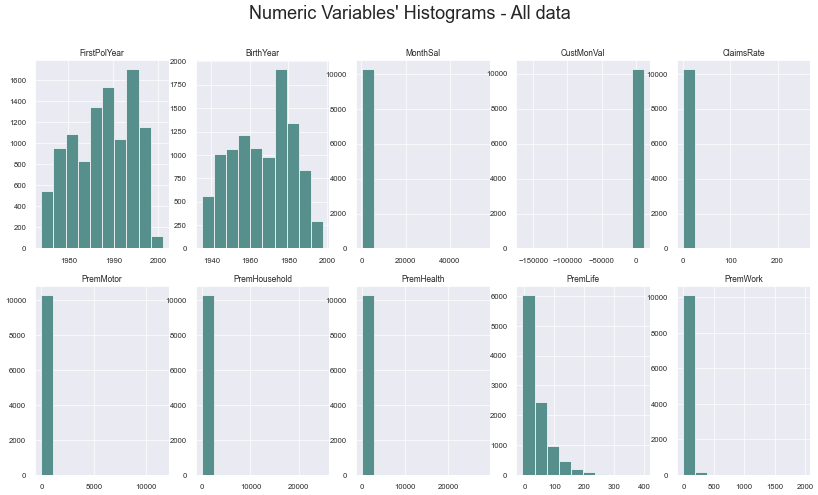

In [30]:
chartHistograms( metric_features, df, "Numeric Variables' Histograms - All data")


### 3.1.3 Descriptive statistics - numerical features - Box Plots

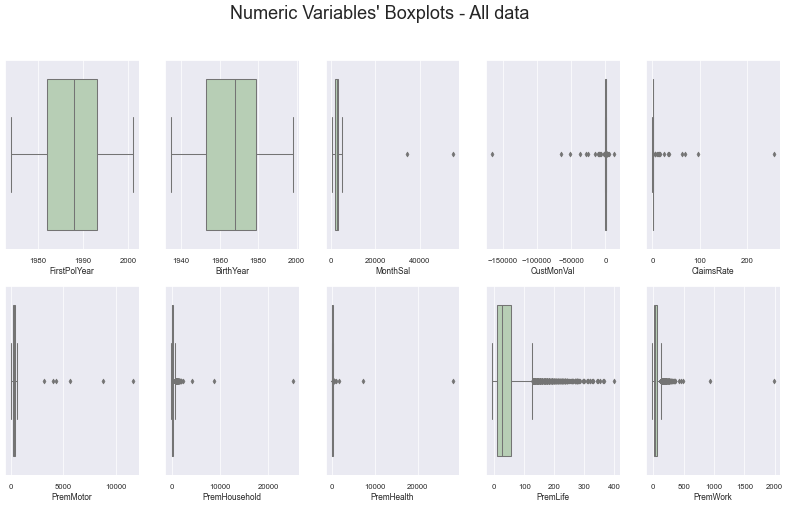

In [31]:
chartBoxPlots( metric_features, df, "Numeric Variables' Boxplots - All data")


top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved


top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved


top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved


top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved


<Figure size 400x275 with 0 Axes>

top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved


top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved


top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved


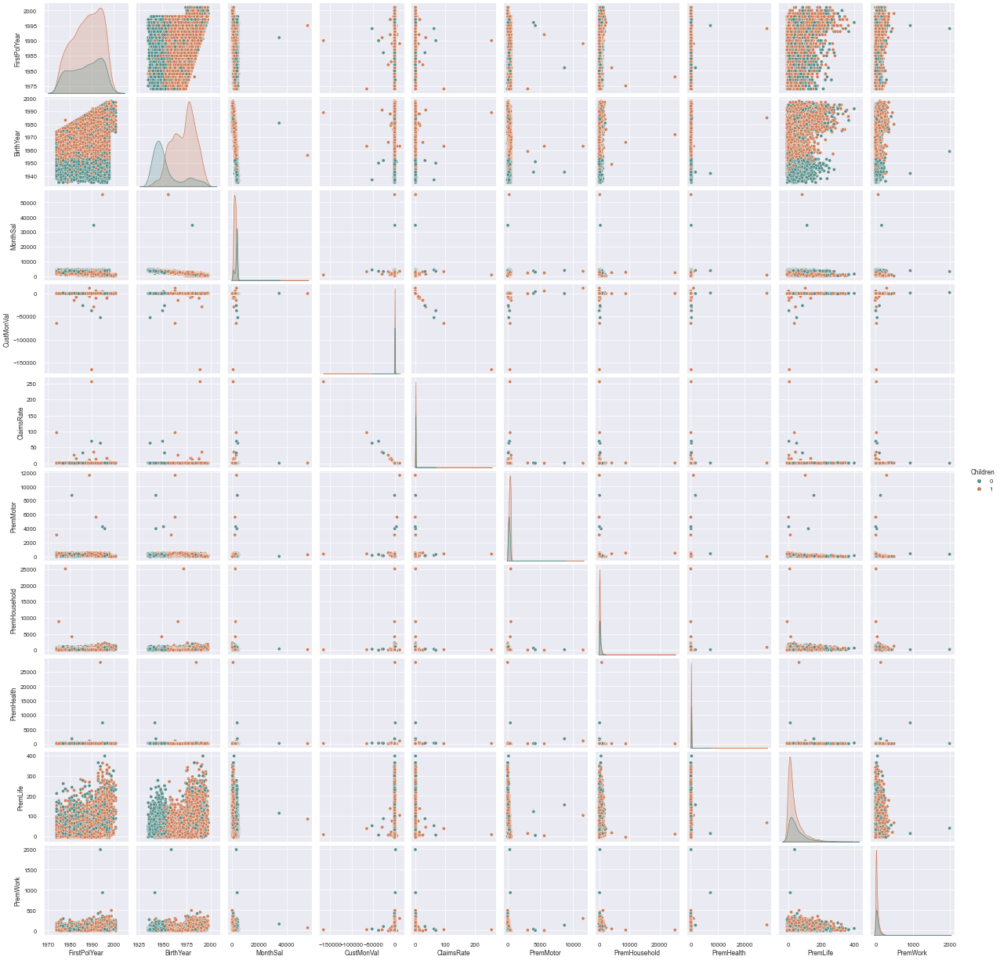

In [32]:
chartPairPlot(featparam=metric_features + ['Children'], dfparam = df, title="Pair Plot",hueFeature='Children')


<a class="anchor" id="topic03.02" /><br>
## 3.2. Feature Engineering

#### Creation of new features
- Years_as_Customer: As the diference between 2016 and FirstPolYear;
- Age: As the diference between 2016 and BirthYear;
- PremTotal: As the sum of all Prems;
- PremHHL_propSal: As the proportion between the sum of premiums of non-mandatory insurances and the annual salary;
- YearSal: As the yearly salary

In [33]:
#Creating new variables "Years_as_Customer", "Age", "PremTotal"
df["Years_as_Customer"] = 2016-df["FirstPolYear"]
df["Age"] = 2016-df["BirthYear"]
df["PremTotal"] = df['PremMotor'] + df['PremHousehold'] + df['PremHealth'] + df['PremLife'] + df['PremWork']
df["YearSal"] = df["MonthSal"]*12

In [34]:
lst_PremHHL_propSal = []
for i in list(df.index):
    lst_PremHHL_propSal.append(round((max(df['PremHealth'][i],0) + 
                                      max(df['PremLife'][i], 0) + 
                                      max(df['PremHousehold'][i], 0)) 
                                     / (df['MonthSal'][i]*12), 5)
                          )
df['PremHHL_propSal'] = lst_PremHHL_propSal


In [35]:
df = df.drop(["FirstPolYear", "BirthYear", 'MonthSal'], axis=1)
metric_features.remove('FirstPolYear')
metric_features.remove('BirthYear')
metric_features.remove('MonthSal')

metric_features.append('YearSal')
metric_features.append("Years_as_Customer")
metric_features.append("Age")
metric_features.append("PremTotal")
metric_features.append('PremHHL_propSal')


In [36]:
df = df[metric_features + categorical_features]

#Sociodemographic = ['EducDeg','Age', 'Children','YearSal', 'PremHHL_propSal', 'GeoLivArea']
#insurances = ['PremMotor', 'PremHousehold', 'PremHealth', 'PremLife', 'PremWork', 'PremTotal']
#client_value = ['Years_as_Customer', 'CustMonVal', 'ClaimsRate', 'PremTotal']

Sociodemographic = ['EducDeg','Age', 'Children','YearSal', 'PremHHL_propSal', 'GeoLivArea']
client_value = ['PremMotor', 'PremHousehold', 'PremHealth', 'PremLife', 'PremWork', 'PremTotal', 'Years_as_Customer', 'CustMonVal', 'ClaimsRate']


<a class="anchor" id="topic03.03" /><br>
## 3.3 Descriptive statistics - After feature engineering
### 3.3.1 Numerical features - Histograms

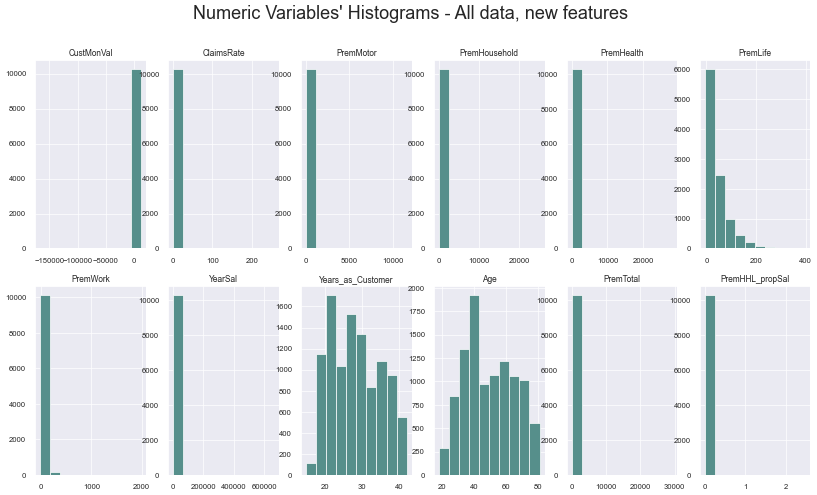

In [37]:
chartHistograms( metric_features, df, "Numeric Variables' Histograms - All data, new features")

### 3.3.2 Descriptive statistics - numerical features After feature engineering- Box Plots

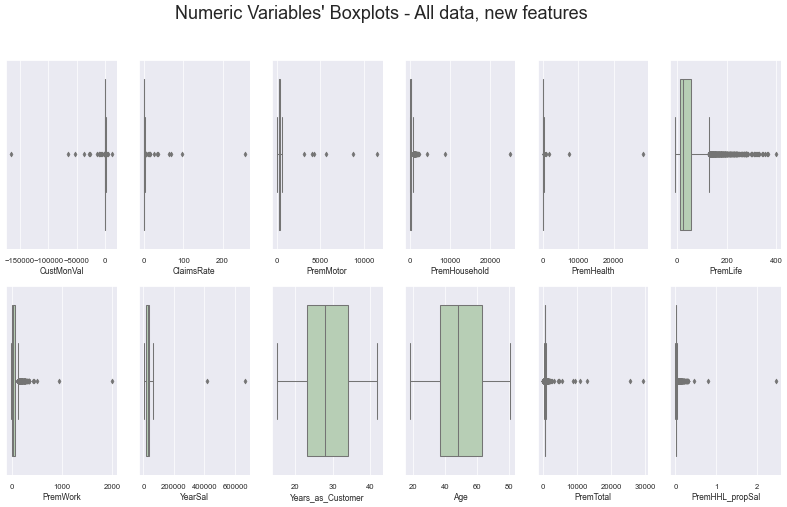

In [38]:
chartBoxPlots( metric_features, df, "Numeric Variables' Boxplots - All data, new features")

<a class="anchor" id="topic04" /><br>
# 4. Data Preparation
[Back to Index](#index)

## 4.1 Remove outliers
We define an outlier in a very conservative way; it's an observation that is
more than 3xIQR above Quantile 75 or below Quantile 25.

In [39]:
filters = (
    (df['PremTotal']/df['YearSal'] < 0.20)  &
    (df['YearSal'] < 200000) &
    (df['PremMotor'] < 2000) &
    (df['PremHealth'] < 2500) &
    (df['PremHousehold'] < 2500) &
    (df['PremWork'] < 1000) &
    (df['CustMonVal']> -2500) &
    (df['ClaimsRate']< 4)
)

df = df[filters]

In [40]:
print('# of outliers removed:', np.round( df_original.shape[0] - df.shape[0]))
print('Percentage of data kept after removing outliers:', np.round(df.shape[0] / df_original.shape[0], 4))


# of outliers removed: 89
Percentage of data kept after removing outliers: 0.9914


In [41]:
df.dtypes

CustMonVal           float64
ClaimsRate           float64
PremMotor            float64
PremHousehold        float64
PremHealth           float64
PremLife             float64
PremWork             float64
YearSal              float64
Years_as_Customer    float64
Age                  float64
PremTotal            float64
PremHHL_propSal      float64
EducDeg                int32
GeoLivArea             int32
Children               int32
dtype: object

### Calculate customer score and Future Value
Future Value: How much we expect to provit with customer during lifetime\
Customer Score: -1 for 'bad' customers, 1 for 'good' customers and 0 for regular customers

In [42]:
df['FutureValue'] = df['PremTotal'] * (1-df['ClaimsRate']) * (81-df['Age'])

bad =df['PremTotal'] * (1-df['ClaimsRate']) * (81-df['Age']) < -1000
good = df['PremTotal'] * (1-df['ClaimsRate']) * (81-df['Age']) > 20000

df['Customer Score'] = 0
df.loc[bad, 'Customer Score'] = -1
df.loc[good, 'Customer Score'] = 1

df_Customer_Value = df[["Customer Score", "FutureValue"]].copy()

df.drop(['FutureValue'], axis=1, inplace=True)


## 4.2 Adjust extreme values

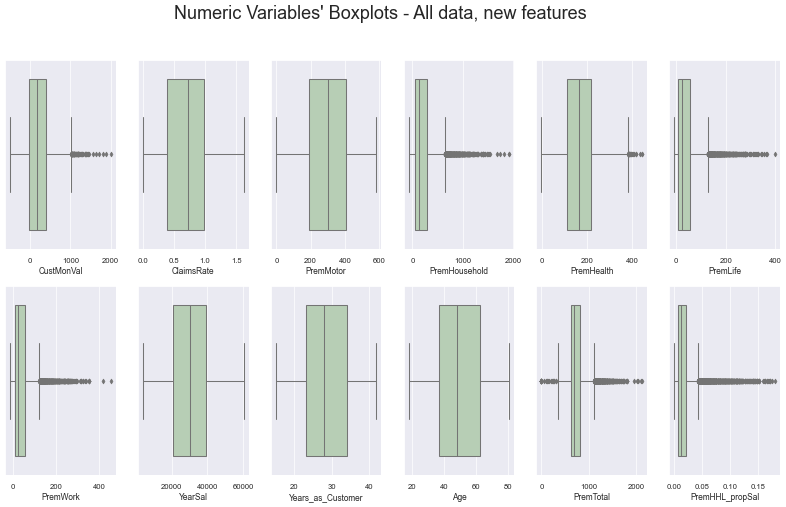

In [43]:
chartBoxPlots( metric_features, df, "Numeric Variables' Boxplots - All data, new features")

460 values above 700 in feature PremHousehold changed to a ceiling of 700.


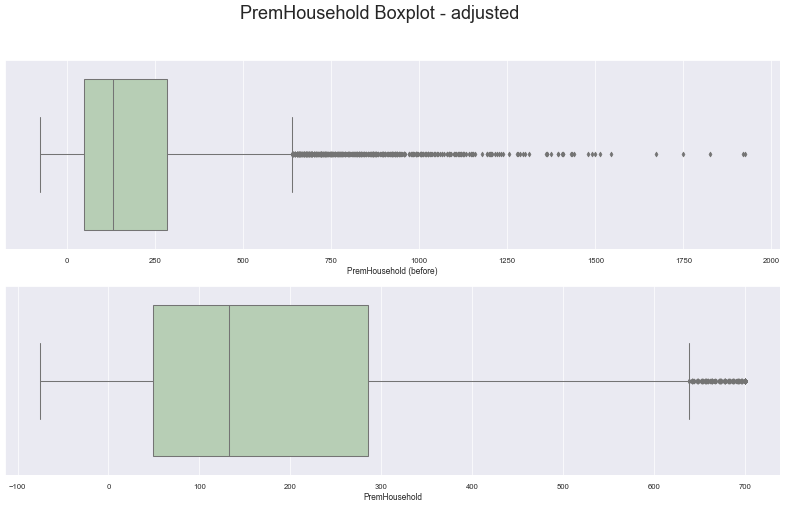

In [44]:
set_max_feature_val( dataframe=df, feature='PremHousehold', maxlimit=700)


407 values above 150 in feature PremLife changed to a ceiling of 150.


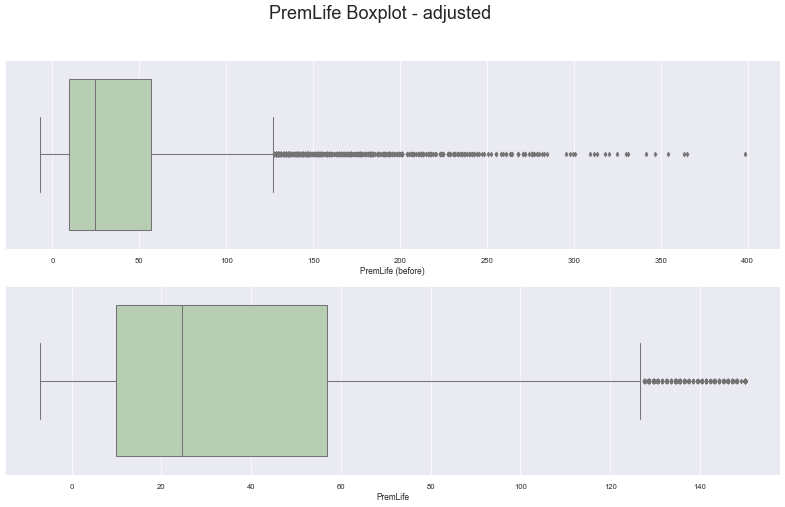

In [45]:
set_max_feature_val( dataframe=df, feature='PremLife', maxlimit=150)


371 values above 150 in feature PremWork changed to a ceiling of 150.


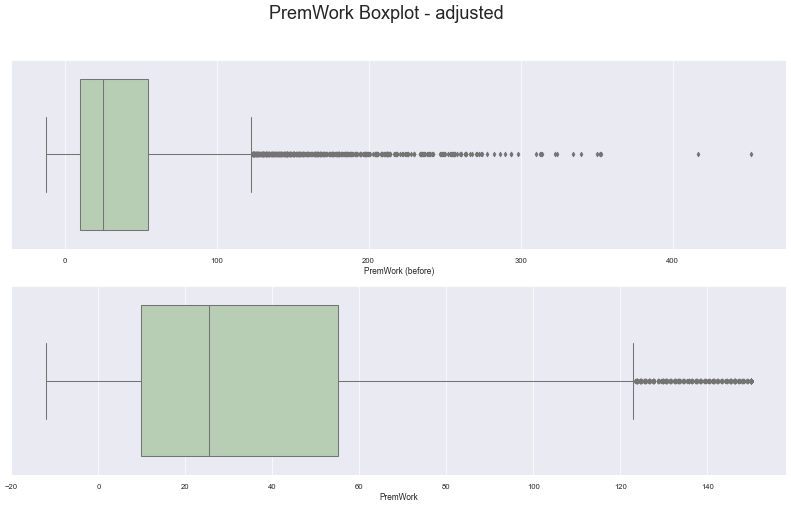

In [46]:
set_max_feature_val( dataframe=df, feature='PremWork', maxlimit=150)


6 values above 1500 in feature CustMonVal changed to a ceiling of 1500.


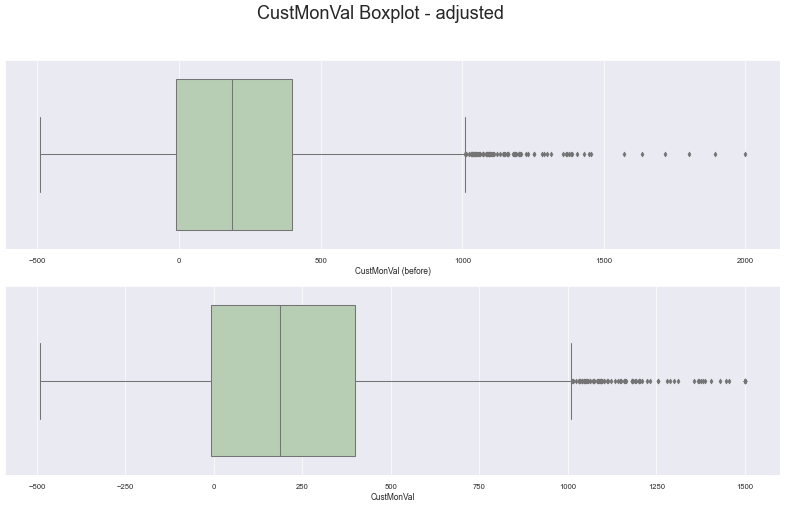

In [47]:
set_max_feature_val( dataframe=df, feature='CustMonVal', maxlimit=1500)


In [48]:
df["PremTotal"] = df['PremMotor'] + df['PremHousehold'] + df['PremHealth'] + df['PremLife'] + df['PremWork']

In [49]:
lst_PremHHL_propSal = []
for i in list(df.index):
    lst_PremHHL_propSal.append(round((max(df['PremHealth'][i],0) + 
                                      max(df['PremLife'][i], 0) + 
                                      max(df['PremHousehold'][i], 0)) 
                                     / (df['YearSal'][i]), 5)
                          )
df['PremHHL_propSal'] = lst_PremHHL_propSal

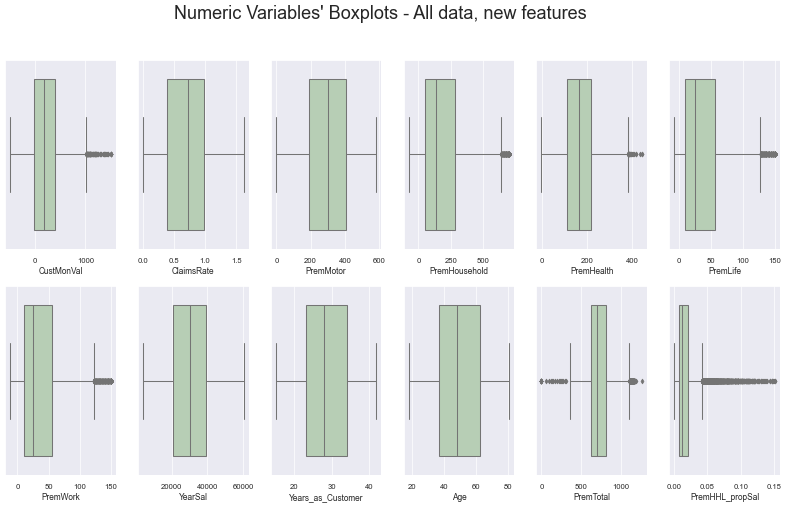

In [50]:
chartBoxPlots( metric_features, df, "Numeric Variables' Boxplots - All data, new features")

In [51]:
print('# of outliers removed:', np.round( df_original.shape[0] - df.shape[0]))
print('Percentage of data kept after removing outliers:', np.round(df.shape[0] / df_original.shape[0], 4))


# of outliers removed: 89
Percentage of data kept after removing outliers: 0.9914


<a class="anchor" id="topic05" /><br>
# Step 5 - Reassess our data, after outlier removal
[Back to Index](#index)<br>

## 5.1 Descriptive statistics - categorical features - bar charts (without outliers)

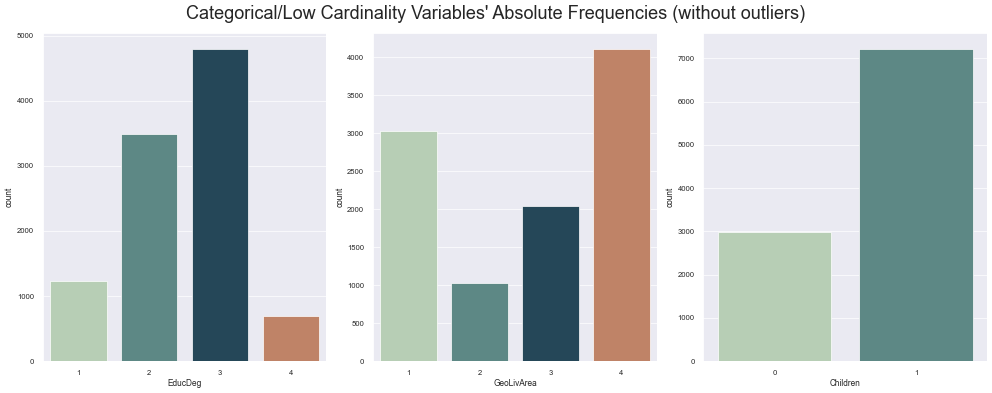

In [52]:
# All Non-Metric Variables' Absolute Frequencies
 
chartBarCharts(categorical_features, df, "Categorical/Low Cardinality Variables' Absolute Frequencies (without outliers)")
#chartBarCharts(['GeoLivArea', 'Children'], df, "Categorical/Low Cardinality Variables' Absolute Frequencies (without outliers)")


## 5.2 Descriptive statistics - numerical features - Histograms (without outliers)

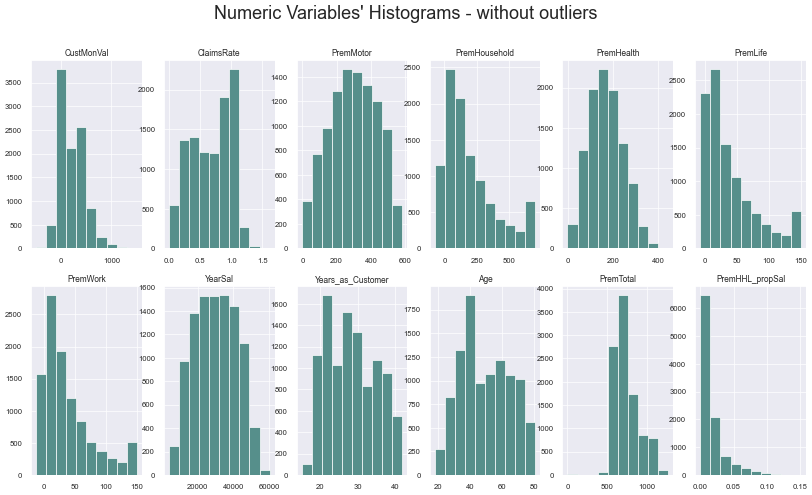

In [53]:
chartHistograms( metric_features, df, "Numeric Variables' Histograms - without outliers")

## 5.3 Descriptive statistics - numerical features - Box Plots

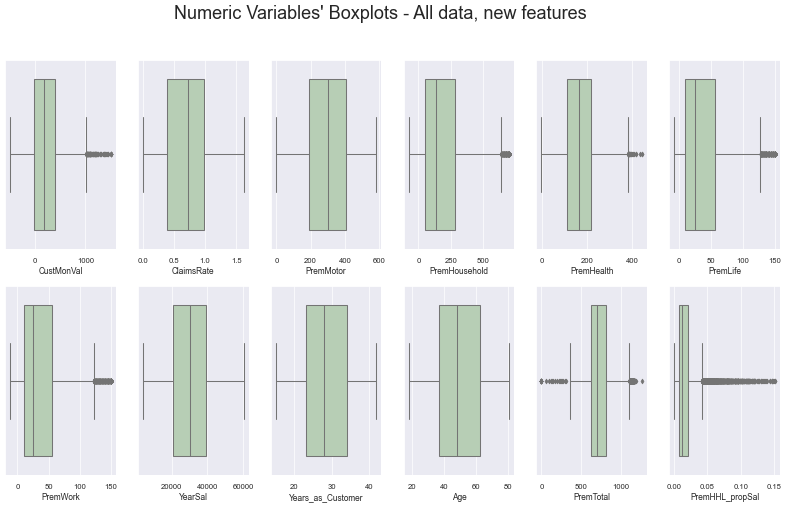

In [54]:
chartBoxPlots( metric_features, df, "Numeric Variables' Boxplots - All data, new features")

## 5.4 - Combined pair plots

top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved


top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved


top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved


top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved


top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved


top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved


<Figure size 400x275 with 0 Axes>

top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved


top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved


top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved


top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved


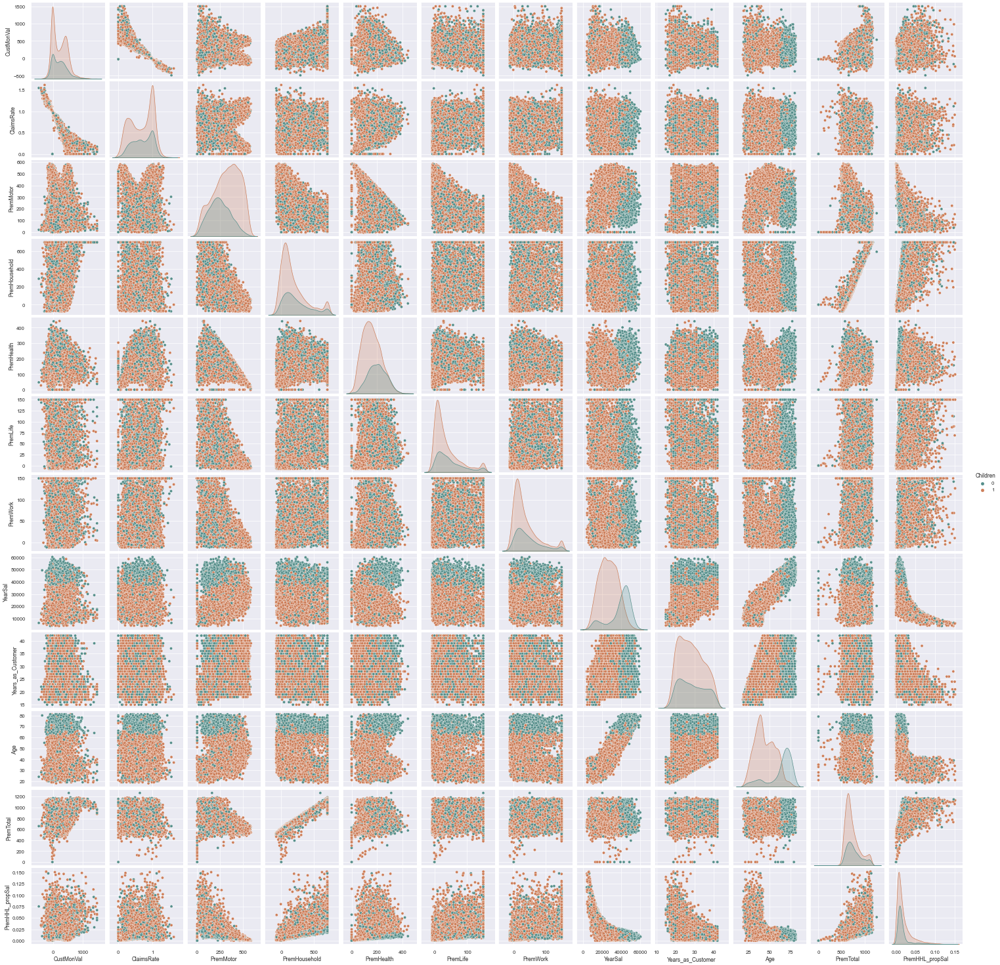

In [55]:
chartPairPlot(metric_features + ['Children'], df, 'Pair Plot', 'Children')


locator: <matplotlib.ticker.AutoLocator object at 0x000002834184C490>
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
findfont: Matching sans\-serif:style=normal:variant=normal:weight=normal:stretch=normal:size=20.0.
findfont: score(FontEntry(fname='C:\\ProgramData\\Anaconda3\\lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\STIXSizFourSymBol.ttf', name='STIXSizeFourSym', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\ProgramData\\Anaconda3\\lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\STIXNonUni.ttf', name='STIXNonUnicode', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\ProgramData\\Anaconda3\\lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\DejaVuSansMono-Oblique.ttf', name='DejaVu Sans Mono', style='oblique', variant='normal', weight=400, stretch='normal'

findfont: score(FontEntry(fname='C:\\ProgramData\\Anaconda3\\lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\STIXNonUniBol.ttf', name='STIXNonUnicode', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\ProgramData\\Anaconda3\\lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\DejaVuSans-BoldOblique.ttf', name='DejaVu Sans', style='oblique', variant='normal', weight=700, stretch='normal', size='scalable')) = 3.335
findfont: score(FontEntry(fname='C:\\ProgramData\\Anaconda3\\lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\STIXGeneralBolIta.ttf', name='STIXGeneral', style='italic', variant='normal', weight=700, stretch='normal', size='scalable')) = 11.335
findfont: score(FontEntry(fname='C:\\ProgramData\\Anaconda3\\lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\STIXSizFiveSymReg.ttf', name='STIXSizeFiveSym', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) =

findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\georgia.ttf', name='Georgia', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\GILI____.TTF', name='Gill Sans MT', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\AKHBRBD.TTF', name='Akhbar MT', style='italic', variant='normal', weight=700, stretch='normal', size='scalable')) = 11.335
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\PER_____.TTF', name='Perpetua', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\PTBLDARC.TTF', name='PT Bold Arch', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\micross.ttf', name='Microsoft Sans Serif', style='normal', varian

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\PTBLSSTR.TTF', name='PT Bold Stars', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\consolab.ttf', name='Consolas', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\FRAMDCN.TTF', name='Franklin Gothic Medium Cond', style='normal', variant='normal', weight=400, stretch='condensed', size='scalable')) = 10.25
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\lucon.ttf', name='Lucida Console', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\GILSANUB.TTF', name='Gill Sans Ultra Bold', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\framdit.ttf', name='Franklin G

findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\BOOKOSBI.TTF', name='Bookman Old Style', style='italic', variant='normal', weight=600, stretch='normal', size='scalable')) = 11.24
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\HARLOWSI.TTF', name='Harlow Solid Italic', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\OLDANOUT.TTF', name='Old Antic Outline', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\trebucit.ttf', name='Trebuchet MS', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\segoeuii.ttf', name='Segoe UI', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\msyhl.ttc', name='Microsoft YaHei', sty

findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\KOUFIBD.TTF', name='Monotype Koufi', style='italic', variant='normal', weight=700, stretch='normal', size='scalable')) = 11.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\FRADM.TTF', name='Franklin Gothic Demi', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\PTSEPBAL.TTF', name='PT Separated Baloon', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\segoeuii.ttf', name='Segoe UI', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\BOOKOS.TTF', name='Bookman Old Style', style='normal', variant='normal', weight=300, stretch='normal', size='scalable')) = 10.145
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\CURLZ___.TTF', name='Curlz MT', style=

findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\calibrili.ttf', name='Calibri', style='italic', variant='normal', weight=300, stretch='normal', size='scalable')) = 11.145
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\palabi.ttf', name='Palatino Linotype', style='italic', variant='normal', weight=700, stretch='normal', size='scalable')) = 11.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\BKANT.TTF', name='Book Antiqua', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\GOUDOSI.TTF', name='Goudy Old Style', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\segoeuil.ttf', name='Segoe UI', style='normal', variant='normal', weight=300, stretch='normal', size='scalable')) = 10.145
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\ARIALNB.TTF', name='Arial', style='normal', variant='no

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\ERASBD.TTF', name='Eras Bold ITC', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\PLAYBILL.TTF', name='Playbill', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\BRLNSDB.TTF', name='Berlin Sans FB Demi', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\GOUDOSB.TTF', name='Goudy Old Style', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\VIVALDII.TTF', name='Vivaldi', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\PERTIBD.TTF', name='Perpetua Titling MT', style='nor

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\verdanab.ttf', name='Verdana', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\calibril.ttf', name='Calibri', style='normal', variant='normal', weight=300, stretch='normal', size='scalable')) = 10.145
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\JUICE___.TTF', name='Juice ITC', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\MOD20.TTF', name='Modern No. 20', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\PTBLDHAD.TTF', name='PT Bold Heading', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\PER_____.TTF', name='Perpetua', style='normal', variant='norma

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\georgiab.ttf', name='Georgia', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\ebrimabd.ttf', name='Ebrima', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\Gabriola.ttf', name='Gabriola', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\TCCB____.TTF', name='Tw Cen MT Condensed', style='normal', variant='normal', weight=700, stretch='condensed', size='scalable')) = 10.535
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\verdanaz.ttf', name='Verdana', style='italic', variant='normal', weight=700, stretch='normal', size='scalable')) = 11.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\INFROMAN.TTF', name='Informal Roman', style='normal', vari

findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\BOD_BLAI.TTF', name='Bodoni MT', style='italic', variant='normal', weight=900, stretch='normal', size='scalable')) = 11.525
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\LSANSI.TTF', name='Lucida Sans', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\SPINDSHD.TTF', name='Simple Indust Shaded', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\FRAHV.TTF', name='Franklin Gothic Heavy', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\BRLNSDB.TTF', name='Berlin Sans FB Demi', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\PERB____.TTF', name='Perpetua', styl

findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\TCCEB.TTF', name='Tw Cen MT Condensed Extra Bold', style='normal', variant='normal', weight=400, stretch='condensed', size='scalable')) = 10.25
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\symbol.ttf', name='Symbol', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\LSANS.TTF', name='Lucida Sans', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\SNAP____.TTF', name='Snap ITC', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\gadugib.ttf', name='Gadugi', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\LBRITED.TTF', name='Lucida Bright', style='normal', vari

findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\MUDIR.TTF', name='Mudir MT', style='normal', variant='normal', weight=600, stretch='normal', size='scalable')) = 10.24
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\TCM_____.TTF', name='Tw Cen MT', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\verdana.ttf', name='Verdana', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\YuGothB.ttc', name='Yu Gothic', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\FELIXTI.TTF', name='Felix Titling', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\constanz.ttf', name='Constantia', style='italic', variant='normal', wei

findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\COPRGTB.TTF', name='Copperplate Gothic Bold', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\SPINDOUT.TTF', name='Simple Indust Outline', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\GOTHICB.TTF', name='Century Gothic', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\BOOKOSI.TTF', name='Bookman Old Style', style='italic', variant='normal', weight=300, stretch='normal', size='scalable')) = 11.145
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\MISTRAL.TTF', name='Mistral', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\AGENCYR.TTF', name='Agency FB', 

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\l_10646.ttf', name='Lucida Sans Unicode', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\CURLZ___.TTF', name='Curlz MT', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\CALIFR.TTF', name='Californian FB', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\LFAXD.TTF', name='Lucida Fax', style='normal', variant='normal', weight=600, stretch='normal', size='scalable')) = 10.24
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\GIGI.TTF', name='Gigi', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\segoeuib.ttf', name='Segoe UI', style='normal', variant='normal', w

findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\BRITANIC.TTF', name='Britannic Bold', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\trebucbd.ttf', name='Trebuchet MS', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\SitkaVF-Italic.ttf', name='Sitka', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\PALSCRI.TTF', name='Palace Script MT', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\SNAP____.TTF', name='Snap ITC', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\webdings.ttf', name='Webdings', style='normal', var

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\DUBAI-LIGHT.TTF', name='Dubai', style='normal', variant='normal', weight=300, stretch='normal', size='scalable')) = 10.145
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\couri.ttf', name='Courier New', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\timesbi.ttf', name='Times New Roman', style='italic', variant='normal', weight=700, stretch='normal', size='scalable')) = 11.335
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\PTSEPBAL.TTF', name='PT Separated Baloon', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\timesbd.ttf', name='Times New Roman', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\BRLNSB.TTF', name='Berlin Sans FB', style='nor

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\PERI____.TTF', name='Perpetua', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\BOD_PSTC.TTF', name='Bodoni MT', style='normal', variant='normal', weight=300, stretch='normal', size='scalable')) = 10.145
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\consolai.ttf', name='Consolas', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\msjh.ttc', name='Microsoft JhengHei', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\Gabriola.ttf', name='Gabriola', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\cambriai.ttf', name='Cambria', style='italic', variant='normal',

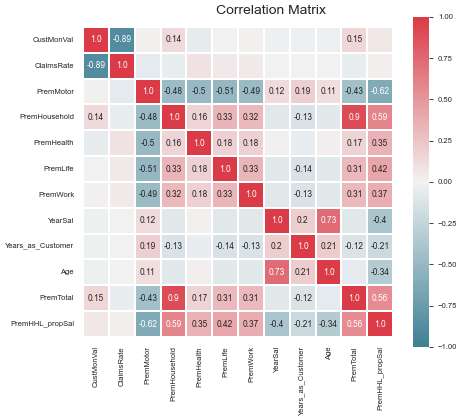

In [56]:
correlmatrix( df, metric_features, correl_method="kendall", decimals=2, shownumbabove=0.1, pfigsize=(10,8))


## 5.5 Remove features

#### Removed features
- ClaimsRate
- PremTotal

In [57]:
dfc = df.copy()

In [58]:
# remove features based on the correlation matrix
metric_features.remove('ClaimsRate')
metric_features.remove('PremTotal')
#metric_features.remove('CustMonVal')


client_value.remove('PremTotal')
client_value.remove('ClaimsRate')
#client_value.remove('CustMonVal')


In [59]:
df = dfc.copy()
df.shape

(10207, 16)

In [60]:
df = df[metric_features + categorical_features]


locator: <matplotlib.ticker.AutoLocator object at 0x000002833AFC7C10>
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved


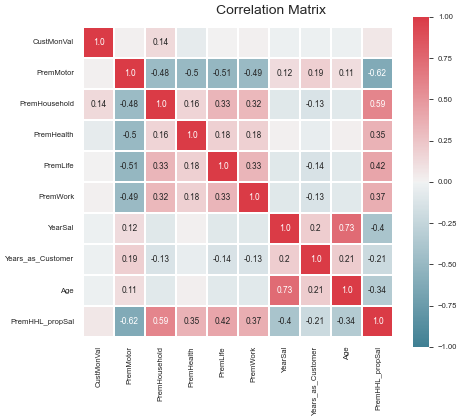

In [61]:
correlmatrix( df, metric_features, correl_method="kendall", decimals=2, shownumbabove=0.1, pfigsize=(10,8))


## 5.6 Scaling

In [62]:
# Use MinMaxScaler to scale the data
#scaler = StandardScaler()
scaler = RobustScaler()

In [63]:
dfscaled = pd.DataFrame(scaler.fit_transform(df[metric_features]), index=df.index, columns=metric_features)


In [64]:
dfscaled = pd.concat([df.drop(columns=metric_features), dfscaled], axis=1)


<a class="anchor" id="topic06" /><br>
# 6. Clustering
[Back to Index](#index)

<a class="anchor" id="topic06.01" /><br>
## 6.1 Hieraquical Clustering + KPrototype without segmentation

**Dendrogram to choose the optimal number of clusters**

findfont: Matching sans\-serif:style=normal:variant=normal:weight=normal:stretch=normal:size=5.0.
findfont: score(FontEntry(fname='C:\\ProgramData\\Anaconda3\\lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\STIXSizFourSymBol.ttf', name='STIXSizeFourSym', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\ProgramData\\Anaconda3\\lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\STIXNonUni.ttf', name='STIXNonUnicode', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\ProgramData\\Anaconda3\\lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\DejaVuSansMono-Oblique.ttf', name='DejaVu Sans Mono', style='oblique', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.05
findfont: score(FontEntry(fname='C:\\ProgramData\\Anaconda3\\lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\cmtt10.ttf', name='cmtt10', 

findfont: score(FontEntry(fname='C:\\ProgramData\\Anaconda3\\lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\DejaVuSans-BoldOblique.ttf', name='DejaVu Sans', style='oblique', variant='normal', weight=700, stretch='normal', size='scalable')) = 3.335
findfont: score(FontEntry(fname='C:\\ProgramData\\Anaconda3\\lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\STIXGeneralBolIta.ttf', name='STIXGeneral', style='italic', variant='normal', weight=700, stretch='normal', size='scalable')) = 11.335
findfont: score(FontEntry(fname='C:\\ProgramData\\Anaconda3\\lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\STIXSizFiveSymReg.ttf', name='STIXSizeFiveSym', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\ProgramData\\Anaconda3\\lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\STIXSizTwoSymReg.ttf', name='STIXSizeTwoSym', style='normal', variant='normal', weight=400, stretch='normal', size='scalable'))

findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\GILI____.TTF', name='Gill Sans MT', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\AKHBRBD.TTF', name='Akhbar MT', style='italic', variant='normal', weight=700, stretch='normal', size='scalable')) = 11.335
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\PER_____.TTF', name='Perpetua', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\PTBLDARC.TTF', name='PT Bold Arch', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\micross.ttf', name='Microsoft Sans Serif', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\SitkaVF-Italic.ttf', name='Sitka', style='italic', v

findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\consolab.ttf', name='Consolas', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\FRAMDCN.TTF', name='Franklin Gothic Medium Cond', style='normal', variant='normal', weight=400, stretch='condensed', size='scalable')) = 10.25
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\lucon.ttf', name='Lucida Console', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\GILSANUB.TTF', name='Gill Sans Ultra Bold', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\framdit.ttf', name='Franklin Gothic Medium', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\BOD_CR.TTF', name='Bod

findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\HARLOWSI.TTF', name='Harlow Solid Italic', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\OLDANOUT.TTF', name='Old Antic Outline', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\trebucit.ttf', name='Trebuchet MS', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\segoeuii.ttf', name='Segoe UI', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\msyhl.ttc', name='Microsoft YaHei', style='normal', variant='normal', weight=290, stretch='normal', size='scalable')) = 10.1545
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\corbel.ttf', name='Corbel', style='normal'

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\FRADM.TTF', name='Franklin Gothic Demi', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\PTSEPBAL.TTF', name='PT Separated Baloon', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\segoeuii.ttf', name='Segoe UI', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\BOOKOS.TTF', name='Bookman Old Style', style='normal', variant='normal', weight=300, stretch='normal', size='scalable')) = 10.145
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\CURLZ___.TTF', name='Curlz MT', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\simsunb.ttf', name='SimSun-ExtB', style='nor

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\palabi.ttf', name='Palatino Linotype', style='italic', variant='normal', weight=700, stretch='normal', size='scalable')) = 11.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\BKANT.TTF', name='Book Antiqua', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\GOUDOSI.TTF', name='Goudy Old Style', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\segoeuil.ttf', name='Segoe UI', style='normal', variant='normal', weight=300, stretch='normal', size='scalable')) = 10.145
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\ARIALNB.TTF', name='Arial', style='normal', variant='normal', weight=700, stretch='condensed', size='scalable')) = 0.5349999999999999
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\DWNSPOUT.TTF', name='Diwani Simple Outline',

findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\PLAYBILL.TTF', name='Playbill', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\BRLNSDB.TTF', name='Berlin Sans FB Demi', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\GOUDOSB.TTF', name='Goudy Old Style', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\VIVALDII.TTF', name='Vivaldi', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\PERTIBD.TTF', name='Perpetua Titling MT', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\BRLNSB.TTF', name='Berlin Sans FB', style='n

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\verdanab.ttf', name='Verdana', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\calibril.ttf', name='Calibri', style='normal', variant='normal', weight=300, stretch='normal', size='scalable')) = 10.145
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\JUICE___.TTF', name='Juice ITC', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\MOD20.TTF', name='Modern No. 20', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\PTBLDHAD.TTF', name='PT Bold Heading', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\PER_____.TTF', name='Perpetua', style='normal', variant='norma

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\georgiab.ttf', name='Georgia', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\ebrimabd.ttf', name='Ebrima', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\Gabriola.ttf', name='Gabriola', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\TCCB____.TTF', name='Tw Cen MT Condensed', style='normal', variant='normal', weight=700, stretch='condensed', size='scalable')) = 10.535
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\verdanaz.ttf', name='Verdana', style='italic', variant='normal', weight=700, stretch='normal', size='scalable')) = 11.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\INFROMAN.TTF', name='Informal Roman', style='normal', vari

findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\BOD_BLAI.TTF', name='Bodoni MT', style='italic', variant='normal', weight=900, stretch='normal', size='scalable')) = 11.525
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\LSANSI.TTF', name='Lucida Sans', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\SPINDSHD.TTF', name='Simple Indust Shaded', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\FRAHV.TTF', name='Franklin Gothic Heavy', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\BRLNSDB.TTF', name='Berlin Sans FB Demi', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\PERB____.TTF', name='Perpetua', styl

findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\TCCEB.TTF', name='Tw Cen MT Condensed Extra Bold', style='normal', variant='normal', weight=400, stretch='condensed', size='scalable')) = 10.25
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\symbol.ttf', name='Symbol', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\LSANS.TTF', name='Lucida Sans', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\SNAP____.TTF', name='Snap ITC', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\gadugib.ttf', name='Gadugi', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\LBRITED.TTF', name='Lucida Bright', style='normal', vari

findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\MUDIR.TTF', name='Mudir MT', style='normal', variant='normal', weight=600, stretch='normal', size='scalable')) = 10.24
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\TCM_____.TTF', name='Tw Cen MT', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\verdana.ttf', name='Verdana', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\YuGothB.ttc', name='Yu Gothic', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\FELIXTI.TTF', name='Felix Titling', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\constanz.ttf', name='Constantia', style='italic', variant='normal', wei

findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\COPRGTB.TTF', name='Copperplate Gothic Bold', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\SPINDOUT.TTF', name='Simple Indust Outline', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\GOTHICB.TTF', name='Century Gothic', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\BOOKOSI.TTF', name='Bookman Old Style', style='italic', variant='normal', weight=300, stretch='normal', size='scalable')) = 11.145
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\MISTRAL.TTF', name='Mistral', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\AGENCYR.TTF', name='Agency FB', 

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\l_10646.ttf', name='Lucida Sans Unicode', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\CURLZ___.TTF', name='Curlz MT', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\CALIFR.TTF', name='Californian FB', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\LFAXD.TTF', name='Lucida Fax', style='normal', variant='normal', weight=600, stretch='normal', size='scalable')) = 10.24
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\GIGI.TTF', name='Gigi', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\segoeuib.ttf', name='Segoe UI', style='normal', variant='normal', w

findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\BRITANIC.TTF', name='Britannic Bold', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\trebucbd.ttf', name='Trebuchet MS', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\SitkaVF-Italic.ttf', name='Sitka', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\PALSCRI.TTF', name='Palace Script MT', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\SNAP____.TTF', name='Snap ITC', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\webdings.ttf', name='Webdings', style='normal', var

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\DUBAI-LIGHT.TTF', name='Dubai', style='normal', variant='normal', weight=300, stretch='normal', size='scalable')) = 10.145
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\couri.ttf', name='Courier New', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\timesbi.ttf', name='Times New Roman', style='italic', variant='normal', weight=700, stretch='normal', size='scalable')) = 11.335
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\PTSEPBAL.TTF', name='PT Separated Baloon', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\timesbd.ttf', name='Times New Roman', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\BRLNSB.TTF', name='Berlin Sans FB', style='nor

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\PERI____.TTF', name='Perpetua', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\BOD_PSTC.TTF', name='Bodoni MT', style='normal', variant='normal', weight=300, stretch='normal', size='scalable')) = 10.145
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\consolai.ttf', name='Consolas', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\msjh.ttc', name='Microsoft JhengHei', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\Gabriola.ttf', name='Gabriola', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\cambriai.ttf', name='Cambria', style='italic', variant='normal',

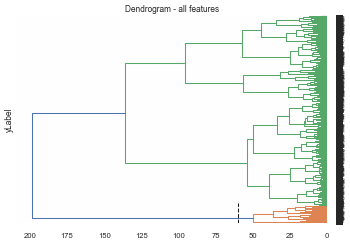

In [65]:
chartDendrogram( metric_features, dfscaled, Title="Dendrogram - all features", plinkage="ward", pn_clusters=None, pyLabel="yLabel", py_threshold = 60)


**Creating clusters with Kmeans with the number of clusters chosen**

In [66]:
categorical_index = list(range(0,3))
clus = KPrototypes(n_clusters=4, random_state=g_random_state, n_jobs=-1)
clus.fit_predict(dfscaled, categorical=categorical_index)

#new column for cluster labels associated with each subject
# Update records with the cluster label for Kprototype
dfscaled['Cluster_kp'] = clus.labels_
df['Cluster_kp'] = clus.labels_

In [67]:
calc_r2(pdataframe=dfscaled[metric_features], arr_clusters=df['Cluster_kp'], save="True", model="Hier.Cl+KProt", features="All")


R^2 score: 0.5366946060610271
Model: Hier.Cl+KProt
Using features: All.


0.5366946060610271

We also tried with less clusters and with more clusters.

In [68]:
categorical_index = list(range(0,3))
clus = KPrototypes(n_clusters=2, random_state=g_random_state, n_jobs=-1)
clus.fit_predict(dfscaled, categorical=categorical_index)

calc_r2(pdataframe=dfscaled[metric_features], arr_clusters=clus.labels_)


R^2 score: 0.2356123950669664
Model: Clustering model
Using features: (all).


0.2356123950669664

In [69]:
categorical_index = list(range(0,3))
clus = KPrototypes(n_clusters=6, random_state=g_random_state, n_jobs=-1)
clus.fit_predict(dfscaled, categorical=categorical_index)

calc_r2(pdataframe=dfscaled[metric_features], arr_clusters=clus.labels_)


R^2 score: 0.5904111098325355
Model: Clustering model
Using features: (all).


0.5904111098325355

Less clusters caused a significant drop in the R2 score; more clusters did not significantly increase the R2 score, so we ended up with 5 clusters.

In [70]:
dfscaled.groupby(['Cluster_kp'])['Cluster_kp'].count()

Cluster_kp
0    2790
1     882
2    2158
3    4377
Name: Cluster_kp, dtype: int64

findfont: Matching sans\-serif:style=normal:variant=normal:weight=bold:stretch=normal:size=12.0.
findfont: score(FontEntry(fname='C:\\ProgramData\\Anaconda3\\lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\STIXSizFourSymBol.ttf', name='STIXSizeFourSym', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\ProgramData\\Anaconda3\\lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\STIXNonUni.ttf', name='STIXNonUnicode', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\ProgramData\\Anaconda3\\lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\DejaVuSansMono-Oblique.ttf', name='DejaVu Sans Mono', style='oblique', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.335
findfont: score(FontEntry(fname='C:\\ProgramData\\Anaconda3\\lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\cmtt10.ttf', name='cmtt10', 

findfont: score(FontEntry(fname='C:\\ProgramData\\Anaconda3\\lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\DejaVuSans-BoldOblique.ttf', name='DejaVu Sans', style='oblique', variant='normal', weight=700, stretch='normal', size='scalable')) = 3.05
findfont: score(FontEntry(fname='C:\\ProgramData\\Anaconda3\\lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\STIXGeneralBolIta.ttf', name='STIXGeneral', style='italic', variant='normal', weight=700, stretch='normal', size='scalable')) = 11.05
findfont: score(FontEntry(fname='C:\\ProgramData\\Anaconda3\\lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\STIXSizFiveSymReg.ttf', name='STIXSizeFiveSym', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\ProgramData\\Anaconda3\\lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\STIXSizTwoSymReg.ttf', name='STIXSizeTwoSym', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) 

findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\GILI____.TTF', name='Gill Sans MT', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.335
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\AKHBRBD.TTF', name='Akhbar MT', style='italic', variant='normal', weight=700, stretch='normal', size='scalable')) = 11.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\PER_____.TTF', name='Perpetua', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\PTBLDARC.TTF', name='PT Bold Arch', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\micross.ttf', name='Microsoft Sans Serif', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\SitkaVF-Italic.ttf', name='Sitka', style='italic'

findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\consolab.ttf', name='Consolas', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\FRAMDCN.TTF', name='Franklin Gothic Medium Cond', style='normal', variant='normal', weight=400, stretch='condensed', size='scalable')) = 10.535
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\lucon.ttf', name='Lucida Console', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\GILSANUB.TTF', name='Gill Sans Ultra Bold', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\framdit.ttf', name='Franklin Gothic Medium', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\BOD_CR.TTF', name='

findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\HARLOWSI.TTF', name='Harlow Solid Italic', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.335
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\OLDANOUT.TTF', name='Old Antic Outline', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\trebucit.ttf', name='Trebuchet MS', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\segoeuii.ttf', name='Segoe UI', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.335
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\msyhl.ttc', name='Microsoft YaHei', style='normal', variant='normal', weight=290, stretch='normal', size='scalable')) = 10.4395
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\corbel.ttf', name='Corbel', style='nor

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\FRADM.TTF', name='Franklin Gothic Demi', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\PTSEPBAL.TTF', name='PT Separated Baloon', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\segoeuii.ttf', name='Segoe UI', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\BOOKOS.TTF', name='Bookman Old Style', style='normal', variant='normal', weight=300, stretch='normal', size='scalable')) = 10.43
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\CURLZ___.TTF', name='Curlz MT', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\simsunb.ttf', name='SimSun-ExtB', style='

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\palabi.ttf', name='Palatino Linotype', style='italic', variant='normal', weight=700, stretch='normal', size='scalable')) = 11.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\BKANT.TTF', name='Book Antiqua', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\GOUDOSI.TTF', name='Goudy Old Style', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\segoeuil.ttf', name='Segoe UI', style='normal', variant='normal', weight=300, stretch='normal', size='scalable')) = 10.43
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\ARIALNB.TTF', name='Arial', style='normal', variant='normal', weight=700, stretch='condensed', size='scalable')) = 0.25
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\DWNSPOUT.TTF', name='Diwani Simple Outline', style='normal

findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\PLAYBILL.TTF', name='Playbill', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\BRLNSDB.TTF', name='Berlin Sans FB Demi', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\GOUDOSB.TTF', name='Goudy Old Style', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\VIVALDII.TTF', name='Vivaldi', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\PERTIBD.TTF', name='Perpetua Titling MT', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\BRLNSB.TTF', name='Berlin Sans FB', style='no

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\calibril.ttf', name='Calibri', style='normal', variant='normal', weight=300, stretch='normal', size='scalable')) = 10.43
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\JUICE___.TTF', name='Juice ITC', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\MOD20.TTF', name='Modern No. 20', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\PTBLDHAD.TTF', name='PT Bold Heading', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\PER_____.TTF', name='Perpetua', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\himalaya.ttf', name='Microsoft Himalaya', style='normal', v

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\ebrimabd.ttf', name='Ebrima', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\Gabriola.ttf', name='Gabriola', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\TCCB____.TTF', name='Tw Cen MT Condensed', style='normal', variant='normal', weight=700, stretch='condensed', size='scalable')) = 10.25
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\verdanaz.ttf', name='Verdana', style='italic', variant='normal', weight=700, stretch='normal', size='scalable')) = 11.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\INFROMAN.TTF', name='Informal Roman', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\ROCKI.TTF', name='Rockwell', style='italic', variant=

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\LSANSI.TTF', name='Lucida Sans', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.335
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\SPINDSHD.TTF', name='Simple Indust Shaded', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\FRAHV.TTF', name='Franklin Gothic Heavy', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\BRLNSDB.TTF', name='Berlin Sans FB Demi', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\PERB____.TTF', name='Perpetua', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\GOTHICBI.TTF', name='Century Gothic'

findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\symbol.ttf', name='Symbol', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\LSANS.TTF', name='Lucida Sans', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\SNAP____.TTF', name='Snap ITC', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\gadugib.ttf', name='Gadugi', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\LBRITED.TTF', name='Lucida Bright', style='normal', variant='normal', weight=600, stretch='normal', size='scalable')) = 10.145
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\IMPRISHA.TTF', name='Imprint MT Shadow', style='normal', variant='norma

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\verdana.ttf', name='Verdana', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\YuGothB.ttc', name='Yu Gothic', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\FELIXTI.TTF', name='Felix Titling', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\constanz.ttf', name='Constantia', style='italic', variant='normal', weight=700, stretch='normal', size='scalable')) = 11.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\DTNASKH2.TTF', name='DecoType Naskh Variants', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\cambriab.ttf', name='Cambria', style='normal', var

findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\GOTHICB.TTF', name='Century Gothic', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\BOOKOSI.TTF', name='Bookman Old Style', style='italic', variant='normal', weight=300, stretch='normal', size='scalable')) = 11.43
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\MISTRAL.TTF', name='Mistral', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\AGENCYR.TTF', name='Agency FB', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\ITLOUTAR.TTF', name='Italic Outline Art', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\OCRAEXT.TTF', name='OCR A Extended', style='norm

findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\CALIFR.TTF', name='Californian FB', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\LFAXD.TTF', name='Lucida Fax', style='normal', variant='normal', weight=600, stretch='normal', size='scalable')) = 10.145
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\GIGI.TTF', name='Gigi', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\segoeuib.ttf', name='Segoe UI', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\COPRGTL.TTF', name='Copperplate Gothic Light', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\BOD_BLAR.TTF', name='Bodoni MT', style='normal', variant='

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\SitkaVF-Italic.ttf', name='Sitka', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.335
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\PALSCRI.TTF', name='Palace Script MT', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\SNAP____.TTF', name='Snap ITC', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\webdings.ttf', name='Webdings', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\segoeuiz.ttf', name='Segoe UI', style='italic', variant='normal', weight=700, stretch='normal', size='scalable')) = 11.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\BOOKOSI.TTF', name='Bookman Old Style', style='italic', va

findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\timesbi.ttf', name='Times New Roman', style='italic', variant='normal', weight=700, stretch='normal', size='scalable')) = 11.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\PTSEPBAL.TTF', name='PT Separated Baloon', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\timesbd.ttf', name='Times New Roman', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\BRLNSB.TTF', name='Berlin Sans FB', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\calibriz.ttf', name='Calibri', style='italic', variant='normal', weight=700, stretch='normal', size='scalable')) = 11.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\DUBAI-MEDIUM.TTF', name='Dubai', style='norma

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\consolai.ttf', name='Consolas', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\msjh.ttc', name='Microsoft JhengHei', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\Gabriola.ttf', name='Gabriola', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\cambriai.ttf', name='Cambria', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\impact.ttf', name='Impact', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\DWNSPSTR.TTF', name='Diwani Simple Striped', style='normal', varia

findfont: score(FontEntry(fname='C:\\ProgramData\\Anaconda3\\lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\STIXNonUniIta.ttf', name='STIXNonUnicode', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.05
findfont: score(FontEntry(fname='C:\\ProgramData\\Anaconda3\\lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\DejaVuSansMono-Bold.ttf', name='DejaVu Sans Mono', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\ProgramData\\Anaconda3\\lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\DejaVuSerif-Italic.ttf', name='DejaVu Serif', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.05
findfont: score(FontEntry(fname='C:\\ProgramData\\Anaconda3\\lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\STIXGeneral.ttf', name='STIXGeneral', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
f

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\KOUFIBD.TTF', name='Monotype Koufi', style='italic', variant='normal', weight=700, stretch='normal', size='scalable')) = 11.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\timesbd.ttf', name='Times New Roman', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\COOPBL.TTF', name='Cooper Black', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\georgiab.ttf', name='Georgia', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\GLSNECB.TTF', name='Gill Sans MT Ext Condensed Bold', style='normal', variant='normal', weight=400, stretch='condensed', size='scalable')) = 10.25
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\GOUDOSB.TTF', name='Goudy Old St

findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\AKHBR.TTF', name='Akhbar MT', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\BOD_CBI.TTF', name='Bodoni MT', style='italic', variant='normal', weight=700, stretch='condensed', size='scalable')) = 11.535
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\BOD_CI.TTF', name='Bodoni MT', style='italic', variant='normal', weight=400, stretch='condensed', size='scalable')) = 11.25
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\GIL_____.TTF', name='Gill Sans MT', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\mmrtextb.ttf', name='Myanmar Text', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\seguisli.ttf', name='Segoe UI', style='italic', variant='no

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\LSANSD.TTF', name='Lucida Sans', style='normal', variant='normal', weight=600, stretch='normal', size='scalable')) = 10.24
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\ITCKRIST.TTF', name='Kristen ITC', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\ARBSQDTP.TTF', name='AGA Arabesque Desktop', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\BOD_CI.TTF', name='Bodoni MT', style='italic', variant='normal', weight=400, stretch='condensed', size='scalable')) = 11.25
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\calibrib.ttf', name='Calibri', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\CASTELAR.TTF', name='Castellar', style='normal', vari

findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\cambriaz.ttf', name='Cambria', style='italic', variant='normal', weight=700, stretch='normal', size='scalable')) = 11.335
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\LATINWD.TTF', name='Wide Latin', style='normal', variant='normal', weight=400, stretch='expanded', size='scalable')) = 10.25
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\GOUDYSTO.TTF', name='Goudy Stout', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\KFOUTSHD.TTF', name='Kufi Outline Shaded', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\GILBI___.TTF', name='Gill Sans MT', style='italic', variant='normal', weight=700, stretch='normal', size='scalable')) = 11.335
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\msjh.ttc', name='Microsoft JhengHei', style='norma

findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\PTBLDBRK.TTF', name='PT Bold Broken', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\symbol.ttf', name='Symbol', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\SPBLDRUL.TTF', name='PT Simple Bold Ruled', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\GARA.TTF', name='Garamond', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\FRABK.TTF', name='Franklin Gothic Book', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\msjhbd.ttc', name='Microsoft JhengHei', style='normal

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\ARIALNB.TTF', name='Arial', style='normal', variant='normal', weight=700, stretch='condensed', size='scalable')) = 0.5349999999999999
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\PERBI___.TTF', name='Perpetua', style='italic', variant='normal', weight=700, stretch='normal', size='scalable')) = 11.335
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\seguisbi.ttf', name='Segoe UI', style='italic', variant='normal', weight=600, stretch='normal', size='scalable')) = 11.24
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\constanz.ttf', name='Constantia', style='italic', variant='normal', weight=700, stretch='normal', size='scalable')) = 11.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\mmrtext.ttf', name='Myanmar Text', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\CALISTBI.TTF', name='Calisto MT', style='italic', var

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\GILBI___.TTF', name='Gill Sans MT', style='italic', variant='normal', weight=700, stretch='normal', size='scalable')) = 11.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\SCHLBKBI.TTF', name='Century Schoolbook', style='italic', variant='normal', weight=700, stretch='normal', size='scalable')) = 11.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\consolaz.ttf', name='Consolas', style='italic', variant='normal', weight=700, stretch='normal', size='scalable')) = 11.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\consola.ttf', name='Consolas', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\Nirmala.ttf', name='Nirmala UI', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\SPBLDJUT.TTF', name='Simple Bold Jut Out', style='norma

findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\bahnschrift.ttf', name='Bahnschrift', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\GILLUBCD.TTF', name='Gill Sans Ultra Bold Condensed', style='normal', variant='normal', weight=400, stretch='condensed', size='scalable')) = 10.25
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\CENTAUR.TTF', name='Centaur', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\corbelz.ttf', name='Corbel', style='italic', variant='normal', weight=700, stretch='normal', size='scalable')) = 11.335
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\ELEPHNT.TTF', name='Elephant', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\DTHULUTH.TTF', name='DecoType Thuluth', style=

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\corbell.ttf', name='Corbel', style='normal', variant='normal', weight=300, stretch='normal', size='scalable')) = 10.145
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\verdanaz.ttf', name='Verdana', style='italic', variant='normal', weight=700, stretch='normal', size='scalable')) = 11.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\msyi.ttf', name='Microsoft Yi Baiti', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\comic.ttf', name='Comic Sans MS', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\BROADW.TTF', name='Broadway', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\framd.ttf', name='Franklin Gothic Medium', style='normal', variant='

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\cambria.ttc', name='Cambria', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\HARNGTON.TTF', name='Harrington', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\LFAXI.TTF', name='Lucida Fax', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\BELLI.TTF', name='Bell MT', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\CALIST.TTF', name='Calisto MT', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\COPRGTL.TTF', name='Copperplate Gothic Light', style='normal', variant='norma

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\msyhbd.ttc', name='Microsoft YaHei', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\ARIALNI.TTF', name='Arial', style='italic', variant='normal', weight=400, stretch='condensed', size='scalable')) = 1.25
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\phagspab.ttf', name='Microsoft PhagsPa', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\corbelz.ttf', name='Corbel', style='italic', variant='normal', weight=700, stretch='normal', size='scalable')) = 11.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\ariblk.ttf', name='Arial', style='normal', variant='normal', weight=900, stretch='normal', size='scalable')) = 0.525
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\ebrima.ttf', name='Ebrima', style='normal', variant='normal', wei

findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\SPOUTPAT.TTF', name='Simple Outline Pat', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\msyh.ttc', name='Microsoft YaHei', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\SPOUTPAT.TTF', name='Simple Outline Pat', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\DTNASKH4.TTF', name='DecoType Naskh Swashes', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\comici.ttf', name='Comic Sans MS', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\BSSYM7.TTF', name='Bookshelf Sym

findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\GLECB.TTF', name='Gloucester MT Extra Condensed', style='normal', variant='normal', weight=400, stretch='condensed', size='scalable')) = 10.25
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\ITCKRIST.TTF', name='Kristen ITC', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\tahoma.ttf', name='Tahoma', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\LHANDW.TTF', name='Lucida Handwriting', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\SCHLBKI.TTF', name='Century Schoolbook', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\segoepr.ttf', name='Segoe Print', s

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\AGENCYB.TTF', name='Agency FB', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\CENTURY.TTF', name='Century', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\FRADMIT.TTF', name='Franklin Gothic Demi', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\corbelli.ttf', name='Corbel', style='italic', variant='normal', weight=300, stretch='normal', size='scalable')) = 11.145
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\seguibl.ttf', name='Segoe UI', style='normal', variant='normal', weight=900, stretch='normal', size='scalable')) = 10.525
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\calibrili.ttf', name='Calibri', style='italic', variant='normal

findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\DUBAI-BOLD.TTF', name='Dubai', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\ARABSQ.TTF', name='AGA Arabesque', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\consola.ttf', name='Consolas', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\BELL.TTF', name='Bell MT', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\segmdl2.ttf', name='Segoe MDL2 Assets', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\seguiemj.ttf', name='Segoe UI Emoji', style='normal', variant='norm

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\ELEPHNT.TTF', name='Elephant', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\SitkaVF.ttf', name='Sitka', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\LBRITEI.TTF', name='Lucida Bright', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\SPINDOUT.TTF', name='Simple Indust Outline', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\CALISTI.TTF', name='Calisto MT', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\BAUHS93.TTF', name='Bauhaus 93', style='normal', variant='n

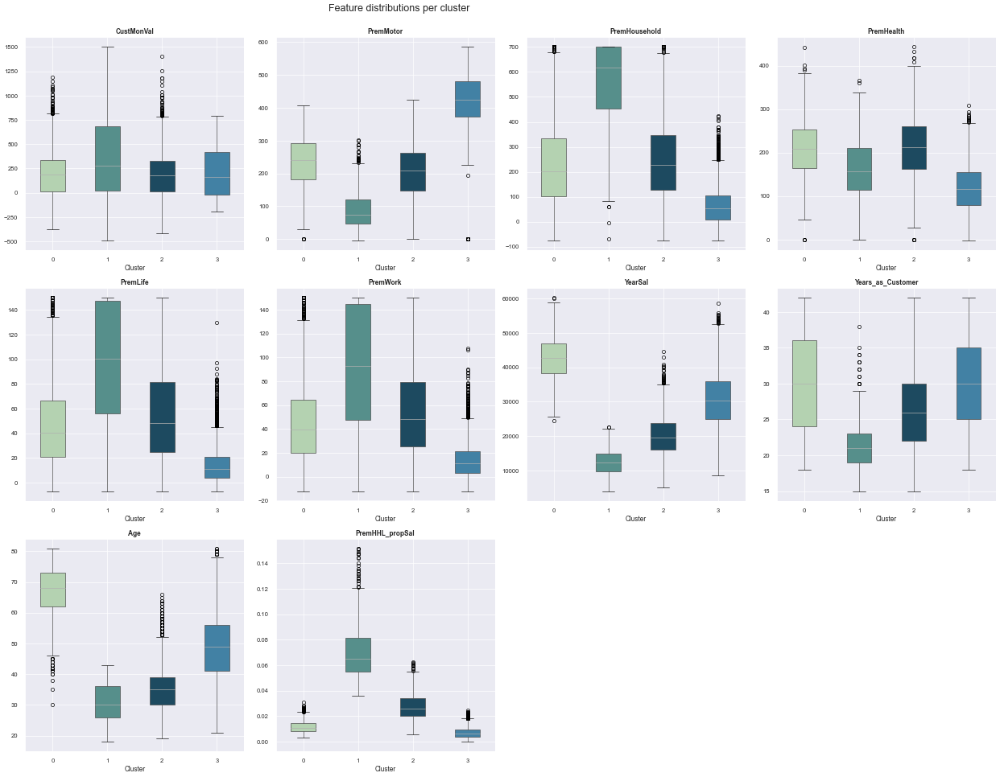

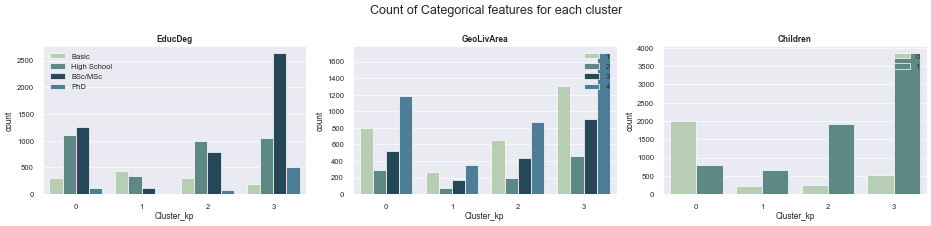

In [71]:
chartCluster(metric_features, categorical_features, data=df, cluster_title='Cluster_kp')


<a class="anchor" id="topic06.02" /><br>
## 6.2 DBSCAN without segmentation

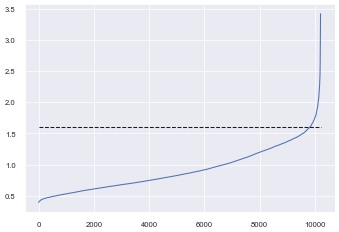

In [72]:
# K-distance graph to find out the right eps value
neigh = NearestNeighbors(n_neighbors=20)
neigh.fit(dfscaled[metric_features])
distances, _ = neigh.kneighbors(dfscaled[metric_features])
distances = np.sort(distances[:, -1])
plt.plot(distances)
plt.hlines(1.6, 0, len(dfscaled), colors="k", linestyles="dashed")
plt.show()

In [73]:
# min_samples >= #features +1
dbscan_clust = DBSCAN(eps=1.6, min_samples = (len(metric_features))*2)

#eps=1, minsamples=50 - 3 clusters, 90% of observations are seen as outliers
#eps=1, minsamples=10 - 29 clusters, 65% of observations are seen as outliers
# min_samples maior aumenta outliers
# eps maior reduz numero clusters

dbscan_list = [x for x in dfscaled.columns if x in metric_features]

dbscan_labels = dbscan_clust.fit_predict(dfscaled[dbscan_list])
#dbscan_labels

# Characterizing the final clusters
df_concat2 = pd.concat((dfscaled, pd.Series(dbscan_labels, name='dbscan_labels')), axis=1)
df_concat2.groupby('dbscan_labels').mean().T
df_concat2.groupby('dbscan_labels').count().T

# Save dbscan clusters information in dataframes df and dfscaled
dfscaled['Cluster_DBScan'] = dbscan_labels
df['Cluster_DBScan'] = dbscan_labels


In [74]:
calc_r2(pdataframe=df_concat2[metric_features], arr_clusters=df_concat2['dbscan_labels'], save="True", model="DBSCAN", features="All")


R^2 score: 0.010859129050444283
Model: DBSCAN
Using features: All.


0.010859129050444283

After a lot of experimenting, the major finding is that DBSCAN is not adequate for our model.
When we reduce eps we get a lot of clusters, but most of the observations are just in one cluster.
When we increase min_samples, we reduce clusters but singificantly increase outliers (cluster=-1)


<a class="anchor" id="topic06.03" /><br>
## 6.3 Self-Organizing Maps - without segmentation

In [75]:
np.random.seed(g_random_state)


sm = sompy.SOMFactory().build(
    dfscaled[metric_features].values, 
    mapsize=[10,10],
    initialization='random', 
    neighborhood='gaussian',
    training='batch',
    lattice='hexa',
    component_names=metric_features
)
sm.train(n_job=4, verbose='info', train_rough_len=100, train_finetune_len=100)



 Training...
 random_initialization took: 0.000000 seconds
 Rough training...
 radius_ini: 4.000000 , radius_final: 1.000000, trainlen: 100

 epoch: 1 ---> elapsed time:  0.033000, quantization error: 3.033983

 epoch: 2 ---> elapsed time:  0.035000, quantization error: 2.923532

 epoch: 3 ---> elapsed time:  0.033000, quantization error: 2.799597

 epoch: 4 ---> elapsed time:  0.034000, quantization error: 2.756230

 epoch: 5 ---> elapsed time:  0.030000, quantization error: 2.742894

 epoch: 6 ---> elapsed time:  0.035000, quantization error: 2.736403

 epoch: 7 ---> elapsed time:  0.030000, quantization error: 2.731790

 epoch: 8 ---> elapsed time:  0.034000, quantization error: 2.728007

 epoch: 9 ---> elapsed time:  0.031000, quantization error: 2.724292

 epoch: 10 ---> elapsed time:  0.029000, quantization error: 2.720532

 epoch: 11 ---> elapsed time:  0.032000, quantization error: 2.716706

 epoch: 12 ---> elapsed time:  0.031000, quantization error: 2.712787

 epoch: 13 ---> 

 epoch: 14 ---> elapsed time:  0.037000, quantization error: 1.688845

 epoch: 15 ---> elapsed time:  0.035000, quantization error: 1.688793

 epoch: 16 ---> elapsed time:  0.037000, quantization error: 1.688585

 epoch: 17 ---> elapsed time:  0.033000, quantization error: 1.688406

 epoch: 18 ---> elapsed time:  0.031000, quantization error: 1.688201

 epoch: 19 ---> elapsed time:  0.034000, quantization error: 1.688081

 epoch: 20 ---> elapsed time:  0.033000, quantization error: 1.688034

 epoch: 21 ---> elapsed time:  0.034000, quantization error: 1.687888

 epoch: 22 ---> elapsed time:  0.035000, quantization error: 1.687674

 epoch: 23 ---> elapsed time:  0.035000, quantization error: 1.687473

 epoch: 24 ---> elapsed time:  0.033000, quantization error: 1.687117

 epoch: 25 ---> elapsed time:  0.035000, quantization error: 1.686803

 epoch: 26 ---> elapsed time:  0.036000, quantization error: 1.686227

 epoch: 27 ---> elapsed time:  0.035000, quantization error: 1.685502

 epoch

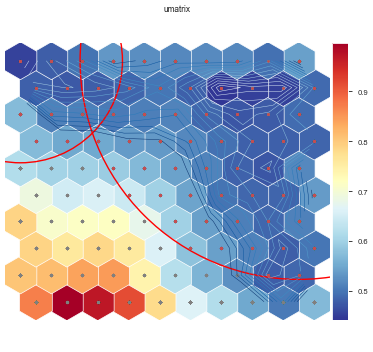

array([[0.45623614, 0.47943754, 0.49848496, 0.53235019, 0.52542279,
        0.51763037, 0.5208083 , 0.51838844, 0.4970235 , 0.54133937],
       [0.48021118, 0.47499377, 0.47794901, 0.48548408, 0.49998203,
        0.48197418, 0.44326699, 0.45371563, 0.45230018, 0.48943091],
       [0.57129947, 0.5117955 , 0.50913272, 0.50466199, 0.50934692,
        0.51429845, 0.4876239 , 0.4716442 , 0.47779132, 0.4928452 ],
       [0.57205628, 0.54938451, 0.54946628, 0.5368835 , 0.53525987,
        0.51807151, 0.49691364, 0.48183381, 0.48144484, 0.48549343],
       [0.61745645, 0.60325111, 0.60100203, 0.59340482, 0.56981966,
        0.5449162 , 0.51332075, 0.48229471, 0.47348001, 0.51790199],
       [0.68866703, 0.64969669, 0.65786571, 0.64359415, 0.60117242,
        0.54562956, 0.49751202, 0.48825886, 0.48577643, 0.53726317],
       [0.78932562, 0.7083611 , 0.71513367, 0.7174952 , 0.67821451,
        0.60106732, 0.54138609, 0.50958464, 0.48851244, 0.5108026 ],
       [0.78890317, 0.76103722, 0.7836703

In [76]:
#U-matrix
u = sompy.umatrix.UMatrixView(14,14, 'umatrix', show_axis=True, text_size=8, show_text=True)

UMAT = u.show(
    sm, 
    distance=2, 
    row_normalized=False,
    show_data=True, 
    contour=True, # Visualize isomorphic curves
    blob=True
)

np.flip(UMAT[1], axis=1) # U-matrix values - they match with the plot colors

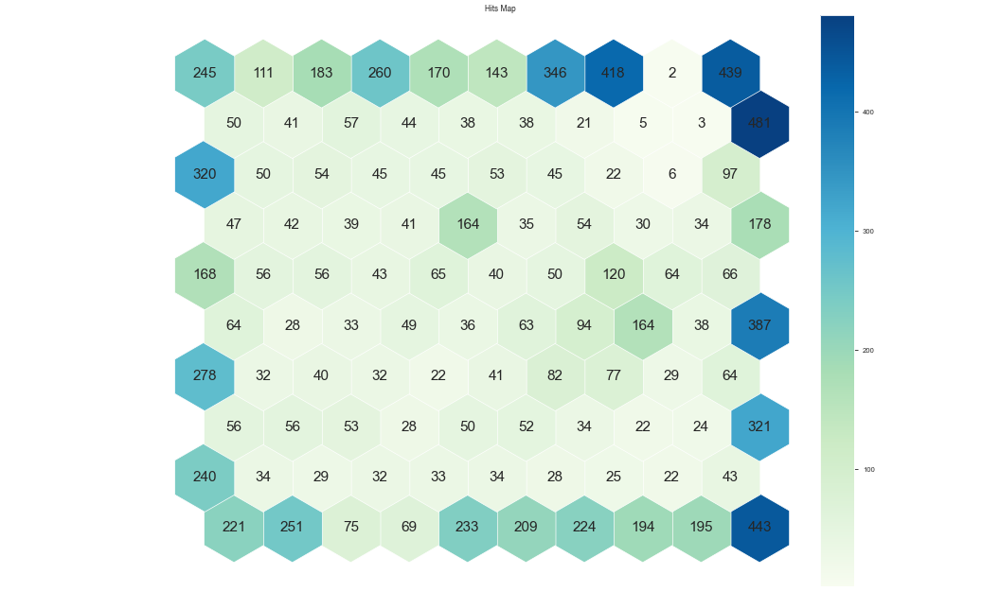

In [77]:
vhts  = BmuHitsView(27,27,"Hits Map")
vhts.show(sm, anotate=True, onlyzeros=False, labelsize=22, cmap="GnBu")
plt.show()


#### Define number of clusters

In [78]:
range_clusters = range(2, 11)

In [79]:
inertia = []
for n_clus in range_clusters:  # iterate over desired ncluster range
    kmclust = KMeans(n_clusters=n_clus, init='k-means++', n_init=15, random_state=g_random_state)
    kmclust.fit(dfscaled[metric_features])
    inertia.append(kmclust.inertia_)  # save the inertia of the given cluster solution

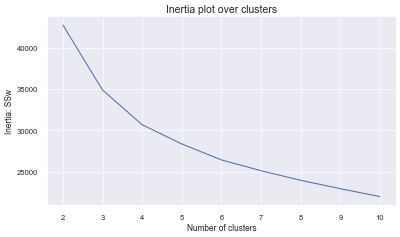

In [80]:
# The inertia plot
plt.figure(figsize=(9,5))
plt.plot(range(2,11), inertia)
#plt.xlim([2, 10]) 
plt.ylabel("Inertia: SSw")
plt.xlabel("Number of clusters")
plt.title("Inertia plot over clusters", size=15)
plt.show()

For n_clusters = 2, the average silhouette_score is : 0.42534977783172007
For n_clusters = 3, the average silhouette_score is : 0.2365356810939147
For n_clusters = 4, the average silhouette_score is : 0.23793555090825877
For n_clusters = 5, the average silhouette_score is : 0.20566012684463944
For n_clusters = 6, the average silhouette_score is : 0.19666375784085646
For n_clusters = 7, the average silhouette_score is : 0.19359109211791342
For n_clusters = 8, the average silhouette_score is : 0.17115210681408766
For n_clusters = 9, the average silhouette_score is : 0.17187325067092307
For n_clusters = 10, the average silhouette_score is : 0.1624984109101876


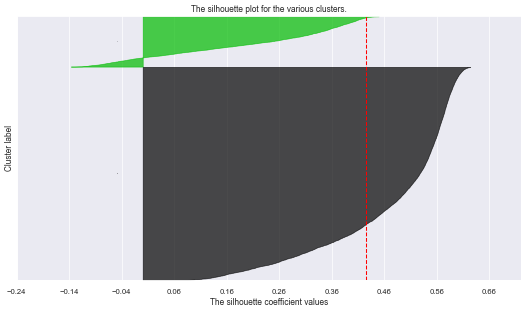

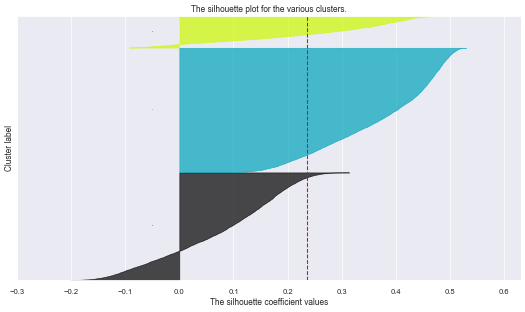

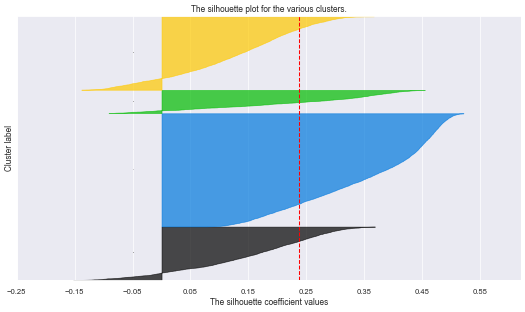

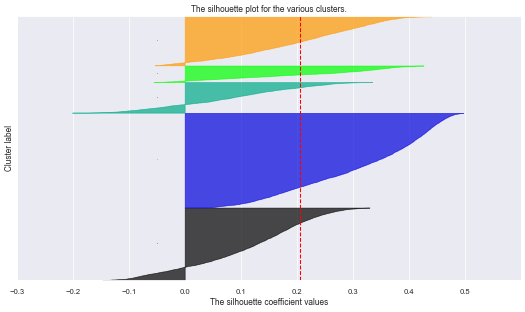

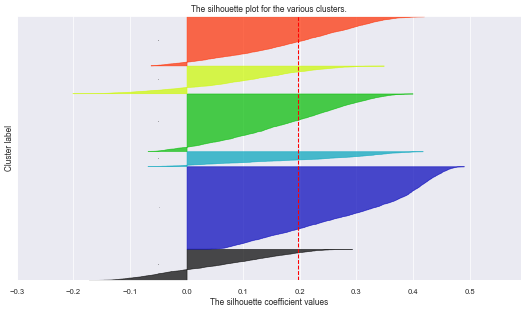

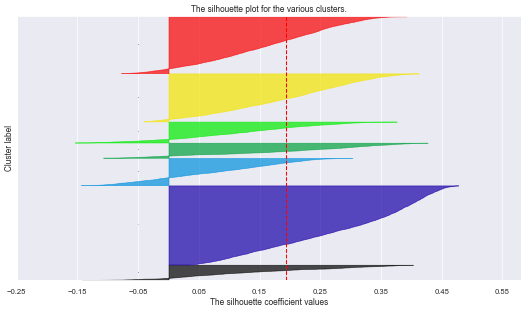

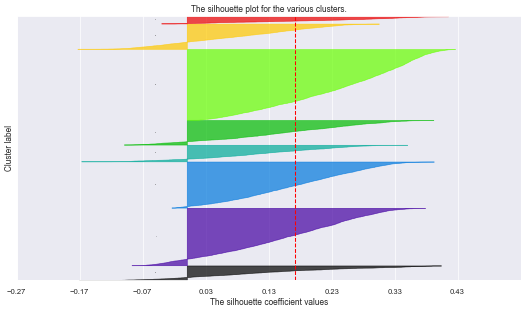

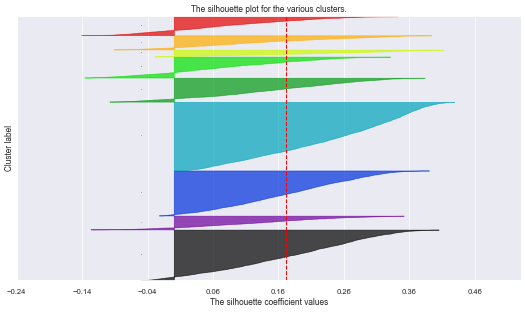

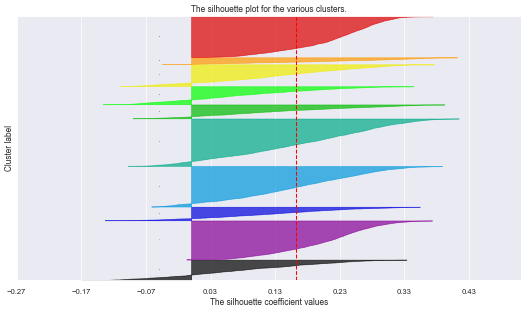

In [81]:
# Adapted from:
# https://scikit-learn.org/stable/auto_examples/cluster/plot_kmeans_silhouette_analysis.html#sphx-glr-auto-examples-cluster-plot-kmeans-silhouette-analysis-py

# Storing average silhouette metric
avg_silhouette = []
for nclus in range_clusters:
    # Skip nclus == 1
    if nclus == 1:
        continue
    
    # Create a figure
    fig = plt.figure(figsize=(13, 7))

    # Initialize the KMeans object with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    kmclust = KMeans(n_clusters=nclus, init='k-means++', n_init=15, random_state=g_random_state)
    cluster_labels = kmclust.fit_predict(dfscaled[metric_features])

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed clusters
    silhouette_avg = silhouette_score(dfscaled[metric_features], cluster_labels)
    avg_silhouette.append(silhouette_avg)
    print(f"For n_clusters = {nclus}, the average silhouette_score is : {silhouette_avg}")

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(dfscaled[metric_features], cluster_labels)

    y_lower = 10
    for i in range(nclus):
        # Aggregate the silhouette scores for samples belonging to cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
        ith_cluster_silhouette_values.sort()
        
        # Get y_upper to demarcate silhouette y range size
        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i
        
        # Filling the silhouette
        color = cm.nipy_spectral(float(i) / nclus)
        plt.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        plt.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    plt.title("The silhouette plot for the various clusters.")
    plt.xlabel("The silhouette coefficient values")
    plt.ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    plt.axvline(x=silhouette_avg, color="red", linestyle="--")
    
    # The silhouette coefficient can range from -1, 1
    xmin, xmax = np.round(sample_silhouette_values.min() -0.1, 2), np.round(sample_silhouette_values.max() + 0.1, 2)
    plt.xlim([xmin, xmax])
    
    # The (nclus+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    plt.ylim([0, len(df[metric_features]) + (nclus + 1) * 10])

    plt.yticks([])  # Clear the yaxis labels / ticks
    plt.xticks(np.arange(xmin, xmax, 0.1))

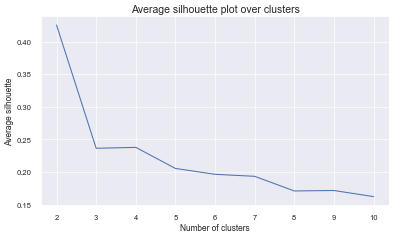

In [82]:
# The average silhouette plot
# The inertia plot
plt.figure(figsize=(9,5))
plt.plot(range(2,11),avg_silhouette)
plt.ylabel("Average silhouette")
plt.xlabel("Number of clusters")
plt.title("Average silhouette plot over clusters", size=15)
plt.show()


In [83]:
n_clusters = 4

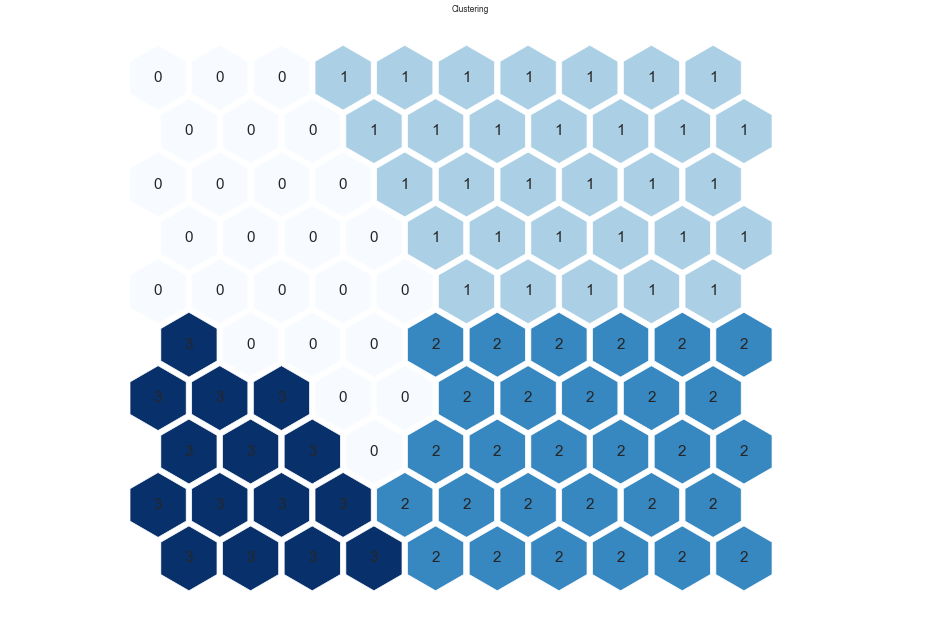

In [84]:
# Perform K-Means clustering on top of the 2500 untis (sm.get_node_vectors() output)
kmeans = KMeans(n_clusters=n_clusters, init='k-means++', n_init=20, random_state=g_random_state)
nodeclus_labels = kmeans.fit_predict(sm.codebook.matrix)
sm.cluster_labels = nodeclus_labels  # setting the cluster labels of sompy

hits = HitMapView(24, 24,"Clustering", text_size=18)
hits.show(sm, anotate=True, onlyzeros=False, labelsize=22, cmap="Blues")
#hits.show(sm, anotate=True, onlyzeros=False, labelsize=14, cmap=['#b4d2b1', '#568f8b', '#1d4a60', '#cd7e59', '#ddb247', '#d15252'])

plt.show()


In [85]:
# Check the nodes and and respective clusters
nodes = sm.codebook.matrix

df_nodes = pd.DataFrame(nodes, columns=metric_features)
df_nodes['Cluster_um_km'] = nodeclus_labels


# df_nodes.groupby(['Cluster_um_km'])['Cluster_um_km'].count()

In [86]:
# Obtaining SOM's BMUs labels
bmus_map = sm.find_bmu(np.array(dfscaled[metric_features]))[0]  # get bmus for each observation in df

df_bmus = pd.DataFrame(
    np.concatenate((dfscaled, np.expand_dims(bmus_map,1)), axis=1),
    index=dfscaled.index, columns=np.append(dfscaled.columns,"BMU")
)


In [87]:
# Get cluster labels for each observation
df_final = df_bmus.merge(df_nodes['Cluster_um_km'], 'left', left_on="BMU", right_index=True)

df["Cluster_um_km"] =       df_final["Cluster_um_km"]
dfscaled["Cluster_um_km"] = df_final["Cluster_um_km"]


In [88]:
# Characterizing the final clusters
df_final.drop(columns='BMU').groupby('Cluster_um_km')[metric_features].mean()

df.groupby('Cluster_um_km')[metric_features].mean()


,CustMonVal,PremMotor,PremHousehold,PremHealth,PremLife,PremWork,YearSal,Years_as_Customer,Age,PremHHL_propSal
Cluster_um_km,,,,,,,,,,
0,170.759932,282.798695,145.936201,208.414253,32.486095,33.831054,21626.285162,27.971774,37.124988,0.019257
1,215.268567,462.895356,42.700889,94.769209,9.231549,9.216415,30461.936430,30.336502,48.994993,0.005388
2,192.187177,266.919610,201.720603,195.110108,41.768884,40.998304,41913.560387,29.788731,65.990154,0.010655
3,317.484764,126.548528,453.744325,176.744325,85.928453,81.714861,16796.818844,23.407602,33.683512,0.050368


In [89]:
calc_r2(pdataframe=df[metric_features], arr_clusters=df["Cluster_um_km"], save="True", model="SOM", features="All")


R^2 score: 0.6956406840752453
Model: SOM
Using features: All.


0.6956406840752453

#### <a class="anchor" id="topic06.04" /><br>
## 6.4 Hieraquical Clustering + KPrototype with segmentation

<a class="anchor" id="topic06.04.01" /><br>
### 6.4.1 Sociodemographic features

In [90]:
dfscaled_kp_sd = dfscaled[Sociodemographic].copy()

#### 6.4.1.1 Create a large number of clusters

In [91]:
dfscaled_kp_sd.columns

Index(['EducDeg', 'Age', 'Children', 'YearSal', 'PremHHL_propSal',
       'GeoLivArea'],
      dtype='object')

In [92]:
categorical_index = [0, 2, 5] ## EducDeg, Children, GeoLivArea
clus_kp_sd = KPrototypes(n_clusters=20, random_state=g_random_state, n_jobs=-1)
clus_kp_sd.fit_predict(dfscaled_kp_sd, categorical=categorical_index)


array([10, 12,  2, ...,  3,  2, 10], dtype=uint16)

#### 6.4.1.2 Dendrogram to choose the optimal number of clusters 

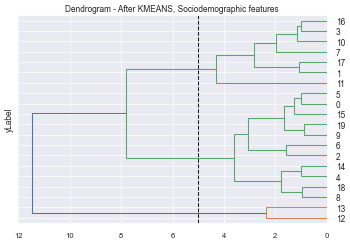

In [93]:
centroids  = clus_kp_sd.cluster_centroids_
pdCentroids = pd.DataFrame(centroids)

chartDendrogram( list(pdCentroids.columns), pdCentroids, Title="Dendrogram - After KMEANS, Sociodemographic features", plinkage="ward", pn_clusters=None, pyLabel="yLabel", py_threshold = 5)


In [94]:
clus_kp_sd = KPrototypes(n_clusters=3, random_state=g_random_state, n_jobs=-1)
clus_kp_sd.fit_predict(dfscaled_kp_sd[Sociodemographic], categorical=categorical_index)

# Update records with the cluster label for Kprototype_Sociodemographics
dfscaled_kp_sd['Cluster_kp_sd'] = clus_kp_sd.labels_
dfscaled['Cluster_kp_sd'] = clus_kp_sd.labels_
df['Cluster_kp_sd'] = clus_kp_sd.labels_


In [95]:
calc_r2(pdataframe=dfscaled_kp_sd, arr_clusters=clus_kp_sd.labels_, save="True", model="Hier.Cl+KProt", features="Sociodemographic")


R^2 score: 0.45177623354980956
Model: Hier.Cl+KProt
Using features: Sociodemographic.


0.45177623354980956

In [96]:
sociometr = [x for x in Sociodemographic if x in metric_features]
sociocat  = [x for x in Sociodemographic if x in categorical_features]

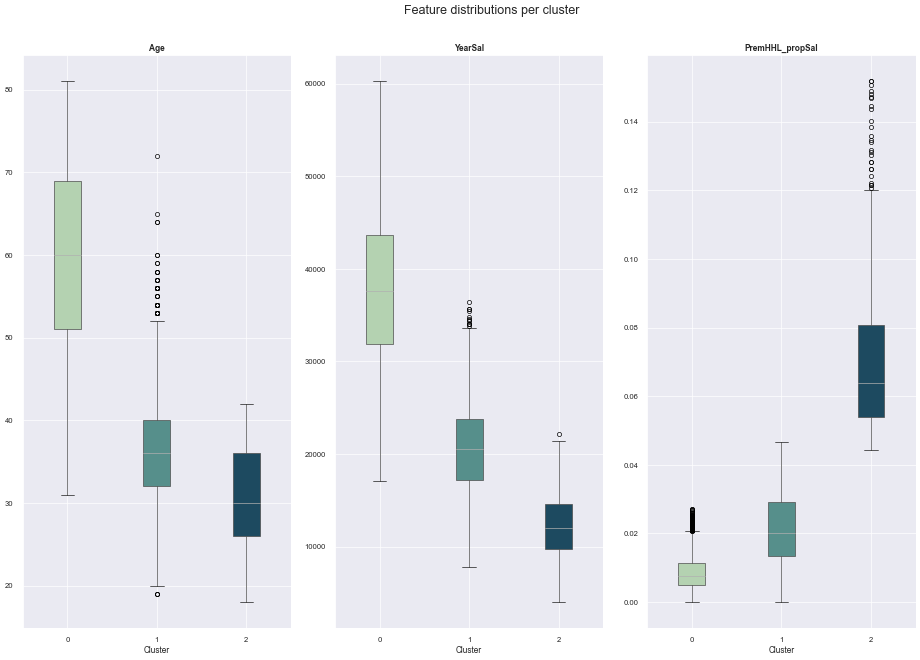

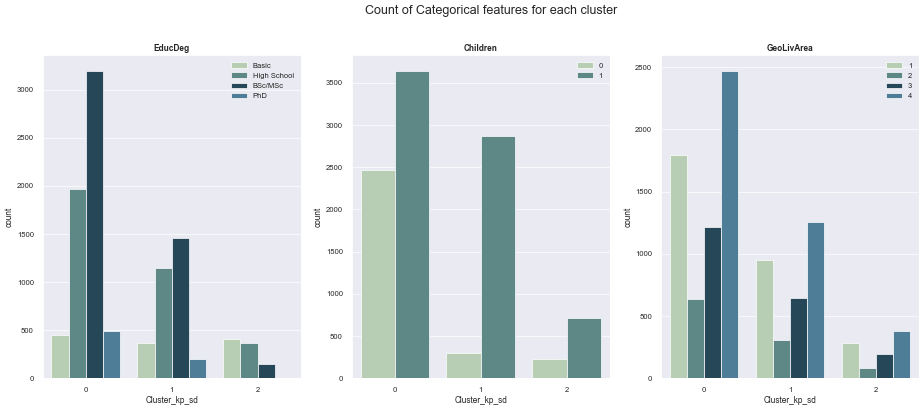

In [97]:
chartCluster(sociometr, sociocat, data=df, cluster_title='Cluster_kp_sd')


<a class="anchor" id="topic06.04.02" /><br>
### 6.4.2 Client Value features

In [98]:
dfscaled_km_cv = dfscaled[client_value].copy()

#### 6.4.2.1 Create a large number of clusters

In [99]:
clus_km_cv = KMeans(n_clusters=25, init='k-means++', random_state=g_random_state)
clus_km_cv.fit_predict(dfscaled_km_cv)
#new column for cluster labels associated with each subject


array([13, 24,  7, ..., 13, 10, 13])

In [100]:
centroids  = clus_km_cv.cluster_centers_
cvCentroids = pd.DataFrame(centroids)


#### 6.4.2.2 Dendrogram to choose the optimal number of clusters 

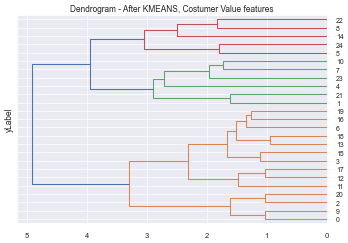

In [101]:
chartDendrogram( list(cvCentroids.columns), cvCentroids, Title="Dendrogram - After KMEANS, Costumer Value features", plinkage="complete", pn_clusters=None, pyLabel="yLabel", py_threshold = None)


In [102]:
clus_km_cv = KMeans(n_clusters=3, init='k-means++', random_state=g_random_state)
clus_km_cv.fit_predict(dfscaled_km_cv)

#new column for cluster labels associated with each subject

# Update records with the cluster label for Kprototype_Sociodemographics
dfscaled_km_cv['Cluster_km_cv'] = clus_km_cv.labels_
dfscaled['Cluster_km_cv'] = clus_km_cv.labels_
df['Cluster_km_cv'] = clus_km_cv.labels_


In [103]:
calc_r2(pdataframe=dfscaled_km_cv, arr_clusters=clus_km_cv.labels_, save="True", model="Hier.Cl+KProt", features="Client Value")


R^2 score: 0.5374094447001179
Model: Hier.Cl+KProt
Using features: Client Value.


0.5374094447001179

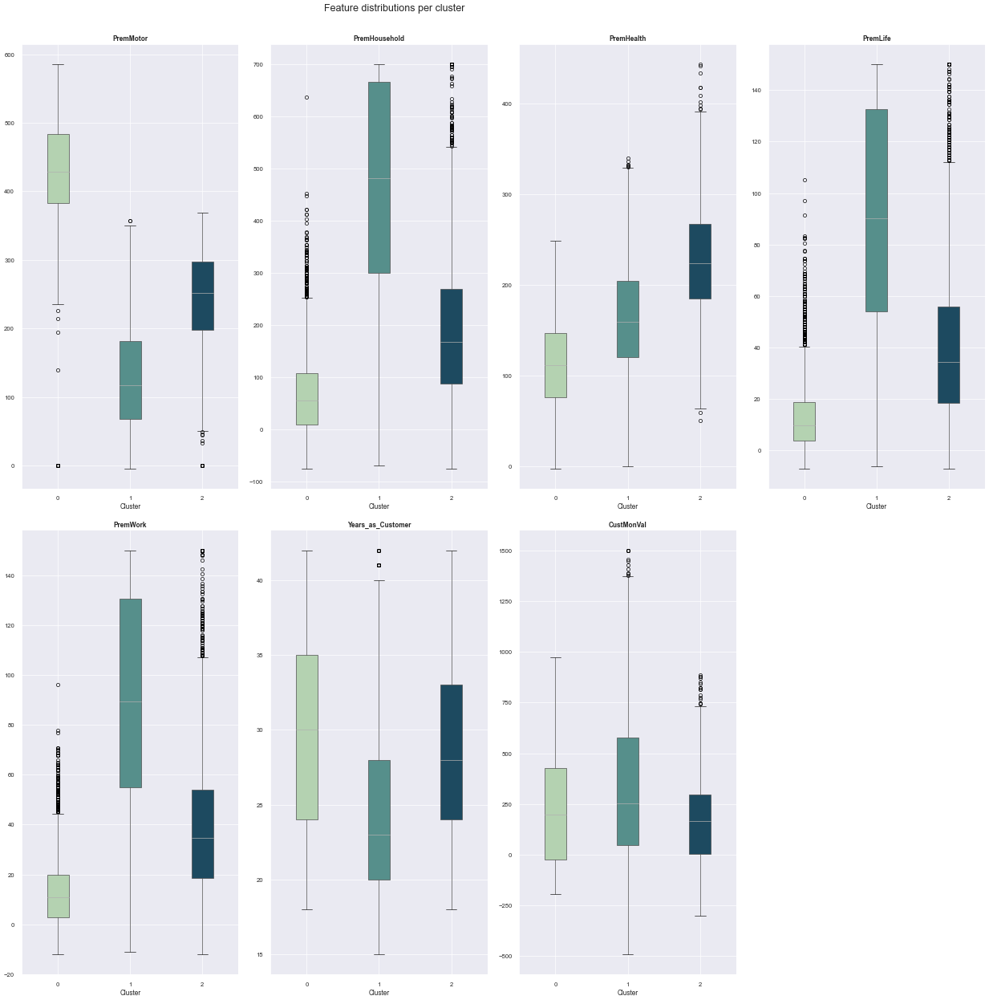

<Figure size 1250x750 with 0 Axes>

In [104]:
chartCluster(client_value, categorical_features=[], data=df, cluster_title='Cluster_km_cv')


In [105]:
df_concat3 = pd.concat((dfscaled, pd.Series(clus_km_cv.labels_, name='km_cv_labels')), axis=1)
#df_concat3.groupby('km_cv_labels').mean().T
pd.DataFrame(df_concat3.groupby('km_cv_labels')['km_cv_labels'].count())

,km_cv_labels
km_cv_labels,
0.0,4164
1.0,2053
2.0,3990


<a class="anchor" id="topic06.05" /><br>
## 6.5 DBSCAN - with segmentation

<a class="anchor" id="topic06.05.01" /><br>
### 6.5.1 DBSCAN - Sociodemographic features

In [106]:
features = sociometr


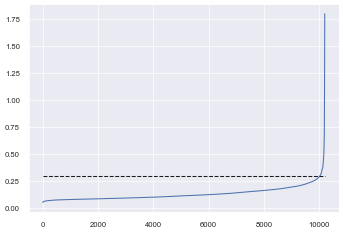

In [107]:
# K-distance graph to find out the right eps value
neigh = NearestNeighbors(n_neighbors=20)
neigh.fit(dfscaled[features])
distances, _ = neigh.kneighbors(dfscaled[features])
distances = np.sort(distances[:, -1])
plt.plot(distances)
plt.hlines(0.30, 0, len(dfscaled), colors="k", linestyles="dashed")
plt.show()

In [108]:
# min_samples >= #features +1
clust_db_sd = DBSCAN(eps=0.3, min_samples = (len(features))*2)

#eps=1, minsamples=50 - 3 clusters, 90% of observations are seen as outliers
#eps=1, minsamples=10 - 29 clusters, 65% of observations are seen as outliers
# min_samples maior aumenta outliers
# eps maior reduz numero clusters

clust_db_sd_labels = clust_db_sd.fit_predict(dfscaled[features])

dfscaled['Cluster_db_sd'] = clust_db_sd_labels
df['Cluster_db_sd']       = clust_db_sd_labels

# Characterizing the final clusters
df.groupby('Cluster_db_sd').count().T


Cluster_db_sd,-1,0,1
CustMonVal,19,10182,6
PremMotor,19,10182,6
PremHousehold,19,10182,6
PremHealth,19,10182,6
PremLife,19,10182,6
PremWork,19,10182,6
YearSal,19,10182,6
Years_as_Customer,19,10182,6
Age,19,10182,6
PremHHL_propSal,19,10182,6


In [109]:
calc_r2(pdataframe=dfscaled, arr_clusters=clust_db_sd_labels, save="True", model="DBSCAN", features="Sociodemographic")


R^2 score: 0.012075549889713155
Model: DBSCAN
Using features: Sociodemographic.


0.012075549889713155

DBSCAN is not adequate for our model because most observations belong to the same cluster.

<a class="anchor" id="topic06.05.02" /><br>
### 6.5.2 DBSCAN - Customer Value features

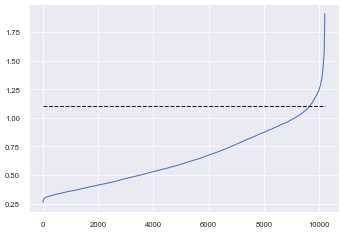

In [110]:
# K-distance graph to find out the right eps value
neigh = NearestNeighbors(n_neighbors=20)
neigh.fit(dfscaled[client_value])
distances, _ = neigh.kneighbors(dfscaled[client_value])
distances = np.sort(distances[:, -1])
plt.plot(distances)
plt.hlines(1.1, 0, len(dfscaled), colors="k", linestyles="dashed")
plt.show()

In [111]:
# min_samples >= #features +1
dbcvclust = DBSCAN(eps=1.1, min_samples = (len(client_value))*2)


dbcv_labels = dbcvclust.fit_predict(dfscaled[client_value])

dfscaled['Cluster_db_cv'] = dbcv_labels
dfscaled['Cluster_db_cv'] = dbcv_labels
df['Cluster_db_cv']       = dbcv_labels

# Characterizing the final clusters
df.groupby('Cluster_db_cv').count().T

Cluster_db_cv,-1,0,1
CustMonVal,36,10151,20
PremMotor,36,10151,20
PremHousehold,36,10151,20
PremHealth,36,10151,20
PremLife,36,10151,20
PremWork,36,10151,20
YearSal,36,10151,20
Years_as_Customer,36,10151,20
Age,36,10151,20
PremHHL_propSal,36,10151,20


In [112]:
calc_r2(pdataframe=dfscaled, arr_clusters=clust_db_sd_labels, save="True", model="DBSCAN", features="Client Value")


R^2 score: 0.012074078667652755
Model: DBSCAN
Using features: Client Value.


0.012074078667652755

DBSCAN is not adequate for our model because most observations belong to the same cluster.

<a class="anchor" id="topic06.06" /><br>
## 6.6 Self-Organizing Maps - with segmentation

<a class="anchor" id="topic06.06.01" /><br>
### 6.6.1 Sociodemographic features

In [113]:
np.random.seed(g_random_state)


sm = sompy.SOMFactory().build(
    dfscaled[sociometr].values, 
    mapsize=[10,10],  # NEEDS TO BE A LIST
    initialization='random', 
    neighborhood='gaussian',
    training='batch',
    lattice='hexa',
    component_names=sociometr
)
sm.train(n_job=4, verbose='info', train_rough_len=100, train_finetune_len=100)



 Training...
 random_initialization took: 0.000000 seconds
 Rough training...
 radius_ini: 4.000000 , radius_final: 1.000000, trainlen: 100

 epoch: 1 ---> elapsed time:  0.031000, quantization error: 0.705337

 epoch: 2 ---> elapsed time:  0.033000, quantization error: 1.418839

 epoch: 3 ---> elapsed time:  0.030000, quantization error: 1.270528

 epoch: 4 ---> elapsed time:  0.030000, quantization error: 1.249340

 epoch: 5 ---> elapsed time:  0.035000, quantization error: 1.242293

 epoch: 6 ---> elapsed time:  0.026000, quantization error: 1.238083

 epoch: 7 ---> elapsed time:  0.032000, quantization error: 1.234235

 epoch: 8 ---> elapsed time:  0.036000, quantization error: 1.230367

 epoch: 9 ---> elapsed time:  0.035000, quantization error: 1.226426

 epoch: 10 ---> elapsed time:  0.030000, quantization error: 1.222404

 epoch: 11 ---> elapsed time:  0.027000, quantization error: 1.218303

 epoch: 12 ---> elapsed time:  0.027000, quantization error: 1.214112

 epoch: 13 ---> 

 epoch: 14 ---> elapsed time:  0.028000, quantization error: 0.339540

 epoch: 15 ---> elapsed time:  0.031000, quantization error: 0.339518

 epoch: 16 ---> elapsed time:  0.030000, quantization error: 0.339458

 epoch: 17 ---> elapsed time:  0.029000, quantization error: 0.339442

 epoch: 18 ---> elapsed time:  0.031000, quantization error: 0.339414

 epoch: 19 ---> elapsed time:  0.031000, quantization error: 0.339380

 epoch: 20 ---> elapsed time:  0.025000, quantization error: 0.339384

 epoch: 21 ---> elapsed time:  0.030000, quantization error: 0.339376

 epoch: 22 ---> elapsed time:  0.027000, quantization error: 0.339359

 epoch: 23 ---> elapsed time:  0.030000, quantization error: 0.339365

 epoch: 24 ---> elapsed time:  0.026000, quantization error: 0.339388

 epoch: 25 ---> elapsed time:  0.031000, quantization error: 0.339386

 epoch: 26 ---> elapsed time:  0.033000, quantization error: 0.339373

 epoch: 27 ---> elapsed time:  0.027000, quantization error: 0.339350

 epoch

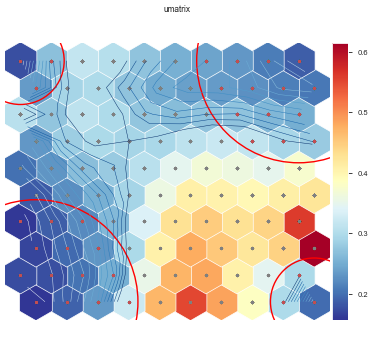

array([[0.17565741, 0.26782428, 0.31512553, 0.3046807 , 0.27303572,
        0.25237153, 0.24262549, 0.23025892, 0.20897321, 0.18707531],
       [0.23551339, 0.29000447, 0.2976807 , 0.27214766, 0.24665694,
        0.23787135, 0.2355869 , 0.22653369, 0.21097374, 0.2068497 ],
       [0.30654117, 0.27455535, 0.31036333, 0.29787855, 0.27406473,
        0.26485658, 0.2714038 , 0.27240687, 0.25975003, 0.25107254],
       [0.23085702, 0.28235777, 0.29595088, 0.29046141, 0.29401834,
        0.31023412, 0.31996633, 0.31277637, 0.29245321, 0.27939854],
       [0.20144406, 0.22852258, 0.26635478, 0.27998292, 0.30625257,
        0.34678063, 0.36681963, 0.36043971, 0.34931807, 0.3747307 ],
       [0.18527737, 0.22437312, 0.25227831, 0.29058768, 0.35825603,
        0.40840776, 0.40432099, 0.39543171, 0.41056491, 0.42227386],
       [0.1597704 , 0.18651145, 0.22057261, 0.26070085, 0.33731648,
        0.42756195, 0.44890892, 0.42691625, 0.44235475, 0.56094745],
       [0.16901622, 0.19481766, 0.2297112

In [114]:

# Here you have U-matrix
u = sompy.umatrix.UMatrixView(14,14, 'umatrix', show_axis=True, text_size=8, show_text=True)

UMAT = u.show(
    sm, 
    distance=2, 
    row_normalized=False,
    show_data=True, 
    contour=True, # Visualize isomorphic curves
    blob=True
)

np.flip(UMAT[1], axis=1) # U-matrix values - they match with the plot colors

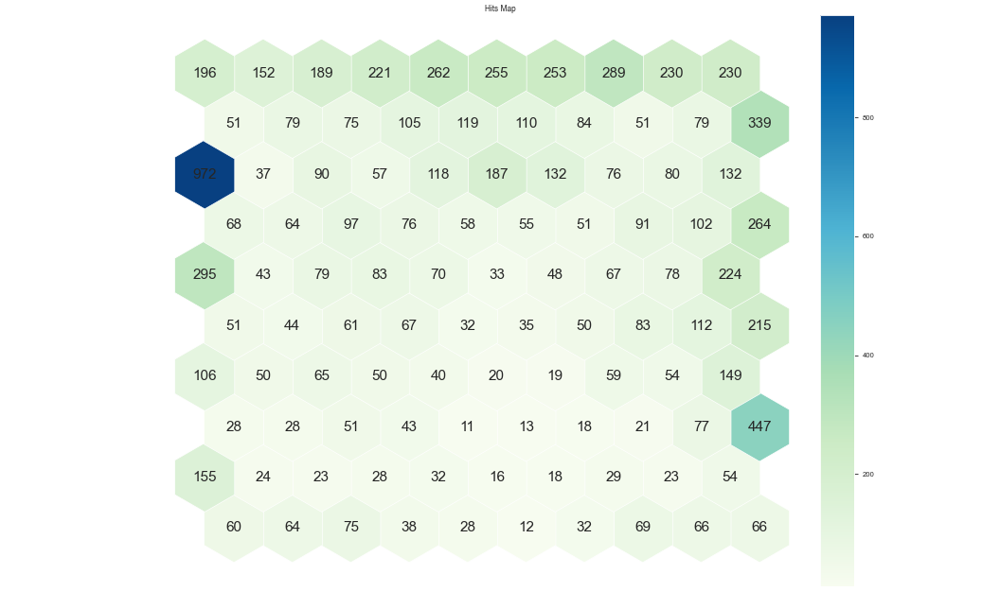

In [115]:
vhts  = BmuHitsView(27,27,"Hits Map")
vhts.show(sm, anotate=True, onlyzeros=False, labelsize=22, cmap="GnBu")
plt.show()


#### Define number of clusters

In [116]:
range_clusters = range(2, 11)

In [117]:
inertia = []
for n_clus in range_clusters:  # iterate over desired ncluster range
    kmclust = KMeans(n_clusters=n_clus, init='k-means++', n_init=15, random_state=g_random_state)
    kmclust.fit(dfscaled[sociometr])
    inertia.append(kmclust.inertia_)  # save the inertia of the given cluster solution

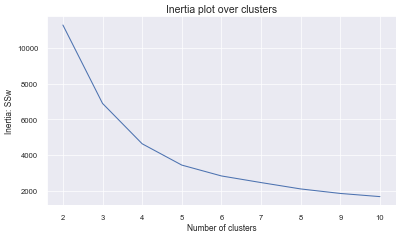

In [118]:
# The inertia plot
plt.figure(figsize=(9,5))
plt.plot(range(2,11), inertia)
#plt.xlim([2, 10]) 
plt.ylabel("Inertia: SSw")
plt.xlabel("Number of clusters")
plt.title("Inertia plot over clusters", size=15)
plt.show()

For n_clusters = 2, the average silhouette_score is : 0.6310070762479525
For n_clusters = 3, the average silhouette_score is : 0.46225048076996794
For n_clusters = 4, the average silhouette_score is : 0.4321112138767577
For n_clusters = 5, the average silhouette_score is : 0.4212489738211587
For n_clusters = 6, the average silhouette_score is : 0.3987947438858153
For n_clusters = 7, the average silhouette_score is : 0.3748352512297918
For n_clusters = 8, the average silhouette_score is : 0.3649259481916848
For n_clusters = 9, the average silhouette_score is : 0.35096273211471896
For n_clusters = 10, the average silhouette_score is : 0.3292530438807067


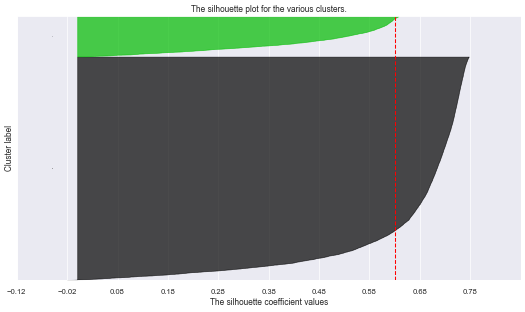

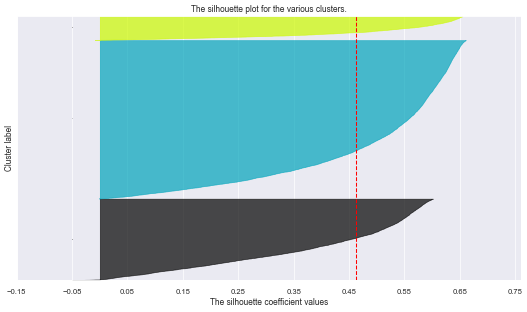

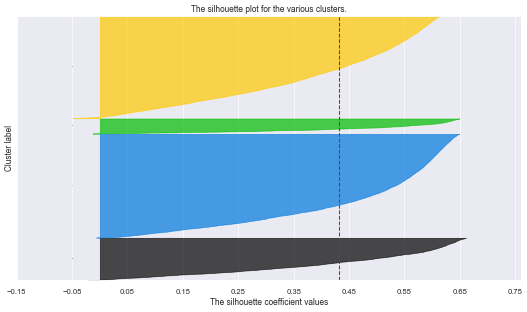

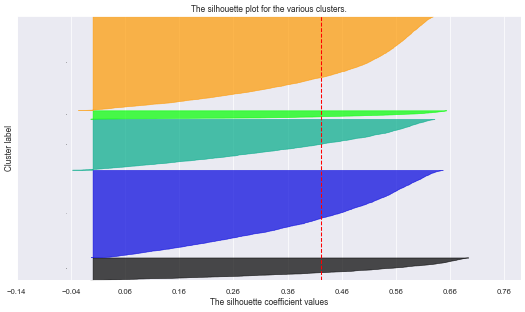

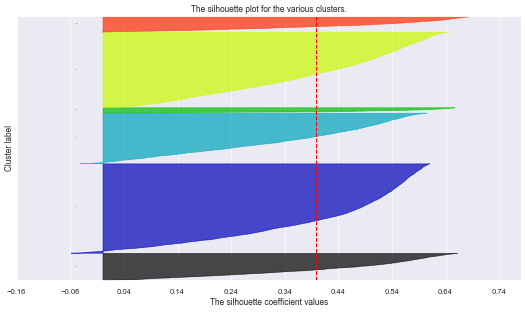

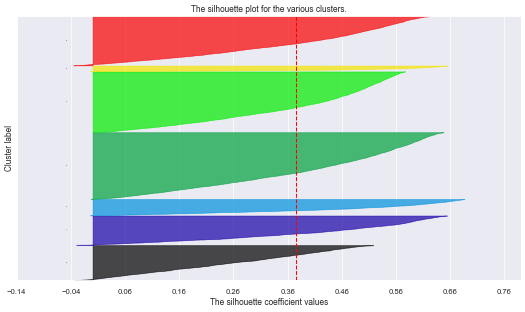

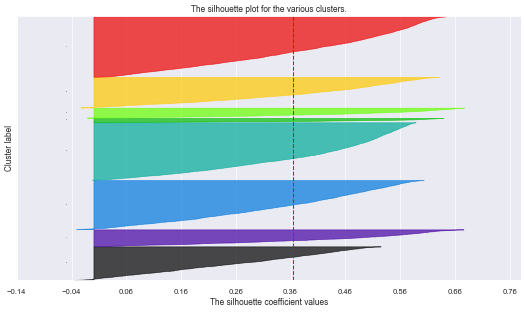

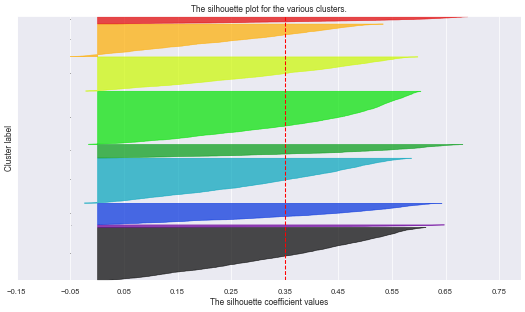

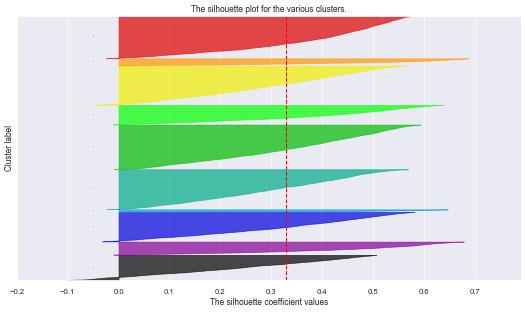

In [119]:
# Adapted from:
# https://scikit-learn.org/stable/auto_examples/cluster/plot_kmeans_silhouette_analysis.html#sphx-glr-auto-examples-cluster-plot-kmeans-silhouette-analysis-py

# Storing average silhouette metric
avg_silhouette = []
for nclus in range_clusters:
    # Skip nclus == 1
    if nclus == 1:
        continue
    
    # Create a figure
    fig = plt.figure(figsize=(13, 7))

    # Initialize the KMeans object with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    kmclust = KMeans(n_clusters=nclus, init='k-means++', n_init=15, random_state=g_random_state)
    cluster_labels = kmclust.fit_predict(dfscaled[sociometr])

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed clusters
    silhouette_avg = silhouette_score(dfscaled[sociometr], cluster_labels)
    avg_silhouette.append(silhouette_avg)
    print(f"For n_clusters = {nclus}, the average silhouette_score is : {silhouette_avg}")

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(dfscaled[sociometr], cluster_labels)

    y_lower = 10
    for i in range(nclus):
        # Aggregate the silhouette scores for samples belonging to cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
        ith_cluster_silhouette_values.sort()
        
        # Get y_upper to demarcate silhouette y range size
        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i
        
        # Filling the silhouette
        color = cm.nipy_spectral(float(i) / nclus)
        plt.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        plt.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    plt.title("The silhouette plot for the various clusters.")
    plt.xlabel("The silhouette coefficient values")
    plt.ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    plt.axvline(x=silhouette_avg, color="red", linestyle="--")
    
    # The silhouette coefficient can range from -1, 1
    xmin, xmax = np.round(sample_silhouette_values.min() -0.1, 2), np.round(sample_silhouette_values.max() + 0.1, 2)
    plt.xlim([xmin, xmax])
    
    # The (nclus+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    plt.ylim([0, len(df[sociometr]) + (nclus + 1) * 10])

    plt.yticks([])  # Clear the yaxis labels / ticks
    plt.xticks(np.arange(xmin, xmax, 0.1))

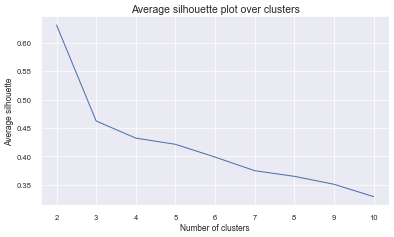

In [120]:
# The average silhouette plot
# The inertia plot
plt.figure(figsize=(9,5))
plt.plot(range(2,11),avg_silhouette)
plt.ylabel("Average silhouette")
plt.xlabel("Number of clusters")
plt.title("Average silhouette plot over clusters", size=15)
plt.show()


In [121]:
n_clusters = 3

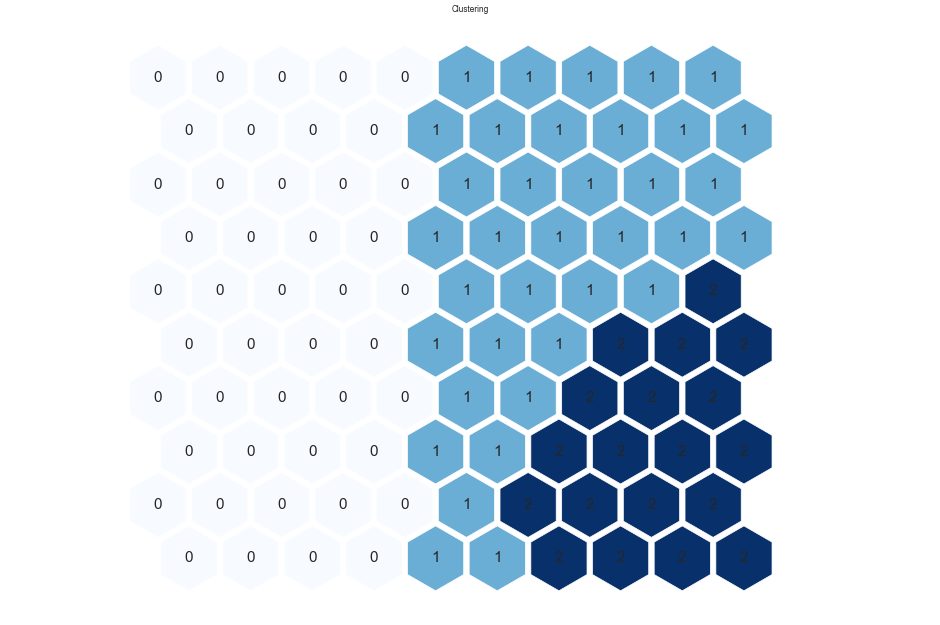

In [122]:
# Perform K-Means clustering on top of the 2500 untis (sm.get_node_vectors() output)
kmeans = KMeans(n_clusters=n_clusters, init='k-means++', n_init=20, random_state=g_random_state)
nodeclus_labels = kmeans.fit_predict(sm.codebook.matrix)
sm.cluster_labels = nodeclus_labels  # setting the cluster labels of sompy

hits = HitMapView(24, 24,"Clustering", text_size=18)
hits.show(sm, anotate=True, onlyzeros=False, labelsize=22, cmap="Blues")
#hits.show(sm, anotate=True, onlyzeros=False, labelsize=14, cmap=['#b4d2b1', '#568f8b', '#1d4a60', '#cd7e59', '#ddb247', '#d15252'])

plt.show()


In [123]:
# Check the nodes and and respective clusters
nodes = sm.codebook.matrix

df_nodes = pd.DataFrame(nodes, columns=sociometr)
df_nodes['Cluster_um_km_sd'] = nodeclus_labels


In [124]:
# Obtaining SOM's BMUs labels
bmus_map = sm.find_bmu(np.array(dfscaled[sociometr]))[0]  # get bmus for each observation in df

df_bmus = pd.DataFrame(
    np.concatenate((dfscaled, np.expand_dims(bmus_map,1)), axis=1),
    index=dfscaled.index, columns=np.append(dfscaled.columns,"BMU")
)


In [125]:
# Get cluster labels for each observation
df_final = df_bmus.merge(df_nodes['Cluster_um_km_sd'], 'left', left_on="BMU", right_index=True)

df["Cluster_um_km_sd"] =       df_final["Cluster_um_km_sd"]
dfscaled["Cluster_um_km_sd"] = df_final["Cluster_um_km_sd"]


In [126]:
# Characterizing the final clusters
df_final.drop(columns='BMU').groupby('Cluster_um_km_sd')[sociometr].mean()

df.groupby('Cluster_um_km_sd')[sociometr].mean()


,Age,YearSal,PremHHL_propSal
Cluster_um_km_sd,,,
0,64.706330,41236.871585,0.009241
1,42.096343,25658.766812,0.011256
2,31.715853,14984.903766,0.048533


In [127]:
calc_r2(pdataframe=df[sociometr], arr_clusters=df["Cluster_um_km_sd"], save="True", model="SOM", features="Sociodemographic")


R^2 score: 0.7954383134987064
Model: SOM
Using features: Sociodemographic.


0.7954383134987064

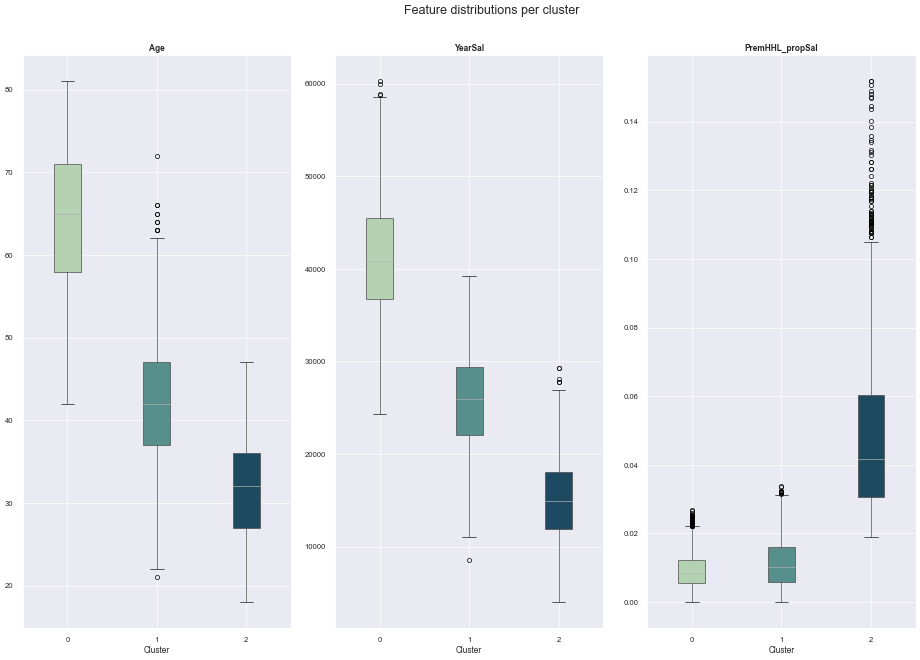

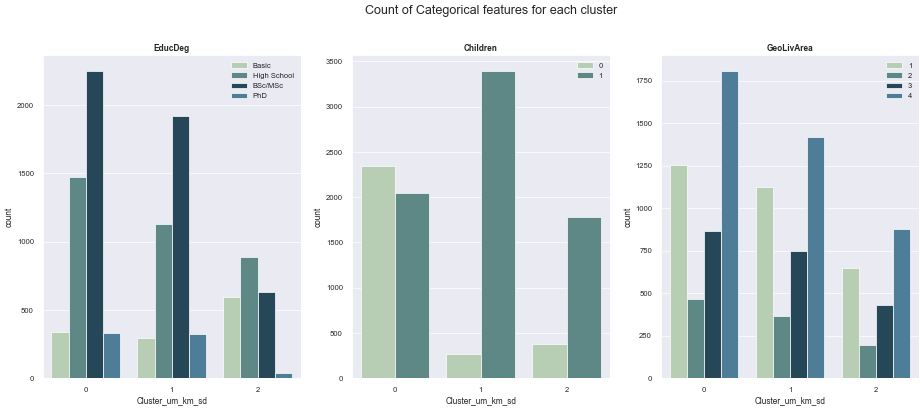

In [128]:
chartCluster(metric_features=sociometr, categorical_features=sociocat, data=df, cluster_title='Cluster_um_km_sd')

<a class="anchor" id="topic06.06.02" /><br>
### 6.6.2 Client Value features

All client value features are metric features


In [129]:
np.random.seed(g_random_state)


sm = sompy.SOMFactory().build(
    dfscaled[client_value].values, 
    mapsize=[10,10],  # NEEDS TO BE A LIST
    initialization='random', 
    neighborhood='gaussian',
    training='batch',
    lattice='hexa',
    component_names=client_value
)
sm.train(n_job=4, verbose=None, train_rough_len=100, train_finetune_len=100)


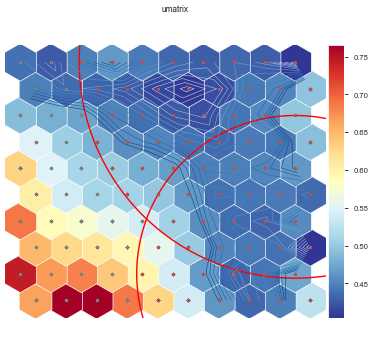

array([[0.43966826, 0.42682358, 0.44774778, 0.46415843, 0.44496491,
        0.43370439, 0.42721848, 0.43357488, 0.42756653, 0.40521429],
       [0.44723173, 0.43463628, 0.43249579, 0.42666366, 0.41467359,
        0.40636076, 0.41767659, 0.4426694 , 0.45214049, 0.49495983],
       [0.48947857, 0.47961814, 0.4707996 , 0.45032692, 0.43767123,
        0.42445737, 0.41943995, 0.44114799, 0.45298356, 0.49623399],
       [0.54767106, 0.50356912, 0.48134351, 0.45801147, 0.45107644,
        0.43879928, 0.4348137 , 0.44466257, 0.44332148, 0.49175129],
       [0.63002966, 0.54707796, 0.51039748, 0.5022731 , 0.47876714,
        0.4675379 , 0.44693987, 0.44728914, 0.45236327, 0.46366688],
       [0.60433807, 0.53896679, 0.50985587, 0.50805759, 0.49762768,
        0.46464579, 0.43925842, 0.44214144, 0.44424387, 0.43522171],
       [0.68732946, 0.59067487, 0.57525354, 0.55566313, 0.54043724,
        0.50694162, 0.45708779, 0.43668112, 0.43152971, 0.45439172],
       [0.64888172, 0.62507917, 0.6119454

In [130]:

# Here you have U-matrix
u = sompy.umatrix.UMatrixView(14,14, 'umatrix', show_axis=True, text_size=8, show_text=True)

UMAT = u.show(
    sm, 
    distance=2, 
    row_normalized=False,
    show_data=True, 
    contour=True, # Visualize isomorphic curves
    blob=True
)

np.flip(UMAT[1], axis=1) # U-matrix values - they match with the plot colors

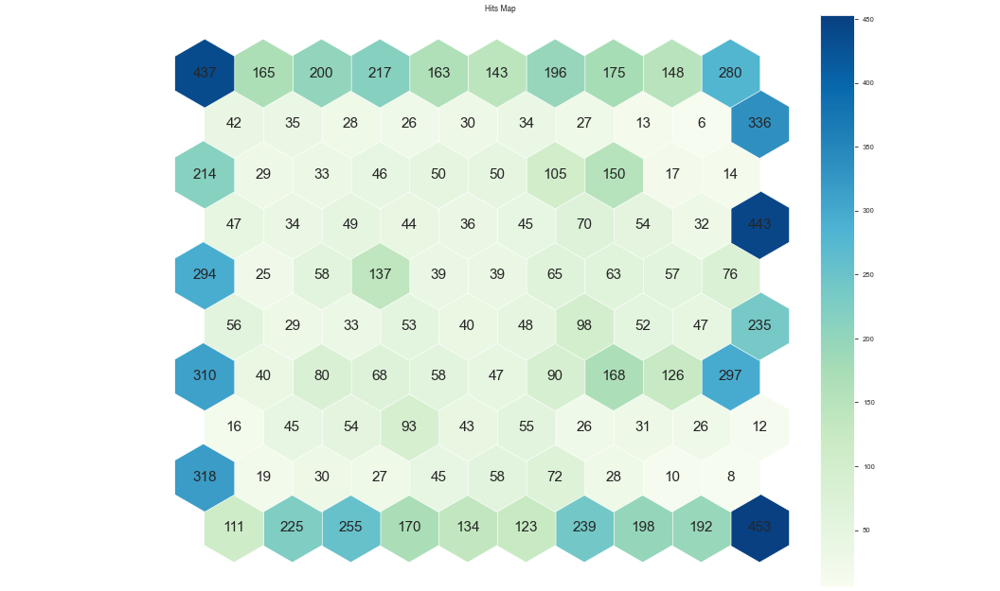

In [131]:
vhts  = BmuHitsView(27,27,"Hits Map")
vhts.show(sm, anotate=True, onlyzeros=False, labelsize=22, cmap="GnBu")
plt.show()


#### Define number of clusters

In [132]:
range_clusters = range(2, 11)

In [133]:
inertia = []
for n_clus in range_clusters:  # iterate over desired ncluster range
    kmclust = KMeans(n_clusters=n_clus, init='k-means++', n_init=15, random_state=g_random_state)
    kmclust.fit(dfscaled[client_value])
    inertia.append(kmclust.inertia_)  # save the inertia of the given cluster solution

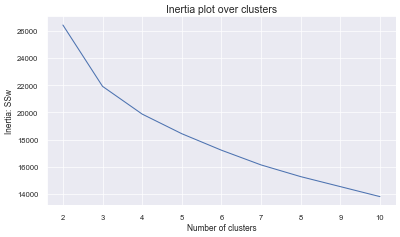

In [134]:
# The inertia plot
plt.figure(figsize=(9,5))
plt.plot(range(2,11), inertia)
#plt.xlim([2, 10]) 
plt.ylabel("Inertia: SSw")
plt.xlabel("Number of clusters")
plt.title("Inertia plot over clusters", size=15)
plt.show()

For n_clusters = 2, the average silhouette_score is : 0.32584971762286824
For n_clusters = 3, the average silhouette_score is : 0.22761357324589088
For n_clusters = 4, the average silhouette_score is : 0.22257025757053472
For n_clusters = 5, the average silhouette_score is : 0.22160603962033473
For n_clusters = 6, the average silhouette_score is : 0.18592354524070154
For n_clusters = 7, the average silhouette_score is : 0.1825318975600372
For n_clusters = 8, the average silhouette_score is : 0.1752400681244581
For n_clusters = 9, the average silhouette_score is : 0.17644699833943212
For n_clusters = 10, the average silhouette_score is : 0.17957530643641417


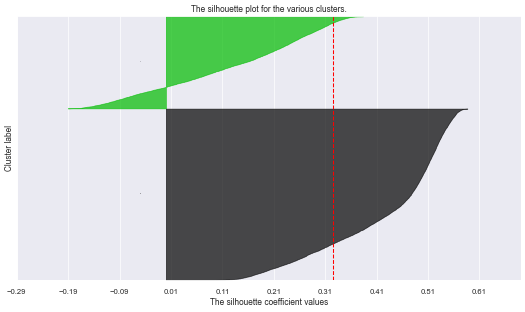

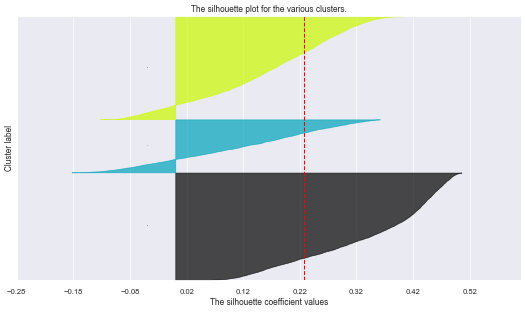

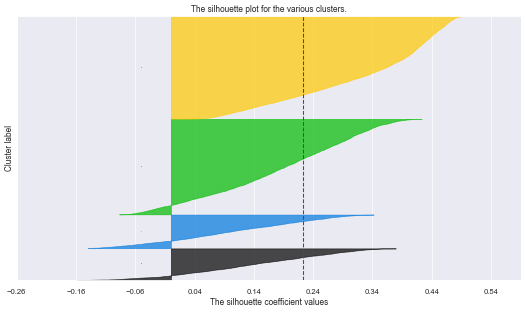

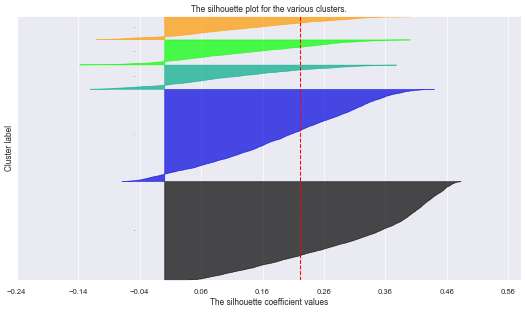

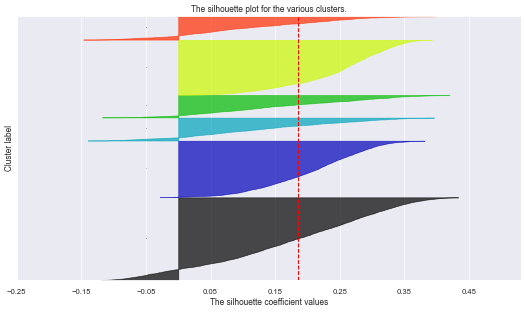

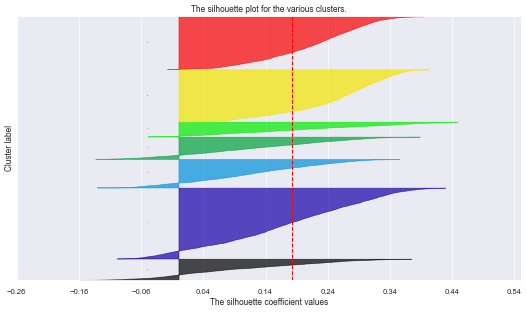

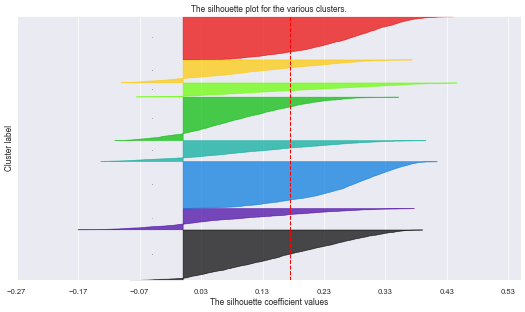

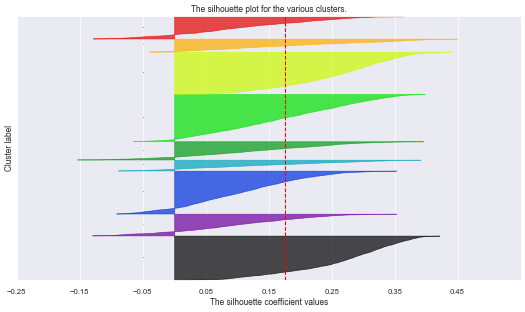

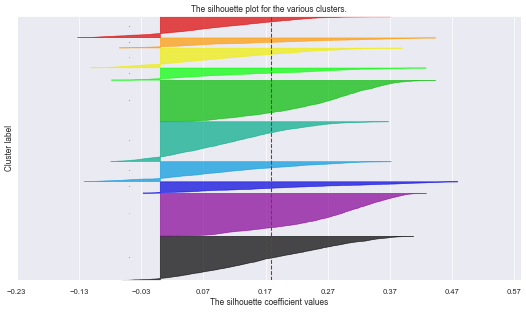

In [135]:
# Adapted from:
# https://scikit-learn.org/stable/auto_examples/cluster/plot_kmeans_silhouette_analysis.html#sphx-glr-auto-examples-cluster-plot-kmeans-silhouette-analysis-py

# Storing average silhouette metric
avg_silhouette = []
for nclus in range_clusters:
    # Skip nclus == 1
    if nclus == 1:
        continue
    
    # Create a figure
    fig = plt.figure(figsize=(13, 7))

    # Initialize the KMeans object with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    kmclust = KMeans(n_clusters=nclus, init='k-means++', n_init=15, random_state=g_random_state)
    cluster_labels = kmclust.fit_predict(dfscaled[client_value])

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed clusters
    silhouette_avg = silhouette_score(dfscaled[client_value], cluster_labels)
    avg_silhouette.append(silhouette_avg)
    print(f"For n_clusters = {nclus}, the average silhouette_score is : {silhouette_avg}")

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(dfscaled[client_value], cluster_labels)

    y_lower = 10
    for i in range(nclus):
        # Aggregate the silhouette scores for samples belonging to cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
        ith_cluster_silhouette_values.sort()
        
        # Get y_upper to demarcate silhouette y range size
        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i
        
        # Filling the silhouette
        color = cm.nipy_spectral(float(i) / nclus)
        plt.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        plt.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    plt.title("The silhouette plot for the various clusters.")
    plt.xlabel("The silhouette coefficient values")
    plt.ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    plt.axvline(x=silhouette_avg, color="red", linestyle="--")
    
    # The silhouette coefficient can range from -1, 1
    xmin, xmax = np.round(sample_silhouette_values.min() -0.1, 2), np.round(sample_silhouette_values.max() + 0.1, 2)
    plt.xlim([xmin, xmax])
    
    # The (nclus+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    plt.ylim([0, len(df[client_value]) + (nclus + 1) * 10])

    plt.yticks([])  # Clear the yaxis labels / ticks
    plt.xticks(np.arange(xmin, xmax, 0.1))

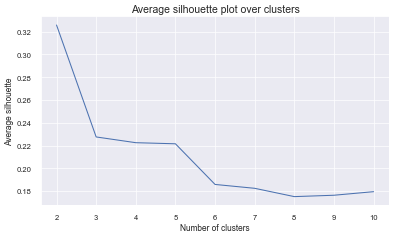

In [136]:
# The average silhouette plot
# The inertia plot
plt.figure(figsize=(9,5))
plt.plot(range(2,11),avg_silhouette)
plt.ylabel("Average silhouette")
plt.xlabel("Number of clusters")
plt.title("Average silhouette plot over clusters", size=15)
plt.show()


In [137]:
n_clusters = 3

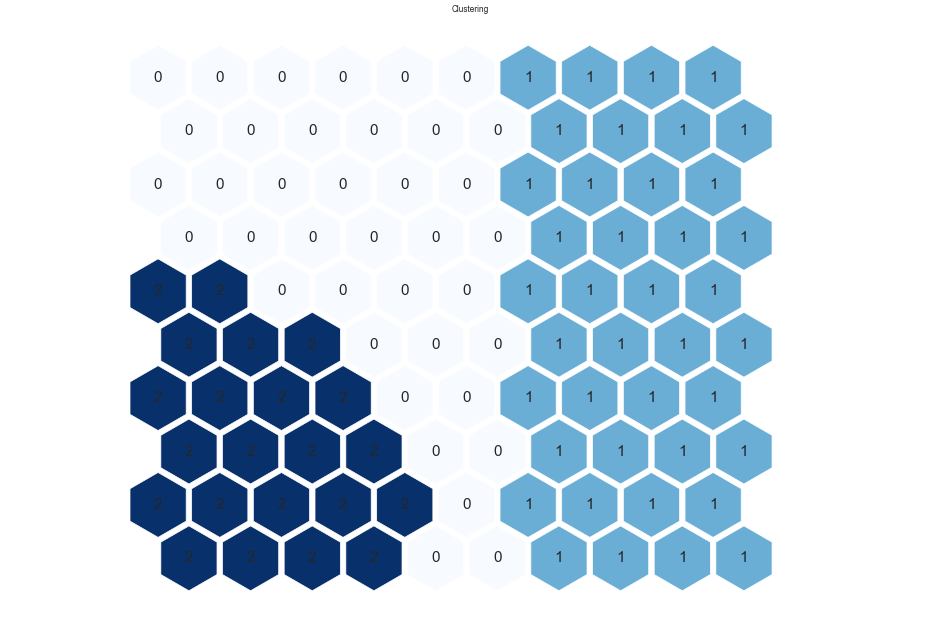

In [138]:
# Perform K-Means clustering on top of the 2500 untis (sm.get_node_vectors() output)
kmeans = KMeans(n_clusters=n_clusters, init='k-means++', n_init=20, random_state=g_random_state)
nodeclus_labels = kmeans.fit_predict(sm.codebook.matrix)
sm.cluster_labels = nodeclus_labels  # setting the cluster labels of sompy

hits = HitMapView(24, 24,"Clustering", text_size=18)
hits.show(sm, anotate=True, onlyzeros=False, labelsize=22, cmap="Blues")
#hits.show(sm, anotate=True, onlyzeros=False, labelsize=14, cmap=['#b4d2b1', '#568f8b', '#1d4a60', '#cd7e59', '#ddb247', '#d15252'])

plt.show()


In [139]:
# Check the nodes and and respective clusters
nodes = sm.codebook.matrix

df_nodes = pd.DataFrame(nodes, columns=client_value)
df_nodes['Cluster_um_km_cv'] = nodeclus_labels
df_nodes

# df_nodes.groupby(['Cluster_um_km'])['Cluster_um_km'].count()

,PremMotor,PremHousehold,PremHealth,PremLife,PremWork,Years_as_Customer,CustMonVal,Cluster_um_km_cv
0,1.011946,-0.586511,-0.805228,-0.629275,-0.617422,1.005501,0.593922,1
1,0.770072,-0.486695,-0.541399,-0.506118,-0.510453,1.042952,0.413355,1
2,0.497713,-0.353517,-0.260536,-0.334386,-0.382638,1.093499,0.284641,1
3,0.251837,-0.295276,0.108409,-0.275675,-0.341608,1.093864,0.182822,1
4,-0.018701,-0.178961,0.448160,-0.204271,-0.234114,1.079658,0.033033,0
...,...,...,...,...,...,...,...,...
95,-0.268645,0.697633,0.122219,0.003564,0.080945,-0.354335,0.827513,0
96,-0.632381,1.222146,0.152995,0.209229,0.423766,-0.302299,1.114981,2
97,-0.975431,1.606787,0.061245,0.470157,0.886262,-0.479666,1.402190,2
98,-1.199856,1.715583,-0.101440,1.146910,1.003440,-0.669418,1.264351,2


In [140]:
#dfscaled.drop(['Cluster_um_km_cv'],axis=1, inplace=True)
#df.drop(['Cluster_um_km_cv'],axis=1, inplace=True)


In [141]:
# Obtaining SOM's BMUs labels
bmus_map = sm.find_bmu(np.array(dfscaled[client_value]))[0]  # get bmus for each observation in df

df_bmus = pd.DataFrame(
    np.concatenate((dfscaled, np.expand_dims(bmus_map,1)), axis=1),
    index=dfscaled.index, columns=np.append(dfscaled.columns,"BMU")
)


In [142]:
df_final

,EducDeg,GeoLivArea,Children,CustMonVal,PremMotor,PremHousehold,PremHealth,PremLife,PremWork,YearSal,...,PremHHL_propSal,Cluster_kp,Cluster_DBScan,Cluster_um_km,Cluster_kp_sd,Cluster_km_cv,Cluster_db_sd,Cluster_db_cv,BMU,Cluster_um_km_sd
CustID,,,,,,,,,,,,,,,,,,,,,
1.0,2.0,1.0,1.0,0.475557,0.353150,-0.224109,-0.145140,0.474109,-0.189255,-0.210747,...,-0.063815,3.0,0.0,0.0,1.0,0.0,0.0,0.0,43.0,1
2.0,2.0,4.0,1.0,-0.780868,-1.023061,1.205221,-0.419951,2.659805,1.783772,-1.165797,...,5.098878,1.0,0.0,3.0,2.0,1.0,0.0,0.0,70.0,2
3.0,1.0,3.0,0.0,0.779052,-0.429527,0.391553,-0.346872,1.308998,1.626575,-0.147078,...,0.321879,2.0,0.0,0.0,1.0,1.0,0.0,0.0,84.0,1
4.0,3.0,4.0,1.0,-0.500828,-0.538696,-0.377334,1.381374,0.226443,0.063896,-0.897109,...,1.276999,2.0,0.0,0.0,1.0,2.0,0.0,0.0,93.0,2
5.0,3.0,4.0,1.0,-0.372708,0.181441,-0.358447,0.190432,-0.125000,0.353748,-0.474341,...,0.030154,3.0,0.0,0.0,1.0,2.0,0.0,0.0,54.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10292.0,4.0,2.0,0.0,-0.459413,0.435661,-0.351443,0.109109,-0.316002,-0.235905,0.432956,...,-0.368864,3.0,0.0,2.0,0.0,0.0,0.0,0.0,57.0,0
10293.0,1.0,3.0,0.0,2.989462,-0.764228,2.409805,-0.173945,-0.250000,1.761663,-0.049026,...,1.262272,2.0,-1.0,3.0,1.0,1.0,0.0,-1.0,95.0,1
10294.0,3.0,1.0,1.0,0.826723,0.481275,0.002334,-0.183208,-0.254669,-0.454566,0.261047,...,-0.219495,3.0,0.0,1.0,0.0,0.0,0.0,0.0,4.0,1


In [143]:
# Get cluster labels for each observation
df_final = df_bmus.merge(df_nodes['Cluster_um_km_cv'], 'left', left_on="BMU", right_index=True)

df["Cluster_um_km_cv"] =       df_final["Cluster_um_km_cv"]
dfscaled["Cluster_um_km_cv"] = df_final["Cluster_um_km_cv"]


In [144]:
# Characterizing the final clusters
df_final.drop(columns='BMU').groupby('Cluster_um_km_cv')[client_value].mean()

df.groupby('Cluster_um_km_cv')[client_value].mean()


,PremMotor,PremHousehold,PremHealth,PremLife,PremWork,Years_as_Customer,CustMonVal
Cluster_um_km_cv,,,,,,,
0,270.907536,160.151555,214.931921,33.152957,35.818221,29.570638,164.074873
1,442.238670,51.131708,110.125422,11.411269,10.438879,29.649189,212.160338
2,149.927728,418.166490,175.904014,82.304850,77.200582,25.258624,293.961196


In [145]:
calc_r2(pdataframe=df[client_value], arr_clusters=df["Cluster_um_km_cv"], save="True", model="SOM", features="Client Value")


R^2 score: 0.3127038385514701
Model: SOM
Using features: Client Value.


0.3127038385514701

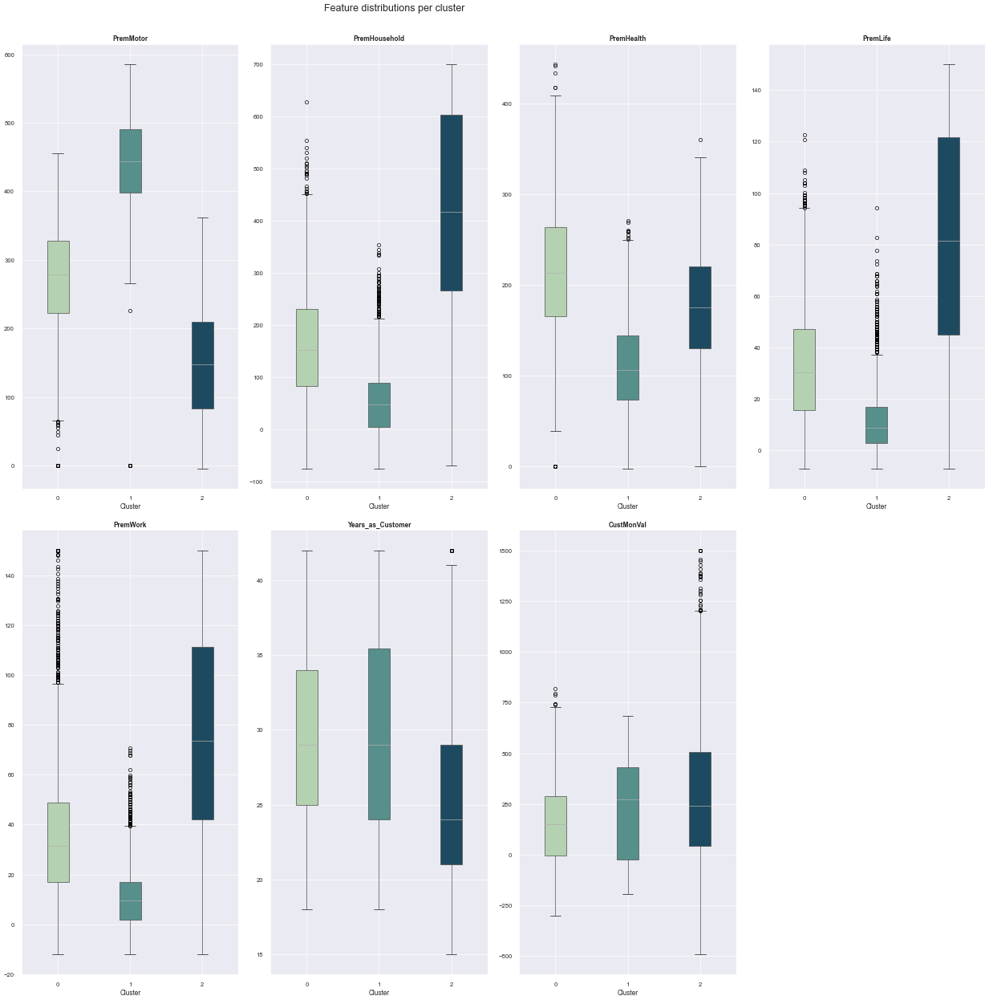

<Figure size 1250x750 with 0 Axes>

In [146]:
chartCluster(metric_features=client_value, categorical_features=[], data=df, cluster_title='Cluster_um_km_cv')


<a class="anchor" id="topic07" /><br>
# 7. Merging Cluster Solutions
[Back to Index](#index)

We are required to provide clustering in two perspectives, so we opted for the clustering options with segmentation.\
Of these, the best R^2 results for Client value come from KMeans and the best R^2 results for sociodemographics come from SOM.


In [147]:
r2sc = pd.DataFrame(g_r2_scores)[["model", "features", "r2"]]


In [148]:
r2sc.pivot("model","features", "r2") 

features,All,Client Value,Sociodemographic
model,,,
DBSCAN,0.010859,0.012074,0.012076
Hier.Cl+KProt,0.536695,0.537409,0.451776
SOM,0.695641,0.312704,0.795438


In [149]:
df["client_value_labels"] = df["Cluster_km_cv"]
dfscaled["client_value_labels"] = dfscaled["Cluster_km_cv"]

#df.rename(columns={"Cluster_km_cv": "client_value_labels"}, inplace=True)
#dfscaled.rename(columns={"Cluster_km_cv": "client_value_labels"}, inplace=True)

In [150]:
df["sociodemographic_labels"] = df["Cluster_um_km_sd"]
dfscaled["sociodemographic_labels"] = dfscaled["Cluster_um_km_sd"]

#df.rename(columns={"Cluster_um_km_sd": "sociodemographic_labels"}, inplace=True)
#dfscaled.rename(columns={"Cluster_um_km_sd": "sociodemographic_labels"}, inplace=True)

In [151]:
# Count label frequencies (contingency table)
dfscaled.groupby(['sociodemographic_labels', 'client_value_labels'])\
    .size()\
    .to_frame()\
    .reset_index()\
    .pivot('sociodemographic_labels', 'client_value_labels', 0)

client_value_labels,0,1,2
sociodemographic_labels,,,
0,1790,538,2064
1,2326,265,1073
2,48,1250,853


In [152]:
# Clusters with low frequency (<500) to be merged:
to_merge = []
to_keep  = []
matrcount = dfscaled.groupby(['sociodemographic_labels', 'client_value_labels']).size()

for i in dfscaled['sociodemographic_labels'].unique():
    for j in dfscaled['client_value_labels'].unique():
        if  matrcount[(i,j)] < 1000:
            to_merge.append((i,j))
        else:
            to_keep.append((i,j))



In [153]:
df_centroids = dfscaled.groupby(['sociodemographic_labels', 'client_value_labels'])\
    [metric_features].mean()

# Computing the euclidean distance matrix between the centroids
euclidean = pairwise_distances(df_centroids)
df_dists = pd.DataFrame(
    euclidean, columns=df_centroids.index, index=df_centroids.index
)

# Merging each low frequency clustering (source) to the closest cluster (target)
source_target = {}
for clus in to_merge:
    if clus not in source_target.values():
        dist = 1
        find = 0
        while find == 0:
            target = df_dists.loc[clus].sort_values().index[dist]
            if target in to_merge:
                dist += 1
            else:
                find = 1
            
        source_target[clus] = target

#source_target

In [154]:
df_ = dfscaled.copy()

# Changing the behavior_labels and product_labels based on source_target
for source, target in source_target.items():
    mask = (df_['sociodemographic_labels']==source[0]) & (df_['client_value_labels']==source[1])
    df_.loc[mask, 'sociodemographic_labels'] = target[0]
    df_.loc[mask, 'client_value_labels'] = target[1]

# New contigency table
df_.groupby(['sociodemographic_labels', 'client_value_labels'])\
    .size()\
    .to_frame()\
    .reset_index()\
    .pivot('sociodemographic_labels', 'client_value_labels', 0)

client_value_labels,0,1,2
sociodemographic_labels,,,
0,1790.0,NaN,2602.0
1,2326.0,NaN,2239.0
2,NaN,1250.0,NaN


In [155]:
#df_ = df.copy()

df_["merged_labels"] = "(" + df_["sociodemographic_labels"].astype(str) + ", " + df_["client_value_labels"].astype(str) + ")"
df_["merged_labels_color"] = df_["sociodemographic_labels"]*3 + df_["client_value_labels"] + 1

df["merged_labels"] = "(" + df_["sociodemographic_labels"].astype(str) + ", " + df_["client_value_labels"].astype(str) + ")"
dfscaled["merged_labels"] = "(" + df_["sociodemographic_labels"].astype(str) + ", " + df_["client_value_labels"].astype(str) + ")"


# Merged cluster centroids
df.groupby('merged_labels').mean()[metric_features]

,CustMonVal,PremMotor,PremHousehold,PremHealth,PremLife,PremWork,YearSal,Years_as_Customer,Age,PremHHL_propSal
merged_labels,,,,,,,,,,
"(0, 0)",215.003983,424.225257,76.067961,114.591648,14.970994,14.740078,39359.200894,30.131620,61.344916,0.005419
"(0, 2)",200.573313,228.509912,236.493178,212.967394,48.824846,47.759331,42528.582014,29.667410,67.018755,0.011870
"(1, 0)",206.312244,440.034136,57.521109,110.018212,11.887919,11.498031,25877.394325,29.704815,43.052021,0.007641
"(1, 2)",193.359736,237.120500,213.503260,217.347816,43.916293,43.784194,21521.660741,27.750335,37.343010,0.024606
"(2, 1)",316.340904,101.456048,490.177160,165.091216,96.100704,93.341232,14294.745600,22.021920,30.969440,0.058217


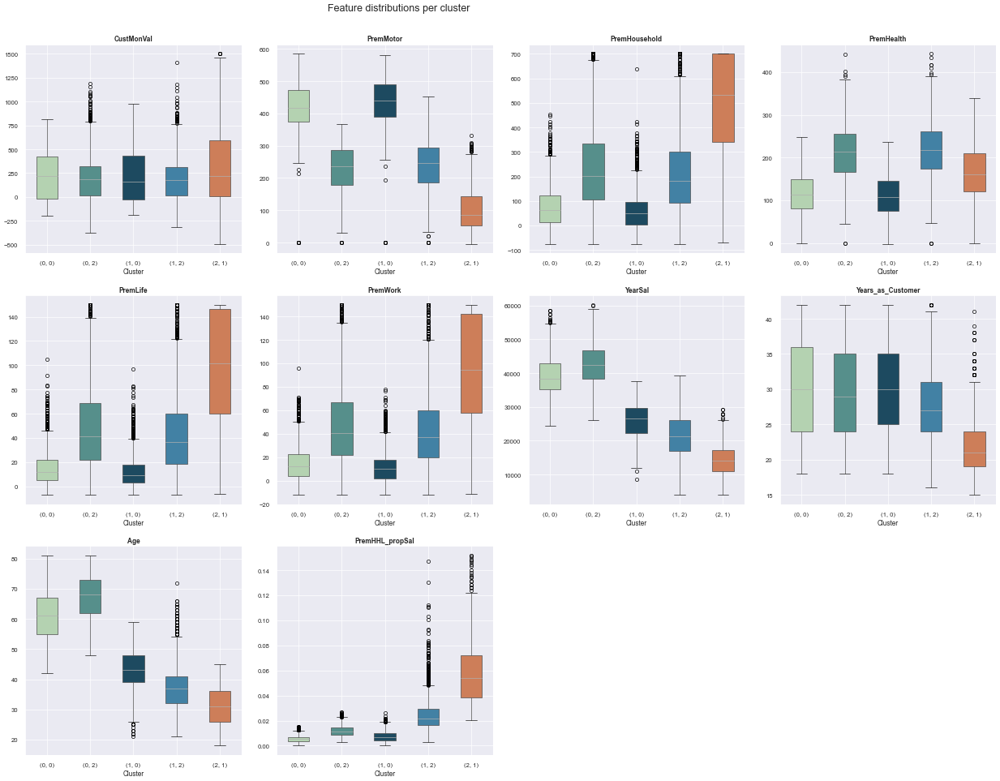

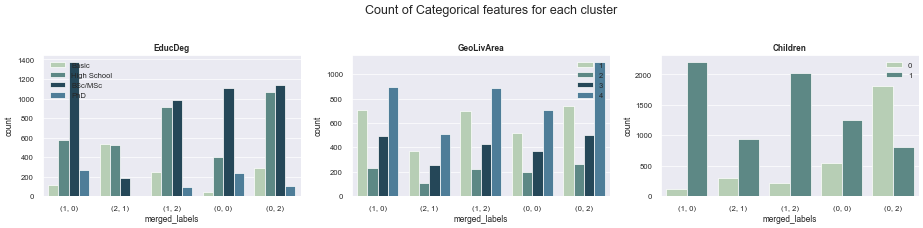

In [156]:
chartCluster(metric_features=metric_features, categorical_features=categorical_features, data=df, cluster_title='merged_labels')

In [157]:
df_Customer_Value["merged_labels"] = df["merged_labels"]


In [158]:
# New contigency table
df_Customer_Value.groupby(['merged_labels', 'Customer Score'])\
    .size()\
    .to_frame()\
    .reset_index()\
    .pivot('Customer Score', 'merged_labels', 0)

merged_labels,"(0, 0)","(0, 2)","(1, 0)","(1, 2)","(2, 1)"
Customer Score,,,,,
-1,72,125,236,230,206
0,1711,2469,1844,1715,557
1,7,8,246,294,487


In [159]:
pd.crosstab( df_Customer_Value['Customer Score'],df_Customer_Value['merged_labels'],values=1,aggfunc=np.sum,normalize='columns').applymap(lambda x: "{0:.000f}%".format(100.0*x))


merged_labels,"(0, 0)","(0, 2)","(1, 0)","(1, 2)","(2, 1)"
Customer Score,,,,,
-1,4%,5%,10%,10%,16%
0,96%,95%,79%,77%,45%
1,0%,0%,11%,13%,39%


<a class="anchor" id="topic08" /><br>
# 8. Cluster Visualization
[Back to Index](#index)

<a class="anchor" id="topic08.01" /><br>
## 8.1 Cluster profiles

In [160]:
def cluster_profiles(df, label_columns, figsize, compar_titles=None):
    """
    Pass df with labels columns of one or multiple clustering labels. 
    Then specify this label columns to perform the cluster profile according to them.
    """
    if compar_titles == None:
        compar_titles = [""]*len(label_columns)
        
    sns.set()
    fig, axes = plt.subplots(nrows=len(label_columns), ncols=2, figsize=figsize, squeeze=False)
    for ax, label, titl in zip(axes, label_columns, compar_titles):
        # Filtering df
        drop_cols = [i for i in label_columns if i!=label]
        dfax = df.drop(drop_cols, axis=1)
        
        # Getting the cluster centroids and counts
        centroids = dfax.groupby(by=label, as_index=False).mean()
        counts = dfax.groupby(by=label, as_index=False).count().iloc[:,[0,1]]
        counts.columns = [label, "counts"]
        
        # Setting Data
        cluster_colors = ['#b4d2b1', '#568f8b', '#1d4a60', '#4281A4', '#cd7e59', '#ddb247',
          '#DE9E36']
        pd.plotting.parallel_coordinates(centroids, label, color=cluster_colors, ax=ax[0])
        sns.barplot(x=label, y="counts", data=counts, ax=ax[1],palette=cluster_colors)

        #Setting Layout
        handles, _ = ax[0].get_legend_handles_labels()
        cluster_labels = ["Cluster {}".format(i) for i in range(len(handles))]
        ax[0].annotate(text=titl, xy=(0.95,1.1), xycoords='axes fraction', fontsize=13, fontweight = 'heavy') 
        ax[0].legend(handles, cluster_labels) # Adaptable to number of clusters
        ax[0].axhline(color="black", linestyle="--")
        ax[0].set_title("Cluster Means - {} Clusters".format(len(handles)), fontsize=13)
        ax[0].set_xticklabels(ax[0].get_xticklabels(), rotation=-20)
        ax[1].set_xticklabels(cluster_labels)
        ax[1].set_xlabel("")
        ax[1].set_ylabel("Absolute Frequency")
        ax[1].set_title("Cluster Sizes - {} Clusters".format(len(handles)), fontsize=13)
    
    plt.subplots_adjust(hspace=0.4, top=0.90)
    plt.suptitle("Cluster Simple Profilling", fontsize=23)
    plt.show()

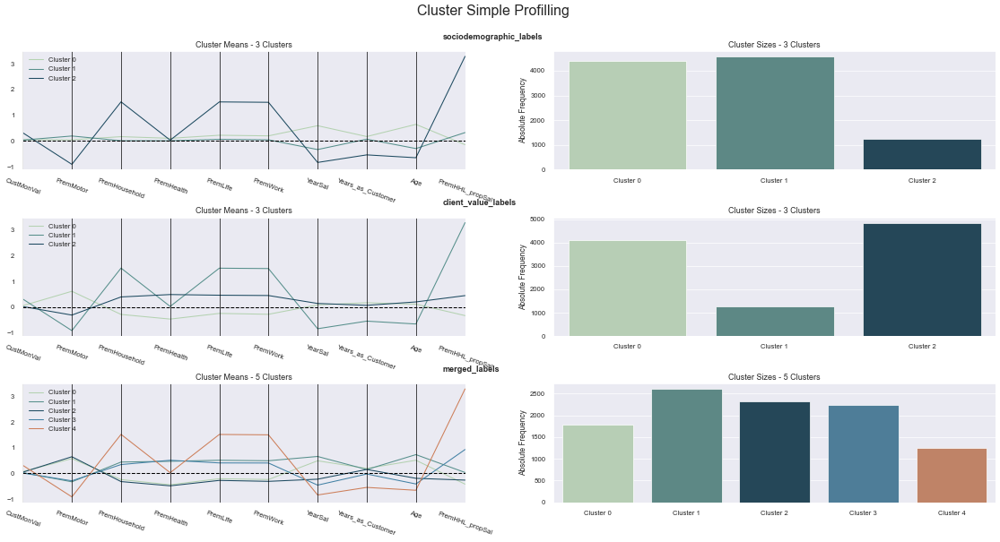

In [161]:

lstfeat = ['sociodemographic_labels', 'client_value_labels', 'merged_labels']

# Profilling each cluster (product, behavior, merged)
cluster_profiles(
    df = df_[metric_features + lstfeat], 
    label_columns = lstfeat, 
    figsize = (28, 13), 
    compar_titles = lstfeat
)



<a class="anchor" id="topic08.02" /><br>
## 8.2 PCA

In [162]:
df_pca = dfscaled.copy()

In [163]:
pca = PCA()
pca_feat = pca.fit_transform(df_pca[metric_features])


In [164]:
# Output PCA table
pd.DataFrame(
    {"Eigenvalue": pca.explained_variance_,
     "Difference": np.insert(np.diff(pca.explained_variance_), 0, 0),
     "Proportion": pca.explained_variance_ratio_,
     "Cumulative": np.cumsum(pca.explained_variance_ratio_)},
    index=range(1, pca.n_components_ + 1)
)

,Eigenvalue,Difference,Proportion,Cumulative
1,3.404282,0.000000,0.523307,0.523307
2,0.833890,-2.570392,0.128186,0.651493
3,0.536438,-0.297452,0.082461,0.733955
4,0.513941,-0.022497,0.079003,0.812958
5,0.420256,-0.093685,0.064602,0.877560
6,0.301871,-0.118385,0.046404,0.923963
7,0.279096,-0.022775,0.042903,0.966866
8,0.165164,-0.113933,0.025389,0.992255
9,0.028538,-0.136626,0.004387,0.996642
10,0.021846,-0.006692,0.003358,1.000000


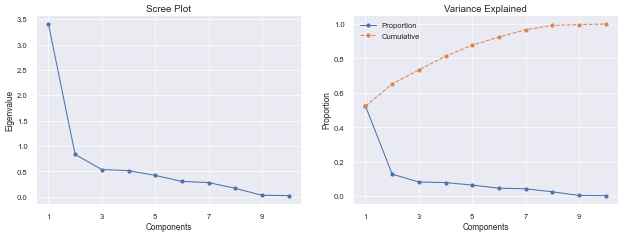

In [165]:
# figure and axes
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))

# draw plots
ax1.plot(pca.explained_variance_, marker=".", markersize=12)
ax2.plot(pca.explained_variance_ratio_, marker=".", markersize=12, label="Proportion")
ax2.plot(np.cumsum(pca.explained_variance_ratio_), marker=".", markersize=12, linestyle="--", label="Cumulative")

# customizations
ax2.legend()
ax1.set_title("Scree Plot", fontsize=14)
ax2.set_title("Variance Explained", fontsize=14)
ax1.set_ylabel("Eigenvalue")
ax2.set_ylabel("Proportion")
ax1.set_xlabel("Components")
ax2.set_xlabel("Components")
ax1.set_xticks(range(0, pca.n_components_, 2))
ax1.set_xticklabels(range(1, pca.n_components_ + 1, 2))
ax2.set_xticks(range(0, pca.n_components_, 2))
ax2.set_xticklabels(range(1, pca.n_components_ + 1, 2))

plt.show()

#There are some rules we can follow to choose the number of principal components to retain
#1) Threshold 80%
#2) Var >= 1


In [166]:
# Perform PCA again with the number of principal components you want to retain
pca = PCA(n_components=3)
pca_feat = pca.fit_transform(df_pca[metric_features])
pca_feat_names = [f"PC{i}" for i in range(pca.n_components_)]
pca_df = pd.DataFrame(pca_feat, index=df_pca.index, columns=pca_feat_names)  # remember index=df_pca.index


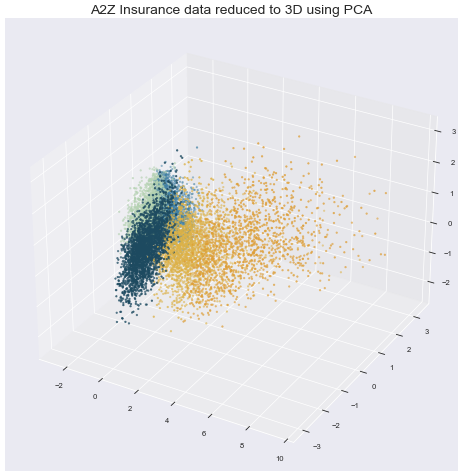

In [167]:
#A 3D Projection Of Data In The Reduced Dimension
x =pca_df["PC0"]
y =pca_df["PC1"]
z =pca_df["PC2"]
#To plot
fig = plt.figure(figsize=(20,12))
ax = fig.add_subplot(111, projection="3d")
ax.scatter(x,y,z, c=df_['merged_labels_color'], marker="." ,cmap=cmap)

ax.set_title("A2Z Insurance data reduced to 3D using PCA",size=20)
plt.show()

In [168]:
def _color_red_or_green(val):
    if val < -0.45:
        color = 'background-color: red'
    elif val > 0.45:
        color = 'background-color: green'
    else:
        color = ''
    return color


# Interpreting each Principal Component
df_pca = pd.concat([df_pca, pca_df], axis=1)
loadings = df_pca[metric_features + pca_feat_names].corr().loc[metric_features, pca_feat_names]
loadings.style.applymap(_color_red_or_green)


,PC0,PC1,PC2
CustMonVal,0.170316,0.105277,0.685866
PremMotor,-0.810087,0.484517,0.168925
PremHousehold,0.774971,-0.164458,0.455186
PremHealth,0.273938,-0.420210,-0.509268
PremLife,0.670536,-0.339229,-0.056946
PremWork,0.632604,-0.411712,-0.054484
YearSal,-0.579232,-0.665895,0.282768
Years_as_Customer,-0.412962,-0.142804,0.118050
Age,-0.490455,-0.660723,0.285642
PremHHL_propSal,0.954219,0.208407,0.005730


<a class="anchor" id="topic08.03" /><br>
## 8.3 Visualization using t-SNE

In [169]:
two_dim = TSNE(learning_rate = 'auto', init='random', random_state=g_random_state).fit_transform(dfscaled[metric_features])


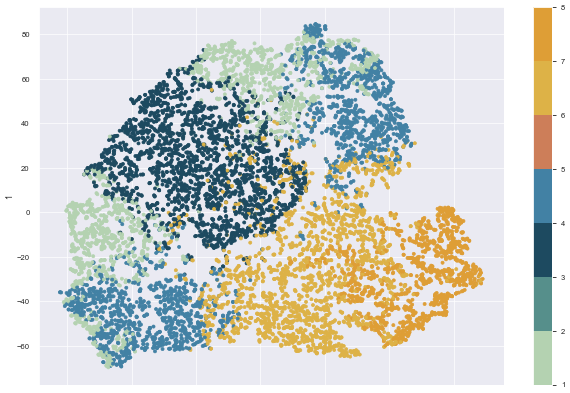

In [170]:
pd.DataFrame(two_dim).plot.scatter(x=0, y=1, c=df_['merged_labels_color'], colormap=cmap, figsize=(15,10))
plt.show()

<a class="anchor" id="topic08.04" /><br>
## 8.4 UMAP

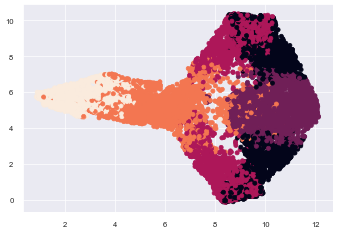

In [171]:
draw_umap(dataframe=dfscaled[metric_features], pcolors=df_["merged_labels_color"], n_neighbors=100, min_dist=0.1, n_components=2)

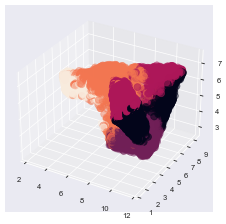

In [172]:
draw_umap(dataframe=dfscaled[metric_features], pcolors=df_["merged_labels_color"], n_neighbors=100, min_dist=0.1, n_components=3)


#### All the representations (PCA, T-SNE and UMAP) show that our clusters have some overlapping but also have large regions with visible isolation.

<a class="anchor" id="topic09" /><br>
# 9. Quantitative model performance
[Back to Index](#index)
#### Evaluating our model's accuracy in predicting clusters for "new" data
Or: Moving from unsupervised to supervised learning in order to assess our model's quality

In [173]:
def get_ss_variables(df):
    """Get the SS for each variable
    """
    ss_vars = df.var() * (df.count() - 1)
    return ss_vars

def r2_variables(df, labels):
    """Get the R² for each variable
    """
    sst_vars = get_ss_variables(df)
    ssw_vars = np.sum(df.groupby(labels).apply(get_ss_variables))
    ss_resp = 1 - ssw_vars/sst_vars
    #print(ss_resp)
    ss_resp.drop([labels], inplace=True)
    return ss_resp


In [174]:
# We are essentially decomposing the R² into the R² for each variable
r2_variables(df[metric_features + ['merged_labels']], 'merged_labels')


Age                  0.783867
CustMonVal           0.021915
PremHHL_propSal      0.688541
PremHealth           0.414411
PremHousehold        0.456408
PremLife             0.428752
PremMotor            0.742868
PremWork             0.418444
YearSal              0.770641
Years_as_Customer    0.150347
dtype: float64

In [175]:
# Preparing the data
X = df[metric_features]
y = df.merged_labels

# Splitting the data
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=g_random_state
)

# Fitting the decision tree
dt = DecisionTreeClassifier(random_state=g_random_state, max_depth=3)
dt.fit(X_train, y_train)
print("It is estimated that in average, we are able to predict {0:.2f}% of the customers correctly".format(dt.score(X_test, y_test)*100))


It is estimated that in average, we are able to predict 87.37% of the customers correctly


In [176]:
# Visualizing the decision tree
dot_data = export_graphviz(dt, out_file=None, 
                           feature_names=X.columns.to_list(),
                           filled=True,
                           rounded=True,
                           special_characters=True)  
my_graph = graphviz.Source(dot_data)

#my_graph.render("temp_img",format="png", view=True)


In [177]:
# Assessing feature importance
pd.Series(dt.feature_importances_, index=X_train.columns)

CustMonVal           0.000000
PremMotor            0.410971
PremHousehold        0.000000
PremHealth           0.000000
PremLife             0.000000
PremWork             0.000000
YearSal              0.228214
Years_as_Customer    0.000000
Age                  0.360815
PremHHL_propSal      0.000000
dtype: float64